In [26]:
%%time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import time

def load_data(batch_size = 1000):
    # load data CIFAR10

    # transform to tensor and normalize to [-1,1]
    transform = transforms.Compose(
        [
    #         transforms.Resize(256),
            transforms.ToTensor(),
         transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

    trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                            download=True, transform=transform)
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                              shuffle=True, num_workers=0)

    testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                           download=True, transform=transform)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                             shuffle=False, num_workers=0)
    return trainset, trainloader, testset, testloader

# define model
class LogisticRegression(torch.nn.Module):
    def __init__(self):
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(3072, 10)
        
    def forward(self, x):
        y_pred = F.sigmoid(self.linear(x))
        return y_pred
    
    
def train_vali_split_loader(trainset, batch_size = 1024, num_workers=0):
    trainset_, valset_ = torch.utils.data.random_split(trainset, 
                              [int(0.8*len(trainset)), 
                               int(0.2*len(trainset))])
    
    trainloader_ = torch.utils.data.DataLoader(trainset_, 
                                              batch_size=batch_size,
                                              shuffle=True, 
                                              num_workers=0)
    
    valiloader_ = torch.utils.data.DataLoader(valset_, 
                                              batch_size=batch_size,
                                              shuffle=True, 
                                              num_workers=0)
    return (trainloader_, valiloader_)


def test_model(model, testloader):
        predicted_correct_num = 0
        total_test = 0
        # run on vali set to get accuracy
        for i, data in enumerate(testloader, 0):
        # get the inputs; data is a list of [inputs, labels]
#             inputs, labels = data
            inputs, labels = data[0].view(batch_size, -1), data[1] # -> linear input

            predicted_test = torch.max(model(inputs), 1)

            total_test += labels.size(0)
            predicted_correct_num += sum(predicted_test.indices == labels)
            print("Test {0} th batch, {1} correct, tested {2}, batch size {3}".format(i, 
                                                                          predicted_correct_num,
                                                                          batch_size*(i+1), batch_size))

        accu_test = predicted_correct_num.item() / total_test
        return accu_test

Wall time: 0 ns


In [27]:
%%time
def train_and_vali(trainset, model, optimizer, title, testloader,
                   epochs=70, batch_print_num=20, 
                   batch_size=32):
    # train the last layer of the model, using batch size 1024, 70 epochs 
    # batch_size = 32
    accu_train_list = []
    accu_vali_list = []
    for epoch in range(epochs):    # loop over the dataset multiple times
        # splite train into train and vali
        trainloader_, valiloader_ = train_vali_split_loader(trainset, batch_size = batch_size)

        running_loss = 0.0
        predicted_correct_num_train = 0
        total_train = 0
        for i, data in enumerate(trainloader_, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data[0].view(batch_size, -1), data[1] # -> linear input
#             inputs, labels = data
#             print(inputs.size())

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # print statistics
            batch_print_num = batch_print_num
            running_loss += loss.item()
            if i % batch_print_num == batch_print_num-1:      # print every 5 mini-batches
                print('[%d, %5d] loss: %0.3f'%(epoch+1,batch_size*(i+1), 
                      running_loss / batch_print_num))
                running_loss = 0.0

            # training accu
            predicted_train = torch.max(outputs, 1)
            total_train += labels.size(0)
            predicted_correct_num_train += sum(predicted_train.indices == labels)

        accu_train = predicted_correct_num_train.item() / total_train
        accu_train_list.append(accu_train)

        predicted_correct_num = 0
        total_vali = 0
        # run on vali set to get accuracy
        for i, data in enumerate(valiloader_, 0):
        # get the inputs; data is a list of [inputs, labels]
#             inputs, labels = data
            inputs, labels = data[0].view(batch_size, -1), data[1]
        
#             print(inputs.size())

            predicted_vali = torch.max(model(inputs), 1)

            total_vali += labels.size(0)
            predicted_correct_num += sum(predicted_vali.indices == labels)
#             print("Vali {0} th batch, {1} correct, validated {2}, batch size {3}".format(i, 
#                                                                           predicted_correct_num,
#                                                                           batch_size*(i+1), batch_size))

        accu_vali = predicted_correct_num.item() / total_vali
        accu_vali_list.append(accu_vali)
        
        print("Training Accu: ", accu_train)
        print("Validation Accu: ", accu_vali)

    print('Finish Traning')
    
    # test current model with highest vali accu
    test_accu = test_model(model, testloader)
    
    # plot accu with epoch
    plt.plot(range(epochs), accu_train_list, label="Train")
    plt.plot(range(epochs), accu_vali_list, label="Vali")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(title)
    plt.legend()
    plt.show()
    
    return model, accu_vali, test_accu

def avg_d_dimensional_list(lst):
    avg_list = []
    for l in lst:
        avg_list.append(np.mean(l))
    return avg_list

Wall time: 0 ns


Files already downloaded and verified
Files already downloaded and verified
lr:  0.001 , momen:  0.2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.305
[1, 40000] loss: 2.298
Training Accu:  0.112925
Validation Accu:  0.1426
[2, 20000] loss: 2.290
[2, 40000] loss: 2.283
Training Accu:  0.1553
Validation Accu:  0.1716
[3, 20000] loss: 2.277
[3, 40000] loss: 2.272
Training Accu:  0.18145
Validation Accu:  0.1941
[4, 20000] loss: 2.265
[4, 40000] loss: 2.261
Training Accu:  0.197525
Validation Accu:  0.2099
[5, 20000] loss: 2.255
[5, 40000] loss: 2.251
Training Accu:  0.21215
Validation Accu:  0.2107
[6, 20000] loss: 2.247
[6, 40000] loss: 2.243
Training Accu:  0.22015
Validation Accu:  0.222
[7, 20000] loss: 2.240
[7, 40000] loss: 2.235
Training Accu:  0.22785
Validation Accu:  0.2256
[8, 20000] loss: 2.232
[8, 40000] loss: 2.227
Training Accu:  0.233225
Validation Accu:  0.2336
[9, 20000] loss: 2.226
[9, 40000] loss: 2.226
Training Accu:  0.23545
Validation Accu:  0.2492
[10, 20000] loss: 2.221
[10, 40000] loss: 2.218
Training Accu:  0.241
Validation Accu:  0.2493
[11, 20000] loss: 2.216
[11, 40000] loss: 2.212
T

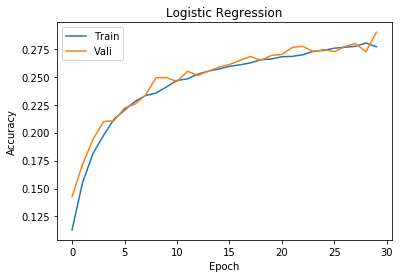

Vali Accu:  0.2899 Best vali:  0.2899 Test Accu:  0.284 Best params:  {'lr': 0.001, 'momentum': 0.2}
lr:  0.001 , momen:  0.4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.165
[1, 40000] loss: 2.163
Training Accu:  0.2804
Validation Accu:  0.2831
[2, 20000] loss: 2.161
[2, 40000] loss: 2.161
Training Accu:  0.282575
Validation Accu:  0.282
[3, 20000] loss: 2.160
[3, 40000] loss: 2.160
Training Accu:  0.282525
Validation Accu:  0.2897
[4, 20000] loss: 2.159
[4, 40000] loss: 2.157
Training Accu:  0.286225
Validation Accu:  0.2817
[5, 20000] loss: 2.158
[5, 40000] loss: 2.154
Training Accu:  0.2869
Validation Accu:  0.2836
[6, 20000] loss: 2.154
[6, 40000] loss: 2.155
Training Accu:  0.286825
Validation Accu:  0.2886
[7, 20000] loss: 2.152
[7, 40000] loss: 2.153
Training Accu:  0.287375
Validation Accu:  0.2912
[8, 20000] loss: 2.152
[8, 40000] loss: 2.150
Training Accu:  0.28775
Validation Accu:  0.2952
[9, 20000] loss: 2.150
[9, 40000] loss: 2.150
Training Accu:  0.290725
Validation Accu:  0.2906
[10, 20000] loss: 2.150
[10, 40000] loss: 2.148
Training Accu:  0.2893
Validation Accu:  0.2999
[11, 20000] loss: 2.148
[11, 40000] loss: 2.14

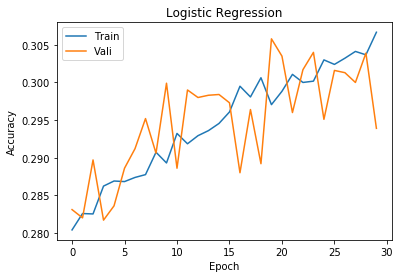

Vali Accu:  0.2939 Best vali:  0.2939 Test Accu:  0.3083 Best params:  {'lr': 0.001, 'momentum': 0.4}
lr:  0.001 , momen:  0.6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.128
[1, 40000] loss: 2.127
Training Accu:  0.30385
Validation Accu:  0.3105
[2, 20000] loss: 2.126
[2, 40000] loss: 2.125
Training Accu:  0.306725
Validation Accu:  0.3038
[3, 20000] loss: 2.125
[3, 40000] loss: 2.124
Training Accu:  0.307725
Validation Accu:  0.303
[4, 20000] loss: 2.125
[4, 40000] loss: 2.123
Training Accu:  0.30815
Validation Accu:  0.3053
[5, 20000] loss: 2.123
[5, 40000] loss: 2.122
Training Accu:  0.3089
Validation Accu:  0.3064
[6, 20000] loss: 2.124
[6, 40000] loss: 2.120
Training Accu:  0.308375
Validation Accu:  0.3127
[7, 20000] loss: 2.120
[7, 40000] loss: 2.122
Training Accu:  0.310275
Validation Accu:  0.308
[8, 20000] loss: 2.118
[8, 40000] loss: 2.119
Training Accu:  0.309975
Validation Accu:  0.3138
[9, 20000] loss: 2.119
[9, 40000] loss: 2.119
Training Accu:  0.31015
Validation Accu:  0.3164
[10, 20000] loss: 2.117
[10, 40000] loss: 2.120
Training Accu:  0.311875
Validation Accu:  0.3118
[11, 20000] loss: 2.117
[11, 40000] loss: 2.1

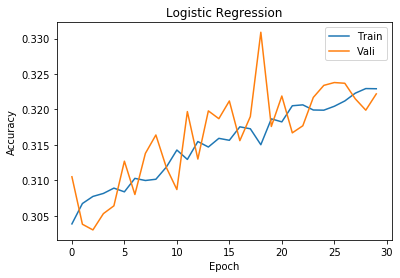

Vali Accu:  0.3222 Best vali:  0.3222 Test Accu:  0.3268 Best params:  {'lr': 0.001, 'momentum': 0.6}
lr:  0.001 , momen:  0.8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.104
[1, 40000] loss: 2.104
Training Accu:  0.323775
Validation Accu:  0.3224
[2, 20000] loss: 2.104
[2, 40000] loss: 2.100
Training Accu:  0.322375
Validation Accu:  0.3318
[3, 20000] loss: 2.101
[3, 40000] loss: 2.101
Training Accu:  0.3248
Validation Accu:  0.3251
[4, 20000] loss: 2.102
[4, 40000] loss: 2.099
Training Accu:  0.326525
Validation Accu:  0.3236
[5, 20000] loss: 2.097
[5, 40000] loss: 2.101
Training Accu:  0.325025
Validation Accu:  0.3326
[6, 20000] loss: 2.100
[6, 40000] loss: 2.096
Training Accu:  0.32725
Validation Accu:  0.3281
[7, 20000] loss: 2.095
[7, 40000] loss: 2.097
Training Accu:  0.3291
Validation Accu:  0.3248
[8, 20000] loss: 2.096
[8, 40000] loss: 2.095
Training Accu:  0.32955
Validation Accu:  0.3267
[9, 20000] loss: 2.097
[9, 40000] loss: 2.093
Training Accu:  0.33
Validation Accu:  0.3299
[10, 20000] loss: 2.093
[10, 40000] loss: 2.095
Training Accu:  0.3317
Validation Accu:  0.3262
[11, 20000] loss: 2.093
[11, 40000] loss: 2.095
Tr

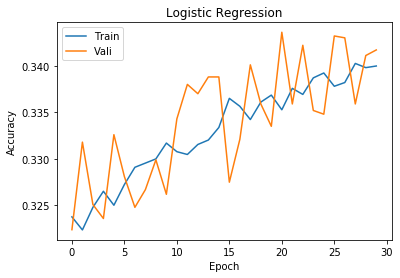

Vali Accu:  0.3417 Best vali:  0.3417 Test Accu:  0.3384 Best params:  {'lr': 0.001, 'momentum': 0.8}
lr:  0.001 , momen:  0.9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.080
[1, 40000] loss: 2.082
Training Accu:  0.340275
Validation Accu:  0.3429
[2, 20000] loss: 2.080
[2, 40000] loss: 2.078
Training Accu:  0.34055
Validation Accu:  0.344
[3, 20000] loss: 2.079
[3, 40000] loss: 2.077
Training Accu:  0.343425
Validation Accu:  0.3351
[4, 20000] loss: 2.081
[4, 40000] loss: 2.077
Training Accu:  0.34125
Validation Accu:  0.3459
[5, 20000] loss: 2.075
[5, 40000] loss: 2.079
Training Accu:  0.34295
Validation Accu:  0.3422
[6, 20000] loss: 2.076
[6, 40000] loss: 2.078
Training Accu:  0.343625
Validation Accu:  0.3412
[7, 20000] loss: 2.076
[7, 40000] loss: 2.074
Training Accu:  0.343925
Validation Accu:  0.3438
[8, 20000] loss: 2.070
[8, 40000] loss: 2.078
Training Accu:  0.344325
Validation Accu:  0.3467
[9, 20000] loss: 2.074
[9, 40000] loss: 2.072
Training Accu:  0.344625
Validation Accu:  0.347
[10, 20000] loss: 2.073
[10, 40000] loss: 2.073
Training Accu:  0.34545
Validation Accu:  0.3469
[11, 20000] loss: 2.070
[11, 40000] loss: 2.

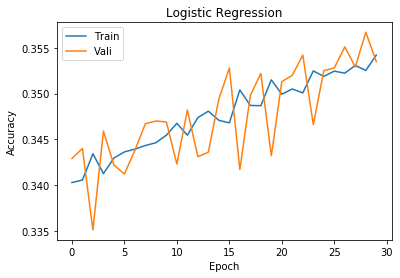

Vali Accu:  0.3535 Best vali:  0.3535 Test Accu:  0.3488 Best params:  {'lr': 0.001, 'momentum': 0.9}
lr:  0.002 , momen:  0.2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.062
[1, 40000] loss: 2.060
Training Accu:  0.354275
Validation Accu:  0.3526
[2, 20000] loss: 2.061
[2, 40000] loss: 2.061
Training Accu:  0.3535
Validation Accu:  0.3558
[3, 20000] loss: 2.063
[3, 40000] loss: 2.059
Training Accu:  0.3531
Validation Accu:  0.3581
[4, 20000] loss: 2.061
[4, 40000] loss: 2.062
Training Accu:  0.354475
Validation Accu:  0.3522
[5, 20000] loss: 2.060
[5, 40000] loss: 2.059
Training Accu:  0.354175
Validation Accu:  0.3547
[6, 20000] loss: 2.059
[6, 40000] loss: 2.063
Training Accu:  0.35365
Validation Accu:  0.3558
[7, 20000] loss: 2.062
[7, 40000] loss: 2.058
Training Accu:  0.35435
Validation Accu:  0.3529
[8, 20000] loss: 2.061
[8, 40000] loss: 2.059
Training Accu:  0.355925
Validation Accu:  0.3478
[9, 20000] loss: 2.060
[9, 40000] loss: 2.060
Training Accu:  0.355225
Validation Accu:  0.3511
[10, 20000] loss: 2.061
[10, 40000] loss: 2.059
Training Accu:  0.355075
Validation Accu:  0.3531
[11, 20000] loss: 2.058
[11, 40000] loss: 2.

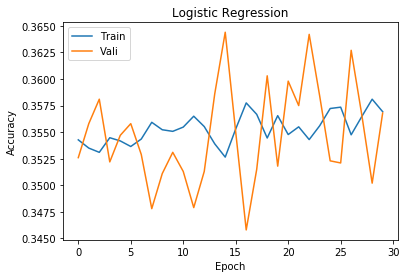

Vali Accu:  0.3568 Best vali:  0.3568 Test Accu:  0.3504 Best params:  {'lr': 0.002, 'momentum': 0.2}
lr:  0.002 , momen:  0.4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.059
[1, 40000] loss: 2.055
Training Accu:  0.35695
Validation Accu:  0.3566
[2, 20000] loss: 2.056
[2, 40000] loss: 2.059
Training Accu:  0.35675
Validation Accu:  0.3575
[3, 20000] loss: 2.061
[3, 40000] loss: 2.054
Training Accu:  0.3563
Validation Accu:  0.3598
[4, 20000] loss: 2.056
[4, 40000] loss: 2.059
Training Accu:  0.35475
Validation Accu:  0.3667
[5, 20000] loss: 2.058
[5, 40000] loss: 2.059
Training Accu:  0.355375
Validation Accu:  0.3635
[6, 20000] loss: 2.057
[6, 40000] loss: 2.059
Training Accu:  0.3534
Validation Accu:  0.3721
[7, 20000] loss: 2.058
[7, 40000] loss: 2.055
Training Accu:  0.3595
Validation Accu:  0.349
[8, 20000] loss: 2.060
[8, 40000] loss: 2.053
Training Accu:  0.359025
Validation Accu:  0.3509
[9, 20000] loss: 2.056
[9, 40000] loss: 2.058
Training Accu:  0.356875
Validation Accu:  0.3589
[10, 20000] loss: 2.057
[10, 40000] loss: 2.055
Training Accu:  0.3571
Validation Accu:  0.3583
[11, 20000] loss: 2.057
[11, 40000] loss: 2.056
Tr

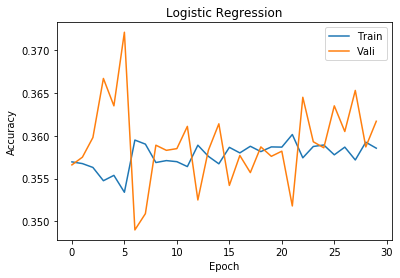

Vali Accu:  0.3617 Best vali:  0.3617 Test Accu:  0.3534 Best params:  {'lr': 0.002, 'momentum': 0.4}
lr:  0.002 , momen:  0.6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.054
[1, 40000] loss: 2.054
Training Accu:  0.35975
Validation Accu:  0.3571
[2, 20000] loss: 2.053
[2, 40000] loss: 2.056
Training Accu:  0.35705
Validation Accu:  0.3681
[3, 20000] loss: 2.054
[3, 40000] loss: 2.053
Training Accu:  0.3592
Validation Accu:  0.3603
[4, 20000] loss: 2.054
[4, 40000] loss: 2.057
Training Accu:  0.357
Validation Accu:  0.371
[5, 20000] loss: 2.053
[5, 40000] loss: 2.054
Training Accu:  0.358325
Validation Accu:  0.3667
[6, 20000] loss: 2.054
[6, 40000] loss: 2.051
Training Accu:  0.36065
Validation Accu:  0.3587
[7, 20000] loss: 2.052
[7, 40000] loss: 2.054
Training Accu:  0.36095
Validation Accu:  0.3583
[8, 20000] loss: 2.048
[8, 40000] loss: 2.055
Training Accu:  0.3604
Validation Accu:  0.3609
[9, 20000] loss: 2.055
[9, 40000] loss: 2.049
Training Accu:  0.359325
Validation Accu:  0.3654
[10, 20000] loss: 2.051
[10, 40000] loss: 2.053
Training Accu:  0.361325
Validation Accu:  0.3579
[11, 20000] loss: 2.053
[11, 40000] loss: 2.052
Tr

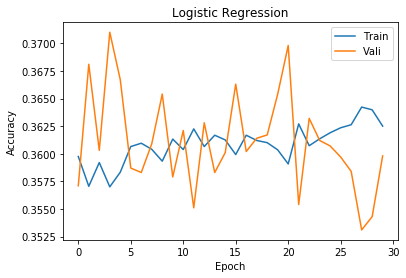

Vali Accu:  0.3598 Best vali:  0.3617 Test Accu:  0.3567 Best params:  {'lr': 0.002, 'momentum': 0.4}
lr:  0.002 , momen:  0.8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.046
[1, 40000] loss: 2.053
Training Accu:  0.361175
Validation Accu:  0.3655
[2, 20000] loss: 2.051
[2, 40000] loss: 2.047
Training Accu:  0.36095
Validation Accu:  0.3674
[3, 20000] loss: 2.049
[3, 40000] loss: 2.048
Training Accu:  0.362775
Validation Accu:  0.361
[4, 20000] loss: 2.048
[4, 40000] loss: 2.047
Training Accu:  0.362975
Validation Accu:  0.3609
[5, 20000] loss: 2.047
[5, 40000] loss: 2.051
Training Accu:  0.362725
Validation Accu:  0.3622
[6, 20000] loss: 2.049
[6, 40000] loss: 2.047
Training Accu:  0.360775
Validation Accu:  0.3696
[7, 20000] loss: 2.046
[7, 40000] loss: 2.049
Training Accu:  0.363
Validation Accu:  0.362
[8, 20000] loss: 2.046
[8, 40000] loss: 2.048
Training Accu:  0.362875
Validation Accu:  0.3645
[9, 20000] loss: 2.045
[9, 40000] loss: 2.050
Training Accu:  0.3627
Validation Accu:  0.3663
[10, 20000] loss: 2.044
[10, 40000] loss: 2.050
Training Accu:  0.364025
Validation Accu:  0.3618
[11, 20000] loss: 2.043
[11, 40000] loss: 2.04

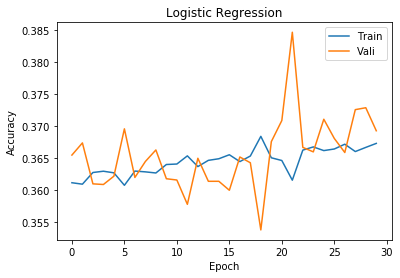

Vali Accu:  0.3693 Best vali:  0.3693 Test Accu:  0.3612 Best params:  {'lr': 0.002, 'momentum': 0.8}
lr:  0.002 , momen:  0.9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.040
[1, 40000] loss: 2.044
Training Accu:  0.3696
Validation Accu:  0.3622
[2, 20000] loss: 2.041
[2, 40000] loss: 2.040
Training Accu:  0.367075
Validation Accu:  0.3738
[3, 20000] loss: 2.038
[3, 40000] loss: 2.043
Training Accu:  0.368975
Validation Accu:  0.3683
[4, 20000] loss: 2.040
[4, 40000] loss: 2.040
Training Accu:  0.369475
Validation Accu:  0.3682
[5, 20000] loss: 2.042
[5, 40000] loss: 2.038
Training Accu:  0.3689
Validation Accu:  0.3708
[6, 20000] loss: 2.039
[6, 40000] loss: 2.039
Training Accu:  0.368775
Validation Accu:  0.3732
[7, 20000] loss: 2.040
[7, 40000] loss: 2.040
Training Accu:  0.368875
Validation Accu:  0.3741
[8, 20000] loss: 2.038
[8, 40000] loss: 2.039
Training Accu:  0.371625
Validation Accu:  0.3665
[9, 20000] loss: 2.040
[9, 40000] loss: 2.036
Training Accu:  0.3689
Validation Accu:  0.3785
[10, 20000] loss: 2.036
[10, 40000] loss: 2.040
Training Accu:  0.369775
Validation Accu:  0.3763
[11, 20000] loss: 2.037
[11, 40000] loss: 2.

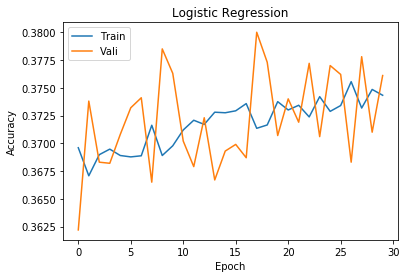

Vali Accu:  0.3761 Best vali:  0.3761 Test Accu:  0.3666 Best params:  {'lr': 0.002, 'momentum': 0.9}
lr:  0.003 , momen:  0.2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.033
[1, 40000] loss: 2.029
Training Accu:  0.374525
Validation Accu:  0.3741
[2, 20000] loss: 2.030
[2, 40000] loss: 2.031
Training Accu:  0.37605
Validation Accu:  0.3689
[3, 20000] loss: 2.029
[3, 40000] loss: 2.032
Training Accu:  0.375075
Validation Accu:  0.3723
[4, 20000] loss: 2.031
[4, 40000] loss: 2.030
Training Accu:  0.37435
Validation Accu:  0.375
[5, 20000] loss: 2.030
[5, 40000] loss: 2.030
Training Accu:  0.37395
Validation Accu:  0.3765
[6, 20000] loss: 2.029
[6, 40000] loss: 2.032
Training Accu:  0.37365
Validation Accu:  0.3784
[7, 20000] loss: 2.032
[7, 40000] loss: 2.031
Training Accu:  0.37445
Validation Accu:  0.3763
[8, 20000] loss: 2.029
[8, 40000] loss: 2.032
Training Accu:  0.37525
Validation Accu:  0.3721
[9, 20000] loss: 2.032
[9, 40000] loss: 2.027
Training Accu:  0.3744
Validation Accu:  0.376
[10, 20000] loss: 2.031
[10, 40000] loss: 2.030
Training Accu:  0.37555
Validation Accu:  0.3716
[11, 20000] loss: 2.032
[11, 40000] loss: 2.029
T

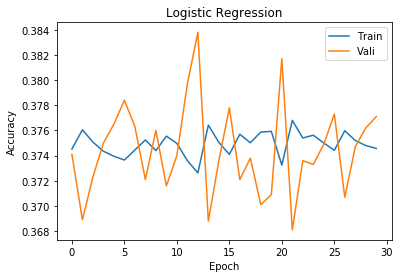

Vali Accu:  0.3771 Best vali:  0.3771 Test Accu:  0.3682 Best params:  {'lr': 0.003, 'momentum': 0.2}
lr:  0.003 , momen:  0.4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.028
[1, 40000] loss: 2.029
Training Accu:  0.37615
Validation Accu:  0.3713
[2, 20000] loss: 2.028
[2, 40000] loss: 2.031
Training Accu:  0.375375
Validation Accu:  0.3737
[3, 20000] loss: 2.034
[3, 40000] loss: 2.027
Training Accu:  0.373475
Validation Accu:  0.3814
[4, 20000] loss: 2.029
[4, 40000] loss: 2.030
Training Accu:  0.374425
Validation Accu:  0.379
[5, 20000] loss: 2.028
[5, 40000] loss: 2.031
Training Accu:  0.37555
Validation Accu:  0.3754
[6, 20000] loss: 2.029
[6, 40000] loss: 2.030
Training Accu:  0.375925
Validation Accu:  0.3735
[7, 20000] loss: 2.031
[7, 40000] loss: 2.027
Training Accu:  0.3747
Validation Accu:  0.3789
[8, 20000] loss: 2.029
[8, 40000] loss: 2.030
Training Accu:  0.375025
Validation Accu:  0.3771
[9, 20000] loss: 2.029
[9, 40000] loss: 2.028
Training Accu:  0.37595
Validation Accu:  0.3738
[10, 20000] loss: 2.030
[10, 40000] loss: 2.029
Training Accu:  0.37495
Validation Accu:  0.3781
[11, 20000] loss: 2.029
[11, 40000] loss: 2.0

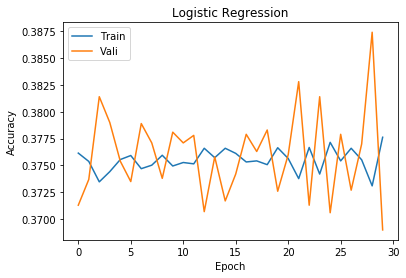

Vali Accu:  0.369 Best vali:  0.3771 Test Accu:  0.3682 Best params:  {'lr': 0.003, 'momentum': 0.2}
lr:  0.003 , momen:  0.6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.023
[1, 40000] loss: 2.032
Training Accu:  0.37535
Validation Accu:  0.3781
[2, 20000] loss: 2.026
[2, 40000] loss: 2.027
Training Accu:  0.37635
Validation Accu:  0.374
[3, 20000] loss: 2.028
[3, 40000] loss: 2.026
Training Accu:  0.376025
Validation Accu:  0.3765
[4, 20000] loss: 2.025
[4, 40000] loss: 2.028
Training Accu:  0.378525
Validation Accu:  0.368
[5, 20000] loss: 2.027
[5, 40000] loss: 2.025
Training Accu:  0.3764
Validation Accu:  0.3754
[6, 20000] loss: 2.028
[6, 40000] loss: 2.028
Training Accu:  0.375725
Validation Accu:  0.3795
[7, 20000] loss: 2.028
[7, 40000] loss: 2.026
Training Accu:  0.3755
Validation Accu:  0.3802
[8, 20000] loss: 2.026
[8, 40000] loss: 2.024
Training Accu:  0.37735
Validation Accu:  0.3733
[9, 20000] loss: 2.027
[9, 40000] loss: 2.029
Training Accu:  0.37505
Validation Accu:  0.3833
[10, 20000] loss: 2.026
[10, 40000] loss: 2.027
Training Accu:  0.37705
Validation Accu:  0.376
[11, 20000] loss: 2.022
[11, 40000] loss: 2.028
Tr

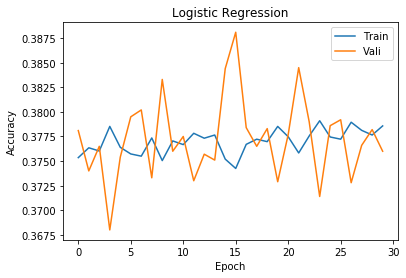

Vali Accu:  0.376 Best vali:  0.3771 Test Accu:  0.3695 Best params:  {'lr': 0.003, 'momentum': 0.2}
lr:  0.003 , momen:  0.8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.020
[1, 40000] loss: 2.027
Training Accu:  0.378025
Validation Accu:  0.3778
[2, 20000] loss: 2.026
[2, 40000] loss: 2.023
Training Accu:  0.3791
Validation Accu:  0.3724
[3, 20000] loss: 2.025
[3, 40000] loss: 2.026
Training Accu:  0.3761
Validation Accu:  0.3856
[4, 20000] loss: 2.023
[4, 40000] loss: 2.023
Training Accu:  0.3789
Validation Accu:  0.3752
[5, 20000] loss: 2.023
[5, 40000] loss: 2.024
Training Accu:  0.377725
Validation Accu:  0.3792
[6, 20000] loss: 2.022
[6, 40000] loss: 2.025
Training Accu:  0.381175
Validation Accu:  0.3666
[7, 20000] loss: 2.024
[7, 40000] loss: 2.023
Training Accu:  0.379375
Validation Accu:  0.3739
[8, 20000] loss: 2.024
[8, 40000] loss: 2.022
Training Accu:  0.37605
Validation Accu:  0.3875
[9, 20000] loss: 2.026
[9, 40000] loss: 2.023
Training Accu:  0.378325
Validation Accu:  0.3814
[10, 20000] loss: 2.022
[10, 40000] loss: 2.023
Training Accu:  0.379625
Validation Accu:  0.3764
[11, 20000] loss: 2.022
[11, 40000] loss: 2.0

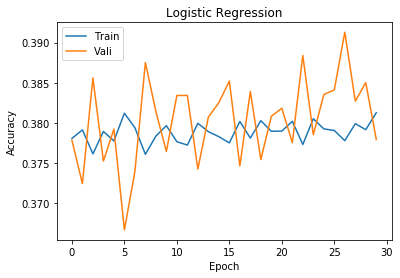

Vali Accu:  0.3779 Best vali:  0.3779 Test Accu:  0.3725 Best params:  {'lr': 0.003, 'momentum': 0.8}
lr:  0.003 , momen:  0.9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.019
[1, 40000] loss: 2.022
Training Accu:  0.381425
Validation Accu:  0.376
[2, 20000] loss: 2.020
[2, 40000] loss: 2.020
Training Accu:  0.38
Validation Accu:  0.3832
[3, 20000] loss: 2.021
[3, 40000] loss: 2.017
Training Accu:  0.382675
Validation Accu:  0.3735
[4, 20000] loss: 2.021
[4, 40000] loss: 2.018
Training Accu:  0.37975
Validation Accu:  0.3847
[5, 20000] loss: 2.018
[5, 40000] loss: 2.019
Training Accu:  0.3824
Validation Accu:  0.3769
[6, 20000] loss: 2.017
[6, 40000] loss: 2.022
Training Accu:  0.380075
Validation Accu:  0.3861
[7, 20000] loss: 2.017
[7, 40000] loss: 2.019
Training Accu:  0.3812
Validation Accu:  0.3816
[8, 20000] loss: 2.019
[8, 40000] loss: 2.019
Training Accu:  0.380275
Validation Accu:  0.3862
[9, 20000] loss: 2.020
[9, 40000] loss: 2.015
Training Accu:  0.383275
Validation Accu:  0.3749
[10, 20000] loss: 2.018
[10, 40000] loss: 2.016
Training Accu:  0.38195
Validation Accu:  0.3799
[11, 20000] loss: 2.020
[11, 40000] loss: 2.014
T

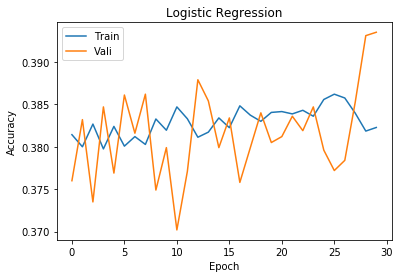

Vali Accu:  0.3935 Best vali:  0.3935 Test Accu:  0.375 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.004 , momen:  0.2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.016
[1, 40000] loss: 2.007
Training Accu:  0.386825
Validation Accu:  0.3759
[2, 20000] loss: 2.012
[2, 40000] loss: 2.014
Training Accu:  0.384475
Validation Accu:  0.3851
[3, 20000] loss: 2.011
[3, 40000] loss: 2.016
Training Accu:  0.382975
Validation Accu:  0.3904
[4, 20000] loss: 2.010
[4, 40000] loss: 2.017
Training Accu:  0.3846
Validation Accu:  0.3849
[5, 20000] loss: 2.014
[5, 40000] loss: 2.012
Training Accu:  0.384775
Validation Accu:  0.3849
[6, 20000] loss: 2.014
[6, 40000] loss: 2.013
Training Accu:  0.383625
Validation Accu:  0.3895
[7, 20000] loss: 2.013
[7, 40000] loss: 2.013
Training Accu:  0.382625
Validation Accu:  0.3941
[8, 20000] loss: 2.015
[8, 40000] loss: 2.010
Training Accu:  0.3847
Validation Accu:  0.3857
[9, 20000] loss: 2.010
[9, 40000] loss: 2.013
Training Accu:  0.387775
Validation Accu:  0.3738
[10, 20000] loss: 2.015
[10, 40000] loss: 2.012
Training Accu:  0.383775
Validation Accu:  0.3897
[11, 20000] loss: 2.012
[11, 40000] loss: 

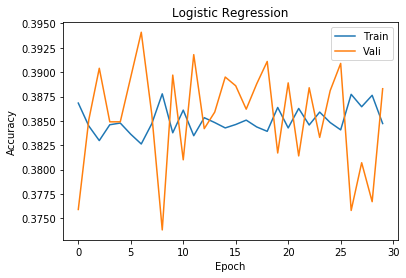

Vali Accu:  0.3883 Best vali:  0.3935 Test Accu:  0.3758 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.004 , momen:  0.4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.012
[1, 40000] loss: 2.012
Training Accu:  0.385375
Validation Accu:  0.3863
[2, 20000] loss: 2.012
[2, 40000] loss: 2.011
Training Accu:  0.38625
Validation Accu:  0.3826
[3, 20000] loss: 2.010
[3, 40000] loss: 2.013
Training Accu:  0.384975
Validation Accu:  0.3888
[4, 20000] loss: 2.014
[4, 40000] loss: 2.011
Training Accu:  0.384325
Validation Accu:  0.3918
[5, 20000] loss: 2.015
[5, 40000] loss: 2.008
Training Accu:  0.386925
Validation Accu:  0.3816
[6, 20000] loss: 2.011
[6, 40000] loss: 2.009
Training Accu:  0.387625
Validation Accu:  0.3782
[7, 20000] loss: 2.013
[7, 40000] loss: 2.010
Training Accu:  0.3871
Validation Accu:  0.3809
[8, 20000] loss: 2.012
[8, 40000] loss: 2.010
Training Accu:  0.386425
Validation Accu:  0.3835
[9, 20000] loss: 2.014
[9, 40000] loss: 2.008
Training Accu:  0.385225
Validation Accu:  0.3876
[10, 20000] loss: 2.013
[10, 40000] loss: 2.013
Training Accu:  0.384875
Validation Accu:  0.3884
[11, 20000] loss: 2.010
[11, 40000] loss:

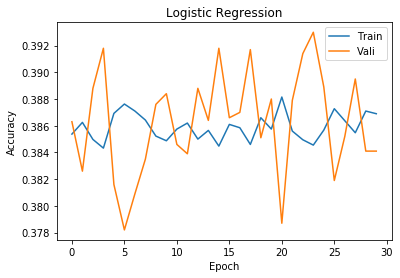

Vali Accu:  0.3841 Best vali:  0.3935 Test Accu:  0.3761 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.004 , momen:  0.6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.008
[1, 40000] loss: 2.012
Training Accu:  0.387525
Validation Accu:  0.3814
[2, 20000] loss: 2.009
[2, 40000] loss: 2.010
Training Accu:  0.38655
Validation Accu:  0.3844
[3, 20000] loss: 2.009
[3, 40000] loss: 2.010
Training Accu:  0.385875
Validation Accu:  0.3888
[4, 20000] loss: 2.011
[4, 40000] loss: 2.012
Training Accu:  0.385225
Validation Accu:  0.3908
[5, 20000] loss: 2.012
[5, 40000] loss: 2.010
Training Accu:  0.386275
Validation Accu:  0.3864
[6, 20000] loss: 2.013
[6, 40000] loss: 2.010
Training Accu:  0.38515
Validation Accu:  0.3913
[7, 20000] loss: 2.005
[7, 40000] loss: 2.014
Training Accu:  0.386375
Validation Accu:  0.3869
[8, 20000] loss: 2.011
[8, 40000] loss: 2.012
Training Accu:  0.385775
Validation Accu:  0.3897
[9, 20000] loss: 2.013
[9, 40000] loss: 2.008
Training Accu:  0.385075
Validation Accu:  0.3924
[10, 20000] loss: 2.009
[10, 40000] loss: 2.008
Training Accu:  0.387
Validation Accu:  0.3828
[11, 20000] loss: 2.009
[11, 40000] loss: 2

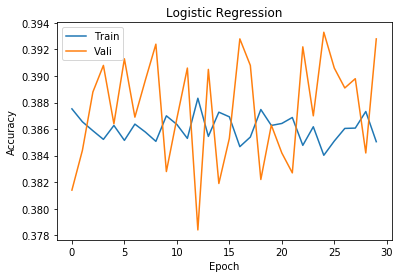

Vali Accu:  0.3928 Best vali:  0.3935 Test Accu:  0.3766 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.004 , momen:  0.8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.010
[1, 40000] loss: 2.007
Training Accu:  0.385225
Validation Accu:  0.393
[2, 20000] loss: 2.011
[2, 40000] loss: 2.007
Training Accu:  0.384925
Validation Accu:  0.3944
[3, 20000] loss: 2.007
[3, 40000] loss: 2.010
Training Accu:  0.3858
Validation Accu:  0.3905
[4, 20000] loss: 2.009
[4, 40000] loss: 2.010
Training Accu:  0.385875
Validation Accu:  0.3915
[5, 20000] loss: 2.010
[5, 40000] loss: 2.007
Training Accu:  0.386025
Validation Accu:  0.3892
[6, 20000] loss: 2.010
[6, 40000] loss: 2.007
Training Accu:  0.38635
Validation Accu:  0.3871
[7, 20000] loss: 2.008
[7, 40000] loss: 2.011
Training Accu:  0.3849
Validation Accu:  0.395
[8, 20000] loss: 2.008
[8, 40000] loss: 2.008
Training Accu:  0.386125
Validation Accu:  0.3899
[9, 20000] loss: 2.008
[9, 40000] loss: 2.007
Training Accu:  0.385825
Validation Accu:  0.3908
[10, 20000] loss: 2.009
[10, 40000] loss: 2.007
Training Accu:  0.38635
Validation Accu:  0.3892
[11, 20000] loss: 2.006
[11, 40000] loss: 2.00

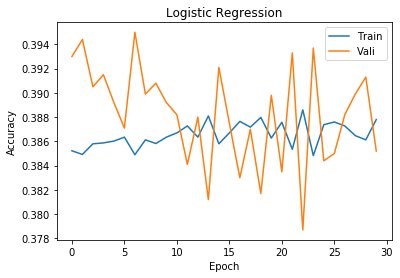

Vali Accu:  0.3852 Best vali:  0.3935 Test Accu:  0.3775 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.004 , momen:  0.9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.003
[1, 40000] loss: 2.005
Training Accu:  0.388575
Validation Accu:  0.3806
[2, 20000] loss: 2.005
[2, 40000] loss: 2.004
Training Accu:  0.38705
Validation Accu:  0.3867
[3, 20000] loss: 2.010
[3, 40000] loss: 2.002
Training Accu:  0.388325
Validation Accu:  0.3834
[4, 20000] loss: 2.007
[4, 40000] loss: 2.003
Training Accu:  0.3893
Validation Accu:  0.381
[5, 20000] loss: 2.005
[5, 40000] loss: 2.005
Training Accu:  0.3876
Validation Accu:  0.3877
[6, 20000] loss: 2.004
[6, 40000] loss: 2.008
Training Accu:  0.38615
Validation Accu:  0.3956
[7, 20000] loss: 2.004
[7, 40000] loss: 2.002
Training Accu:  0.389175
Validation Accu:  0.3824
[8, 20000] loss: 2.003
[8, 40000] loss: 2.004
Training Accu:  0.38705
Validation Accu:  0.3912
[9, 20000] loss: 2.004
[9, 40000] loss: 2.004
Training Accu:  0.3872
Validation Accu:  0.3916
[10, 20000] loss: 2.004
[10, 40000] loss: 2.003
Training Accu:  0.386175
Validation Accu:  0.3946
[11, 20000] loss: 2.001
[11, 40000] loss: 2.004


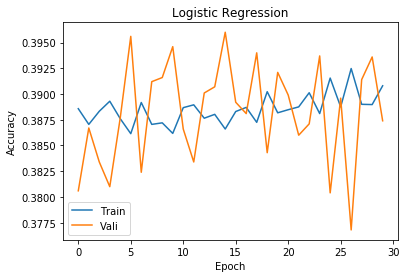

Vali Accu:  0.3874 Best vali:  0.3935 Test Accu:  0.3792 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.005 , momen:  0.2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.998
[1, 40000] loss: 2.002
Training Accu:  0.390275
Validation Accu:  0.3895
[2, 20000] loss: 1.997
[2, 40000] loss: 2.000
Training Accu:  0.392425
Validation Accu:  0.3804
[3, 20000] loss: 1.998
[3, 40000] loss: 2.004
Training Accu:  0.390825
Validation Accu:  0.3859
[4, 20000] loss: 2.001
[4, 40000] loss: 1.998
Training Accu:  0.389025
Validation Accu:  0.3939
[5, 20000] loss: 2.000
[5, 40000] loss: 1.998
Training Accu:  0.39065
Validation Accu:  0.3877
[6, 20000] loss: 1.998
[6, 40000] loss: 2.001
Training Accu:  0.38995
Validation Accu:  0.3901
[7, 20000] loss: 1.998
[7, 40000] loss: 2.001
Training Accu:  0.388275
Validation Accu:  0.3978
[8, 20000] loss: 2.000
[8, 40000] loss: 1.999
Training Accu:  0.389425
Validation Accu:  0.3922
[9, 20000] loss: 2.000
[9, 40000] loss: 1.998
Training Accu:  0.38875
Validation Accu:  0.3955
[10, 20000] loss: 2.001
[10, 40000] loss: 1.998
Training Accu:  0.38865
Validation Accu:  0.3962
[11, 20000] loss: 1.997
[11, 40000] loss: 

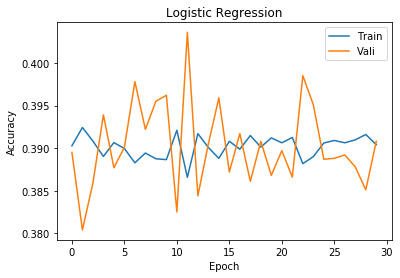

Vali Accu:  0.3908 Best vali:  0.3935 Test Accu:  0.3803 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.005 , momen:  0.4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.000
[1, 40000] loss: 1.999
Training Accu:  0.38885
Validation Accu:  0.3979
[2, 20000] loss: 1.998
[2, 40000] loss: 1.999
Training Accu:  0.3908
Validation Accu:  0.3907
[3, 20000] loss: 1.999
[3, 40000] loss: 2.000
Training Accu:  0.38855
Validation Accu:  0.3992
[4, 20000] loss: 1.998
[4, 40000] loss: 2.001
Training Accu:  0.390625
Validation Accu:  0.3905
[5, 20000] loss: 1.996
[5, 40000] loss: 1.999
Training Accu:  0.39035
Validation Accu:  0.3917
[6, 20000] loss: 1.998
[6, 40000] loss: 1.999
Training Accu:  0.390675
Validation Accu:  0.3899
[7, 20000] loss: 2.001
[7, 40000] loss: 1.998
Training Accu:  0.390575
Validation Accu:  0.3909
[8, 20000] loss: 1.998
[8, 40000] loss: 2.002
Training Accu:  0.3898
Validation Accu:  0.3939
[9, 20000] loss: 1.996
[9, 40000] loss: 1.999
Training Accu:  0.391075
Validation Accu:  0.3901
[10, 20000] loss: 1.999
[10, 40000] loss: 1.999
Training Accu:  0.391575
Validation Accu:  0.387
[11, 20000] loss: 1.996
[11, 40000] loss: 2.00

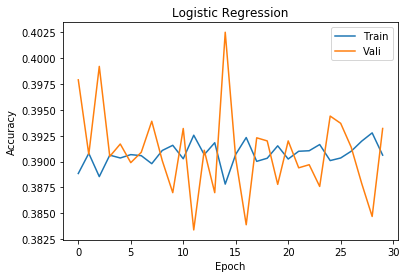

Vali Accu:  0.3932 Best vali:  0.3935 Test Accu:  0.3806 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.005 , momen:  0.6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.999
[1, 40000] loss: 2.001
Training Accu:  0.389825
Validation Accu:  0.3975
[2, 20000] loss: 1.996
[2, 40000] loss: 1.999
Training Accu:  0.391375
Validation Accu:  0.3907
[3, 20000] loss: 2.001
[3, 40000] loss: 1.997
Training Accu:  0.390325
Validation Accu:  0.393
[4, 20000] loss: 1.998
[4, 40000] loss: 1.997
Training Accu:  0.3922
Validation Accu:  0.3865
[5, 20000] loss: 1.996
[5, 40000] loss: 1.999
Training Accu:  0.391
Validation Accu:  0.3927
[6, 20000] loss: 1.995
[6, 40000] loss: 1.999
Training Accu:  0.392
Validation Accu:  0.388
[7, 20000] loss: 1.997
[7, 40000] loss: 1.998
Training Accu:  0.390425
Validation Accu:  0.3951
[8, 20000] loss: 2.000
[8, 40000] loss: 1.997
Training Accu:  0.392325
Validation Accu:  0.387
[9, 20000] loss: 1.996
[9, 40000] loss: 2.001
Training Accu:  0.38985
Validation Accu:  0.3956
[10, 20000] loss: 1.998
[10, 40000] loss: 1.998
Training Accu:  0.3913
Validation Accu:  0.3902
[11, 20000] loss: 2.000
[11, 40000] loss: 1.997
Trai

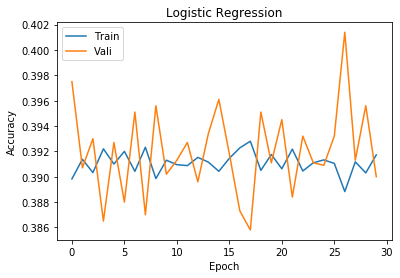

Vali Accu:  0.39 Best vali:  0.3935 Test Accu:  0.3815 Best params:  {'lr': 0.003, 'momentum': 0.9}
lr:  0.005 , momen:  0.8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.993
[1, 40000] loss: 1.997
Training Accu:  0.392775
Validation Accu:  0.3867
[2, 20000] loss: 1.998
[2, 40000] loss: 1.994
Training Accu:  0.391825
Validation Accu:  0.3918
[3, 20000] loss: 1.997
[3, 40000] loss: 1.996
Training Accu:  0.391875
Validation Accu:  0.3916
[4, 20000] loss: 1.998
[4, 40000] loss: 1.994
Training Accu:  0.3926
Validation Accu:  0.3864
[5, 20000] loss: 1.995
[5, 40000] loss: 1.997
Training Accu:  0.3916
Validation Accu:  0.3898
[6, 20000] loss: 1.998
[6, 40000] loss: 1.994
Training Accu:  0.393875
Validation Accu:  0.3832
[7, 20000] loss: 1.993
[7, 40000] loss: 1.998
Training Accu:  0.391875
Validation Accu:  0.3911
[8, 20000] loss: 1.997
[8, 40000] loss: 1.995
Training Accu:  0.3934
Validation Accu:  0.3858
[9, 20000] loss: 1.998
[9, 40000] loss: 1.994
Training Accu:  0.393475
Validation Accu:  0.3868
[10, 20000] loss: 1.997
[10, 40000] loss: 1.996
Training Accu:  0.39045
Validation Accu:  0.3987
[11, 20000] loss: 1.993
[11, 40000] loss: 1.9

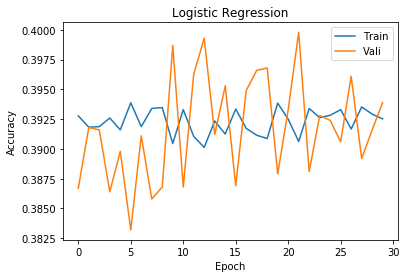

Vali Accu:  0.3939 Best vali:  0.3939 Test Accu:  0.3829 Best params:  {'lr': 0.005, 'momentum': 0.8}
lr:  0.005 , momen:  0.9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.996
[1, 40000] loss: 1.993
Training Accu:  0.392925
Validation Accu:  0.3927
[2, 20000] loss: 1.997
[2, 40000] loss: 1.990
Training Accu:  0.39365
Validation Accu:  0.3895
[3, 20000] loss: 1.994
[3, 40000] loss: 1.992
Training Accu:  0.39315
Validation Accu:  0.393
[4, 20000] loss: 1.993
[4, 40000] loss: 1.994
Training Accu:  0.392275
Validation Accu:  0.3998
[5, 20000] loss: 1.993
[5, 40000] loss: 1.995
Training Accu:  0.391275
Validation Accu:  0.3997
[6, 20000] loss: 1.996
[6, 40000] loss: 1.993
Training Accu:  0.39125
Validation Accu:  0.4007
[7, 20000] loss: 1.994
[7, 40000] loss: 1.991
Training Accu:  0.3952
Validation Accu:  0.3879
[8, 20000] loss: 1.996
[8, 40000] loss: 1.990
Training Accu:  0.39265
Validation Accu:  0.3943
[9, 20000] loss: 1.990
[9, 40000] loss: 1.994
Training Accu:  0.394375
Validation Accu:  0.3885
[10, 20000] loss: 1.994
[10, 40000] loss: 1.991
Training Accu:  0.394275
Validation Accu:  0.3904
[11, 20000] loss: 1.993
[11, 40000] loss: 1.9

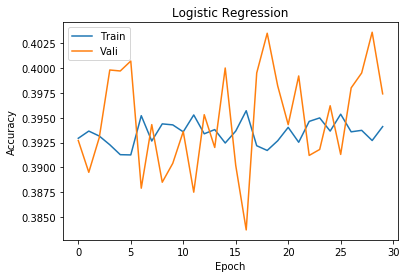

Vali Accu:  0.3974 Best vali:  0.3974 Test Accu:  0.3854 Best params:  {'lr': 0.005, 'momentum': 0.9}
Best vali accu: 0.3974, Best test accu: 0.3854, Best param set: {'lr': 0.005, 'momentum': 0.9}


NameError: name 'mean' is not defined

In [4]:
%%time
# A5a
# train logistic regression
batch_size = 1000

# load data
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)

# define model
model = LogisticRegression()

# define a loss function
criterion = torch.nn.CrossEntropyLoss()

lr_list = [0.001, 0.002, 0.003, 0.004, 0.005]
lr_accu_list = [[] for i in range(len(lr_list))]
momentum_list = [0.2, 0.4, 0.6, 0.8, 0.9]
momentum_accu_list = [[] for i in range(len(momentum_list))]

vali_acct_best = 0
test_accu_best = 0

for lr in lr_list:
    for momentum in momentum_list:
        print("lr: ", lr, ", momen: ", momentum)
        # define optimizer
        optimizer = torch.optim.SGD(model.parameters(), 
                                    lr=lr, 
                                    momentum=momentum)

        model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                                     model=model, 
                                                     optimizer=optimizer, 
                                                     testloader=testloader,
                                                     epochs=30, 
                                                     batch_print_num=20, 
                                                     batch_size=batch_size, 
                                                     title="Logistic Regression") 
        lr_accu_list[lr_list.index(lr)].append(accu_vali)
        momentum_accu_list[momentum_list.index(momentum)].append(accu_vali)
        
        if accu_vali > vali_acct_best:
            vali_acct_best = accu_vali
            test_accu_best = test_accu
            best_params = {"lr":lr,"momentum": momentum}
        print("Vali Accu: ", accu_vali, "Best vali: ", vali_acct_best, 
              "Test Accu: ", test_accu, "Best params: ", best_params)

print("Best vali accu: {0}, Best test accu: {1}, Best param set: {2}".format(accu_vali, 
                                                                             test_accu, 
                                                                             best_params))
lr_accu_avg_list = avg_d_dimensional_list(lr_accu_list)
momentum_avg_list = avg_d_dimensional_list(momentum_accu_list)


In [7]:
lr_accu_avg_list = avg_d_dimensional_list(lr_accu_list)
momentum_avg_list = avg_d_dimensional_list(momentum_accu_list)

Text(0.5, 1.0, 'Lr vs Vali Accu')

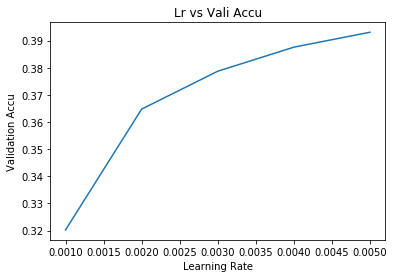

In [8]:
# plot lr and momentum change with accu plots
plt.plot(lr_list, lr_accu_avg_list)
plt.xlabel("Learning Rate")
plt.ylabel("Validation Accu")
plt.title("Lr vs Vali Accu")
plt.show()

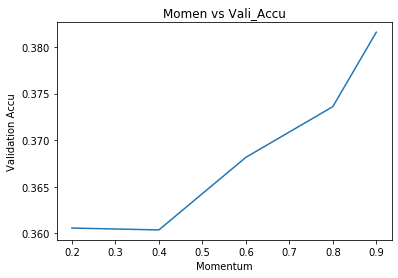

In [9]:
# plot momentum change with accu plotsu
plt.plot(momentum_list, momentum_avg_list)
plt.xlabel("Momentum")
plt.ylabel("Validation Accu")
plt.title("Momen vs Vali_Accu")
plt.show()

Files already downloaded and verified
Files already downloaded and verified


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.256
[1, 40000] loss: 2.179
Training Accu:  0.211575
Validation Accu:  0.2638
[2, 20000] loss: 2.147
[2, 40000] loss: 2.130
Training Accu:  0.28015
Validation Accu:  0.2941
[3, 20000] loss: 2.121
[3, 40000] loss: 2.109
Training Accu:  0.303725
Validation Accu:  0.3124
[4, 20000] loss: 2.104
[4, 40000] loss: 2.099
Training Accu:  0.316925
Validation Accu:  0.3151
[5, 20000] loss: 2.093
[5, 40000] loss: 2.089
Training Accu:  0.32375
Validation Accu:  0.3322
[6, 20000] loss: 2.088
[6, 40000] loss: 2.082
Training Accu:  0.3326
Validation Accu:  0.3253
[7, 20000] loss: 2.079
[7, 40000] loss: 2.082
Training Accu:  0.33445
Validation Accu:  0.3387
[8, 20000] loss: 2.076
[8, 40000] loss: 2.077
Training Accu:  0.339275
Validation Accu:  0.3368
[9, 20000] loss: 2.073
[9, 40000] loss: 2.073
Training Accu:  0.3401
Validation Accu:  0.3478
[10, 20000] loss: 2.069
[10, 40000] loss: 2.069
Training Accu:  0.3457
Validation Accu:  0.3402
[11, 20000] loss: 2.064
[11, 40000] loss: 2.067

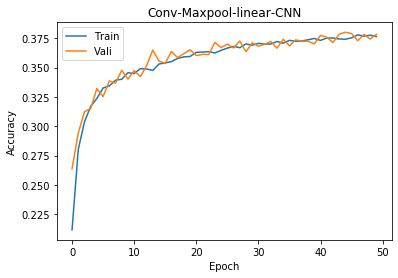

Test Accu: 0.3697


In [29]:
# train- vali with best params with 50 eopchs
accu_test_list = []
accu_test = 0
batch_size = 1000
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)


# model = CNN(150, 5, 4)
model = LogisticRegression()
# define optimizer
optimizer = torch.optim.SGD(model.parameters(), 
                            lr=0.005, 
                            momentum=0.9)

model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                             model=model, 
                                             optimizer=optimizer, 
                                             testloader=testloader,
                                             epochs=50, 
                                             batch_print_num=20, 
                                             batch_size=batch_size, 
                                             title="Conv-Maxpool-linear-CNN")
accu_test_list.append(test_accu)
if test_accu > accu_test:
    accu_test = test_accu
print("Test Accu:", accu_test)


In [24]:
%%time
# A5b
# define model one linear hidden layer
class OneHiddenLayer(torch.nn.Module):
    def __init__(self, M):
        super(OneHiddenLayer, self).__init__()
        self.linear = torch.nn.Linear(3072, M)
        self.linear2 = torch.nn.Linear(M, 10)
        
    def forward(self, x):
        x = F.sigmoid(self.linear(x))
        x = self.linear2(x)
        return x

Wall time: 0 ns


Files already downloaded and verified
Files already downloaded and verified
lr:  0.001 , momen:  0.3 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.334
[1, 40000] loss: 2.326
Training Accu:  0.08035
Validation Accu:  0.0886
[2, 20000] loss: 2.321
[2, 40000] loss: 2.318
Training Accu:  0.098175
Validation Accu:  0.1024
[3, 20000] loss: 2.312
[3, 40000] loss: 2.307
Training Accu:  0.11765
Validation Accu:  0.1261
[4, 20000] loss: 2.304
[4, 40000] loss: 2.297
Training Accu:  0.1303
Validation Accu:  0.1375
[5, 20000] loss: 2.296
[5, 40000] loss: 2.287
Training Accu:  0.141625
Validation Accu:  0.1394
[6, 20000] loss: 2.286
[6, 40000] loss: 2.284
Training Accu:  0.147575
Validation Accu:  0.1474
[7, 20000] loss: 2.280
[7, 40000] loss: 2.276
Training Accu:  0.15385
Validation Accu:  0.1591
[8, 20000] loss: 2.272
[8, 40000] loss: 2.271
Training Accu:  0.161325
Validation Accu:  0.1638
[9, 20000] loss: 2.266
[9, 40000] loss: 2.264
Training Accu:  0.1704
Validation Accu:  0.1648
[10, 20000] loss: 2.260
[10, 40000] loss: 2.260
Training Accu:  0.17515
Validation Accu:  0.1812
[11, 20000] loss: 2.255
[11, 40000] loss: 2.25

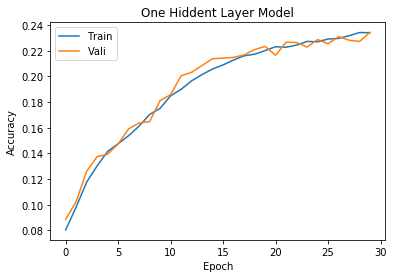

Vali Accu:  0.2345 Best vali:  0.2345 Test Accu:  0.2379 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 50}
lr:  0.001 , momen:  0.3 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.361
[1, 40000] loss: 2.344
Training Accu:  0.102375
Validation Accu:  0.1028
[2, 20000] loss: 2.331
[2, 40000] loss: 2.323
Training Accu:  0.1065
Validation Accu:  0.106
[3, 20000] loss: 2.313
[3, 40000] loss: 2.306
Training Accu:  0.11395
Validation Accu:  0.1199
[4, 20000] loss: 2.301
[4, 40000] loss: 2.291
Training Accu:  0.13305
Validation Accu:  0.1463
[5, 20000] loss: 2.287
[5, 40000] loss: 2.283
Training Accu:  0.15745
Validation Accu:  0.1607
[6, 20000] loss: 2.279
[6, 40000] loss: 2.275
Training Accu:  0.171725
Validation Accu:  0.1736
[7, 20000] loss: 2.271
[7, 40000] loss: 2.268
Training Accu:  0.179775
Validation Accu:  0.1821
[8, 20000] loss: 2.265
[8, 40000] loss: 2.261
Training Accu:  0.18805
Validation Accu:  0.1907
[9, 20000] loss: 2.260
[9, 40000] loss: 2.256
Training Accu:  0.1974
Validation Accu:  0.2014
[10, 20000] loss: 2.254
[10, 40000] loss: 2.251
Training Accu:  0.207975
Validation Accu:  0.2093
[11, 20000] loss: 2.249
[11, 40000] loss: 2.247

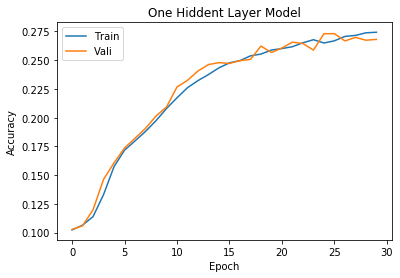

Vali Accu:  0.2681 Best vali:  0.2681 Test Accu:  0.2755 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 150}
lr:  0.001 , momen:  0.3 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.328
[1, 40000] loss: 2.314
Training Accu:  0.111375
Validation Accu:  0.1084
[2, 20000] loss: 2.303
[2, 40000] loss: 2.298
Training Accu:  0.11265
Validation Accu:  0.1096
[3, 20000] loss: 2.291
[3, 40000] loss: 2.286
Training Accu:  0.11795
Validation Accu:  0.1324
[4, 20000] loss: 2.281
[4, 40000] loss: 2.278
Training Accu:  0.150925
Validation Accu:  0.1732
[5, 20000] loss: 2.274
[5, 40000] loss: 2.272
Training Accu:  0.1871
Validation Accu:  0.2013
[6, 20000] loss: 2.268
[6, 40000] loss: 2.266
Training Accu:  0.2039
Validation Accu:  0.2089
[7, 20000] loss: 2.262
[7, 40000] loss: 2.259
Training Accu:  0.2143
Validation Accu:  0.2144
[8, 20000] loss: 2.256
[8, 40000] loss: 2.254
Training Accu:  0.2199
Validation Accu:  0.2213
[9, 20000] loss: 2.251
[9, 40000] loss: 2.249
Training Accu:  0.2252
Validation Accu:  0.2306
[10, 20000] loss: 2.246
[10, 40000] loss: 2.244
Training Accu:  0.229875
Validation Accu:  0.2369
[11, 20000] loss: 2.241
[11, 40000] loss: 2.238
Tr

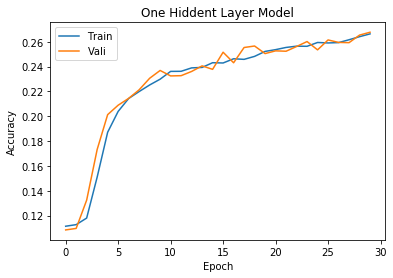

Vali Accu:  0.2677 Best vali:  0.2681 Test Accu:  0.2706 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 150}
lr:  0.001 , momen:  0.6 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.339
[1, 40000] loss: 2.328
Training Accu:  0.10405
Validation Accu:  0.1039
[2, 20000] loss: 2.318
[2, 40000] loss: 2.311
Training Accu:  0.1139
Validation Accu:  0.1188
[3, 20000] loss: 2.301
[3, 40000] loss: 2.296
Training Accu:  0.124575
Validation Accu:  0.1263
[4, 20000] loss: 2.289
[4, 40000] loss: 2.283
Training Accu:  0.129725
Validation Accu:  0.1439
[5, 20000] loss: 2.276
[5, 40000] loss: 2.271
Training Accu:  0.143575
Validation Accu:  0.1555
[6, 20000] loss: 2.266
[6, 40000] loss: 2.261
Training Accu:  0.163825
Validation Accu:  0.1735
[7, 20000] loss: 2.257
[7, 40000] loss: 2.252
Training Accu:  0.1815
Validation Accu:  0.1908
[8, 20000] loss: 2.249
[8, 40000] loss: 2.243
Training Accu:  0.196825
Validation Accu:  0.1967
[9, 20000] loss: 2.240
[9, 40000] loss: 2.237
Training Accu:  0.20565
Validation Accu:  0.2026
[10, 20000] loss: 2.234
[10, 40000] loss: 2.229
Training Accu:  0.214
Validation Accu:  0.2114
[11, 20000] loss: 2.227
[11, 40000] loss: 2.223

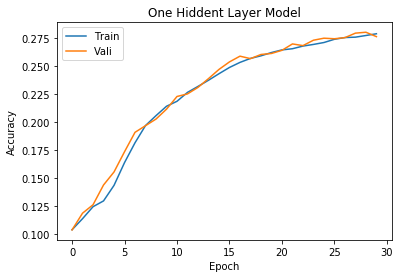

Vali Accu:  0.276 Best vali:  0.276 Test Accu:  0.2815 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 50}
lr:  0.001 , momen:  0.6 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.339
[1, 40000] loss: 2.325
Training Accu:  0.104175
Validation Accu:  0.1123
[2, 20000] loss: 2.312
[2, 40000] loss: 2.300
Training Accu:  0.123325
Validation Accu:  0.1328
[3, 20000] loss: 2.290
[3, 40000] loss: 2.282
Training Accu:  0.1455
Validation Accu:  0.1505
[4, 20000] loss: 2.275
[4, 40000] loss: 2.268
Training Accu:  0.164125
Validation Accu:  0.1713
[5, 20000] loss: 2.263
[5, 40000] loss: 2.256
Training Accu:  0.179975
Validation Accu:  0.1852
[6, 20000] loss: 2.252
[6, 40000] loss: 2.246
Training Accu:  0.19545
Validation Accu:  0.2061
[7, 20000] loss: 2.243
[7, 40000] loss: 2.238
Training Accu:  0.21755
Validation Accu:  0.2293
[8, 20000] loss: 2.233
[8, 40000] loss: 2.229
Training Accu:  0.234925
Validation Accu:  0.2339
[9, 20000] loss: 2.225
[9, 40000] loss: 2.223
Training Accu:  0.2413
Validation Accu:  0.2488
[10, 20000] loss: 2.219
[10, 40000] loss: 2.214
Training Accu:  0.245475
Validation Accu:  0.247
[11, 20000] loss: 2.213
[11, 40000] loss: 2.2

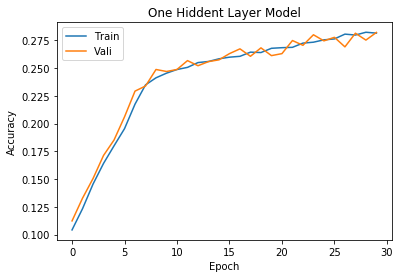

Vali Accu:  0.2822 Best vali:  0.2822 Test Accu:  0.2905 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 150}
lr:  0.001 , momen:  0.6 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.341
[1, 40000] loss: 2.310
Training Accu:  0.10205
Validation Accu:  0.1121
[2, 20000] loss: 2.297
[2, 40000] loss: 2.287
Training Accu:  0.121775
Validation Accu:  0.1375
[3, 20000] loss: 2.280
[3, 40000] loss: 2.274
Training Accu:  0.155275
Validation Accu:  0.1745
[4, 20000] loss: 2.269
[4, 40000] loss: 2.264
Training Accu:  0.19095
Validation Accu:  0.2038
[5, 20000] loss: 2.259
[5, 40000] loss: 2.256
Training Accu:  0.21425
Validation Accu:  0.2168
[6, 20000] loss: 2.251
[6, 40000] loss: 2.247
Training Accu:  0.22145
Validation Accu:  0.2298
[7, 20000] loss: 2.243
[7, 40000] loss: 2.239
Training Accu:  0.22785
Validation Accu:  0.2323
[8, 20000] loss: 2.234
[8, 40000] loss: 2.230
Training Accu:  0.2326
Validation Accu:  0.2353
[9, 20000] loss: 2.226
[9, 40000] loss: 2.224
Training Accu:  0.236975
Validation Accu:  0.2366
[10, 20000] loss: 2.220
[10, 40000] loss: 2.215
Training Accu:  0.240925
Validation Accu:  0.2394
[11, 20000] loss: 2.211
[11, 40000] loss: 2.2

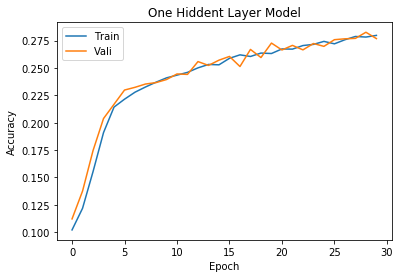

Vali Accu:  0.2768 Best vali:  0.2822 Test Accu:  0.2866 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 150}
lr:  0.001 , momen:  0.9 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.335
[1, 40000] loss: 2.307
Training Accu:  0.114175
Validation Accu:  0.1295
[2, 20000] loss: 2.283
[2, 40000] loss: 2.263
Training Accu:  0.153225
Validation Accu:  0.1902
[3, 20000] loss: 2.248
[3, 40000] loss: 2.235
Training Accu:  0.214025
Validation Accu:  0.2338
[4, 20000] loss: 2.223
[4, 40000] loss: 2.212
Training Accu:  0.24165
Validation Accu:  0.2415
[5, 20000] loss: 2.202
[5, 40000] loss: 2.195
Training Accu:  0.251075
Validation Accu:  0.254
[6, 20000] loss: 2.185
[6, 40000] loss: 2.177
Training Accu:  0.25405
Validation Accu:  0.2642
[7, 20000] loss: 2.170
[7, 40000] loss: 2.161
Training Accu:  0.262
Validation Accu:  0.2678
[8, 20000] loss: 2.152
[8, 40000] loss: 2.148
Training Accu:  0.2684
Validation Accu:  0.2688
[9, 20000] loss: 2.140
[9, 40000] loss: 2.132
Training Accu:  0.273925
Validation Accu:  0.2678
[10, 20000] loss: 2.123
[10, 40000] loss: 2.124
Training Accu:  0.278625
Validation Accu:  0.2744
[11, 20000] loss: 2.112
[11, 40000] loss: 2.10

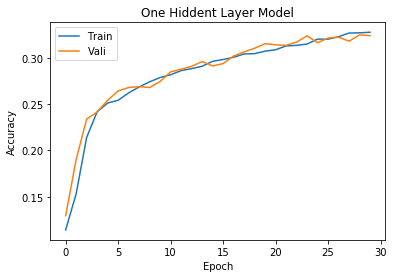

Vali Accu:  0.3238 Best vali:  0.3238 Test Accu:  0.3282 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 50}
lr:  0.001 , momen:  0.9 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.325
[1, 40000] loss: 2.288
Training Accu:  0.1135
Validation Accu:  0.1825
[2, 20000] loss: 2.266
[2, 40000] loss: 2.248
Training Accu:  0.226625
Validation Accu:  0.2435
[3, 20000] loss: 2.230
[3, 40000] loss: 2.218
Training Accu:  0.24665
Validation Accu:  0.245
[4, 20000] loss: 2.204
[4, 40000] loss: 2.189
Training Accu:  0.254175
Validation Accu:  0.2456
[5, 20000] loss: 2.178
[5, 40000] loss: 2.168
Training Accu:  0.256025
Validation Accu:  0.2676
[6, 20000] loss: 2.156
[6, 40000] loss: 2.148
Training Accu:  0.267375
Validation Accu:  0.2634
[7, 20000] loss: 2.140
[7, 40000] loss: 2.127
Training Accu:  0.269825
Validation Accu:  0.2664
[8, 20000] loss: 2.124
[8, 40000] loss: 2.112
Training Accu:  0.27065
Validation Accu:  0.2827
[9, 20000] loss: 2.104
[9, 40000] loss: 2.097
Training Accu:  0.2792
Validation Accu:  0.2795
[10, 20000] loss: 2.091
[10, 40000] loss: 2.080
Training Accu:  0.281475
Validation Accu:  0.2857
[11, 20000] loss: 2.076
[11, 40000] loss: 2.0

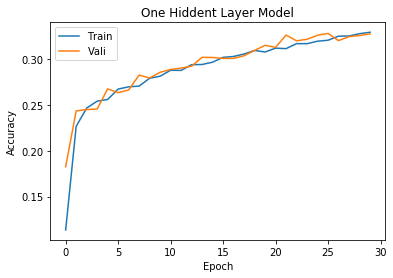

Vali Accu:  0.3277 Best vali:  0.3277 Test Accu:  0.3325 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150}
lr:  0.001 , momen:  0.9 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.343
[1, 40000] loss: 2.285
Training Accu:  0.137075
Validation Accu:  0.1947
[2, 20000] loss: 2.266
[2, 40000] loss: 2.247
Training Accu:  0.218575
Validation Accu:  0.2427
[3, 20000] loss: 2.230
[3, 40000] loss: 2.217
Training Accu:  0.247175
Validation Accu:  0.2504
[4, 20000] loss: 2.201
[4, 40000] loss: 2.191
Training Accu:  0.258375
Validation Accu:  0.2647
[5, 20000] loss: 2.177
[5, 40000] loss: 2.166
Training Accu:  0.26545
Validation Accu:  0.2704
[6, 20000] loss: 2.154
[6, 40000] loss: 2.144
Training Accu:  0.2718
Validation Accu:  0.2742
[7, 20000] loss: 2.132
[7, 40000] loss: 2.128
Training Accu:  0.2794
Validation Accu:  0.2814
[8, 20000] loss: 2.114
[8, 40000] loss: 2.107
Training Accu:  0.2841
Validation Accu:  0.2835
[9, 20000] loss: 2.098
[9, 40000] loss: 2.092
Training Accu:  0.286625
Validation Accu:  0.2825
[10, 20000] loss: 2.084
[10, 40000] loss: 2.075
Training Accu:  0.29125
Validation Accu:  0.2969
[11, 20000] loss: 2.071
[11, 40000] loss: 2.06

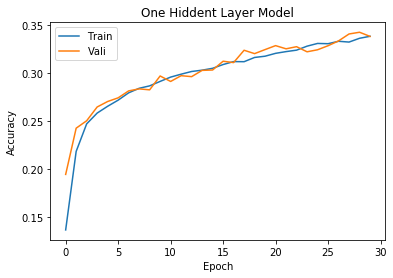

Vali Accu:  0.338 Best vali:  0.338 Test Accu:  0.3368 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.3 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.338
[1, 40000] loss: 2.326
Training Accu:  0.101625
Validation Accu:  0.1144
[2, 20000] loss: 2.311
[2, 40000] loss: 2.300
Training Accu:  0.11685
Validation Accu:  0.1301
[3, 20000] loss: 2.286
[3, 40000] loss: 2.279
Training Accu:  0.13895
Validation Accu:  0.1514
[4, 20000] loss: 2.269
[4, 40000] loss: 2.263
Training Accu:  0.16405
Validation Accu:  0.1745
[5, 20000] loss: 2.255
[5, 40000] loss: 2.248
Training Accu:  0.18895
Validation Accu:  0.2019
[6, 20000] loss: 2.242
[6, 40000] loss: 2.236
Training Accu:  0.215325
Validation Accu:  0.226
[7, 20000] loss: 2.230
[7, 40000] loss: 2.225
Training Accu:  0.2337
Validation Accu:  0.2401
[8, 20000] loss: 2.220
[8, 40000] loss: 2.216
Training Accu:  0.247375
Validation Accu:  0.254
[9, 20000] loss: 2.210
[9, 40000] loss: 2.207
Training Accu:  0.254725
Validation Accu:  0.2523
[10, 20000] loss: 2.202
[10, 40000] loss: 2.198
Training Accu:  0.2571
Validation Accu:  0.2613
[11, 20000] loss: 2.194
[11, 40000] loss: 2.190


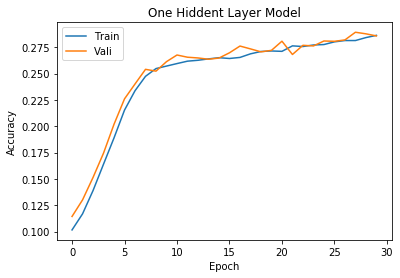

Vali Accu:  0.2857 Best vali:  0.338 Test Accu:  0.2896 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.3 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.325
[1, 40000] loss: 2.303
Training Accu:  0.129125
Validation Accu:  0.1487
[2, 20000] loss: 2.289
[2, 40000] loss: 2.279
Training Accu:  0.155775
Validation Accu:  0.162
[3, 20000] loss: 2.269
[3, 40000] loss: 2.260
Training Accu:  0.1789
Validation Accu:  0.1917
[4, 20000] loss: 2.254
[4, 40000] loss: 2.246
Training Accu:  0.210075
Validation Accu:  0.2329
[5, 20000] loss: 2.240
[5, 40000] loss: 2.234
Training Accu:  0.232175
Validation Accu:  0.234
[6, 20000] loss: 2.227
[6, 40000] loss: 2.222
Training Accu:  0.237425
Validation Accu:  0.2442
[7, 20000] loss: 2.215
[7, 40000] loss: 2.212
Training Accu:  0.246075
Validation Accu:  0.2505
[8, 20000] loss: 2.204
[8, 40000] loss: 2.202
Training Accu:  0.249075
Validation Accu:  0.2502
[9, 20000] loss: 2.195
[9, 40000] loss: 2.192
Training Accu:  0.2531
Validation Accu:  0.266
[10, 20000] loss: 2.185
[10, 40000] loss: 2.181
Training Accu:  0.25765
Validation Accu:  0.2685
[11, 20000] loss: 2.176
[11, 40000] loss: 2.17

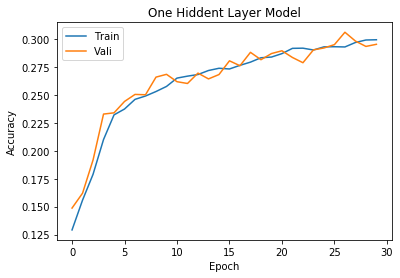

Vali Accu:  0.2954 Best vali:  0.338 Test Accu:  0.3032 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.3 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.313
[1, 40000] loss: 2.288
Training Accu:  0.1174
Validation Accu:  0.1409
[2, 20000] loss: 2.276
[2, 40000] loss: 2.268
Training Accu:  0.17935
Validation Accu:  0.2057
[3, 20000] loss: 2.259
[3, 40000] loss: 2.251
Training Accu:  0.215125
Validation Accu:  0.2215
[4, 20000] loss: 2.243
[4, 40000] loss: 2.238
Training Accu:  0.2307
Validation Accu:  0.2351
[5, 20000] loss: 2.230
[5, 40000] loss: 2.225
Training Accu:  0.238125
Validation Accu:  0.2406
[6, 20000] loss: 2.218
[6, 40000] loss: 2.209
Training Accu:  0.244175
Validation Accu:  0.2492
[7, 20000] loss: 2.206
[7, 40000] loss: 2.199
Training Accu:  0.2482
Validation Accu:  0.2636
[8, 20000] loss: 2.191
[8, 40000] loss: 2.188
Training Accu:  0.2548
Validation Accu:  0.2641
[9, 20000] loss: 2.183
[9, 40000] loss: 2.174
Training Accu:  0.26095
Validation Accu:  0.2671
[10, 20000] loss: 2.170
[10, 40000] loss: 2.165
Training Accu:  0.268975
Validation Accu:  0.2601
[11, 20000] loss: 2.161
[11, 40000] loss: 2.156


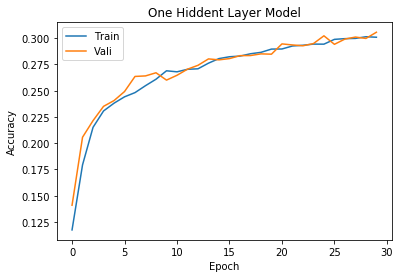

Vali Accu:  0.3057 Best vali:  0.338 Test Accu:  0.3093 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.6 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.346
[1, 40000] loss: 2.319
Training Accu:  0.10005
Validation Accu:  0.1007
[2, 20000] loss: 2.295
[2, 40000] loss: 2.277
Training Accu:  0.119025
Validation Accu:  0.1598
[3, 20000] loss: 2.261
[3, 40000] loss: 2.251
Training Accu:  0.17885
Validation Accu:  0.1919
[4, 20000] loss: 2.239
[4, 40000] loss: 2.228
Training Accu:  0.204825
Validation Accu:  0.2125
[5, 20000] loss: 2.221
[5, 40000] loss: 2.212
Training Accu:  0.220175
Validation Accu:  0.2249
[6, 20000] loss: 2.205
[6, 40000] loss: 2.197
Training Accu:  0.23345
Validation Accu:  0.2391
[7, 20000] loss: 2.190
[7, 40000] loss: 2.185
Training Accu:  0.2459
Validation Accu:  0.2537
[8, 20000] loss: 2.179
[8, 40000] loss: 2.172
Training Accu:  0.25495
Validation Accu:  0.2661
[9, 20000] loss: 2.169
[9, 40000] loss: 2.161
Training Accu:  0.263075
Validation Accu:  0.2738
[10, 20000] loss: 2.154
[10, 40000] loss: 2.148
Training Accu:  0.26985
Validation Accu:  0.2661
[11, 20000] loss: 2.146
[11, 40000] loss: 2.1

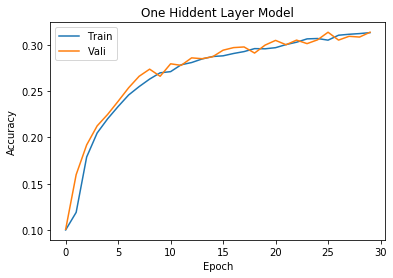

Vali Accu:  0.3137 Best vali:  0.338 Test Accu:  0.3175 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.6 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.309
[1, 40000] loss: 2.288
Training Accu:  0.14275
Validation Accu:  0.1605
[2, 20000] loss: 2.270
[2, 40000] loss: 2.258
Training Accu:  0.1949
Validation Accu:  0.2169
[3, 20000] loss: 2.246
[3, 40000] loss: 2.235
Training Accu:  0.236625
Validation Accu:  0.2495
[4, 20000] loss: 2.226
[4, 40000] loss: 2.213
Training Accu:  0.253775
Validation Accu:  0.2517
[5, 20000] loss: 2.205
[5, 40000] loss: 2.196
Training Accu:  0.2601
Validation Accu:  0.2597
[6, 20000] loss: 2.188
[6, 40000] loss: 2.181
Training Accu:  0.2655
Validation Accu:  0.2751
[7, 20000] loss: 2.170
[7, 40000] loss: 2.167
Training Accu:  0.270975
Validation Accu:  0.2743
[8, 20000] loss: 2.157
[8, 40000] loss: 2.151
Training Accu:  0.272325
Validation Accu:  0.2691
[9, 20000] loss: 2.143
[9, 40000] loss: 2.136
Training Accu:  0.2804
Validation Accu:  0.277
[10, 20000] loss: 2.130
[10, 40000] loss: 2.123
Training Accu:  0.281075
Validation Accu:  0.2769
[11, 20000] loss: 2.118
[11, 40000] loss: 2.114


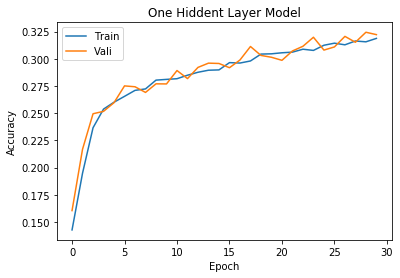

Vali Accu:  0.3222 Best vali:  0.338 Test Accu:  0.3211 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.6 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.307
[1, 40000] loss: 2.285
Training Accu:  0.13785
Validation Accu:  0.1719
[2, 20000] loss: 2.269
[2, 40000] loss: 2.258
Training Accu:  0.199475
Validation Accu:  0.2167
[3, 20000] loss: 2.245
[3, 40000] loss: 2.232
Training Accu:  0.232075
Validation Accu:  0.2412
[4, 20000] loss: 2.221
[4, 40000] loss: 2.211
Training Accu:  0.2459
Validation Accu:  0.2485
[5, 20000] loss: 2.201
[5, 40000] loss: 2.191
Training Accu:  0.254275
Validation Accu:  0.2542
[6, 20000] loss: 2.184
[6, 40000] loss: 2.171
Training Accu:  0.261375
Validation Accu:  0.2688
[7, 20000] loss: 2.164
[7, 40000] loss: 2.156
Training Accu:  0.26635
Validation Accu:  0.2707
[8, 20000] loss: 2.147
[8, 40000] loss: 2.141
Training Accu:  0.269825
Validation Accu:  0.2793
[9, 20000] loss: 2.132
[9, 40000] loss: 2.127
Training Accu:  0.2769
Validation Accu:  0.2823
[10, 20000] loss: 2.119
[10, 40000] loss: 2.111
Training Accu:  0.2822
Validation Accu:  0.2872
[11, 20000] loss: 2.105
[11, 40000] loss: 2.10

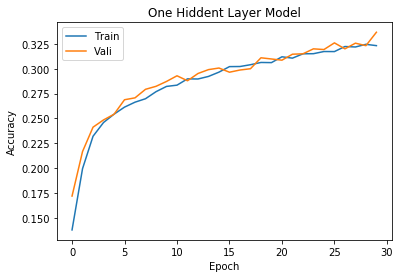

Vali Accu:  0.3367 Best vali:  0.338 Test Accu:  0.329 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 300}
lr:  0.003 , momen:  0.9 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.333
[1, 40000] loss: 2.259
Training Accu:  0.153825
Validation Accu:  0.2239
[2, 20000] loss: 2.220
[2, 40000] loss: 2.191
Training Accu:  0.23665
Validation Accu:  0.2364
[3, 20000] loss: 2.167
[3, 40000] loss: 2.147
Training Accu:  0.25345
Validation Accu:  0.2536
[4, 20000] loss: 2.123
[4, 40000] loss: 2.109
Training Accu:  0.26855
Validation Accu:  0.2734
[5, 20000] loss: 2.091
[5, 40000] loss: 2.077
Training Accu:  0.279375
Validation Accu:  0.29
[6, 20000] loss: 2.060
[6, 40000] loss: 2.046
Training Accu:  0.2862
Validation Accu:  0.2958
[7, 20000] loss: 2.031
[7, 40000] loss: 2.023
Training Accu:  0.295675
Validation Accu:  0.2979
[8, 20000] loss: 2.010
[8, 40000] loss: 1.998
Training Accu:  0.30605
Validation Accu:  0.2945
[9, 20000] loss: 1.983
[9, 40000] loss: 1.986
Training Accu:  0.309425
Validation Accu:  0.3093
[10, 20000] loss: 1.974
[10, 40000] loss: 1.966
Training Accu:  0.3168
Validation Accu:  0.3106
[11, 20000] loss: 1.961
[11, 40000] loss: 1.949


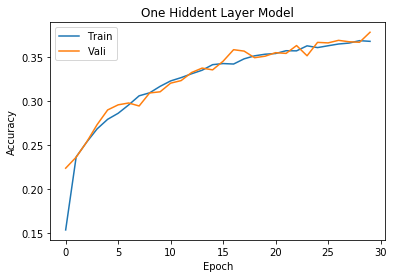

Vali Accu:  0.3782 Best vali:  0.3782 Test Accu:  0.3723 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 50}
lr:  0.003 , momen:  0.9 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.309
[1, 40000] loss: 2.247
Training Accu:  0.1645
Validation Accu:  0.2238
[2, 20000] loss: 2.203
[2, 40000] loss: 2.169
Training Accu:  0.26095
Validation Accu:  0.281
[3, 20000] loss: 2.138
[3, 40000] loss: 2.112
Training Accu:  0.27925
Validation Accu:  0.2806
[4, 20000] loss: 2.092
[4, 40000] loss: 2.071
Training Accu:  0.291875
Validation Accu:  0.2973
[5, 20000] loss: 2.051
[5, 40000] loss: 2.041
Training Accu:  0.2993
Validation Accu:  0.3118
[6, 20000] loss: 2.020
[6, 40000] loss: 2.004
Training Accu:  0.3079
Validation Accu:  0.3085
[7, 20000] loss: 1.996
[7, 40000] loss: 1.984
Training Accu:  0.3146
Validation Accu:  0.3178
[8, 20000] loss: 1.976
[8, 40000] loss: 1.960
Training Accu:  0.322875
Validation Accu:  0.3243
[9, 20000] loss: 1.950
[9, 40000] loss: 1.949
Training Accu:  0.328525
Validation Accu:  0.3231
[10, 20000] loss: 1.937
[10, 40000] loss: 1.930
Training Accu:  0.332175
Validation Accu:  0.3281
[11, 20000] loss: 1.923
[11, 40000] loss: 1.917
T

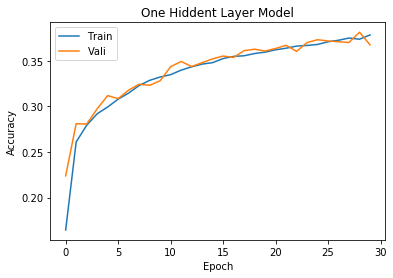

Vali Accu:  0.3675 Best vali:  0.3782 Test Accu:  0.3792 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 50}
lr:  0.003 , momen:  0.9 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.321
[1, 40000] loss: 2.243
Training Accu:  0.152725
Validation Accu:  0.2245
[2, 20000] loss: 2.191
[2, 40000] loss: 2.160
Training Accu:  0.2436
Validation Accu:  0.2715
[3, 20000] loss: 2.126
[3, 40000] loss: 2.101
Training Accu:  0.2747
Validation Accu:  0.2769
[4, 20000] loss: 2.080
[4, 40000] loss: 2.055
Training Accu:  0.28795
Validation Accu:  0.286
[5, 20000] loss: 2.036
[5, 40000] loss: 2.026
Training Accu:  0.298725
Validation Accu:  0.301
[6, 20000] loss: 2.007
[6, 40000] loss: 1.995
Training Accu:  0.30655
Validation Accu:  0.3098
[7, 20000] loss: 1.980
[7, 40000] loss: 1.974
Training Accu:  0.31355
Validation Accu:  0.3176
[8, 20000] loss: 1.966
[8, 40000] loss: 1.943
Training Accu:  0.318875
Validation Accu:  0.3184
[9, 20000] loss: 1.938
[9, 40000] loss: 1.940
Training Accu:  0.327
Validation Accu:  0.3301
[10, 20000] loss: 1.927
[10, 40000] loss: 1.925
Training Accu:  0.3302
Validation Accu:  0.3414
[11, 20000] loss: 1.914
[11, 40000] loss: 1.904
Trai

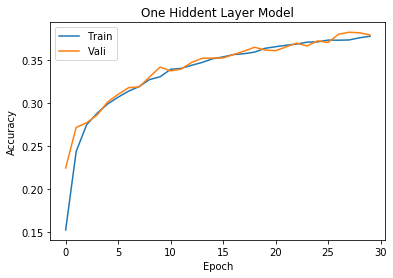

Vali Accu:  0.3786 Best vali:  0.3786 Test Accu:  0.3814 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.3 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.331
[1, 40000] loss: 2.302
Training Accu:  0.156925
Validation Accu:  0.1754
[2, 20000] loss: 2.280
[2, 40000] loss: 2.260
Training Accu:  0.1823
Validation Accu:  0.1807
[3, 20000] loss: 2.247
[3, 40000] loss: 2.231
Training Accu:  0.19305
Validation Accu:  0.2013
[4, 20000] loss: 2.222
[4, 40000] loss: 2.211
Training Accu:  0.2157
Validation Accu:  0.2362
[5, 20000] loss: 2.204
[5, 40000] loss: 2.195
Training Accu:  0.236475
Validation Accu:  0.2463
[6, 20000] loss: 2.188
[6, 40000] loss: 2.178
Training Accu:  0.245875
Validation Accu:  0.252
[7, 20000] loss: 2.178
[7, 40000] loss: 2.165
Training Accu:  0.251725
Validation Accu:  0.263
[8, 20000] loss: 2.161
[8, 40000] loss: 2.156
Training Accu:  0.257825
Validation Accu:  0.2557
[9, 20000] loss: 2.151
[9, 40000] loss: 2.144
Training Accu:  0.260675
Validation Accu:  0.2596
[10, 20000] loss: 2.139
[10, 40000] loss: 2.134
Training Accu:  0.261725
Validation Accu:  0.2678
[11, 20000] loss: 2.127
[11, 40000] loss: 2.1

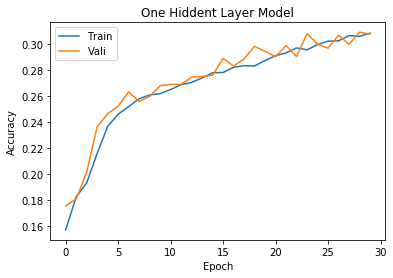

Vali Accu:  0.3074 Best vali:  0.3786 Test Accu:  0.3127 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.3 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.303
[1, 40000] loss: 2.279
Training Accu:  0.128375
Validation Accu:  0.1656
[2, 20000] loss: 2.263
[2, 40000] loss: 2.250
Training Accu:  0.201275
Validation Accu:  0.2321
[3, 20000] loss: 2.237
[3, 40000] loss: 2.228
Training Accu:  0.237225
Validation Accu:  0.2446
[4, 20000] loss: 2.216
[4, 40000] loss: 2.207
Training Accu:  0.250375
Validation Accu:  0.2568
[5, 20000] loss: 2.198
[5, 40000] loss: 2.188
Training Accu:  0.258475
Validation Accu:  0.2666
[6, 20000] loss: 2.178
[6, 40000] loss: 2.172
Training Accu:  0.2646
Validation Accu:  0.2708
[7, 20000] loss: 2.160
[7, 40000] loss: 2.157
Training Accu:  0.26885
Validation Accu:  0.2708
[8, 20000] loss: 2.152
[8, 40000] loss: 2.140
Training Accu:  0.2761
Validation Accu:  0.2753
[9, 20000] loss: 2.137
[9, 40000] loss: 2.127
Training Accu:  0.2776
Validation Accu:  0.2803
[10, 20000] loss: 2.123
[10, 40000] loss: 2.115
Training Accu:  0.281625
Validation Accu:  0.2797
[11, 20000] loss: 2.111
[11, 40000] loss: 2.1

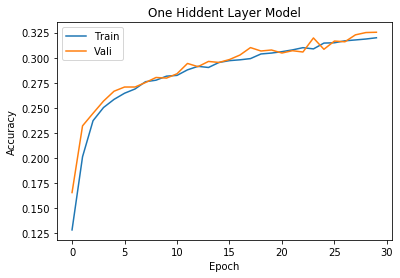

Vali Accu:  0.3254 Best vali:  0.3786 Test Accu:  0.3232 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.3 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.313
[1, 40000] loss: 2.280
Training Accu:  0.134075
Validation Accu:  0.1937
[2, 20000] loss: 2.264
[2, 40000] loss: 2.249
Training Accu:  0.2184
Validation Accu:  0.2293
[3, 20000] loss: 2.237
[3, 40000] loss: 2.224
Training Accu:  0.24735
Validation Accu:  0.2518
[4, 20000] loss: 2.214
[4, 40000] loss: 2.202
Training Accu:  0.253325
Validation Accu:  0.2602
[5, 20000] loss: 2.192
[5, 40000] loss: 2.183
Training Accu:  0.263525
Validation Accu:  0.2644
[6, 20000] loss: 2.172
[6, 40000] loss: 2.167
Training Accu:  0.26705
Validation Accu:  0.2709
[7, 20000] loss: 2.155
[7, 40000] loss: 2.148
Training Accu:  0.272875
Validation Accu:  0.2669
[8, 20000] loss: 2.142
[8, 40000] loss: 2.131
Training Accu:  0.272975
Validation Accu:  0.2817
[9, 20000] loss: 2.125
[9, 40000] loss: 2.120
Training Accu:  0.27845
Validation Accu:  0.2775
[10, 20000] loss: 2.115
[10, 40000] loss: 2.105
Training Accu:  0.27995
Validation Accu:  0.292
[11, 20000] loss: 2.102
[11, 40000] loss: 2.0

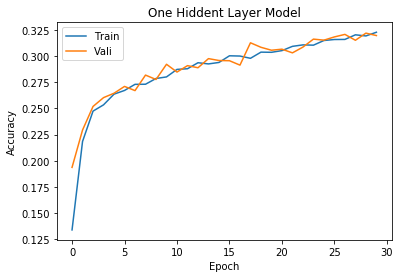

Vali Accu:  0.3194 Best vali:  0.3786 Test Accu:  0.3238 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.6 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.314
[1, 40000] loss: 2.272
Training Accu:  0.142
Validation Accu:  0.1847
[2, 20000] loss: 2.247
[2, 40000] loss: 2.225
Training Accu:  0.20645
Validation Accu:  0.2243
[3, 20000] loss: 2.207
[3, 40000] loss: 2.195
Training Accu:  0.236025
Validation Accu:  0.2435
[4, 20000] loss: 2.183
[4, 40000] loss: 2.167
Training Accu:  0.2509
Validation Accu:  0.2615
[5, 20000] loss: 2.157
[5, 40000] loss: 2.147
Training Accu:  0.257875
Validation Accu:  0.2631
[6, 20000] loss: 2.136
[6, 40000] loss: 2.127
Training Accu:  0.26495
Validation Accu:  0.2662
[7, 20000] loss: 2.124
[7, 40000] loss: 2.107
Training Accu:  0.26795
Validation Accu:  0.2715
[8, 20000] loss: 2.101
[8, 40000] loss: 2.096
Training Accu:  0.2736
Validation Accu:  0.2737
[9, 20000] loss: 2.086
[9, 40000] loss: 2.085
Training Accu:  0.27575
Validation Accu:  0.2838
[10, 20000] loss: 2.075
[10, 40000] loss: 2.066
Training Accu:  0.282075
Validation Accu:  0.2848
[11, 20000] loss: 2.061
[11, 40000] loss: 2.058
T

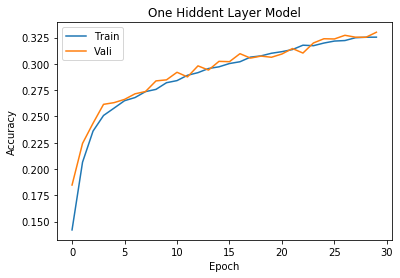

Vali Accu:  0.3301 Best vali:  0.3786 Test Accu:  0.3268 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.6 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.300
[1, 40000] loss: 2.271
Training Accu:  0.138325
Validation Accu:  0.2198
[2, 20000] loss: 2.252
[2, 40000] loss: 2.233
Training Accu:  0.236775
Validation Accu:  0.251
[3, 20000] loss: 2.218
[3, 40000] loss: 2.199
Training Accu:  0.2544
Validation Accu:  0.2656
[4, 20000] loss: 2.185
[4, 40000] loss: 2.174
Training Accu:  0.2625
Validation Accu:  0.2721
[5, 20000] loss: 2.159
[5, 40000] loss: 2.148
Training Accu:  0.273025
Validation Accu:  0.2795
[6, 20000] loss: 2.133
[6, 40000] loss: 2.127
Training Accu:  0.2749
Validation Accu:  0.2897
[7, 20000] loss: 2.114
[7, 40000] loss: 2.103
Training Accu:  0.284575
Validation Accu:  0.2878
[8, 20000] loss: 2.094
[8, 40000] loss: 2.085
Training Accu:  0.289325
Validation Accu:  0.2948
[9, 20000] loss: 2.076
[9, 40000] loss: 2.067
Training Accu:  0.294475
Validation Accu:  0.296
[10, 20000] loss: 2.059
[10, 40000] loss: 2.051
Training Accu:  0.30185
Validation Accu:  0.2967
[11, 20000] loss: 2.042
[11, 40000] loss: 2.042

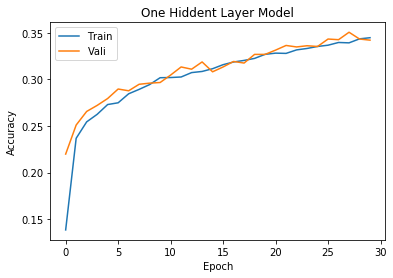

Vali Accu:  0.3422 Best vali:  0.3786 Test Accu:  0.3434 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.6 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.300
[1, 40000] loss: 2.269
Training Accu:  0.163825
Validation Accu:  0.217
[2, 20000] loss: 2.247
[2, 40000] loss: 2.227
Training Accu:  0.227375
Validation Accu:  0.2438
[3, 20000] loss: 2.209
[3, 40000] loss: 2.193
Training Accu:  0.2492
Validation Accu:  0.2493
[4, 20000] loss: 2.177
[4, 40000] loss: 2.162
Training Accu:  0.257225
Validation Accu:  0.2609
[5, 20000] loss: 2.148
[5, 40000] loss: 2.135
Training Accu:  0.268525
Validation Accu:  0.2643
[6, 20000] loss: 2.118
[6, 40000] loss: 2.114
Training Accu:  0.2718
Validation Accu:  0.2898
[7, 20000] loss: 2.100
[7, 40000] loss: 2.092
Training Accu:  0.2827
Validation Accu:  0.2905
[8, 20000] loss: 2.078
[8, 40000] loss: 2.072
Training Accu:  0.288825
Validation Accu:  0.2804
[9, 20000] loss: 2.060
[9, 40000] loss: 2.059
Training Accu:  0.2907
Validation Accu:  0.2969
[10, 20000] loss: 2.048
[10, 40000] loss: 2.040
Training Accu:  0.29445
Validation Accu:  0.3025
[11, 20000] loss: 2.032
[11, 40000] loss: 2.025


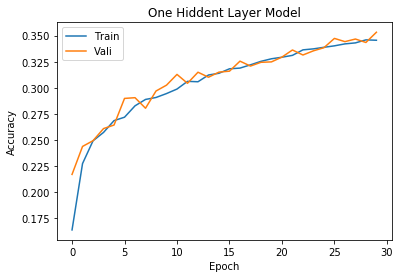

Vali Accu:  0.3532 Best vali:  0.3786 Test Accu:  0.348 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 300}
lr:  0.005 , momen:  0.9 M:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.294
[1, 40000] loss: 2.221
Training Accu:  0.183625
Validation Accu:  0.2385
[2, 20000] loss: 2.170
[2, 40000] loss: 2.137
Training Accu:  0.25105
Validation Accu:  0.286
[3, 20000] loss: 2.102
[3, 40000] loss: 2.076
Training Accu:  0.28645
Validation Accu:  0.2993
[4, 20000] loss: 2.052
[4, 40000] loss: 2.030
Training Accu:  0.301925
Validation Accu:  0.3081
[5, 20000] loss: 2.011
[5, 40000] loss: 1.994
Training Accu:  0.3114
Validation Accu:  0.3084
[6, 20000] loss: 1.979
[6, 40000] loss: 1.971
Training Accu:  0.319125
Validation Accu:  0.3169
[7, 20000] loss: 1.964
[7, 40000] loss: 1.944
Training Accu:  0.3216
Validation Accu:  0.3388
[8, 20000] loss: 1.938
[8, 40000] loss: 1.931
Training Accu:  0.3299
Validation Accu:  0.3331
[9, 20000] loss: 1.918
[9, 40000] loss: 1.917
Training Accu:  0.335875
Validation Accu:  0.3389
[10, 20000] loss: 1.903
[10, 40000] loss: 1.894
Training Accu:  0.342325
Validation Accu:  0.3418
[11, 20000] loss: 1.893
[11, 40000] loss: 1.883

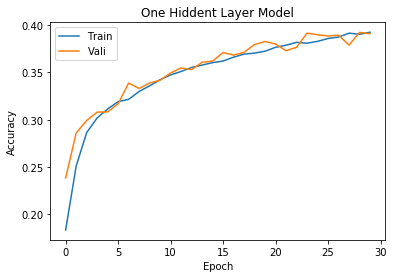

Vali Accu:  0.391 Best vali:  0.391 Test Accu:  0.3891 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 50}
lr:  0.005 , momen:  0.9 M:  150


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.285
[1, 40000] loss: 2.210
Training Accu:  0.197675
Validation Accu:  0.2596
[2, 20000] loss: 2.151
[2, 40000] loss: 2.110
Training Accu:  0.268975
Validation Accu:  0.2831
[3, 20000] loss: 2.069
[3, 40000] loss: 2.045
Training Accu:  0.292425
Validation Accu:  0.2907
[4, 20000] loss: 2.014
[4, 40000] loss: 1.993
Training Accu:  0.3035
Validation Accu:  0.3036
[5, 20000] loss: 1.978
[5, 40000] loss: 1.965
Training Accu:  0.313975
Validation Accu:  0.3212
[6, 20000] loss: 1.945
[6, 40000] loss: 1.943
Training Accu:  0.32235
Validation Accu:  0.3354
[7, 20000] loss: 1.923
[7, 40000] loss: 1.911
Training Accu:  0.3338
Validation Accu:  0.3409
[8, 20000] loss: 1.906
[8, 40000] loss: 1.895
Training Accu:  0.34035
Validation Accu:  0.3454
[9, 20000] loss: 1.885
[9, 40000] loss: 1.886
Training Accu:  0.34385
Validation Accu:  0.3469
[10, 20000] loss: 1.872
[10, 40000] loss: 1.867
Training Accu:  0.353675
Validation Accu:  0.3447
[11, 20000] loss: 1.865
[11, 40000] loss: 1.8

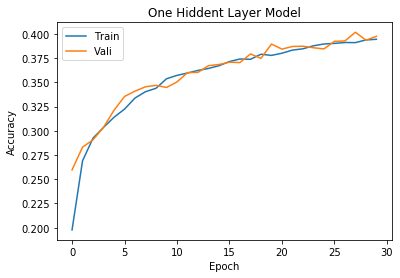

Vali Accu:  0.3975 Best vali:  0.3975 Test Accu:  0.3927 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 150}
lr:  0.005 , momen:  0.9 M:  300


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.298
[1, 40000] loss: 2.216
Training Accu:  0.183425
Validation Accu:  0.2598
[2, 20000] loss: 2.157
[2, 40000] loss: 2.111
Training Accu:  0.267025
Validation Accu:  0.2811
[3, 20000] loss: 2.070
[3, 40000] loss: 2.045
Training Accu:  0.292725
Validation Accu:  0.3092
[4, 20000] loss: 2.015
[4, 40000] loss: 1.991
Training Accu:  0.307625
Validation Accu:  0.3107
[5, 20000] loss: 1.974
[5, 40000] loss: 1.956
Training Accu:  0.315475
Validation Accu:  0.335
[6, 20000] loss: 1.936
[6, 40000] loss: 1.930
Training Accu:  0.3278
Validation Accu:  0.328
[7, 20000] loss: 1.915
[7, 40000] loss: 1.901
Training Accu:  0.339375
Validation Accu:  0.3387
[8, 20000] loss: 1.896
[8, 40000] loss: 1.890
Training Accu:  0.342825
Validation Accu:  0.348
[9, 20000] loss: 1.880
[9, 40000] loss: 1.869
Training Accu:  0.350975
Validation Accu:  0.3536
[10, 20000] loss: 1.868
[10, 40000] loss: 1.867
Training Accu:  0.3549
Validation Accu:  0.3573
[11, 20000] loss: 1.854
[11, 40000] loss: 1.8

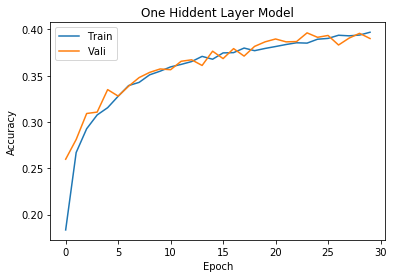

Vali Accu:  0.3902 Best vali:  0.3975 Test Accu:  0.3921 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 150}
Best vali accu: 0.3902, Best test accu: 0.3921, Best param set: {'lr': 0.005, 'momentum': 0.9, 'M': 150}
Wall time: 2h 55min 34s


In [15]:
%%time
# A5b
# train one linear hidden layer
batch_size = 1000

# load data
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)

# define a loss function
criterion = torch.nn.CrossEntropyLoss()

lr_list = [0.001, 0.003, 0.005]
lr_accu_list = [[] for i in range(len(lr_list))]
momentum_list = [0.3, 0.6, 0.9]
momentum_accu_list = [[] for i in range(len(momentum_list))]
M_list = [50, 150, 300]
M_accu_list = [[] for i in range(len(M_list))]

vali_acct_best = 0
test_accu_best = 0

for lr in lr_list:
    for momentum in momentum_list:
        for M in M_list:
            print("lr: ", lr, ", momen: ", momentum, "M: ", M)
            # define model
            model = OneHiddenLayer(M)
            # define optimizer
            optimizer = torch.optim.SGD(model.parameters(), 
                                        lr=lr, 
                                        momentum=momentum)

            model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                                         model=model, 
                                                         optimizer=optimizer, 
                                                         testloader=testloader,
                                                         epochs=30, 
                                                         batch_print_num=20, 
                                                         batch_size=batch_size, 
                                                         title="One Hiddent Layer Model") 
            lr_accu_list[lr_list.index(lr)].append(accu_vali)
            momentum_accu_list[momentum_list.index(momentum)].append(accu_vali)
            M_accu_list[M_list.index(M)].append(accu_vali)

            if accu_vali > vali_acct_best:
                vali_acct_best = accu_vali
                test_accu_best = test_accu
                best_params = {"lr": lr,"momentum": momentum, "M": M}
            print("Vali Accu: ", accu_vali, "Best vali: ", vali_acct_best, 
                  "Test Accu: ", test_accu, "Best params: ", best_params)

print("Best vali accu: {0}, Best test accu: {1}, Best param set: {2}".format(accu_vali, 
                                                                             test_accu, 
                                                                             best_params))
lr_accu_avg_list = avg_d_dimensional_list(lr_accu_list)
momentum_avg_list = avg_d_dimensional_list(momentum_accu_list)
M_avg_list = avg_d_dimensional_list(M_accu_list)


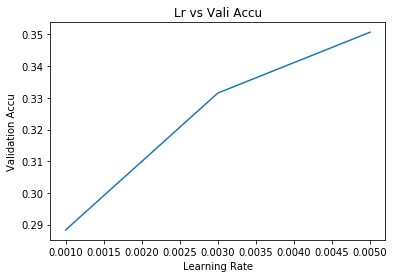

In [16]:
# plot lr and momentum change with accu plots
plt.plot(lr_list, lr_accu_avg_list)
plt.xlabel("Learning Rate")
plt.ylabel("Validation Accu")
plt.title("Lr vs Vali Accu")
plt.show()

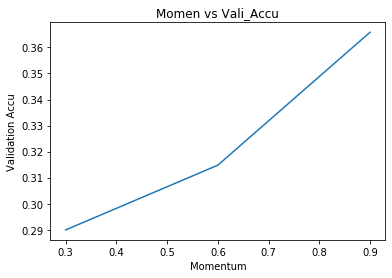

In [17]:
# plot momentum change with accu plotsu
plt.plot(momentum_list, momentum_avg_list)
plt.xlabel("Momentum")
plt.ylabel("Validation Accu")
plt.title("Momen vs Vali_Accu")
plt.show()

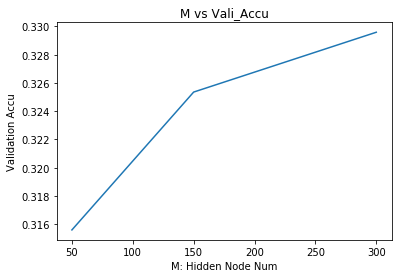

In [18]:
# plot M change with accu plotsu
plt.plot(M_list, M_avg_list)
plt.xlabel("M: Hidden Node Num")
plt.ylabel("Validation Accu")
plt.title("M vs Vali_Accu")
plt.show()

Files already downloaded and verified
Files already downloaded and verified
Epoch:  1


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.315
[1, 40000] loss: 2.217
Training Accu:  0.16775
Validation Accu:  0.2649
Finish Traning
Test 0 th batch, 260 correct, tested 1000, batch size 1000
Test 1 th batch, 527 correct, tested 2000, batch size 1000
Test 2 th batch, 815 correct, tested 3000, batch size 1000
Test 3 th batch, 1091 correct, tested 4000, batch size 1000
Test 4 th batch, 1371 correct, tested 5000, batch size 1000
Test 5 th batch, 1640 correct, tested 6000, batch size 1000
Test 6 th batch, 1912 correct, tested 7000, batch size 1000
Test 7 th batch, 2176 correct, tested 8000, batch size 1000
Test 8 th batch, 2459 correct, tested 9000, batch size 1000
Test 9 th batch, 2732 correct, tested 10000, batch size 1000


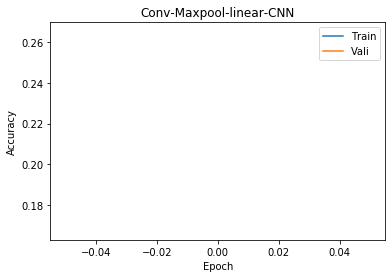

Test Accu: 0.2732
Epoch:  2


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.154
[1, 40000] loss: 2.104
Training Accu:  0.278025
Validation Accu:  0.2888
Finish Traning
Test 0 th batch, 302 correct, tested 1000, batch size 1000
Test 1 th batch, 596 correct, tested 2000, batch size 1000
Test 2 th batch, 901 correct, tested 3000, batch size 1000
Test 3 th batch, 1194 correct, tested 4000, batch size 1000
Test 4 th batch, 1492 correct, tested 5000, batch size 1000
Test 5 th batch, 1780 correct, tested 6000, batch size 1000
Test 6 th batch, 2077 correct, tested 7000, batch size 1000
Test 7 th batch, 2367 correct, tested 8000, batch size 1000
Test 8 th batch, 2653 correct, tested 9000, batch size 1000
Test 9 th batch, 2951 correct, tested 10000, batch size 1000


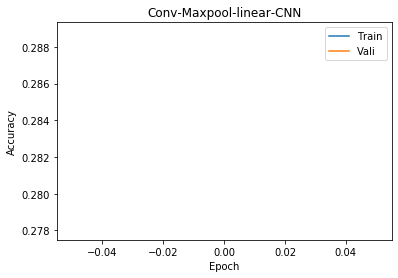

Test Accu: 0.2951
Epoch:  3


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.067
[1, 40000] loss: 2.035
Training Accu:  0.295075
Validation Accu:  0.3112
Finish Traning
Test 0 th batch, 302 correct, tested 1000, batch size 1000
Test 1 th batch, 610 correct, tested 2000, batch size 1000
Test 2 th batch, 941 correct, tested 3000, batch size 1000
Test 3 th batch, 1265 correct, tested 4000, batch size 1000
Test 4 th batch, 1586 correct, tested 5000, batch size 1000
Test 5 th batch, 1886 correct, tested 6000, batch size 1000
Test 6 th batch, 2209 correct, tested 7000, batch size 1000
Test 7 th batch, 2512 correct, tested 8000, batch size 1000
Test 8 th batch, 2821 correct, tested 9000, batch size 1000
Test 9 th batch, 3126 correct, tested 10000, batch size 1000


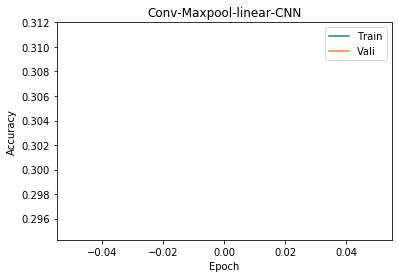

Test Accu: 0.3126
Epoch:  4


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 2.011
[1, 40000] loss: 1.988
Training Accu:  0.307825
Validation Accu:  0.3231
Finish Traning
Test 0 th batch, 309 correct, tested 1000, batch size 1000
Test 1 th batch, 622 correct, tested 2000, batch size 1000
Test 2 th batch, 948 correct, tested 3000, batch size 1000
Test 3 th batch, 1273 correct, tested 4000, batch size 1000
Test 4 th batch, 1594 correct, tested 5000, batch size 1000
Test 5 th batch, 1895 correct, tested 6000, batch size 1000
Test 6 th batch, 2222 correct, tested 7000, batch size 1000
Test 7 th batch, 2528 correct, tested 8000, batch size 1000
Test 8 th batch, 2834 correct, tested 9000, batch size 1000
Test 9 th batch, 3156 correct, tested 10000, batch size 1000


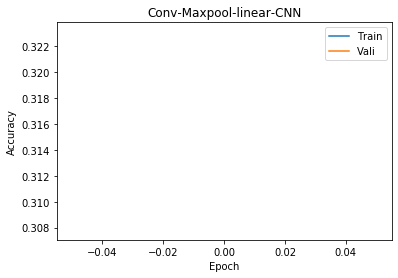

Test Accu: 0.3156
Epoch:  5


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.969
[1, 40000] loss: 1.952
Training Accu:  0.31845
Validation Accu:  0.327
Finish Traning
Test 0 th batch, 329 correct, tested 1000, batch size 1000
Test 1 th batch, 668 correct, tested 2000, batch size 1000
Test 2 th batch, 1009 correct, tested 3000, batch size 1000
Test 3 th batch, 1345 correct, tested 4000, batch size 1000
Test 4 th batch, 1670 correct, tested 5000, batch size 1000
Test 5 th batch, 1990 correct, tested 6000, batch size 1000
Test 6 th batch, 2330 correct, tested 7000, batch size 1000
Test 7 th batch, 2655 correct, tested 8000, batch size 1000
Test 8 th batch, 2975 correct, tested 9000, batch size 1000
Test 9 th batch, 3313 correct, tested 10000, batch size 1000


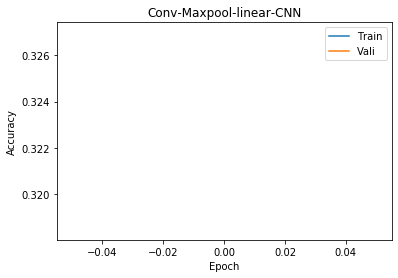

Test Accu: 0.3313
Epoch:  6


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.937
[1, 40000] loss: 1.929
Training Accu:  0.33055
Validation Accu:  0.3333
Finish Traning
Test 0 th batch, 330 correct, tested 1000, batch size 1000
Test 1 th batch, 662 correct, tested 2000, batch size 1000
Test 2 th batch, 999 correct, tested 3000, batch size 1000
Test 3 th batch, 1337 correct, tested 4000, batch size 1000
Test 4 th batch, 1661 correct, tested 5000, batch size 1000
Test 5 th batch, 1972 correct, tested 6000, batch size 1000
Test 6 th batch, 2306 correct, tested 7000, batch size 1000
Test 7 th batch, 2642 correct, tested 8000, batch size 1000
Test 8 th batch, 2965 correct, tested 9000, batch size 1000
Test 9 th batch, 3294 correct, tested 10000, batch size 1000


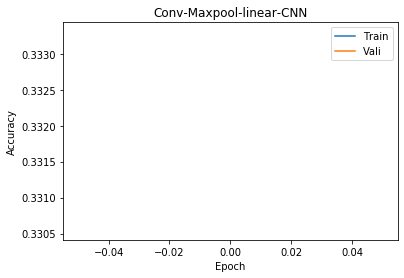

Test Accu: 0.3313
Epoch:  7


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.914
[1, 40000] loss: 1.903
Training Accu:  0.338125
Validation Accu:  0.3418
Finish Traning
Test 0 th batch, 341 correct, tested 1000, batch size 1000
Test 1 th batch, 685 correct, tested 2000, batch size 1000
Test 2 th batch, 1034 correct, tested 3000, batch size 1000
Test 3 th batch, 1390 correct, tested 4000, batch size 1000
Test 4 th batch, 1725 correct, tested 5000, batch size 1000
Test 5 th batch, 2053 correct, tested 6000, batch size 1000
Test 6 th batch, 2398 correct, tested 7000, batch size 1000
Test 7 th batch, 2737 correct, tested 8000, batch size 1000
Test 8 th batch, 3073 correct, tested 9000, batch size 1000
Test 9 th batch, 3418 correct, tested 10000, batch size 1000


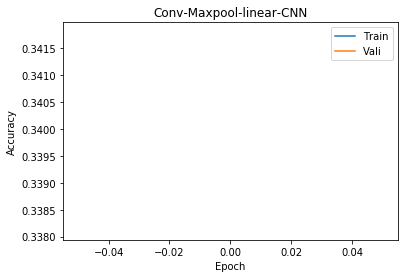

Test Accu: 0.3418
Epoch:  8


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.894
[1, 40000] loss: 1.892
Training Accu:  0.344075
Validation Accu:  0.3552
Finish Traning
Test 0 th batch, 358 correct, tested 1000, batch size 1000
Test 1 th batch, 711 correct, tested 2000, batch size 1000
Test 2 th batch, 1067 correct, tested 3000, batch size 1000
Test 3 th batch, 1430 correct, tested 4000, batch size 1000
Test 4 th batch, 1764 correct, tested 5000, batch size 1000
Test 5 th batch, 2096 correct, tested 6000, batch size 1000
Test 6 th batch, 2446 correct, tested 7000, batch size 1000
Test 7 th batch, 2792 correct, tested 8000, batch size 1000
Test 8 th batch, 3134 correct, tested 9000, batch size 1000
Test 9 th batch, 3488 correct, tested 10000, batch size 1000


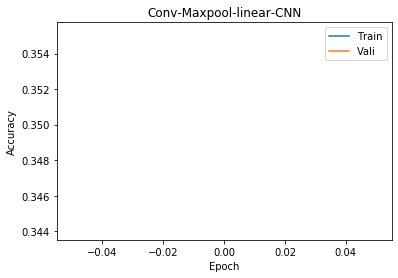

Test Accu: 0.3488
Epoch:  9


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.876
[1, 40000] loss: 1.878
Training Accu:  0.3499
Validation Accu:  0.3504
Finish Traning
Test 0 th batch, 363 correct, tested 1000, batch size 1000
Test 1 th batch, 717 correct, tested 2000, batch size 1000
Test 2 th batch, 1078 correct, tested 3000, batch size 1000
Test 3 th batch, 1448 correct, tested 4000, batch size 1000
Test 4 th batch, 1787 correct, tested 5000, batch size 1000
Test 5 th batch, 2126 correct, tested 6000, batch size 1000
Test 6 th batch, 2480 correct, tested 7000, batch size 1000
Test 7 th batch, 2831 correct, tested 8000, batch size 1000
Test 8 th batch, 3167 correct, tested 9000, batch size 1000
Test 9 th batch, 3511 correct, tested 10000, batch size 1000


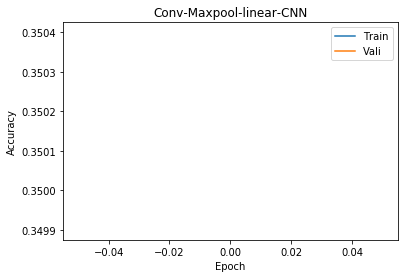

Test Accu: 0.3511
Epoch:  10


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.874
[1, 40000] loss: 1.856
Training Accu:  0.35465
Validation Accu:  0.3594
Finish Traning
Test 0 th batch, 363 correct, tested 1000, batch size 1000
Test 1 th batch, 729 correct, tested 2000, batch size 1000
Test 2 th batch, 1095 correct, tested 3000, batch size 1000
Test 3 th batch, 1472 correct, tested 4000, batch size 1000
Test 4 th batch, 1821 correct, tested 5000, batch size 1000
Test 5 th batch, 2163 correct, tested 6000, batch size 1000
Test 6 th batch, 2522 correct, tested 7000, batch size 1000
Test 7 th batch, 2872 correct, tested 8000, batch size 1000
Test 8 th batch, 3223 correct, tested 9000, batch size 1000
Test 9 th batch, 3580 correct, tested 10000, batch size 1000


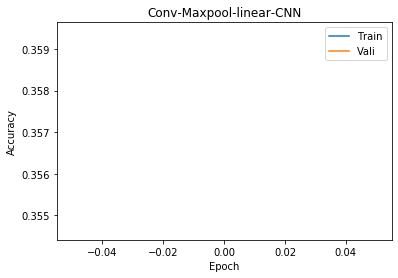

Test Accu: 0.358
Epoch:  11


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.849
[1, 40000] loss: 1.851
Training Accu:  0.359425
Validation Accu:  0.358
Finish Traning
Test 0 th batch, 362 correct, tested 1000, batch size 1000
Test 1 th batch, 726 correct, tested 2000, batch size 1000
Test 2 th batch, 1091 correct, tested 3000, batch size 1000
Test 3 th batch, 1460 correct, tested 4000, batch size 1000
Test 4 th batch, 1808 correct, tested 5000, batch size 1000
Test 5 th batch, 2154 correct, tested 6000, batch size 1000
Test 6 th batch, 2508 correct, tested 7000, batch size 1000
Test 7 th batch, 2858 correct, tested 8000, batch size 1000
Test 8 th batch, 3210 correct, tested 9000, batch size 1000
Test 9 th batch, 3568 correct, tested 10000, batch size 1000


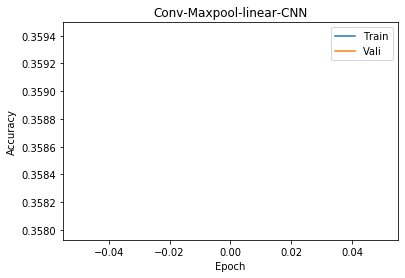

Test Accu: 0.358
Epoch:  12


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.840
[1, 40000] loss: 1.844
Training Accu:  0.362475
Validation Accu:  0.3614
Finish Traning
Test 0 th batch, 373 correct, tested 1000, batch size 1000
Test 1 th batch, 742 correct, tested 2000, batch size 1000
Test 2 th batch, 1111 correct, tested 3000, batch size 1000
Test 3 th batch, 1497 correct, tested 4000, batch size 1000
Test 4 th batch, 1853 correct, tested 5000, batch size 1000
Test 5 th batch, 2201 correct, tested 6000, batch size 1000
Test 6 th batch, 2564 correct, tested 7000, batch size 1000
Test 7 th batch, 2913 correct, tested 8000, batch size 1000
Test 8 th batch, 3258 correct, tested 9000, batch size 1000
Test 9 th batch, 3618 correct, tested 10000, batch size 1000


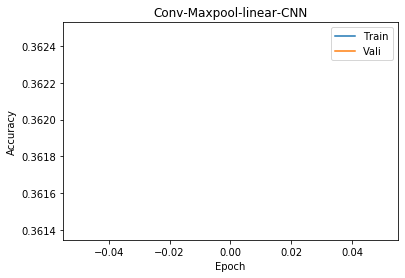

Test Accu: 0.3618
Epoch:  13


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.836
[1, 40000] loss: 1.836
Training Accu:  0.3635
Validation Accu:  0.3661
Finish Traning
Test 0 th batch, 372 correct, tested 1000, batch size 1000
Test 1 th batch, 747 correct, tested 2000, batch size 1000
Test 2 th batch, 1124 correct, tested 3000, batch size 1000
Test 3 th batch, 1504 correct, tested 4000, batch size 1000
Test 4 th batch, 1863 correct, tested 5000, batch size 1000
Test 5 th batch, 2210 correct, tested 6000, batch size 1000
Test 6 th batch, 2570 correct, tested 7000, batch size 1000
Test 7 th batch, 2931 correct, tested 8000, batch size 1000
Test 8 th batch, 3280 correct, tested 9000, batch size 1000
Test 9 th batch, 3643 correct, tested 10000, batch size 1000


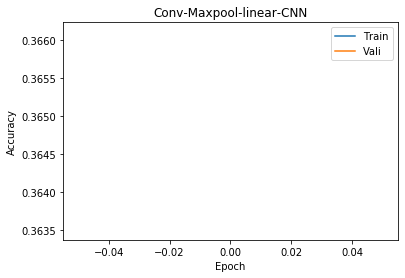

Test Accu: 0.3643
Epoch:  14


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.829
[1, 40000] loss: 1.828
Training Accu:  0.36535
Validation Accu:  0.3742
Finish Traning
Test 0 th batch, 373 correct, tested 1000, batch size 1000
Test 1 th batch, 750 correct, tested 2000, batch size 1000
Test 2 th batch, 1120 correct, tested 3000, batch size 1000
Test 3 th batch, 1504 correct, tested 4000, batch size 1000
Test 4 th batch, 1875 correct, tested 5000, batch size 1000
Test 5 th batch, 2232 correct, tested 6000, batch size 1000
Test 6 th batch, 2599 correct, tested 7000, batch size 1000
Test 7 th batch, 2961 correct, tested 8000, batch size 1000
Test 8 th batch, 3320 correct, tested 9000, batch size 1000
Test 9 th batch, 3680 correct, tested 10000, batch size 1000


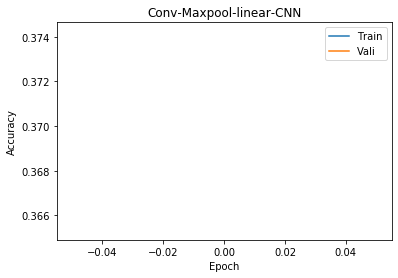

Test Accu: 0.368
Epoch:  15


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.823
[1, 40000] loss: 1.816
Training Accu:  0.3695
Validation Accu:  0.3731
Finish Traning
Test 0 th batch, 371 correct, tested 1000, batch size 1000
Test 1 th batch, 743 correct, tested 2000, batch size 1000
Test 2 th batch, 1112 correct, tested 3000, batch size 1000
Test 3 th batch, 1500 correct, tested 4000, batch size 1000
Test 4 th batch, 1864 correct, tested 5000, batch size 1000
Test 5 th batch, 2216 correct, tested 6000, batch size 1000
Test 6 th batch, 2583 correct, tested 7000, batch size 1000
Test 7 th batch, 2942 correct, tested 8000, batch size 1000
Test 8 th batch, 3294 correct, tested 9000, batch size 1000
Test 9 th batch, 3667 correct, tested 10000, batch size 1000


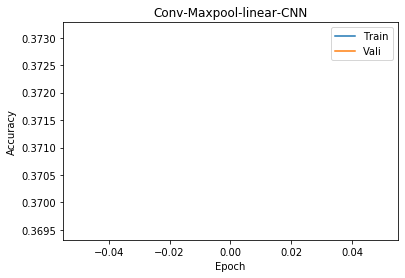

Test Accu: 0.368
Epoch:  16


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.812
[1, 40000] loss: 1.814
Training Accu:  0.372425
Validation Accu:  0.375
Finish Traning
Test 0 th batch, 369 correct, tested 1000, batch size 1000
Test 1 th batch, 757 correct, tested 2000, batch size 1000
Test 2 th batch, 1128 correct, tested 3000, batch size 1000
Test 3 th batch, 1522 correct, tested 4000, batch size 1000
Test 4 th batch, 1899 correct, tested 5000, batch size 1000
Test 5 th batch, 2265 correct, tested 6000, batch size 1000
Test 6 th batch, 2643 correct, tested 7000, batch size 1000
Test 7 th batch, 3010 correct, tested 8000, batch size 1000
Test 8 th batch, 3362 correct, tested 9000, batch size 1000
Test 9 th batch, 3741 correct, tested 10000, batch size 1000


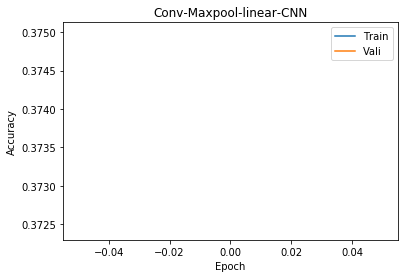

Test Accu: 0.3741
Epoch:  17


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.809
[1, 40000] loss: 1.800
Training Accu:  0.375175
Validation Accu:  0.3708
Finish Traning
Test 0 th batch, 386 correct, tested 1000, batch size 1000
Test 1 th batch, 763 correct, tested 2000, batch size 1000
Test 2 th batch, 1145 correct, tested 3000, batch size 1000
Test 3 th batch, 1533 correct, tested 4000, batch size 1000
Test 4 th batch, 1915 correct, tested 5000, batch size 1000
Test 5 th batch, 2284 correct, tested 6000, batch size 1000
Test 6 th batch, 2663 correct, tested 7000, batch size 1000
Test 7 th batch, 3035 correct, tested 8000, batch size 1000
Test 8 th batch, 3398 correct, tested 9000, batch size 1000
Test 9 th batch, 3777 correct, tested 10000, batch size 1000


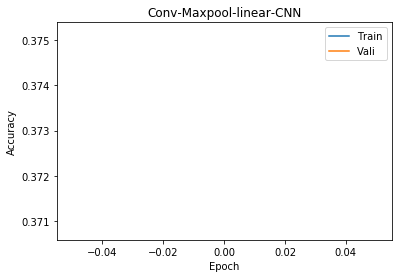

Test Accu: 0.3777
Epoch:  18


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.803
[1, 40000] loss: 1.789
Training Accu:  0.3754
Validation Accu:  0.3807
Finish Traning
Test 0 th batch, 380 correct, tested 1000, batch size 1000
Test 1 th batch, 766 correct, tested 2000, batch size 1000
Test 2 th batch, 1146 correct, tested 3000, batch size 1000
Test 3 th batch, 1545 correct, tested 4000, batch size 1000
Test 4 th batch, 1927 correct, tested 5000, batch size 1000
Test 5 th batch, 2301 correct, tested 6000, batch size 1000
Test 6 th batch, 2683 correct, tested 7000, batch size 1000
Test 7 th batch, 3059 correct, tested 8000, batch size 1000
Test 8 th batch, 3426 correct, tested 9000, batch size 1000
Test 9 th batch, 3809 correct, tested 10000, batch size 1000


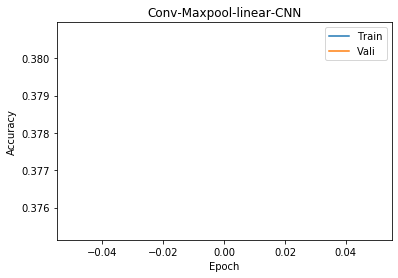

Test Accu: 0.3809
Epoch:  19


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.807
[1, 40000] loss: 1.785
Training Accu:  0.3766
Validation Accu:  0.3858
Finish Traning
Test 0 th batch, 375 correct, tested 1000, batch size 1000
Test 1 th batch, 764 correct, tested 2000, batch size 1000
Test 2 th batch, 1137 correct, tested 3000, batch size 1000
Test 3 th batch, 1533 correct, tested 4000, batch size 1000
Test 4 th batch, 1914 correct, tested 5000, batch size 1000
Test 5 th batch, 2286 correct, tested 6000, batch size 1000
Test 6 th batch, 2669 correct, tested 7000, batch size 1000
Test 7 th batch, 3038 correct, tested 8000, batch size 1000
Test 8 th batch, 3403 correct, tested 9000, batch size 1000
Test 9 th batch, 3783 correct, tested 10000, batch size 1000


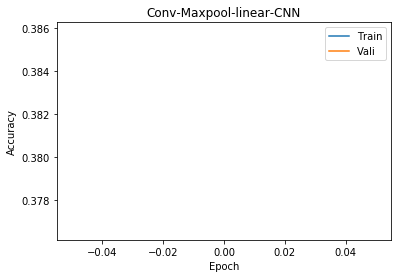

Test Accu: 0.3809
Epoch:  20


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.788
[1, 40000] loss: 1.784
Training Accu:  0.381475
Validation Accu:  0.3798
Finish Traning
Test 0 th batch, 376 correct, tested 1000, batch size 1000
Test 1 th batch, 764 correct, tested 2000, batch size 1000
Test 2 th batch, 1154 correct, tested 3000, batch size 1000
Test 3 th batch, 1556 correct, tested 4000, batch size 1000
Test 4 th batch, 1950 correct, tested 5000, batch size 1000
Test 5 th batch, 2329 correct, tested 6000, batch size 1000
Test 6 th batch, 2720 correct, tested 7000, batch size 1000
Test 7 th batch, 3096 correct, tested 8000, batch size 1000
Test 8 th batch, 3464 correct, tested 9000, batch size 1000
Test 9 th batch, 3843 correct, tested 10000, batch size 1000


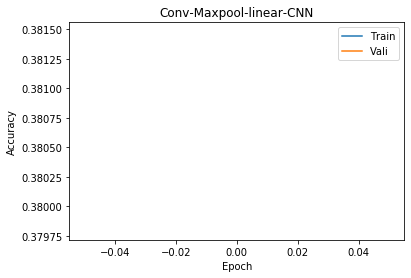

Test Accu: 0.3843
Epoch:  21


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.784
[1, 40000] loss: 1.781
Training Accu:  0.383975
Validation Accu:  0.3807
Finish Traning
Test 0 th batch, 375 correct, tested 1000, batch size 1000
Test 1 th batch, 761 correct, tested 2000, batch size 1000
Test 2 th batch, 1144 correct, tested 3000, batch size 1000
Test 3 th batch, 1540 correct, tested 4000, batch size 1000
Test 4 th batch, 1936 correct, tested 5000, batch size 1000
Test 5 th batch, 2311 correct, tested 6000, batch size 1000
Test 6 th batch, 2691 correct, tested 7000, batch size 1000
Test 7 th batch, 3065 correct, tested 8000, batch size 1000
Test 8 th batch, 3444 correct, tested 9000, batch size 1000
Test 9 th batch, 3824 correct, tested 10000, batch size 1000


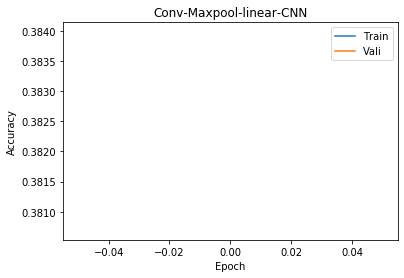

Test Accu: 0.3843
Epoch:  22


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.772
[1, 40000] loss: 1.777
Training Accu:  0.382325
Validation Accu:  0.3857
Finish Traning
Test 0 th batch, 383 correct, tested 1000, batch size 1000
Test 1 th batch, 776 correct, tested 2000, batch size 1000
Test 2 th batch, 1165 correct, tested 3000, batch size 1000
Test 3 th batch, 1562 correct, tested 4000, batch size 1000
Test 4 th batch, 1959 correct, tested 5000, batch size 1000
Test 5 th batch, 2340 correct, tested 6000, batch size 1000
Test 6 th batch, 2722 correct, tested 7000, batch size 1000
Test 7 th batch, 3101 correct, tested 8000, batch size 1000
Test 8 th batch, 3475 correct, tested 9000, batch size 1000
Test 9 th batch, 3852 correct, tested 10000, batch size 1000


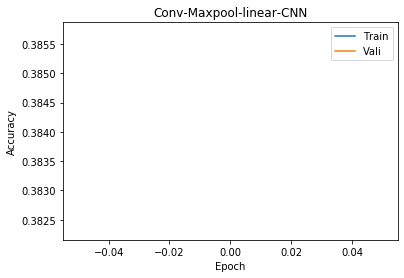

Test Accu: 0.3852
Epoch:  23


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.781
[1, 40000] loss: 1.766
Training Accu:  0.3839
Validation Accu:  0.3911
Finish Traning
Test 0 th batch, 381 correct, tested 1000, batch size 1000
Test 1 th batch, 775 correct, tested 2000, batch size 1000
Test 2 th batch, 1161 correct, tested 3000, batch size 1000
Test 3 th batch, 1566 correct, tested 4000, batch size 1000
Test 4 th batch, 1958 correct, tested 5000, batch size 1000
Test 5 th batch, 2340 correct, tested 6000, batch size 1000
Test 6 th batch, 2720 correct, tested 7000, batch size 1000
Test 7 th batch, 3106 correct, tested 8000, batch size 1000
Test 8 th batch, 3487 correct, tested 9000, batch size 1000
Test 9 th batch, 3861 correct, tested 10000, batch size 1000


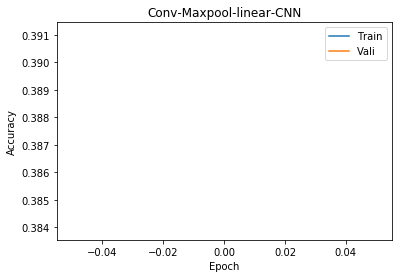

Test Accu: 0.3861
Epoch:  24


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.771
[1, 40000] loss: 1.757
Training Accu:  0.3889
Validation Accu:  0.3791
Finish Traning
Test 0 th batch, 381 correct, tested 1000, batch size 1000
Test 1 th batch, 764 correct, tested 2000, batch size 1000
Test 2 th batch, 1146 correct, tested 3000, batch size 1000
Test 3 th batch, 1541 correct, tested 4000, batch size 1000
Test 4 th batch, 1940 correct, tested 5000, batch size 1000
Test 5 th batch, 2318 correct, tested 6000, batch size 1000
Test 6 th batch, 2700 correct, tested 7000, batch size 1000
Test 7 th batch, 3083 correct, tested 8000, batch size 1000
Test 8 th batch, 3450 correct, tested 9000, batch size 1000
Test 9 th batch, 3832 correct, tested 10000, batch size 1000


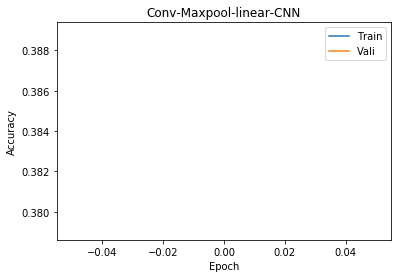

Test Accu: 0.3861
Epoch:  25


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.756
[1, 40000] loss: 1.765
Training Accu:  0.39025
Validation Accu:  0.3822
Finish Traning
Test 0 th batch, 371 correct, tested 1000, batch size 1000
Test 1 th batch, 763 correct, tested 2000, batch size 1000
Test 2 th batch, 1149 correct, tested 3000, batch size 1000
Test 3 th batch, 1554 correct, tested 4000, batch size 1000
Test 4 th batch, 1955 correct, tested 5000, batch size 1000
Test 5 th batch, 2338 correct, tested 6000, batch size 1000
Test 6 th batch, 2723 correct, tested 7000, batch size 1000
Test 7 th batch, 3110 correct, tested 8000, batch size 1000
Test 8 th batch, 3490 correct, tested 9000, batch size 1000
Test 9 th batch, 3877 correct, tested 10000, batch size 1000


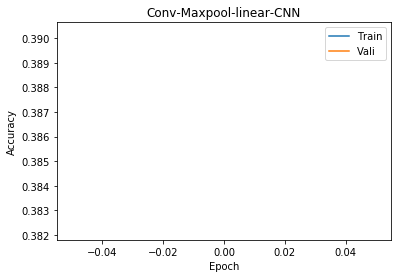

Test Accu: 0.3877
Epoch:  26


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.767
[1, 40000] loss: 1.757
Training Accu:  0.390675
Validation Accu:  0.3919
Finish Traning
Test 0 th batch, 378 correct, tested 1000, batch size 1000
Test 1 th batch, 776 correct, tested 2000, batch size 1000
Test 2 th batch, 1162 correct, tested 3000, batch size 1000
Test 3 th batch, 1569 correct, tested 4000, batch size 1000
Test 4 th batch, 1966 correct, tested 5000, batch size 1000
Test 5 th batch, 2350 correct, tested 6000, batch size 1000
Test 6 th batch, 2731 correct, tested 7000, batch size 1000
Test 7 th batch, 3113 correct, tested 8000, batch size 1000
Test 8 th batch, 3493 correct, tested 9000, batch size 1000
Test 9 th batch, 3879 correct, tested 10000, batch size 1000


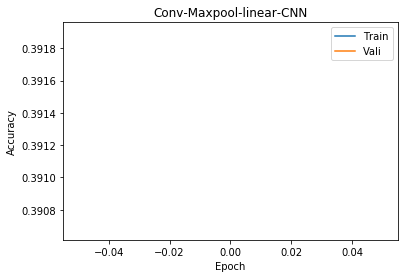

Test Accu: 0.3879
Epoch:  27


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.756
[1, 40000] loss: 1.764
Training Accu:  0.3896
Validation Accu:  0.3961
Finish Traning
Test 0 th batch, 380 correct, tested 1000, batch size 1000
Test 1 th batch, 768 correct, tested 2000, batch size 1000
Test 2 th batch, 1158 correct, tested 3000, batch size 1000
Test 3 th batch, 1566 correct, tested 4000, batch size 1000
Test 4 th batch, 1965 correct, tested 5000, batch size 1000
Test 5 th batch, 2343 correct, tested 6000, batch size 1000
Test 6 th batch, 2722 correct, tested 7000, batch size 1000
Test 7 th batch, 3109 correct, tested 8000, batch size 1000
Test 8 th batch, 3493 correct, tested 9000, batch size 1000
Test 9 th batch, 3880 correct, tested 10000, batch size 1000


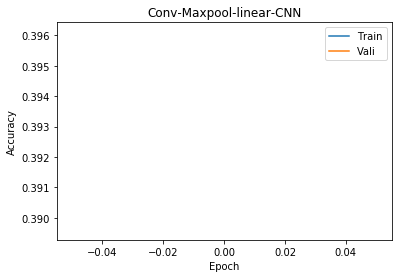

Test Accu: 0.388
Epoch:  28


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.756
[1, 40000] loss: 1.751
Training Accu:  0.393075
Validation Accu:  0.394
Finish Traning
Test 0 th batch, 386 correct, tested 1000, batch size 1000
Test 1 th batch, 786 correct, tested 2000, batch size 1000
Test 2 th batch, 1166 correct, tested 3000, batch size 1000
Test 3 th batch, 1575 correct, tested 4000, batch size 1000
Test 4 th batch, 1963 correct, tested 5000, batch size 1000
Test 5 th batch, 2353 correct, tested 6000, batch size 1000
Test 6 th batch, 2738 correct, tested 7000, batch size 1000
Test 7 th batch, 3126 correct, tested 8000, batch size 1000
Test 8 th batch, 3514 correct, tested 9000, batch size 1000
Test 9 th batch, 3898 correct, tested 10000, batch size 1000


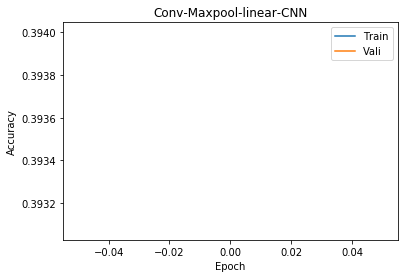

Test Accu: 0.3898
Epoch:  29


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.747
[1, 40000] loss: 1.749
Training Accu:  0.3944
Validation Accu:  0.3907
Finish Traning
Test 0 th batch, 390 correct, tested 1000, batch size 1000
Test 1 th batch, 789 correct, tested 2000, batch size 1000
Test 2 th batch, 1177 correct, tested 3000, batch size 1000
Test 3 th batch, 1590 correct, tested 4000, batch size 1000
Test 4 th batch, 1991 correct, tested 5000, batch size 1000
Test 5 th batch, 2378 correct, tested 6000, batch size 1000
Test 6 th batch, 2771 correct, tested 7000, batch size 1000
Test 7 th batch, 3162 correct, tested 8000, batch size 1000
Test 8 th batch, 3558 correct, tested 9000, batch size 1000
Test 9 th batch, 3944 correct, tested 10000, batch size 1000


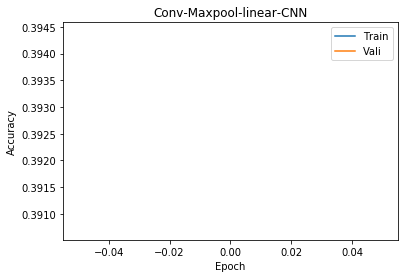

Test Accu: 0.3944
Epoch:  30


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.742
[1, 40000] loss: 1.755
Training Accu:  0.3942
Validation Accu:  0.3956
Finish Traning
Test 0 th batch, 388 correct, tested 1000, batch size 1000
Test 1 th batch, 786 correct, tested 2000, batch size 1000
Test 2 th batch, 1172 correct, tested 3000, batch size 1000
Test 3 th batch, 1585 correct, tested 4000, batch size 1000
Test 4 th batch, 1986 correct, tested 5000, batch size 1000
Test 5 th batch, 2375 correct, tested 6000, batch size 1000
Test 6 th batch, 2760 correct, tested 7000, batch size 1000
Test 7 th batch, 3155 correct, tested 8000, batch size 1000
Test 8 th batch, 3542 correct, tested 9000, batch size 1000
Test 9 th batch, 3931 correct, tested 10000, batch size 1000


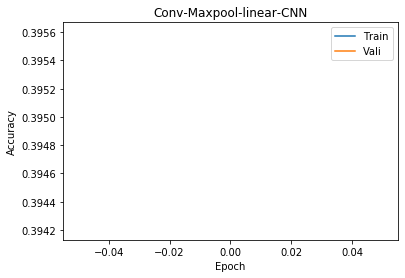

Test Accu: 0.3944
Epoch:  31


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.754
[1, 40000] loss: 1.736
Training Accu:  0.395175
Validation Accu:  0.3997
Finish Traning
Test 0 th batch, 384 correct, tested 1000, batch size 1000
Test 1 th batch, 789 correct, tested 2000, batch size 1000
Test 2 th batch, 1181 correct, tested 3000, batch size 1000
Test 3 th batch, 1595 correct, tested 4000, batch size 1000
Test 4 th batch, 1992 correct, tested 5000, batch size 1000
Test 5 th batch, 2379 correct, tested 6000, batch size 1000
Test 6 th batch, 2770 correct, tested 7000, batch size 1000
Test 7 th batch, 3164 correct, tested 8000, batch size 1000
Test 8 th batch, 3551 correct, tested 9000, batch size 1000
Test 9 th batch, 3933 correct, tested 10000, batch size 1000


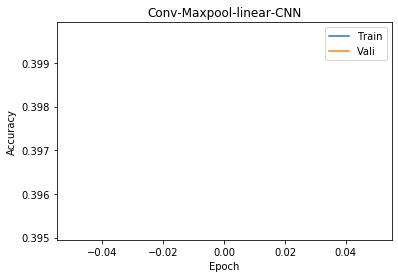

Test Accu: 0.3944
Epoch:  32


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.745
[1, 40000] loss: 1.738
Training Accu:  0.3956
Validation Accu:  0.4006
Finish Traning
Test 0 th batch, 387 correct, tested 1000, batch size 1000
Test 1 th batch, 791 correct, tested 2000, batch size 1000
Test 2 th batch, 1180 correct, tested 3000, batch size 1000
Test 3 th batch, 1596 correct, tested 4000, batch size 1000
Test 4 th batch, 2002 correct, tested 5000, batch size 1000
Test 5 th batch, 2393 correct, tested 6000, batch size 1000
Test 6 th batch, 2784 correct, tested 7000, batch size 1000
Test 7 th batch, 3184 correct, tested 8000, batch size 1000
Test 8 th batch, 3571 correct, tested 9000, batch size 1000
Test 9 th batch, 3961 correct, tested 10000, batch size 1000


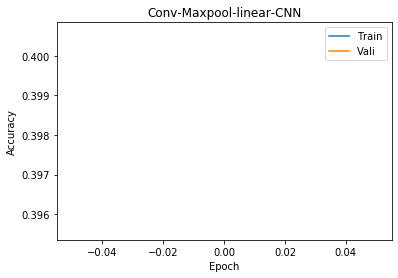

Test Accu: 0.3961
Epoch:  33


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.730
[1, 40000] loss: 1.742
Training Accu:  0.399
Validation Accu:  0.3965
Finish Traning
Test 0 th batch, 385 correct, tested 1000, batch size 1000
Test 1 th batch, 789 correct, tested 2000, batch size 1000
Test 2 th batch, 1181 correct, tested 3000, batch size 1000
Test 3 th batch, 1597 correct, tested 4000, batch size 1000
Test 4 th batch, 1999 correct, tested 5000, batch size 1000
Test 5 th batch, 2386 correct, tested 6000, batch size 1000
Test 6 th batch, 2774 correct, tested 7000, batch size 1000
Test 7 th batch, 3170 correct, tested 8000, batch size 1000
Test 8 th batch, 3563 correct, tested 9000, batch size 1000
Test 9 th batch, 3950 correct, tested 10000, batch size 1000


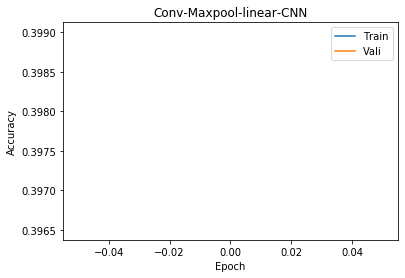

Test Accu: 0.3961
Epoch:  34


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.738
[1, 40000] loss: 1.740
Training Accu:  0.3977
Validation Accu:  0.4052
Finish Traning
Test 0 th batch, 385 correct, tested 1000, batch size 1000
Test 1 th batch, 796 correct, tested 2000, batch size 1000
Test 2 th batch, 1187 correct, tested 3000, batch size 1000
Test 3 th batch, 1602 correct, tested 4000, batch size 1000
Test 4 th batch, 2002 correct, tested 5000, batch size 1000
Test 5 th batch, 2397 correct, tested 6000, batch size 1000
Test 6 th batch, 2787 correct, tested 7000, batch size 1000
Test 7 th batch, 3182 correct, tested 8000, batch size 1000
Test 8 th batch, 3572 correct, tested 9000, batch size 1000
Test 9 th batch, 3957 correct, tested 10000, batch size 1000


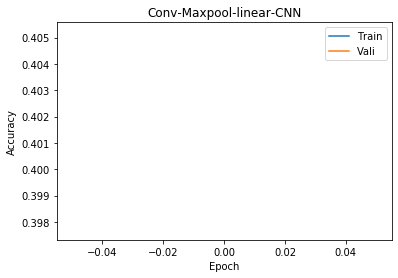

Test Accu: 0.3961
Epoch:  35


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.726
[1, 40000] loss: 1.732
Training Accu:  0.400375
Validation Accu:  0.3982
Finish Traning
Test 0 th batch, 388 correct, tested 1000, batch size 1000
Test 1 th batch, 797 correct, tested 2000, batch size 1000
Test 2 th batch, 1190 correct, tested 3000, batch size 1000
Test 3 th batch, 1604 correct, tested 4000, batch size 1000
Test 4 th batch, 2008 correct, tested 5000, batch size 1000
Test 5 th batch, 2399 correct, tested 6000, batch size 1000
Test 6 th batch, 2791 correct, tested 7000, batch size 1000
Test 7 th batch, 3203 correct, tested 8000, batch size 1000
Test 8 th batch, 3592 correct, tested 9000, batch size 1000
Test 9 th batch, 3986 correct, tested 10000, batch size 1000


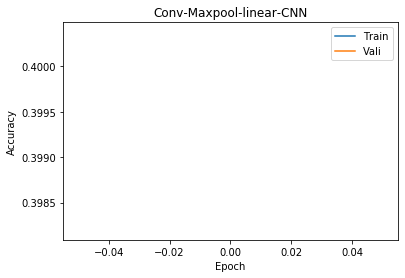

Test Accu: 0.3986
Epoch:  36


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.722
[1, 40000] loss: 1.736
Training Accu:  0.400075
Validation Accu:  0.4051
Finish Traning
Test 0 th batch, 388 correct, tested 1000, batch size 1000
Test 1 th batch, 804 correct, tested 2000, batch size 1000
Test 2 th batch, 1206 correct, tested 3000, batch size 1000
Test 3 th batch, 1625 correct, tested 4000, batch size 1000
Test 4 th batch, 2024 correct, tested 5000, batch size 1000
Test 5 th batch, 2414 correct, tested 6000, batch size 1000
Test 6 th batch, 2812 correct, tested 7000, batch size 1000
Test 7 th batch, 3217 correct, tested 8000, batch size 1000
Test 8 th batch, 3613 correct, tested 9000, batch size 1000
Test 9 th batch, 4004 correct, tested 10000, batch size 1000


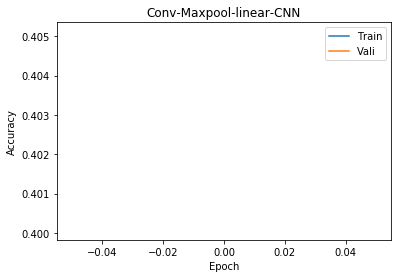

Test Accu: 0.4004
Epoch:  37


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.729
[1, 40000] loss: 1.730
Training Accu:  0.401725
Validation Accu:  0.4059
Finish Traning
Test 0 th batch, 391 correct, tested 1000, batch size 1000
Test 1 th batch, 802 correct, tested 2000, batch size 1000
Test 2 th batch, 1202 correct, tested 3000, batch size 1000
Test 3 th batch, 1621 correct, tested 4000, batch size 1000
Test 4 th batch, 2017 correct, tested 5000, batch size 1000
Test 5 th batch, 2415 correct, tested 6000, batch size 1000
Test 6 th batch, 2810 correct, tested 7000, batch size 1000
Test 7 th batch, 3217 correct, tested 8000, batch size 1000
Test 8 th batch, 3611 correct, tested 9000, batch size 1000
Test 9 th batch, 4000 correct, tested 10000, batch size 1000


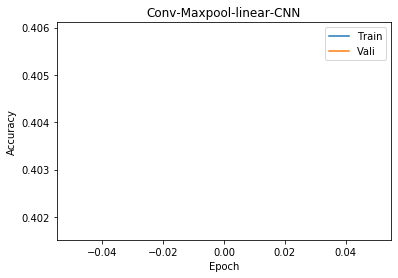

Test Accu: 0.4004
Epoch:  38


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.723
[1, 40000] loss: 1.722
Training Accu:  0.402825
Validation Accu:  0.4056
Finish Traning
Test 0 th batch, 386 correct, tested 1000, batch size 1000
Test 1 th batch, 801 correct, tested 2000, batch size 1000
Test 2 th batch, 1201 correct, tested 3000, batch size 1000
Test 3 th batch, 1621 correct, tested 4000, batch size 1000
Test 4 th batch, 2023 correct, tested 5000, batch size 1000
Test 5 th batch, 2421 correct, tested 6000, batch size 1000
Test 6 th batch, 2823 correct, tested 7000, batch size 1000
Test 7 th batch, 3224 correct, tested 8000, batch size 1000
Test 8 th batch, 3620 correct, tested 9000, batch size 1000
Test 9 th batch, 4011 correct, tested 10000, batch size 1000


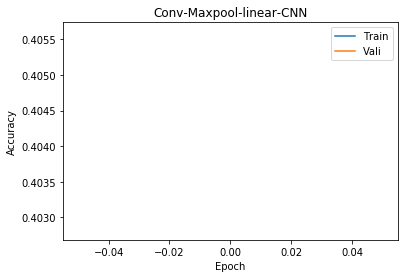

Test Accu: 0.4011
Epoch:  39


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.722
[1, 40000] loss: 1.714
Training Accu:  0.4056
Validation Accu:  0.3957
Finish Traning
Test 0 th batch, 392 correct, tested 1000, batch size 1000
Test 1 th batch, 810 correct, tested 2000, batch size 1000
Test 2 th batch, 1211 correct, tested 3000, batch size 1000
Test 3 th batch, 1628 correct, tested 4000, batch size 1000
Test 4 th batch, 2034 correct, tested 5000, batch size 1000
Test 5 th batch, 2438 correct, tested 6000, batch size 1000
Test 6 th batch, 2839 correct, tested 7000, batch size 1000
Test 7 th batch, 3241 correct, tested 8000, batch size 1000
Test 8 th batch, 3632 correct, tested 9000, batch size 1000
Test 9 th batch, 4018 correct, tested 10000, batch size 1000


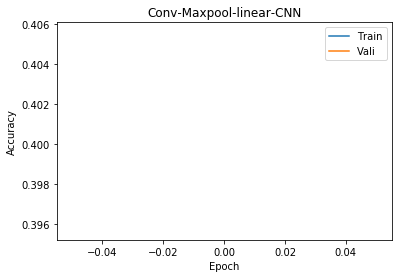

Test Accu: 0.4018
Epoch:  40


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.714
[1, 40000] loss: 1.724
Training Accu:  0.4045
Validation Accu:  0.4064
Finish Traning
Test 0 th batch, 382 correct, tested 1000, batch size 1000
Test 1 th batch, 800 correct, tested 2000, batch size 1000
Test 2 th batch, 1212 correct, tested 3000, batch size 1000
Test 3 th batch, 1633 correct, tested 4000, batch size 1000
Test 4 th batch, 2041 correct, tested 5000, batch size 1000
Test 5 th batch, 2435 correct, tested 6000, batch size 1000
Test 6 th batch, 2835 correct, tested 7000, batch size 1000
Test 7 th batch, 3241 correct, tested 8000, batch size 1000
Test 8 th batch, 3634 correct, tested 9000, batch size 1000
Test 9 th batch, 4026 correct, tested 10000, batch size 1000


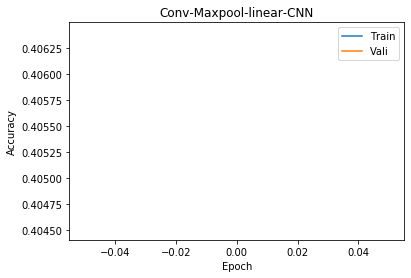

Test Accu: 0.4026
Epoch:  41


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.705
[1, 40000] loss: 1.728
Training Accu:  0.4052
Validation Accu:  0.4007
Finish Traning
Test 0 th batch, 385 correct, tested 1000, batch size 1000
Test 1 th batch, 813 correct, tested 2000, batch size 1000
Test 2 th batch, 1220 correct, tested 3000, batch size 1000
Test 3 th batch, 1644 correct, tested 4000, batch size 1000
Test 4 th batch, 2051 correct, tested 5000, batch size 1000
Test 5 th batch, 2448 correct, tested 6000, batch size 1000
Test 6 th batch, 2845 correct, tested 7000, batch size 1000
Test 7 th batch, 3256 correct, tested 8000, batch size 1000
Test 8 th batch, 3645 correct, tested 9000, batch size 1000
Test 9 th batch, 4040 correct, tested 10000, batch size 1000


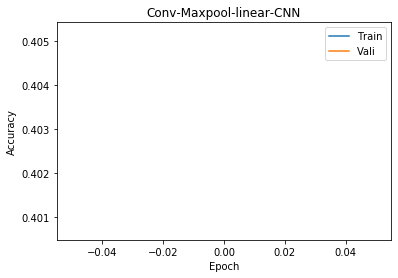

Test Accu: 0.404
Epoch:  42


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.720
[1, 40000] loss: 1.705
Training Accu:  0.406475
Validation Accu:  0.4036
Finish Traning
Test 0 th batch, 387 correct, tested 1000, batch size 1000
Test 1 th batch, 804 correct, tested 2000, batch size 1000
Test 2 th batch, 1208 correct, tested 3000, batch size 1000
Test 3 th batch, 1622 correct, tested 4000, batch size 1000
Test 4 th batch, 2020 correct, tested 5000, batch size 1000
Test 5 th batch, 2424 correct, tested 6000, batch size 1000
Test 6 th batch, 2826 correct, tested 7000, batch size 1000
Test 7 th batch, 3234 correct, tested 8000, batch size 1000
Test 8 th batch, 3634 correct, tested 9000, batch size 1000
Test 9 th batch, 4030 correct, tested 10000, batch size 1000


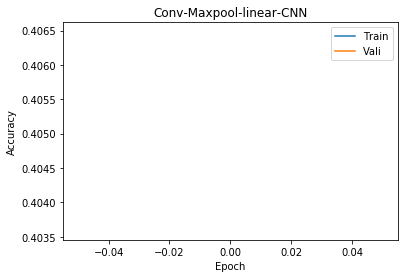

Test Accu: 0.404
Epoch:  43


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.710
[1, 40000] loss: 1.715
Training Accu:  0.4065
Validation Accu:  0.4114
Finish Traning
Test 0 th batch, 395 correct, tested 1000, batch size 1000
Test 1 th batch, 822 correct, tested 2000, batch size 1000
Test 2 th batch, 1235 correct, tested 3000, batch size 1000
Test 3 th batch, 1651 correct, tested 4000, batch size 1000
Test 4 th batch, 2052 correct, tested 5000, batch size 1000
Test 5 th batch, 2451 correct, tested 6000, batch size 1000
Test 6 th batch, 2853 correct, tested 7000, batch size 1000
Test 7 th batch, 3261 correct, tested 8000, batch size 1000
Test 8 th batch, 3663 correct, tested 9000, batch size 1000
Test 9 th batch, 4060 correct, tested 10000, batch size 1000


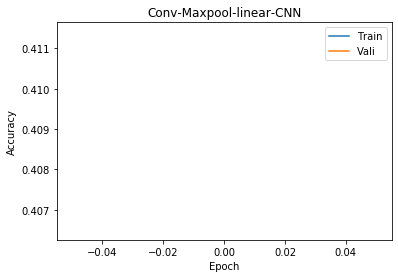

Test Accu: 0.406
Epoch:  44


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.702
[1, 40000] loss: 1.718
Training Accu:  0.408825
Validation Accu:  0.4043
Finish Traning
Test 0 th batch, 390 correct, tested 1000, batch size 1000
Test 1 th batch, 807 correct, tested 2000, batch size 1000
Test 2 th batch, 1212 correct, tested 3000, batch size 1000
Test 3 th batch, 1639 correct, tested 4000, batch size 1000
Test 4 th batch, 2045 correct, tested 5000, batch size 1000
Test 5 th batch, 2451 correct, tested 6000, batch size 1000
Test 6 th batch, 2855 correct, tested 7000, batch size 1000
Test 7 th batch, 3265 correct, tested 8000, batch size 1000
Test 8 th batch, 3662 correct, tested 9000, batch size 1000
Test 9 th batch, 4053 correct, tested 10000, batch size 1000


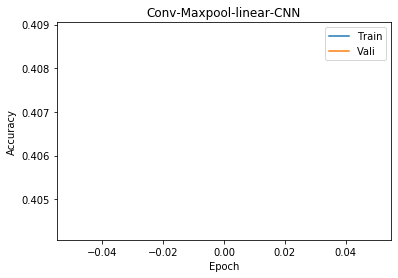

Test Accu: 0.406
Epoch:  45


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.699
[1, 40000] loss: 1.716
Training Accu:  0.408475
Validation Accu:  0.4084
Finish Traning
Test 0 th batch, 390 correct, tested 1000, batch size 1000
Test 1 th batch, 813 correct, tested 2000, batch size 1000
Test 2 th batch, 1223 correct, tested 3000, batch size 1000
Test 3 th batch, 1655 correct, tested 4000, batch size 1000
Test 4 th batch, 2057 correct, tested 5000, batch size 1000
Test 5 th batch, 2464 correct, tested 6000, batch size 1000
Test 6 th batch, 2862 correct, tested 7000, batch size 1000
Test 7 th batch, 3268 correct, tested 8000, batch size 1000
Test 8 th batch, 3666 correct, tested 9000, batch size 1000
Test 9 th batch, 4060 correct, tested 10000, batch size 1000


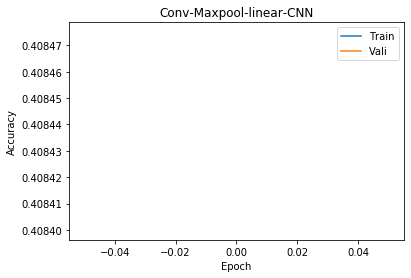

Test Accu: 0.406
Epoch:  46


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.701
[1, 40000] loss: 1.710
Training Accu:  0.409825
Validation Accu:  0.4077
Finish Traning
Test 0 th batch, 386 correct, tested 1000, batch size 1000
Test 1 th batch, 814 correct, tested 2000, batch size 1000
Test 2 th batch, 1227 correct, tested 3000, batch size 1000
Test 3 th batch, 1652 correct, tested 4000, batch size 1000
Test 4 th batch, 2056 correct, tested 5000, batch size 1000
Test 5 th batch, 2457 correct, tested 6000, batch size 1000
Test 6 th batch, 2861 correct, tested 7000, batch size 1000
Test 7 th batch, 3279 correct, tested 8000, batch size 1000
Test 8 th batch, 3678 correct, tested 9000, batch size 1000
Test 9 th batch, 4073 correct, tested 10000, batch size 1000


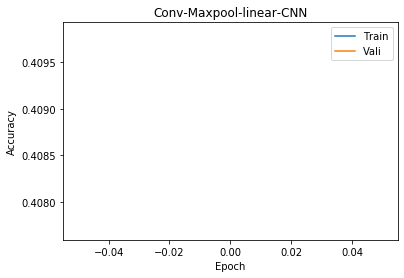

Test Accu: 0.4073
Epoch:  47


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.699
[1, 40000] loss: 1.711
Training Accu:  0.4107
Validation Accu:  0.411
Finish Traning
Test 0 th batch, 392 correct, tested 1000, batch size 1000
Test 1 th batch, 813 correct, tested 2000, batch size 1000
Test 2 th batch, 1231 correct, tested 3000, batch size 1000
Test 3 th batch, 1656 correct, tested 4000, batch size 1000
Test 4 th batch, 2071 correct, tested 5000, batch size 1000
Test 5 th batch, 2470 correct, tested 6000, batch size 1000
Test 6 th batch, 2867 correct, tested 7000, batch size 1000
Test 7 th batch, 3282 correct, tested 8000, batch size 1000
Test 8 th batch, 3679 correct, tested 9000, batch size 1000
Test 9 th batch, 4076 correct, tested 10000, batch size 1000


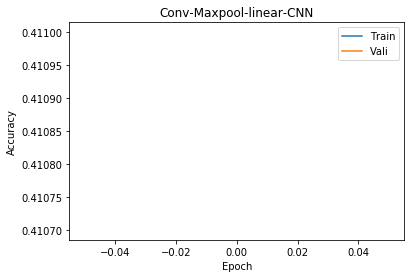

Test Accu: 0.4076
Epoch:  48


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.699
[1, 40000] loss: 1.708
Training Accu:  0.410775
Validation Accu:  0.4161
Finish Traning
Test 0 th batch, 392 correct, tested 1000, batch size 1000
Test 1 th batch, 815 correct, tested 2000, batch size 1000
Test 2 th batch, 1228 correct, tested 3000, batch size 1000
Test 3 th batch, 1656 correct, tested 4000, batch size 1000
Test 4 th batch, 2061 correct, tested 5000, batch size 1000
Test 5 th batch, 2467 correct, tested 6000, batch size 1000
Test 6 th batch, 2872 correct, tested 7000, batch size 1000
Test 7 th batch, 3281 correct, tested 8000, batch size 1000
Test 8 th batch, 3680 correct, tested 9000, batch size 1000
Test 9 th batch, 4084 correct, tested 10000, batch size 1000


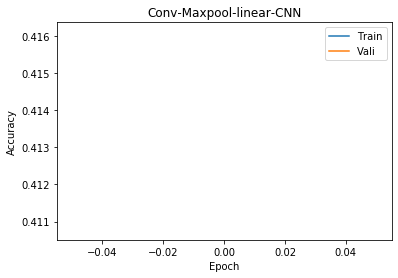

Test Accu: 0.4084
Epoch:  49


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.705
[1, 40000] loss: 1.697
Training Accu:  0.4129
Validation Accu:  0.4155
Finish Traning
Test 0 th batch, 400 correct, tested 1000, batch size 1000
Test 1 th batch, 827 correct, tested 2000, batch size 1000
Test 2 th batch, 1243 correct, tested 3000, batch size 1000
Test 3 th batch, 1663 correct, tested 4000, batch size 1000
Test 4 th batch, 2082 correct, tested 5000, batch size 1000
Test 5 th batch, 2482 correct, tested 6000, batch size 1000
Test 6 th batch, 2882 correct, tested 7000, batch size 1000
Test 7 th batch, 3303 correct, tested 8000, batch size 1000
Test 8 th batch, 3704 correct, tested 9000, batch size 1000
Test 9 th batch, 4102 correct, tested 10000, batch size 1000


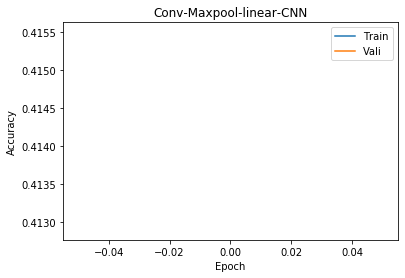

Test Accu: 0.4102
Epoch:  50


C:\Miniconda\envs\py37_pytorch\lib\site-packages\torch\nn\functional.py:1569: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


[1, 20000] loss: 1.698
[1, 40000] loss: 1.702
Training Accu:  0.412175
Validation Accu:  0.4197
Finish Traning
Test 0 th batch, 396 correct, tested 1000, batch size 1000
Test 1 th batch, 827 correct, tested 2000, batch size 1000
Test 2 th batch, 1245 correct, tested 3000, batch size 1000
Test 3 th batch, 1666 correct, tested 4000, batch size 1000
Test 4 th batch, 2080 correct, tested 5000, batch size 1000
Test 5 th batch, 2485 correct, tested 6000, batch size 1000
Test 6 th batch, 2881 correct, tested 7000, batch size 1000
Test 7 th batch, 3297 correct, tested 8000, batch size 1000
Test 8 th batch, 3697 correct, tested 9000, batch size 1000
Test 9 th batch, 4105 correct, tested 10000, batch size 1000


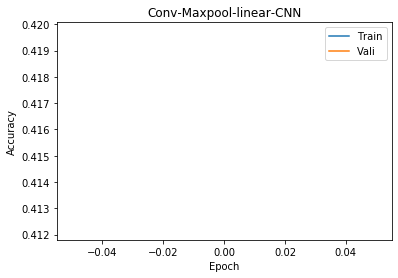

Test Accu: 0.4105


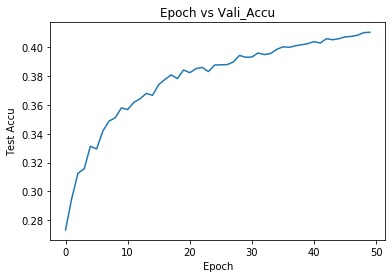

In [28]:
# fine tune A4b to higher accu with 100 epochs
accu_test_list = []
accu_test = 0
itera = 0
batch_size = 1000
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)


model = OneHiddenLayer(300)
# define optimizer
optimizer = torch.optim.SGD(model.parameters(), 
                            lr=0.005, 
                            momentum=0.9)
while itera < 50:
    print("Epoch: ", itera+1)


    model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                                 model=model, 
                                                 optimizer=optimizer, 
                                                 testloader=testloader,
                                                 epochs=1, 
                                                 batch_print_num=20, 
                                                 batch_size=batch_size, 
                                                 title="Conv-Maxpool-linear-CNN")
    accu_test_list.append(test_accu)
    if test_accu > accu_test:
        accu_test = test_accu
    print("Test Accu:", accu_test)
    itera += 1

# plot epoch vs test
plt.plot(range(len(accu_test_list)), accu_test_list)
plt.xlabel("Epoch")
plt.ylabel("Test Accu")
plt.title("Epoch vs Vali_Accu")
plt.show()


## A5c

-  **torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode='zeros')**
- in_channels (int) – Number of channels in the input image
- out_channels (int) – Number of channels produced by the convolution
- kernel_size (int or tuple) – Size of the convolving kernel
- stride (int or tuple, optional) – Stride of the convolution. (Default: 1)
- padding (int or tuple, optional) – Zero-padding added to both sides of the input (Default: 0)
- padding_mode (string, optional) – zeros
- dilation (int or tuple, optional) – Spacing between kernel elements. (Default: 1)
- groups (int, optional) – Number of blocked connections from input to output channels. (Default: 1)
- bias (bool, optional) – If True, adds a learnable bias to the output. (Default: True)
- Visualize https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md


In [3]:
%%time
# Convolutional layer with max-pool and fully-connected output
class CNN(torch.nn.Module):
    def __init__(self, M,k,N):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=M, kernel_size=k)
        self.linear1 = torch.nn.Linear(M*(int((33-k)/N))**2, 10)
        self.N = N
        self.M = M
        self.k = k
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, (self.N, self.N))
        x = x.view(1000, -1)
#         print(M*(int((33-k)/N))**2, x.size())
        x = self.linear1(x)
        return x 

Wall time: 1e+03 µs


## A5d Fine tune Previous Network

Files already downloaded and verified
Files already downloaded and verified
lr:  0.001 , momen:  0.3 M:  50 k:  5 N:  4
[1, 20000] loss: 2.308
[1, 40000] loss: 2.287
Training Accu:  0.108025
Validation Accu:  0.1398
[2, 20000] loss: 2.266
[2, 40000] loss: 2.252
Training Accu:  0.16225
Validation Accu:  0.1871
Finish Traning
Test 0 th batch, 176 correct, tested 1000, batch size 1000
Test 1 th batch, 373 correct, tested 2000, batch size 1000
Test 2 th batch, 565 correct, tested 3000, batch size 1000
Test 3 th batch, 755 correct, tested 4000, batch size 1000
Test 4 th batch, 950 correct, tested 5000, batch size 1000
Test 5 th batch, 1127 correct, tested 6000, batch size 1000
Test 6 th batch, 1298 correct, tested 7000, batch size 1000
Test 7 th batch, 1487 correct, tested 8000, batch size 1000
Test 8 th batch, 1657 correct, tested 9000, batch size 1000
Test 9 th batch, 1858 correct, tested 10000, batch size 1000


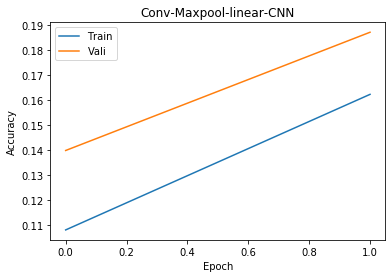

Vali Accu:  0.1871 Best vali:  0.1871 Test Accu:  0.1858 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  50 k:  5 N:  7
[1, 20000] loss: 2.323
[1, 40000] loss: 2.308
Training Accu:  0.119225
Validation Accu:  0.1288
[2, 20000] loss: 2.294
[2, 40000] loss: 2.284
Training Accu:  0.13615
Validation Accu:  0.1413
Finish Traning
Test 0 th batch, 153 correct, tested 1000, batch size 1000
Test 1 th batch, 303 correct, tested 2000, batch size 1000
Test 2 th batch, 432 correct, tested 3000, batch size 1000
Test 3 th batch, 572 correct, tested 4000, batch size 1000
Test 4 th batch, 713 correct, tested 5000, batch size 1000
Test 5 th batch, 852 correct, tested 6000, batch size 1000
Test 6 th batch, 999 correct, tested 7000, batch size 1000
Test 7 th batch, 1164 correct, tested 8000, batch size 1000
Test 8 th batch, 1315 correct, tested 9000, batch size 1000
Test 9 th batch, 1467 correct, tested 10000, batch size 1000


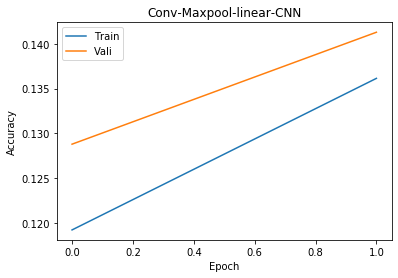

Vali Accu:  0.1413 Best vali:  0.1871 Test Accu:  0.1467 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  50 k:  5 N:  14
[1, 20000] loss: 2.329
[1, 40000] loss: 2.317
Training Accu:  0.144725
Validation Accu:  0.1442
[2, 20000] loss: 2.310
[2, 40000] loss: 2.299
Training Accu:  0.152825
Validation Accu:  0.1515
Finish Traning
Test 0 th batch, 156 correct, tested 1000, batch size 1000
Test 1 th batch, 324 correct, tested 2000, batch size 1000
Test 2 th batch, 482 correct, tested 3000, batch size 1000
Test 3 th batch, 621 correct, tested 4000, batch size 1000
Test 4 th batch, 765 correct, tested 5000, batch size 1000
Test 5 th batch, 924 correct, tested 6000, batch size 1000
Test 6 th batch, 1094 correct, tested 7000, batch size 1000
Test 7 th batch, 1242 correct, tested 8000, batch size 1000
Test 8 th batch, 1387 correct, tested 9000, batch size 1000
Test 9 th batch, 1545 correct, tested 10000, batch size 1000


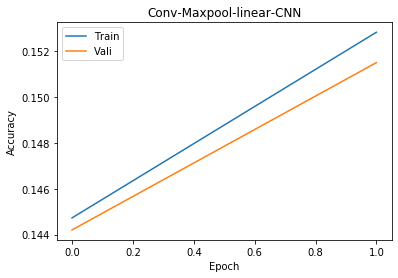

Vali Accu:  0.1515 Best vali:  0.1871 Test Accu:  0.1545 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  100 k:  5 N:  4
[1, 20000] loss: 2.290
[1, 40000] loss: 2.255
Training Accu:  0.15335
Validation Accu:  0.1966
[2, 20000] loss: 2.228
[2, 40000] loss: 2.206
Training Accu:  0.22795
Validation Accu:  0.2528
Finish Traning
Test 0 th batch, 290 correct, tested 1000, batch size 1000
Test 1 th batch, 545 correct, tested 2000, batch size 1000
Test 2 th batch, 802 correct, tested 3000, batch size 1000
Test 3 th batch, 1068 correct, tested 4000, batch size 1000
Test 4 th batch, 1310 correct, tested 5000, batch size 1000
Test 5 th batch, 1555 correct, tested 6000, batch size 1000
Test 6 th batch, 1810 correct, tested 7000, batch size 1000
Test 7 th batch, 2036 correct, tested 8000, batch size 1000
Test 8 th batch, 2282 correct, tested 9000, batch size 1000
Test 9 th batch, 2525 correct, tested 10000, batch size 1000


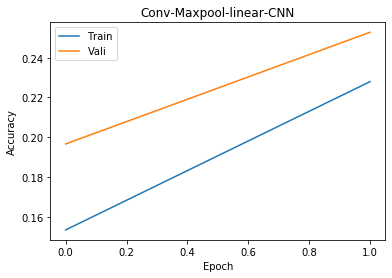

Vali Accu:  0.2528 Best vali:  0.2528 Test Accu:  0.2525 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  100 k:  5 N:  7
[1, 20000] loss: 2.304
[1, 40000] loss: 2.274
Training Accu:  0.13335
Validation Accu:  0.159
[2, 20000] loss: 2.256
[2, 40000] loss: 2.240
Training Accu:  0.176475
Validation Accu:  0.1836
Finish Traning
Test 0 th batch, 191 correct, tested 1000, batch size 1000
Test 1 th batch, 380 correct, tested 2000, batch size 1000
Test 2 th batch, 573 correct, tested 3000, batch size 1000
Test 3 th batch, 759 correct, tested 4000, batch size 1000
Test 4 th batch, 945 correct, tested 5000, batch size 1000
Test 5 th batch, 1146 correct, tested 6000, batch size 1000
Test 6 th batch, 1343 correct, tested 7000, batch size 1000
Test 7 th batch, 1538 correct, tested 8000, batch size 1000
Test 8 th batch, 1707 correct, tested 9000, batch size 1000
Test 9 th batch, 1897 correct, tested 10000, batch size 1000


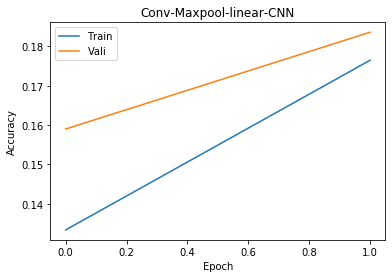

Vali Accu:  0.1836 Best vali:  0.2528 Test Accu:  0.1897 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  100 k:  5 N:  14
[1, 20000] loss: 2.330
[1, 40000] loss: 2.309
Training Accu:  0.118025
Validation Accu:  0.1307
[2, 20000] loss: 2.298
[2, 40000] loss: 2.289
Training Accu:  0.136025
Validation Accu:  0.141
Finish Traning
Test 0 th batch, 148 correct, tested 1000, batch size 1000
Test 1 th batch, 295 correct, tested 2000, batch size 1000
Test 2 th batch, 434 correct, tested 3000, batch size 1000
Test 3 th batch, 579 correct, tested 4000, batch size 1000
Test 4 th batch, 734 correct, tested 5000, batch size 1000
Test 5 th batch, 889 correct, tested 6000, batch size 1000
Test 6 th batch, 1019 correct, tested 7000, batch size 1000
Test 7 th batch, 1172 correct, tested 8000, batch size 1000
Test 8 th batch, 1340 correct, tested 9000, batch size 1000
Test 9 th batch, 1472 correct, tested 10000, batch size 1000


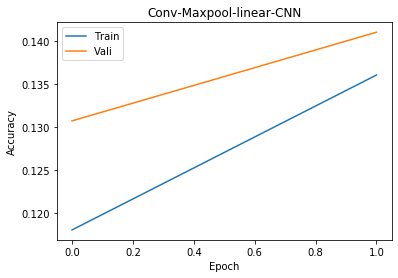

Vali Accu:  0.141 Best vali:  0.2528 Test Accu:  0.1472 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  150 k:  5 N:  4
[1, 20000] loss: 2.285
[1, 40000] loss: 2.237
Training Accu:  0.154325
Validation Accu:  0.2076
[2, 20000] loss: 2.200
[2, 40000] loss: 2.171
Training Accu:  0.2388
Validation Accu:  0.2622
Finish Traning
Test 0 th batch, 259 correct, tested 1000, batch size 1000
Test 1 th batch, 521 correct, tested 2000, batch size 1000
Test 2 th batch, 774 correct, tested 3000, batch size 1000
Test 3 th batch, 1039 correct, tested 4000, batch size 1000
Test 4 th batch, 1299 correct, tested 5000, batch size 1000
Test 5 th batch, 1555 correct, tested 6000, batch size 1000
Test 6 th batch, 1824 correct, tested 7000, batch size 1000
Test 7 th batch, 2102 correct, tested 8000, batch size 1000
Test 8 th batch, 2346 correct, tested 9000, batch size 1000
Test 9 th batch, 2600 correct, tested 10000, batch size 1000


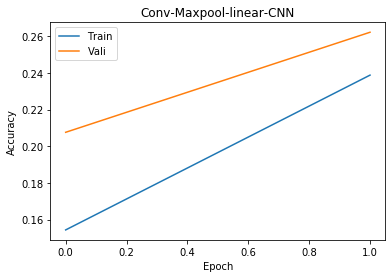

Vali Accu:  0.2622 Best vali:  0.2622 Test Accu:  0.26 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  150 k:  5 N:  7
[1, 20000] loss: 2.294
[1, 40000] loss: 2.272
Training Accu:  0.142525
Validation Accu:  0.1588
[2, 20000] loss: 2.253
[2, 40000] loss: 2.235
Training Accu:  0.184875
Validation Accu:  0.2065
Finish Traning
Test 0 th batch, 221 correct, tested 1000, batch size 1000
Test 1 th batch, 420 correct, tested 2000, batch size 1000
Test 2 th batch, 638 correct, tested 3000, batch size 1000
Test 3 th batch, 843 correct, tested 4000, batch size 1000
Test 4 th batch, 1058 correct, tested 5000, batch size 1000
Test 5 th batch, 1248 correct, tested 6000, batch size 1000
Test 6 th batch, 1440 correct, tested 7000, batch size 1000
Test 7 th batch, 1646 correct, tested 8000, batch size 1000
Test 8 th batch, 1864 correct, tested 9000, batch size 1000
Test 9 th batch, 2071 correct, tested 10000, batch size 1000


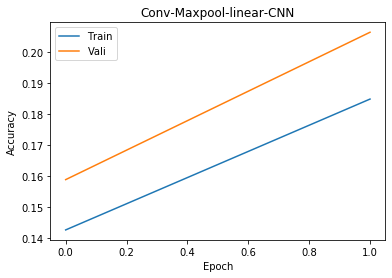

Vali Accu:  0.2065 Best vali:  0.2622 Test Accu:  0.2071 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.3 M:  150 k:  5 N:  14
[1, 20000] loss: 2.304
[1, 40000] loss: 2.291
Training Accu:  0.121575
Validation Accu:  0.1316
[2, 20000] loss: 2.283
[2, 40000] loss: 2.278
Training Accu:  0.139275
Validation Accu:  0.1539
Finish Traning
Test 0 th batch, 154 correct, tested 1000, batch size 1000
Test 1 th batch, 306 correct, tested 2000, batch size 1000
Test 2 th batch, 438 correct, tested 3000, batch size 1000
Test 3 th batch, 587 correct, tested 4000, batch size 1000
Test 4 th batch, 719 correct, tested 5000, batch size 1000
Test 5 th batch, 870 correct, tested 6000, batch size 1000
Test 6 th batch, 1025 correct, tested 7000, batch size 1000
Test 7 th batch, 1174 correct, tested 8000, batch size 1000
Test 8 th batch, 1319 correct, tested 9000, batch size 1000
Test 9 th batch, 1463 correct, tested 10000, batch size 1000


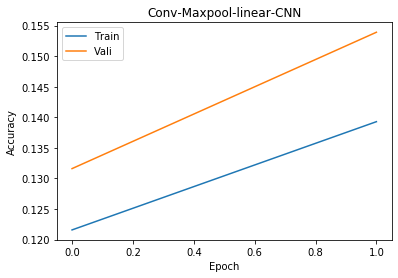

Vali Accu:  0.1539 Best vali:  0.2622 Test Accu:  0.1463 Best params:  {'lr': 0.001, 'momentum': 0.3, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  50 k:  5 N:  4
[1, 20000] loss: 2.292
[1, 40000] loss: 2.254
Training Accu:  0.141025
Validation Accu:  0.196
[2, 20000] loss: 2.224
[2, 40000] loss: 2.199
Training Accu:  0.226625
Validation Accu:  0.2628
Finish Traning
Test 0 th batch, 253 correct, tested 1000, batch size 1000
Test 1 th batch, 510 correct, tested 2000, batch size 1000
Test 2 th batch, 763 correct, tested 3000, batch size 1000
Test 3 th batch, 1027 correct, tested 4000, batch size 1000
Test 4 th batch, 1303 correct, tested 5000, batch size 1000
Test 5 th batch, 1561 correct, tested 6000, batch size 1000
Test 6 th batch, 1832 correct, tested 7000, batch size 1000
Test 7 th batch, 2094 correct, tested 8000, batch size 1000
Test 8 th batch, 2353 correct, tested 9000, batch size 1000
Test 9 th batch, 2619 correct, tested 10000, batch size 1000


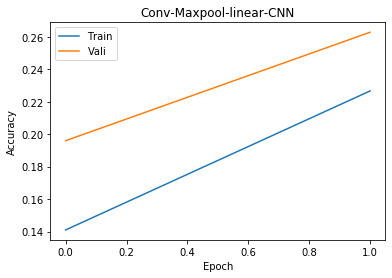

Vali Accu:  0.2628 Best vali:  0.2628 Test Accu:  0.2619 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  50 k:  5 N:  7
[1, 20000] loss: 2.321
[1, 40000] loss: 2.299
Training Accu:  0.080875
Validation Accu:  0.1016
[2, 20000] loss: 2.286
[2, 40000] loss: 2.273
Training Accu:  0.1225
Validation Accu:  0.1358
Finish Traning
Test 0 th batch, 146 correct, tested 1000, batch size 1000
Test 1 th batch, 304 correct, tested 2000, batch size 1000
Test 2 th batch, 427 correct, tested 3000, batch size 1000
Test 3 th batch, 547 correct, tested 4000, batch size 1000
Test 4 th batch, 699 correct, tested 5000, batch size 1000
Test 5 th batch, 854 correct, tested 6000, batch size 1000
Test 6 th batch, 984 correct, tested 7000, batch size 1000
Test 7 th batch, 1115 correct, tested 8000, batch size 1000
Test 8 th batch, 1256 correct, tested 9000, batch size 1000
Test 9 th batch, 1417 correct, tested 10000, batch size 1000


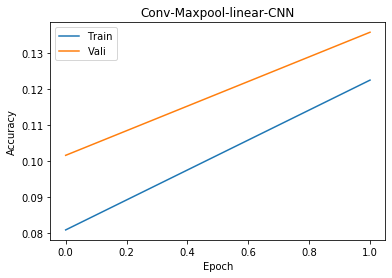

Vali Accu:  0.1358 Best vali:  0.2628 Test Accu:  0.1417 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  50 k:  5 N:  14
[1, 20000] loss: 2.373
[1, 40000] loss: 2.340
Training Accu:  0.1081
Validation Accu:  0.1118
[2, 20000] loss: 2.326
[2, 40000] loss: 2.312
Training Accu:  0.115425
Validation Accu:  0.1275
Finish Traning
Test 0 th batch, 127 correct, tested 1000, batch size 1000
Test 1 th batch, 237 correct, tested 2000, batch size 1000
Test 2 th batch, 349 correct, tested 3000, batch size 1000
Test 3 th batch, 477 correct, tested 4000, batch size 1000
Test 4 th batch, 603 correct, tested 5000, batch size 1000
Test 5 th batch, 705 correct, tested 6000, batch size 1000
Test 6 th batch, 809 correct, tested 7000, batch size 1000
Test 7 th batch, 935 correct, tested 8000, batch size 1000
Test 8 th batch, 1037 correct, tested 9000, batch size 1000
Test 9 th batch, 1161 correct, tested 10000, batch size 1000


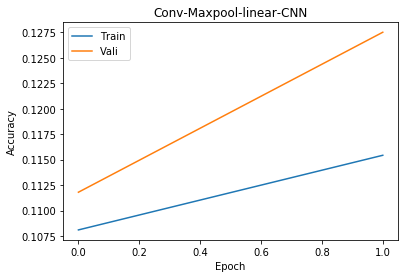

Vali Accu:  0.1275 Best vali:  0.2628 Test Accu:  0.1161 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  100 k:  5 N:  4
[1, 20000] loss: 2.274
[1, 40000] loss: 2.219
Training Accu:  0.1774
Validation Accu:  0.2444
[2, 20000] loss: 2.174
[2, 40000] loss: 2.135
Training Accu:  0.27155
Validation Accu:  0.2882
Finish Traning
Test 0 th batch, 309 correct, tested 1000, batch size 1000
Test 1 th batch, 582 correct, tested 2000, batch size 1000
Test 2 th batch, 868 correct, tested 3000, batch size 1000
Test 3 th batch, 1169 correct, tested 4000, batch size 1000
Test 4 th batch, 1471 correct, tested 5000, batch size 1000
Test 5 th batch, 1749 correct, tested 6000, batch size 1000
Test 6 th batch, 2028 correct, tested 7000, batch size 1000
Test 7 th batch, 2321 correct, tested 8000, batch size 1000
Test 8 th batch, 2603 correct, tested 9000, batch size 1000
Test 9 th batch, 2907 correct, tested 10000, batch size 1000


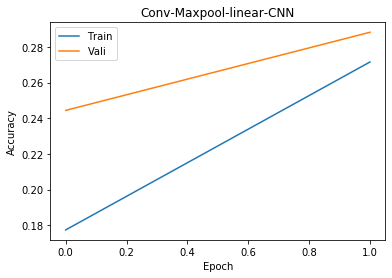

Vali Accu:  0.2882 Best vali:  0.2882 Test Accu:  0.2907 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  100 k:  5 N:  7
[1, 20000] loss: 2.315
[1, 40000] loss: 2.283
Training Accu:  0.119525
Validation Accu:  0.1624
[2, 20000] loss: 2.257
[2, 40000] loss: 2.234
Training Accu:  0.193475
Validation Accu:  0.2258
Finish Traning
Test 0 th batch, 235 correct, tested 1000, batch size 1000
Test 1 th batch, 469 correct, tested 2000, batch size 1000
Test 2 th batch, 694 correct, tested 3000, batch size 1000
Test 3 th batch, 895 correct, tested 4000, batch size 1000
Test 4 th batch, 1117 correct, tested 5000, batch size 1000
Test 5 th batch, 1357 correct, tested 6000, batch size 1000
Test 6 th batch, 1563 correct, tested 7000, batch size 1000
Test 7 th batch, 1786 correct, tested 8000, batch size 1000
Test 8 th batch, 2002 correct, tested 9000, batch size 1000
Test 9 th batch, 2246 correct, tested 10000, batch size 1000


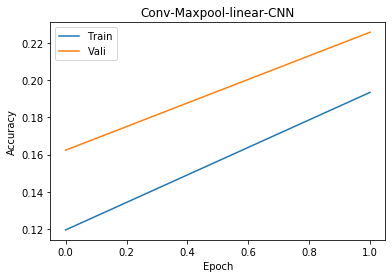

Vali Accu:  0.2258 Best vali:  0.2882 Test Accu:  0.2246 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  100 k:  5 N:  14
[1, 20000] loss: 2.364
[1, 40000] loss: 2.325
Training Accu:  0.081725
Validation Accu:  0.0855
[2, 20000] loss: 2.305
[2, 40000] loss: 2.295
Training Accu:  0.097575
Validation Accu:  0.1135
Finish Traning
Test 0 th batch, 121 correct, tested 1000, batch size 1000
Test 1 th batch, 226 correct, tested 2000, batch size 1000
Test 2 th batch, 315 correct, tested 3000, batch size 1000
Test 3 th batch, 443 correct, tested 4000, batch size 1000
Test 4 th batch, 559 correct, tested 5000, batch size 1000
Test 5 th batch, 676 correct, tested 6000, batch size 1000
Test 6 th batch, 790 correct, tested 7000, batch size 1000
Test 7 th batch, 923 correct, tested 8000, batch size 1000
Test 8 th batch, 1041 correct, tested 9000, batch size 1000
Test 9 th batch, 1183 correct, tested 10000, batch size 1000


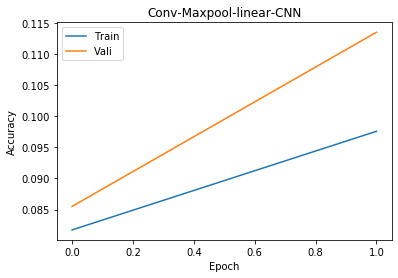

Vali Accu:  0.1135 Best vali:  0.2882 Test Accu:  0.1183 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  150 k:  5 N:  4
[1, 20000] loss: 2.269
[1, 40000] loss: 2.189
Training Accu:  0.190325
Validation Accu:  0.2482
[2, 20000] loss: 2.135
[2, 40000] loss: 2.094
Training Accu:  0.274375
Validation Accu:  0.2956
Finish Traning
Test 0 th batch, 324 correct, tested 1000, batch size 1000
Test 1 th batch, 612 correct, tested 2000, batch size 1000
Test 2 th batch, 896 correct, tested 3000, batch size 1000
Test 3 th batch, 1193 correct, tested 4000, batch size 1000
Test 4 th batch, 1489 correct, tested 5000, batch size 1000
Test 5 th batch, 1775 correct, tested 6000, batch size 1000
Test 6 th batch, 2083 correct, tested 7000, batch size 1000
Test 7 th batch, 2380 correct, tested 8000, batch size 1000
Test 8 th batch, 2666 correct, tested 9000, batch size 1000
Test 9 th batch, 2968 correct, tested 10000, batch size 1000


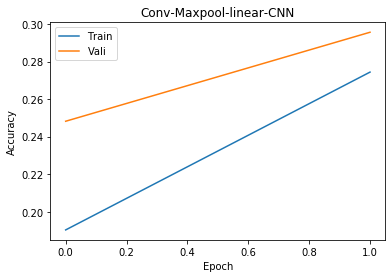

Vali Accu:  0.2956 Best vali:  0.2956 Test Accu:  0.2968 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  150 k:  5 N:  7
[1, 20000] loss: 2.293
[1, 40000] loss: 2.250
Training Accu:  0.149375
Validation Accu:  0.197
[2, 20000] loss: 2.222
[2, 40000] loss: 2.198
Training Accu:  0.22775
Validation Accu:  0.2558
Finish Traning
Test 0 th batch, 243 correct, tested 1000, batch size 1000
Test 1 th batch, 497 correct, tested 2000, batch size 1000
Test 2 th batch, 757 correct, tested 3000, batch size 1000
Test 3 th batch, 1005 correct, tested 4000, batch size 1000
Test 4 th batch, 1275 correct, tested 5000, batch size 1000
Test 5 th batch, 1556 correct, tested 6000, batch size 1000
Test 6 th batch, 1811 correct, tested 7000, batch size 1000
Test 7 th batch, 2059 correct, tested 8000, batch size 1000
Test 8 th batch, 2308 correct, tested 9000, batch size 1000
Test 9 th batch, 2569 correct, tested 10000, batch size 1000


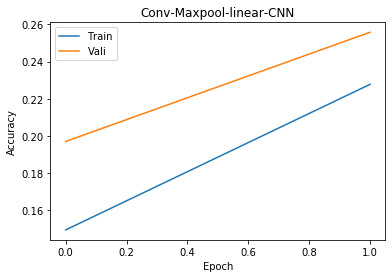

Vali Accu:  0.2558 Best vali:  0.2956 Test Accu:  0.2569 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.6 M:  150 k:  5 N:  14
[1, 20000] loss: 2.325
[1, 40000] loss: 2.299
Training Accu:  0.092725
Validation Accu:  0.0966
[2, 20000] loss: 2.282
[2, 40000] loss: 2.275
Training Accu:  0.115
Validation Accu:  0.1312
Finish Traning
Test 0 th batch, 122 correct, tested 1000, batch size 1000
Test 1 th batch, 245 correct, tested 2000, batch size 1000
Test 2 th batch, 387 correct, tested 3000, batch size 1000
Test 3 th batch, 544 correct, tested 4000, batch size 1000
Test 4 th batch, 685 correct, tested 5000, batch size 1000
Test 5 th batch, 789 correct, tested 6000, batch size 1000
Test 6 th batch, 908 correct, tested 7000, batch size 1000
Test 7 th batch, 1039 correct, tested 8000, batch size 1000
Test 8 th batch, 1161 correct, tested 9000, batch size 1000
Test 9 th batch, 1280 correct, tested 10000, batch size 1000


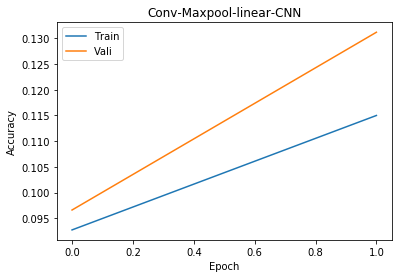

Vali Accu:  0.1312 Best vali:  0.2956 Test Accu:  0.128 Best params:  {'lr': 0.001, 'momentum': 0.6, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  50 k:  5 N:  4
[1, 20000] loss: 2.283
[1, 40000] loss: 2.184
Training Accu:  0.182175
Validation Accu:  0.2587
[2, 20000] loss: 2.105
[2, 40000] loss: 2.053
Training Accu:  0.287825
Validation Accu:  0.317
Finish Traning
Test 0 th batch, 318 correct, tested 1000, batch size 1000
Test 1 th batch, 617 correct, tested 2000, batch size 1000
Test 2 th batch, 937 correct, tested 3000, batch size 1000
Test 3 th batch, 1248 correct, tested 4000, batch size 1000
Test 4 th batch, 1569 correct, tested 5000, batch size 1000
Test 5 th batch, 1864 correct, tested 6000, batch size 1000
Test 6 th batch, 2172 correct, tested 7000, batch size 1000
Test 7 th batch, 2473 correct, tested 8000, batch size 1000
Test 8 th batch, 2778 correct, tested 9000, batch size 1000
Test 9 th batch, 3105 correct, tested 10000, batch size 1000


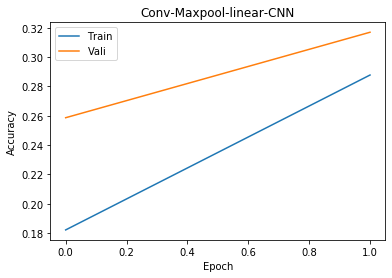

Vali Accu:  0.317 Best vali:  0.317 Test Accu:  0.3105 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  50 k:  5 N:  7
[1, 20000] loss: 2.312
[1, 40000] loss: 2.263
Training Accu:  0.13185
Validation Accu:  0.1861
[2, 20000] loss: 2.219
[2, 40000] loss: 2.182
Training Accu:  0.222125
Validation Accu:  0.2481
Finish Traning
Test 0 th batch, 279 correct, tested 1000, batch size 1000
Test 1 th batch, 514 correct, tested 2000, batch size 1000
Test 2 th batch, 774 correct, tested 3000, batch size 1000
Test 3 th batch, 1009 correct, tested 4000, batch size 1000
Test 4 th batch, 1259 correct, tested 5000, batch size 1000
Test 5 th batch, 1513 correct, tested 6000, batch size 1000
Test 6 th batch, 1779 correct, tested 7000, batch size 1000
Test 7 th batch, 2028 correct, tested 8000, batch size 1000
Test 8 th batch, 2276 correct, tested 9000, batch size 1000
Test 9 th batch, 2542 correct, tested 10000, batch size 1000


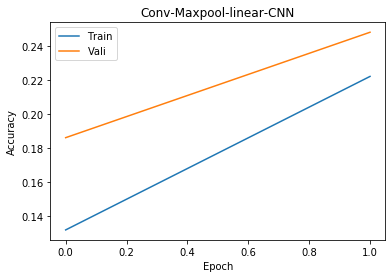

Vali Accu:  0.2481 Best vali:  0.317 Test Accu:  0.2542 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  50 k:  5 N:  14
[1, 20000] loss: 2.316
[1, 40000] loss: 2.286
Training Accu:  0.123525
Validation Accu:  0.13
[2, 20000] loss: 2.269
[2, 40000] loss: 2.256
Training Accu:  0.1442
Validation Accu:  0.1595
Finish Traning
Test 0 th batch, 160 correct, tested 1000, batch size 1000
Test 1 th batch, 322 correct, tested 2000, batch size 1000
Test 2 th batch, 454 correct, tested 3000, batch size 1000
Test 3 th batch, 627 correct, tested 4000, batch size 1000
Test 4 th batch, 794 correct, tested 5000, batch size 1000
Test 5 th batch, 956 correct, tested 6000, batch size 1000
Test 6 th batch, 1130 correct, tested 7000, batch size 1000
Test 7 th batch, 1288 correct, tested 8000, batch size 1000
Test 8 th batch, 1427 correct, tested 9000, batch size 1000
Test 9 th batch, 1588 correct, tested 10000, batch size 1000


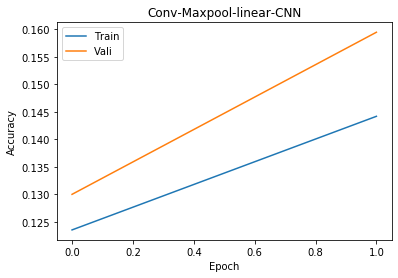

Vali Accu:  0.1595 Best vali:  0.317 Test Accu:  0.1588 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  100 k:  5 N:  4
[1, 20000] loss: 2.239
[1, 40000] loss: 2.104
Training Accu:  0.227925
Validation Accu:  0.2994
[2, 20000] loss: 2.020
[2, 40000] loss: 1.961
Training Accu:  0.31345
Validation Accu:  0.3293
Finish Traning
Test 0 th batch, 361 correct, tested 1000, batch size 1000
Test 1 th batch, 682 correct, tested 2000, batch size 1000
Test 2 th batch, 1022 correct, tested 3000, batch size 1000
Test 3 th batch, 1356 correct, tested 4000, batch size 1000
Test 4 th batch, 1708 correct, tested 5000, batch size 1000
Test 5 th batch, 2032 correct, tested 6000, batch size 1000
Test 6 th batch, 2366 correct, tested 7000, batch size 1000
Test 7 th batch, 2695 correct, tested 8000, batch size 1000
Test 8 th batch, 3023 correct, tested 9000, batch size 1000
Test 9 th batch, 3376 correct, tested 10000, batch size 1000


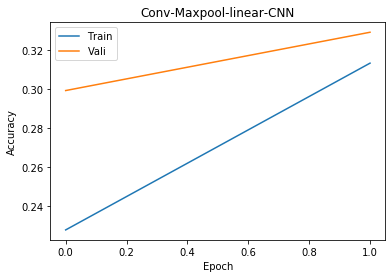

Vali Accu:  0.3293 Best vali:  0.3293 Test Accu:  0.3376 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  100 k:  5 N:  7
[1, 20000] loss: 2.276
[1, 40000] loss: 2.201
Training Accu:  0.177725
Validation Accu:  0.2507
[2, 20000] loss: 2.135
[2, 40000] loss: 2.084
Training Accu:  0.284425
Validation Accu:  0.2977
Finish Traning
Test 0 th batch, 321 correct, tested 1000, batch size 1000
Test 1 th batch, 613 correct, tested 2000, batch size 1000
Test 2 th batch, 915 correct, tested 3000, batch size 1000
Test 3 th batch, 1233 correct, tested 4000, batch size 1000
Test 4 th batch, 1534 correct, tested 5000, batch size 1000
Test 5 th batch, 1811 correct, tested 6000, batch size 1000
Test 6 th batch, 2110 correct, tested 7000, batch size 1000
Test 7 th batch, 2403 correct, tested 8000, batch size 1000
Test 8 th batch, 2693 correct, tested 9000, batch size 1000
Test 9 th batch, 2979 correct, tested 10000, batch size 1000


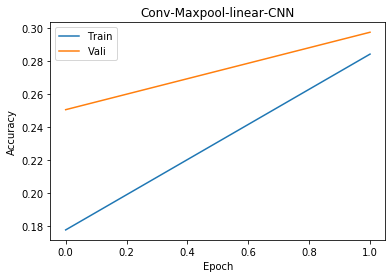

Vali Accu:  0.2977 Best vali:  0.3293 Test Accu:  0.2979 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  100 k:  5 N:  14
[1, 20000] loss: 2.313
[1, 40000] loss: 2.287
Training Accu:  0.1082
Validation Accu:  0.1244
[2, 20000] loss: 2.268
[2, 40000] loss: 2.248
Training Accu:  0.1551
Validation Accu:  0.1808
Finish Traning
Test 0 th batch, 167 correct, tested 1000, batch size 1000
Test 1 th batch, 330 correct, tested 2000, batch size 1000
Test 2 th batch, 504 correct, tested 3000, batch size 1000
Test 3 th batch, 697 correct, tested 4000, batch size 1000
Test 4 th batch, 890 correct, tested 5000, batch size 1000
Test 5 th batch, 1053 correct, tested 6000, batch size 1000
Test 6 th batch, 1226 correct, tested 7000, batch size 1000
Test 7 th batch, 1405 correct, tested 8000, batch size 1000
Test 8 th batch, 1582 correct, tested 9000, batch size 1000
Test 9 th batch, 1762 correct, tested 10000, batch size 1000


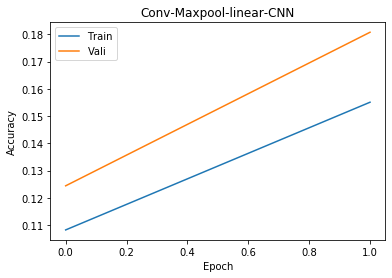

Vali Accu:  0.1808 Best vali:  0.3293 Test Accu:  0.1762 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  150 k:  5 N:  4
[1, 20000] loss: 2.231
[1, 40000] loss: 2.074
Training Accu:  0.240325
Validation Accu:  0.3017
[2, 20000] loss: 1.982
[2, 40000] loss: 1.917
Training Accu:  0.334075
Validation Accu:  0.3469
Finish Traning
Test 0 th batch, 389 correct, tested 1000, batch size 1000
Test 1 th batch, 749 correct, tested 2000, batch size 1000
Test 2 th batch, 1110 correct, tested 3000, batch size 1000
Test 3 th batch, 1464 correct, tested 4000, batch size 1000
Test 4 th batch, 1836 correct, tested 5000, batch size 1000
Test 5 th batch, 2172 correct, tested 6000, batch size 1000
Test 6 th batch, 2532 correct, tested 7000, batch size 1000
Test 7 th batch, 2885 correct, tested 8000, batch size 1000
Test 8 th batch, 3229 correct, tested 9000, batch size 1000
Test 9 th batch, 3594 correct, tested 10000, batch size 1000


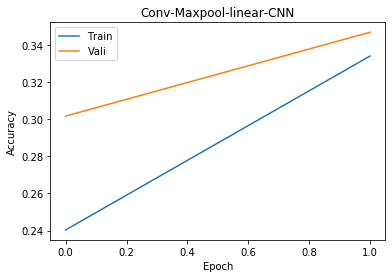

Vali Accu:  0.3469 Best vali:  0.3469 Test Accu:  0.3594 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  150 k:  5 N:  7
[1, 20000] loss: 2.294
[1, 40000] loss: 2.190
Training Accu:  0.173025
Validation Accu:  0.2707
[2, 20000] loss: 2.112
[2, 40000] loss: 2.050
Training Accu:  0.2907
Validation Accu:  0.3131
Finish Traning
Test 0 th batch, 333 correct, tested 1000, batch size 1000
Test 1 th batch, 636 correct, tested 2000, batch size 1000
Test 2 th batch, 944 correct, tested 3000, batch size 1000
Test 3 th batch, 1261 correct, tested 4000, batch size 1000
Test 4 th batch, 1597 correct, tested 5000, batch size 1000
Test 5 th batch, 1898 correct, tested 6000, batch size 1000
Test 6 th batch, 2214 correct, tested 7000, batch size 1000
Test 7 th batch, 2530 correct, tested 8000, batch size 1000
Test 8 th batch, 2834 correct, tested 9000, batch size 1000
Test 9 th batch, 3151 correct, tested 10000, batch size 1000


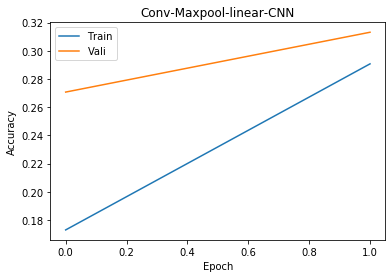

Vali Accu:  0.3131 Best vali:  0.3469 Test Accu:  0.3151 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.001 , momen:  0.9 M:  150 k:  5 N:  14
[1, 20000] loss: 2.328
[1, 40000] loss: 2.284
Training Accu:  0.113425
Validation Accu:  0.1557
[2, 20000] loss: 2.254
[2, 40000] loss: 2.227
Training Accu:  0.191325
Validation Accu:  0.223
Finish Traning
Test 0 th batch, 214 correct, tested 1000, batch size 1000
Test 1 th batch, 415 correct, tested 2000, batch size 1000
Test 2 th batch, 630 correct, tested 3000, batch size 1000
Test 3 th batch, 834 correct, tested 4000, batch size 1000
Test 4 th batch, 1055 correct, tested 5000, batch size 1000
Test 5 th batch, 1256 correct, tested 6000, batch size 1000
Test 6 th batch, 1471 correct, tested 7000, batch size 1000
Test 7 th batch, 1674 correct, tested 8000, batch size 1000
Test 8 th batch, 1887 correct, tested 9000, batch size 1000
Test 9 th batch, 2107 correct, tested 10000, batch size 1000


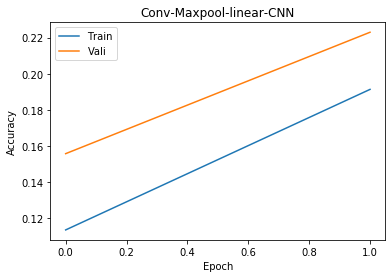

Vali Accu:  0.223 Best vali:  0.3469 Test Accu:  0.2107 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  50 k:  5 N:  4
[1, 20000] loss: 2.287
[1, 40000] loss: 2.247
Training Accu:  0.160975
Validation Accu:  0.2137
[2, 20000] loss: 2.212
[2, 40000] loss: 2.181
Training Accu:  0.244475
Validation Accu:  0.2646
Finish Traning
Test 0 th batch, 288 correct, tested 1000, batch size 1000
Test 1 th batch, 542 correct, tested 2000, batch size 1000
Test 2 th batch, 805 correct, tested 3000, batch size 1000
Test 3 th batch, 1074 correct, tested 4000, batch size 1000
Test 4 th batch, 1346 correct, tested 5000, batch size 1000
Test 5 th batch, 1602 correct, tested 6000, batch size 1000
Test 6 th batch, 1855 correct, tested 7000, batch size 1000
Test 7 th batch, 2113 correct, tested 8000, batch size 1000
Test 8 th batch, 2355 correct, tested 9000, batch size 1000
Test 9 th batch, 2630 correct, tested 10000, batch size 1000


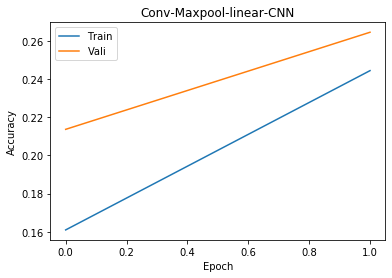

Vali Accu:  0.2646 Best vali:  0.3469 Test Accu:  0.263 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  50 k:  5 N:  7
[1, 20000] loss: 2.300
[1, 40000] loss: 2.275
Training Accu:  0.151475
Validation Accu:  0.1794
[2, 20000] loss: 2.251
[2, 40000] loss: 2.231
Training Accu:  0.198975
Validation Accu:  0.2158
Finish Traning
Test 0 th batch, 229 correct, tested 1000, batch size 1000
Test 1 th batch, 424 correct, tested 2000, batch size 1000
Test 2 th batch, 639 correct, tested 3000, batch size 1000
Test 3 th batch, 861 correct, tested 4000, batch size 1000
Test 4 th batch, 1077 correct, tested 5000, batch size 1000
Test 5 th batch, 1304 correct, tested 6000, batch size 1000
Test 6 th batch, 1533 correct, tested 7000, batch size 1000
Test 7 th batch, 1755 correct, tested 8000, batch size 1000
Test 8 th batch, 1956 correct, tested 9000, batch size 1000
Test 9 th batch, 2183 correct, tested 10000, batch size 1000


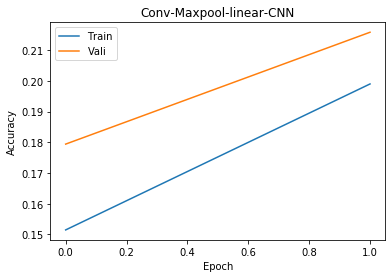

Vali Accu:  0.2158 Best vali:  0.3469 Test Accu:  0.2183 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  50 k:  5 N:  14
[1, 20000] loss: 2.343
[1, 40000] loss: 2.318
Training Accu:  0.0851
Validation Accu:  0.0748
[2, 20000] loss: 2.303
[2, 40000] loss: 2.293
Training Accu:  0.08275
Validation Accu:  0.1053
Finish Traning
Test 0 th batch, 111 correct, tested 1000, batch size 1000
Test 1 th batch, 211 correct, tested 2000, batch size 1000
Test 2 th batch, 296 correct, tested 3000, batch size 1000
Test 3 th batch, 404 correct, tested 4000, batch size 1000
Test 4 th batch, 503 correct, tested 5000, batch size 1000
Test 5 th batch, 597 correct, tested 6000, batch size 1000
Test 6 th batch, 697 correct, tested 7000, batch size 1000
Test 7 th batch, 808 correct, tested 8000, batch size 1000
Test 8 th batch, 916 correct, tested 9000, batch size 1000
Test 9 th batch, 1010 correct, tested 10000, batch size 1000


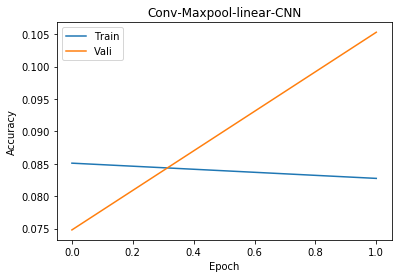

Vali Accu:  0.1053 Best vali:  0.3469 Test Accu:  0.101 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  100 k:  5 N:  4
[1, 20000] loss: 2.265
[1, 40000] loss: 2.183
Training Accu:  0.19975
Validation Accu:  0.2583
[2, 20000] loss: 2.127
[2, 40000] loss: 2.084
Training Accu:  0.28065
Validation Accu:  0.2934
Finish Traning
Test 0 th batch, 322 correct, tested 1000, batch size 1000
Test 1 th batch, 607 correct, tested 2000, batch size 1000
Test 2 th batch, 903 correct, tested 3000, batch size 1000
Test 3 th batch, 1203 correct, tested 4000, batch size 1000
Test 4 th batch, 1512 correct, tested 5000, batch size 1000
Test 5 th batch, 1781 correct, tested 6000, batch size 1000
Test 6 th batch, 2085 correct, tested 7000, batch size 1000
Test 7 th batch, 2375 correct, tested 8000, batch size 1000
Test 8 th batch, 2667 correct, tested 9000, batch size 1000
Test 9 th batch, 2970 correct, tested 10000, batch size 1000


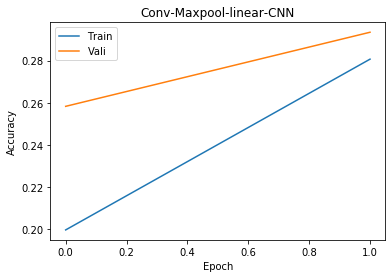

Vali Accu:  0.2934 Best vali:  0.3469 Test Accu:  0.297 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  100 k:  5 N:  7
[1, 20000] loss: 2.299
[1, 40000] loss: 2.248
Training Accu:  0.1597
Validation Accu:  0.2147
[2, 20000] loss: 2.213
[2, 40000] loss: 2.183
Training Accu:  0.2404
Validation Accu:  0.2721
Finish Traning
Test 0 th batch, 292 correct, tested 1000, batch size 1000
Test 1 th batch, 555 correct, tested 2000, batch size 1000
Test 2 th batch, 833 correct, tested 3000, batch size 1000
Test 3 th batch, 1095 correct, tested 4000, batch size 1000
Test 4 th batch, 1368 correct, tested 5000, batch size 1000
Test 5 th batch, 1632 correct, tested 6000, batch size 1000
Test 6 th batch, 1891 correct, tested 7000, batch size 1000
Test 7 th batch, 2153 correct, tested 8000, batch size 1000
Test 8 th batch, 2414 correct, tested 9000, batch size 1000
Test 9 th batch, 2699 correct, tested 10000, batch size 1000


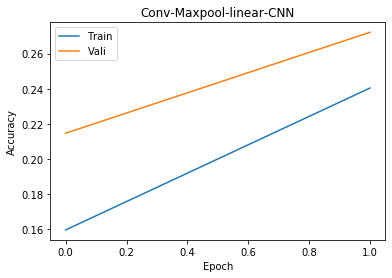

Vali Accu:  0.2721 Best vali:  0.3469 Test Accu:  0.2699 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  100 k:  5 N:  14
[1, 20000] loss: 2.309
[1, 40000] loss: 2.284
Training Accu:  0.134075
Validation Accu:  0.1632
[2, 20000] loss: 2.269
[2, 40000] loss: 2.259
Training Accu:  0.17035
Validation Accu:  0.1755
Finish Traning
Test 0 th batch, 182 correct, tested 1000, batch size 1000
Test 1 th batch, 348 correct, tested 2000, batch size 1000
Test 2 th batch, 547 correct, tested 3000, batch size 1000
Test 3 th batch, 729 correct, tested 4000, batch size 1000
Test 4 th batch, 912 correct, tested 5000, batch size 1000
Test 5 th batch, 1084 correct, tested 6000, batch size 1000
Test 6 th batch, 1247 correct, tested 7000, batch size 1000
Test 7 th batch, 1425 correct, tested 8000, batch size 1000
Test 8 th batch, 1610 correct, tested 9000, batch size 1000
Test 9 th batch, 1793 correct, tested 10000, batch size 1000


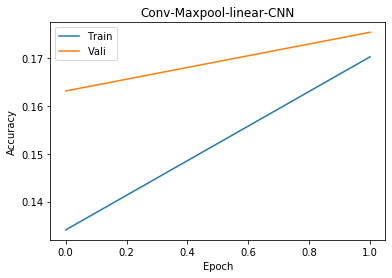

Vali Accu:  0.1755 Best vali:  0.3469 Test Accu:  0.1793 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  150 k:  5 N:  4
[1, 20000] loss: 2.237
[1, 40000] loss: 2.140
Training Accu:  0.2291
Validation Accu:  0.2924
[2, 20000] loss: 2.077
[2, 40000] loss: 2.029
Training Accu:  0.307275
Validation Accu:  0.3206
Finish Traning
Test 0 th batch, 343 correct, tested 1000, batch size 1000
Test 1 th batch, 658 correct, tested 2000, batch size 1000
Test 2 th batch, 996 correct, tested 3000, batch size 1000
Test 3 th batch, 1326 correct, tested 4000, batch size 1000
Test 4 th batch, 1652 correct, tested 5000, batch size 1000
Test 5 th batch, 1962 correct, tested 6000, batch size 1000
Test 6 th batch, 2293 correct, tested 7000, batch size 1000
Test 7 th batch, 2604 correct, tested 8000, batch size 1000
Test 8 th batch, 2920 correct, tested 9000, batch size 1000
Test 9 th batch, 3240 correct, tested 10000, batch size 1000


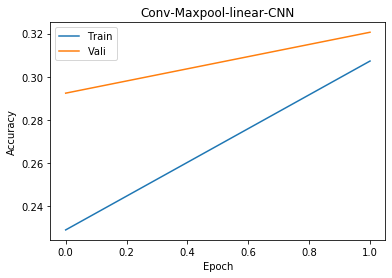

Vali Accu:  0.3206 Best vali:  0.3469 Test Accu:  0.324 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  150 k:  5 N:  7
[1, 20000] loss: 2.284
[1, 40000] loss: 2.224
Training Accu:  0.165675
Validation Accu:  0.2261
[2, 20000] loss: 2.177
[2, 40000] loss: 2.137
Training Accu:  0.2554
Validation Accu:  0.2902
Finish Traning
Test 0 th batch, 300 correct, tested 1000, batch size 1000
Test 1 th batch, 581 correct, tested 2000, batch size 1000
Test 2 th batch, 863 correct, tested 3000, batch size 1000
Test 3 th batch, 1142 correct, tested 4000, batch size 1000
Test 4 th batch, 1421 correct, tested 5000, batch size 1000
Test 5 th batch, 1706 correct, tested 6000, batch size 1000
Test 6 th batch, 2007 correct, tested 7000, batch size 1000
Test 7 th batch, 2298 correct, tested 8000, batch size 1000
Test 8 th batch, 2575 correct, tested 9000, batch size 1000
Test 9 th batch, 2867 correct, tested 10000, batch size 1000


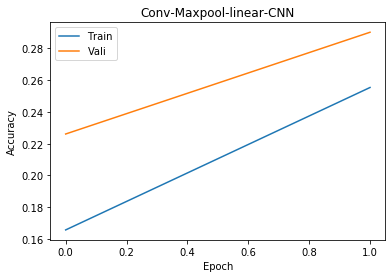

Vali Accu:  0.2902 Best vali:  0.3469 Test Accu:  0.2867 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.3 M:  150 k:  5 N:  14
[1, 20000] loss: 2.312
[1, 40000] loss: 2.282
Training Accu:  0.107375
Validation Accu:  0.1209
[2, 20000] loss: 2.266
[2, 40000] loss: 2.253
Training Accu:  0.14495
Validation Accu:  0.1581
Finish Traning
Test 0 th batch, 186 correct, tested 1000, batch size 1000
Test 1 th batch, 343 correct, tested 2000, batch size 1000
Test 2 th batch, 509 correct, tested 3000, batch size 1000
Test 3 th batch, 694 correct, tested 4000, batch size 1000
Test 4 th batch, 855 correct, tested 5000, batch size 1000
Test 5 th batch, 1017 correct, tested 6000, batch size 1000
Test 6 th batch, 1161 correct, tested 7000, batch size 1000
Test 7 th batch, 1322 correct, tested 8000, batch size 1000
Test 8 th batch, 1481 correct, tested 9000, batch size 1000
Test 9 th batch, 1648 correct, tested 10000, batch size 1000


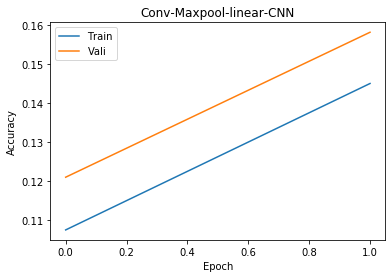

Vali Accu:  0.1581 Best vali:  0.3469 Test Accu:  0.1648 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  50 k:  5 N:  4
[1, 20000] loss: 2.250
[1, 40000] loss: 2.171
Training Accu:  0.200875
Validation Accu:  0.2594
[2, 20000] loss: 2.115
[2, 40000] loss: 2.071
Training Accu:  0.27445
Validation Accu:  0.2867
Finish Traning
Test 0 th batch, 332 correct, tested 1000, batch size 1000
Test 1 th batch, 619 correct, tested 2000, batch size 1000
Test 2 th batch, 908 correct, tested 3000, batch size 1000
Test 3 th batch, 1211 correct, tested 4000, batch size 1000
Test 4 th batch, 1499 correct, tested 5000, batch size 1000
Test 5 th batch, 1785 correct, tested 6000, batch size 1000
Test 6 th batch, 2090 correct, tested 7000, batch size 1000
Test 7 th batch, 2374 correct, tested 8000, batch size 1000
Test 8 th batch, 2677 correct, tested 9000, batch size 1000
Test 9 th batch, 2973 correct, tested 10000, batch size 1000


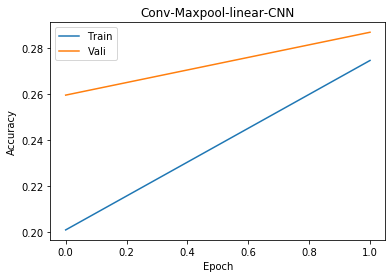

Vali Accu:  0.2867 Best vali:  0.3469 Test Accu:  0.2973 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  50 k:  5 N:  7
[1, 20000] loss: 2.306
[1, 40000] loss: 2.260
Training Accu:  0.1486
Validation Accu:  0.1827
[2, 20000] loss: 2.223
[2, 40000] loss: 2.193
Training Accu:  0.21825
Validation Accu:  0.252
Finish Traning
Test 0 th batch, 263 correct, tested 1000, batch size 1000
Test 1 th batch, 514 correct, tested 2000, batch size 1000
Test 2 th batch, 778 correct, tested 3000, batch size 1000
Test 3 th batch, 1018 correct, tested 4000, batch size 1000
Test 4 th batch, 1296 correct, tested 5000, batch size 1000
Test 5 th batch, 1547 correct, tested 6000, batch size 1000
Test 6 th batch, 1791 correct, tested 7000, batch size 1000
Test 7 th batch, 2049 correct, tested 8000, batch size 1000
Test 8 th batch, 2300 correct, tested 9000, batch size 1000
Test 9 th batch, 2552 correct, tested 10000, batch size 1000


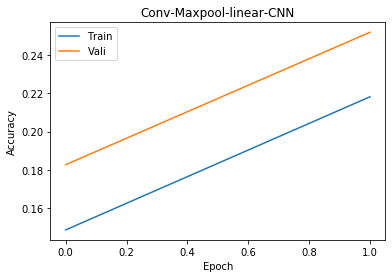

Vali Accu:  0.252 Best vali:  0.3469 Test Accu:  0.2552 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  50 k:  5 N:  14
[1, 20000] loss: 2.302
[1, 40000] loss: 2.276
Training Accu:  0.126275
Validation Accu:  0.1435
[2, 20000] loss: 2.260
[2, 40000] loss: 2.252
Training Accu:  0.1555
Validation Accu:  0.1631
Finish Traning
Test 0 th batch, 179 correct, tested 1000, batch size 1000
Test 1 th batch, 328 correct, tested 2000, batch size 1000
Test 2 th batch, 488 correct, tested 3000, batch size 1000
Test 3 th batch, 671 correct, tested 4000, batch size 1000
Test 4 th batch, 854 correct, tested 5000, batch size 1000
Test 5 th batch, 1034 correct, tested 6000, batch size 1000
Test 6 th batch, 1189 correct, tested 7000, batch size 1000
Test 7 th batch, 1356 correct, tested 8000, batch size 1000
Test 8 th batch, 1518 correct, tested 9000, batch size 1000
Test 9 th batch, 1703 correct, tested 10000, batch size 1000


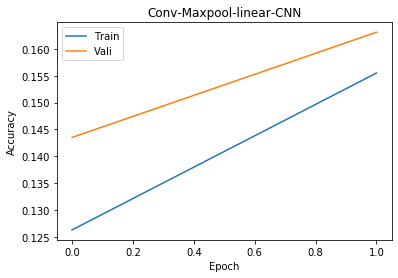

Vali Accu:  0.1631 Best vali:  0.3469 Test Accu:  0.1703 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  100 k:  5 N:  4
[1, 20000] loss: 2.234
[1, 40000] loss: 2.111
Training Accu:  0.237875
Validation Accu:  0.294
[2, 20000] loss: 2.043
[2, 40000] loss: 2.000
Training Accu:  0.3112
Validation Accu:  0.32
Finish Traning
Test 0 th batch, 351 correct, tested 1000, batch size 1000
Test 1 th batch, 670 correct, tested 2000, batch size 1000
Test 2 th batch, 998 correct, tested 3000, batch size 1000
Test 3 th batch, 1331 correct, tested 4000, batch size 1000
Test 4 th batch, 1651 correct, tested 5000, batch size 1000
Test 5 th batch, 1963 correct, tested 6000, batch size 1000
Test 6 th batch, 2303 correct, tested 7000, batch size 1000
Test 7 th batch, 2621 correct, tested 8000, batch size 1000
Test 8 th batch, 2948 correct, tested 9000, batch size 1000
Test 9 th batch, 3278 correct, tested 10000, batch size 1000


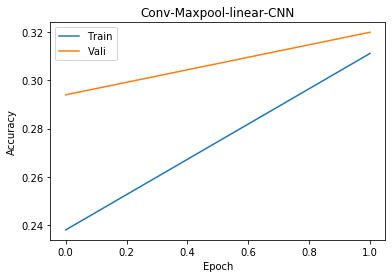

Vali Accu:  0.32 Best vali:  0.3469 Test Accu:  0.3278 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  100 k:  5 N:  7
[1, 20000] loss: 2.294
[1, 40000] loss: 2.215
Training Accu:  0.174
Validation Accu:  0.2462
[2, 20000] loss: 2.160
[2, 40000] loss: 2.116
Training Accu:  0.2728
Validation Accu:  0.2995
Finish Traning
Test 0 th batch, 329 correct, tested 1000, batch size 1000
Test 1 th batch, 618 correct, tested 2000, batch size 1000
Test 2 th batch, 898 correct, tested 3000, batch size 1000
Test 3 th batch, 1183 correct, tested 4000, batch size 1000
Test 4 th batch, 1491 correct, tested 5000, batch size 1000
Test 5 th batch, 1780 correct, tested 6000, batch size 1000
Test 6 th batch, 2081 correct, tested 7000, batch size 1000
Test 7 th batch, 2376 correct, tested 8000, batch size 1000
Test 8 th batch, 2664 correct, tested 9000, batch size 1000
Test 9 th batch, 2963 correct, tested 10000, batch size 1000


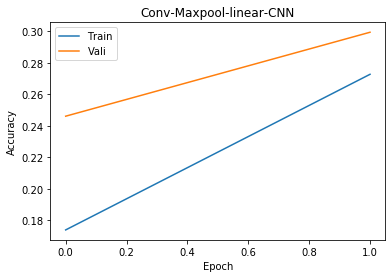

Vali Accu:  0.2995 Best vali:  0.3469 Test Accu:  0.2963 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  100 k:  5 N:  14
[1, 20000] loss: 2.307
[1, 40000] loss: 2.286
Training Accu:  0.118425
Validation Accu:  0.152
[2, 20000] loss: 2.265
[2, 40000] loss: 2.250
Training Accu:  0.17105
Validation Accu:  0.1955
Finish Traning
Test 0 th batch, 179 correct, tested 1000, batch size 1000
Test 1 th batch, 373 correct, tested 2000, batch size 1000
Test 2 th batch, 553 correct, tested 3000, batch size 1000
Test 3 th batch, 738 correct, tested 4000, batch size 1000
Test 4 th batch, 929 correct, tested 5000, batch size 1000
Test 5 th batch, 1107 correct, tested 6000, batch size 1000
Test 6 th batch, 1319 correct, tested 7000, batch size 1000
Test 7 th batch, 1503 correct, tested 8000, batch size 1000
Test 8 th batch, 1686 correct, tested 9000, batch size 1000
Test 9 th batch, 1868 correct, tested 10000, batch size 1000


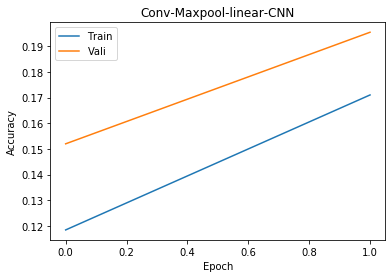

Vali Accu:  0.1955 Best vali:  0.3469 Test Accu:  0.1868 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  150 k:  5 N:  4
[1, 20000] loss: 2.222
[1, 40000] loss: 2.086
Training Accu:  0.237
Validation Accu:  0.3112
[2, 20000] loss: 2.013
[2, 40000] loss: 1.961
Training Accu:  0.32075
Validation Accu:  0.34
Finish Traning
Test 0 th batch, 357 correct, tested 1000, batch size 1000
Test 1 th batch, 703 correct, tested 2000, batch size 1000
Test 2 th batch, 1047 correct, tested 3000, batch size 1000
Test 3 th batch, 1387 correct, tested 4000, batch size 1000
Test 4 th batch, 1740 correct, tested 5000, batch size 1000
Test 5 th batch, 2073 correct, tested 6000, batch size 1000
Test 6 th batch, 2419 correct, tested 7000, batch size 1000
Test 7 th batch, 2764 correct, tested 8000, batch size 1000
Test 8 th batch, 3097 correct, tested 9000, batch size 1000
Test 9 th batch, 3442 correct, tested 10000, batch size 1000


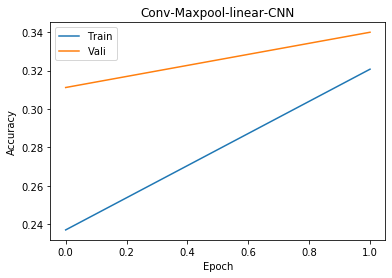

Vali Accu:  0.34 Best vali:  0.3469 Test Accu:  0.3442 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  150 k:  5 N:  7
[1, 20000] loss: 2.263
[1, 40000] loss: 2.168
Training Accu:  0.214175
Validation Accu:  0.273
[2, 20000] loss: 2.104
[2, 40000] loss: 2.056
Training Accu:  0.304525
Validation Accu:  0.3108
Finish Traning
Test 0 th batch, 331 correct, tested 1000, batch size 1000
Test 1 th batch, 623 correct, tested 2000, batch size 1000
Test 2 th batch, 957 correct, tested 3000, batch size 1000
Test 3 th batch, 1276 correct, tested 4000, batch size 1000
Test 4 th batch, 1612 correct, tested 5000, batch size 1000
Test 5 th batch, 1917 correct, tested 6000, batch size 1000
Test 6 th batch, 2251 correct, tested 7000, batch size 1000
Test 7 th batch, 2586 correct, tested 8000, batch size 1000
Test 8 th batch, 2898 correct, tested 9000, batch size 1000
Test 9 th batch, 3229 correct, tested 10000, batch size 1000


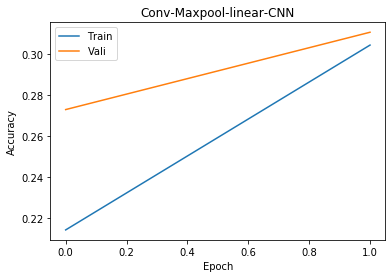

Vali Accu:  0.3108 Best vali:  0.3469 Test Accu:  0.3229 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.6 M:  150 k:  5 N:  14
[1, 20000] loss: 2.317
[1, 40000] loss: 2.276
Training Accu:  0.12005
Validation Accu:  0.1532
[2, 20000] loss: 2.256
[2, 40000] loss: 2.233
Training Accu:  0.180975
Validation Accu:  0.2004
Finish Traning
Test 0 th batch, 209 correct, tested 1000, batch size 1000
Test 1 th batch, 390 correct, tested 2000, batch size 1000
Test 2 th batch, 601 correct, tested 3000, batch size 1000
Test 3 th batch, 808 correct, tested 4000, batch size 1000
Test 4 th batch, 1008 correct, tested 5000, batch size 1000
Test 5 th batch, 1192 correct, tested 6000, batch size 1000
Test 6 th batch, 1395 correct, tested 7000, batch size 1000
Test 7 th batch, 1594 correct, tested 8000, batch size 1000
Test 8 th batch, 1799 correct, tested 9000, batch size 1000
Test 9 th batch, 1986 correct, tested 10000, batch size 1000


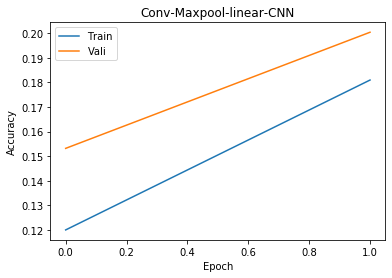

Vali Accu:  0.2004 Best vali:  0.3469 Test Accu:  0.1986 Best params:  {'lr': 0.001, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  50 k:  5 N:  4
[1, 20000] loss: 2.234
[1, 40000] loss: 2.080
Training Accu:  0.234075
Validation Accu:  0.3035
[2, 20000] loss: 1.976
[2, 40000] loss: 1.910
Training Accu:  0.3265
Validation Accu:  0.3593
Finish Traning
Test 0 th batch, 370 correct, tested 1000, batch size 1000
Test 1 th batch, 732 correct, tested 2000, batch size 1000
Test 2 th batch, 1100 correct, tested 3000, batch size 1000
Test 3 th batch, 1461 correct, tested 4000, batch size 1000
Test 4 th batch, 1820 correct, tested 5000, batch size 1000
Test 5 th batch, 2168 correct, tested 6000, batch size 1000
Test 6 th batch, 2523 correct, tested 7000, batch size 1000
Test 7 th batch, 2884 correct, tested 8000, batch size 1000
Test 8 th batch, 3235 correct, tested 9000, batch size 1000
Test 9 th batch, 3603 correct, tested 10000, batch size 1000


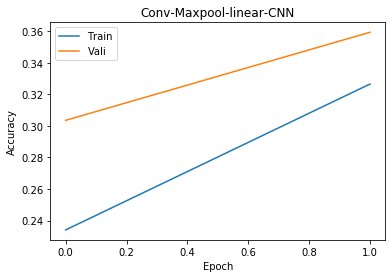

Vali Accu:  0.3593 Best vali:  0.3593 Test Accu:  0.3603 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  50 k:  5 N:  7
[1, 20000] loss: 2.273
[1, 40000] loss: 2.166
Training Accu:  0.20005
Validation Accu:  0.2796
[2, 20000] loss: 2.072
[2, 40000] loss: 2.002
Training Accu:  0.303225
Validation Accu:  0.3143
Finish Traning
Test 0 th batch, 343 correct, tested 1000, batch size 1000
Test 1 th batch, 651 correct, tested 2000, batch size 1000
Test 2 th batch, 994 correct, tested 3000, batch size 1000
Test 3 th batch, 1322 correct, tested 4000, batch size 1000
Test 4 th batch, 1651 correct, tested 5000, batch size 1000
Test 5 th batch, 1966 correct, tested 6000, batch size 1000
Test 6 th batch, 2288 correct, tested 7000, batch size 1000
Test 7 th batch, 2607 correct, tested 8000, batch size 1000
Test 8 th batch, 2928 correct, tested 9000, batch size 1000
Test 9 th batch, 3261 correct, tested 10000, batch size 1000


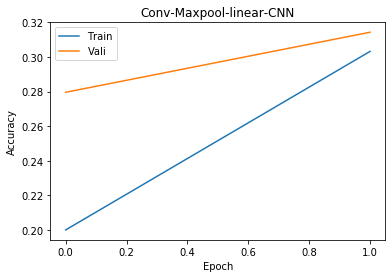

Vali Accu:  0.3143 Best vali:  0.3593 Test Accu:  0.3261 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  50 k:  5 N:  14
[1, 20000] loss: 2.329
[1, 40000] loss: 2.271
Training Accu:  0.1318
Validation Accu:  0.1663
[2, 20000] loss: 2.233
[2, 40000] loss: 2.196
Training Accu:  0.20745
Validation Accu:  0.2457
Finish Traning
Test 0 th batch, 255 correct, tested 1000, batch size 1000
Test 1 th batch, 483 correct, tested 2000, batch size 1000
Test 2 th batch, 737 correct, tested 3000, batch size 1000
Test 3 th batch, 1000 correct, tested 4000, batch size 1000
Test 4 th batch, 1247 correct, tested 5000, batch size 1000
Test 5 th batch, 1465 correct, tested 6000, batch size 1000
Test 6 th batch, 1715 correct, tested 7000, batch size 1000
Test 7 th batch, 1960 correct, tested 8000, batch size 1000
Test 8 th batch, 2212 correct, tested 9000, batch size 1000
Test 9 th batch, 2459 correct, tested 10000, batch size 1000


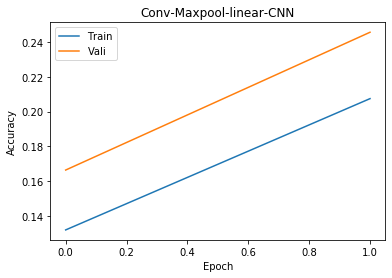

Vali Accu:  0.2457 Best vali:  0.3593 Test Accu:  0.2459 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 50, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  100 k:  5 N:  4
[1, 20000] loss: 2.181
[1, 40000] loss: 1.961
Training Accu:  0.2639
Validation Accu:  0.3446
[2, 20000] loss: 1.844
[2, 40000] loss: 1.777
Training Accu:  0.37915
Validation Accu:  0.4101
Finish Traning
Test 0 th batch, 419 correct, tested 1000, batch size 1000
Test 1 th batch, 829 correct, tested 2000, batch size 1000
Test 2 th batch, 1241 correct, tested 3000, batch size 1000
Test 3 th batch, 1646 correct, tested 4000, batch size 1000
Test 4 th batch, 2064 correct, tested 5000, batch size 1000
Test 5 th batch, 2466 correct, tested 6000, batch size 1000
Test 6 th batch, 2882 correct, tested 7000, batch size 1000
Test 7 th batch, 3306 correct, tested 8000, batch size 1000
Test 8 th batch, 3704 correct, tested 9000, batch size 1000
Test 9 th batch, 4127 correct, tested 10000, batch size 1000


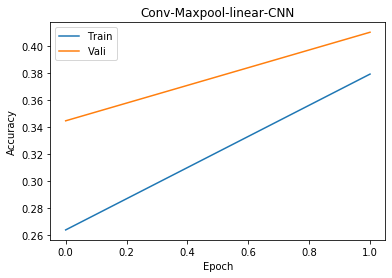

Vali Accu:  0.4101 Best vali:  0.4101 Test Accu:  0.4127 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  100 k:  5 N:  7
[1, 20000] loss: 2.250
[1, 40000] loss: 2.082
Training Accu:  0.233825
Validation Accu:  0.3106
[2, 20000] loss: 1.973
[2, 40000] loss: 1.902
Training Accu:  0.328575
Validation Accu:  0.3635
Finish Traning
Test 0 th batch, 397 correct, tested 1000, batch size 1000
Test 1 th batch, 751 correct, tested 2000, batch size 1000
Test 2 th batch, 1120 correct, tested 3000, batch size 1000
Test 3 th batch, 1480 correct, tested 4000, batch size 1000
Test 4 th batch, 1850 correct, tested 5000, batch size 1000
Test 5 th batch, 2219 correct, tested 6000, batch size 1000
Test 6 th batch, 2587 correct, tested 7000, batch size 1000
Test 7 th batch, 2947 correct, tested 8000, batch size 1000
Test 8 th batch, 3295 correct, tested 9000, batch size 1000
Test 9 th batch, 3665 correct, tested 10000, batch size 1000


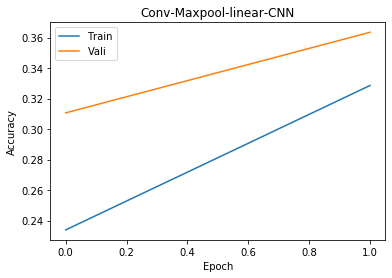

Vali Accu:  0.3635 Best vali:  0.4101 Test Accu:  0.3665 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  100 k:  5 N:  14
[1, 20000] loss: 2.294
[1, 40000] loss: 2.228
Training Accu:  0.164725
Validation Accu:  0.2284
[2, 20000] loss: 2.172
[2, 40000] loss: 2.127
Training Accu:  0.25435
Validation Accu:  0.2756
Finish Traning
Test 0 th batch, 291 correct, tested 1000, batch size 1000
Test 1 th batch, 580 correct, tested 2000, batch size 1000
Test 2 th batch, 851 correct, tested 3000, batch size 1000
Test 3 th batch, 1124 correct, tested 4000, batch size 1000
Test 4 th batch, 1409 correct, tested 5000, batch size 1000
Test 5 th batch, 1681 correct, tested 6000, batch size 1000
Test 6 th batch, 1969 correct, tested 7000, batch size 1000
Test 7 th batch, 2243 correct, tested 8000, batch size 1000
Test 8 th batch, 2531 correct, tested 9000, batch size 1000
Test 9 th batch, 2829 correct, tested 10000, batch size 1000


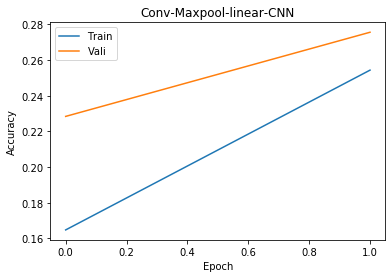

Vali Accu:  0.2756 Best vali:  0.4101 Test Accu:  0.2829 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 100, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  150 k:  5 N:  4
[1, 20000] loss: 2.145
[1, 40000] loss: 1.910
Training Accu:  0.288975
Validation Accu:  0.37
[2, 20000] loss: 1.803
[2, 40000] loss: 1.729
Training Accu:  0.396925
Validation Accu:  0.4219
Finish Traning
Test 0 th batch, 431 correct, tested 1000, batch size 1000
Test 1 th batch, 842 correct, tested 2000, batch size 1000
Test 2 th batch, 1267 correct, tested 3000, batch size 1000
Test 3 th batch, 1706 correct, tested 4000, batch size 1000
Test 4 th batch, 2134 correct, tested 5000, batch size 1000
Test 5 th batch, 2554 correct, tested 6000, batch size 1000
Test 6 th batch, 2976 correct, tested 7000, batch size 1000
Test 7 th batch, 3399 correct, tested 8000, batch size 1000
Test 8 th batch, 3803 correct, tested 9000, batch size 1000
Test 9 th batch, 4230 correct, tested 10000, batch size 1000


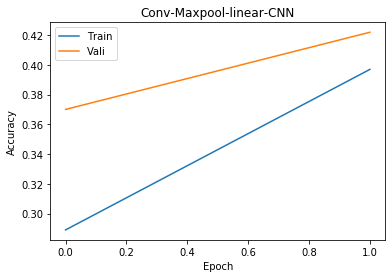

Vali Accu:  0.4219 Best vali:  0.4219 Test Accu:  0.423 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  150 k:  5 N:  7
[1, 20000] loss: 2.238
[1, 40000] loss: 2.037
Training Accu:  0.231
Validation Accu:  0.317
[2, 20000] loss: 1.937
[2, 40000] loss: 1.861
Training Accu:  0.348225
Validation Accu:  0.3713
Finish Traning
Test 0 th batch, 395 correct, tested 1000, batch size 1000
Test 1 th batch, 763 correct, tested 2000, batch size 1000
Test 2 th batch, 1142 correct, tested 3000, batch size 1000
Test 3 th batch, 1515 correct, tested 4000, batch size 1000
Test 4 th batch, 1893 correct, tested 5000, batch size 1000
Test 5 th batch, 2268 correct, tested 6000, batch size 1000
Test 6 th batch, 2654 correct, tested 7000, batch size 1000
Test 7 th batch, 3040 correct, tested 8000, batch size 1000
Test 8 th batch, 3392 correct, tested 9000, batch size 1000
Test 9 th batch, 3762 correct, tested 10000, batch size 1000


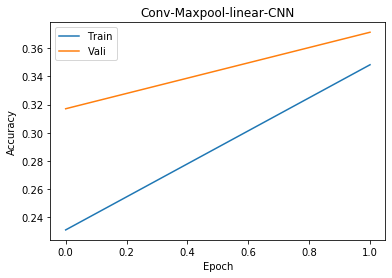

Vali Accu:  0.3713 Best vali:  0.4219 Test Accu:  0.3762 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.003 , momen:  0.9 M:  150 k:  5 N:  14
[1, 20000] loss: 2.294
[1, 40000] loss: 2.216
Training Accu:  0.168475
Validation Accu:  0.2532
[2, 20000] loss: 2.149
[2, 40000] loss: 2.099
Training Accu:  0.271975
Validation Accu:  0.2807
Finish Traning
Test 0 th batch, 305 correct, tested 1000, batch size 1000
Test 1 th batch, 594 correct, tested 2000, batch size 1000
Test 2 th batch, 875 correct, tested 3000, batch size 1000
Test 3 th batch, 1166 correct, tested 4000, batch size 1000
Test 4 th batch, 1467 correct, tested 5000, batch size 1000
Test 5 th batch, 1760 correct, tested 6000, batch size 1000
Test 6 th batch, 2054 correct, tested 7000, batch size 1000
Test 7 th batch, 2331 correct, tested 8000, batch size 1000
Test 8 th batch, 2619 correct, tested 9000, batch size 1000
Test 9 th batch, 2906 correct, tested 10000, batch size 1000


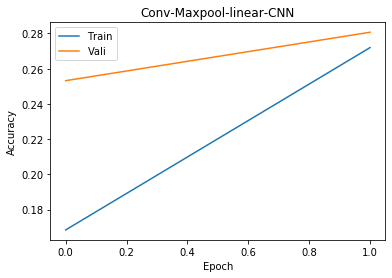

Vali Accu:  0.2807 Best vali:  0.4219 Test Accu:  0.2906 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  50 k:  5 N:  4
[1, 20000] loss: 2.275
[1, 40000] loss: 2.197
Training Accu:  0.17845
Validation Accu:  0.2492
[2, 20000] loss: 2.139
[2, 40000] loss: 2.090
Training Accu:  0.274675
Validation Accu:  0.2936
Finish Traning
Test 0 th batch, 324 correct, tested 1000, batch size 1000
Test 1 th batch, 608 correct, tested 2000, batch size 1000
Test 2 th batch, 917 correct, tested 3000, batch size 1000
Test 3 th batch, 1222 correct, tested 4000, batch size 1000
Test 4 th batch, 1532 correct, tested 5000, batch size 1000
Test 5 th batch, 1815 correct, tested 6000, batch size 1000
Test 6 th batch, 2109 correct, tested 7000, batch size 1000
Test 7 th batch, 2411 correct, tested 8000, batch size 1000
Test 8 th batch, 2702 correct, tested 9000, batch size 1000
Test 9 th batch, 3002 correct, tested 10000, batch size 1000


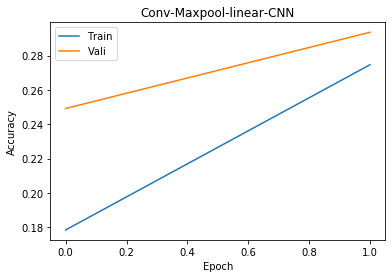

Vali Accu:  0.2936 Best vali:  0.4219 Test Accu:  0.3002 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  50 k:  5 N:  7
[1, 20000] loss: 2.282
[1, 40000] loss: 2.244
Training Accu:  0.1688
Validation Accu:  0.2032
[2, 20000] loss: 2.214
[2, 40000] loss: 2.186
Training Accu:  0.2279
Validation Accu:  0.248
Finish Traning
Test 0 th batch, 268 correct, tested 1000, batch size 1000
Test 1 th batch, 513 correct, tested 2000, batch size 1000
Test 2 th batch, 773 correct, tested 3000, batch size 1000
Test 3 th batch, 1029 correct, tested 4000, batch size 1000
Test 4 th batch, 1291 correct, tested 5000, batch size 1000
Test 5 th batch, 1536 correct, tested 6000, batch size 1000
Test 6 th batch, 1789 correct, tested 7000, batch size 1000
Test 7 th batch, 2058 correct, tested 8000, batch size 1000
Test 8 th batch, 2292 correct, tested 9000, batch size 1000
Test 9 th batch, 2540 correct, tested 10000, batch size 1000


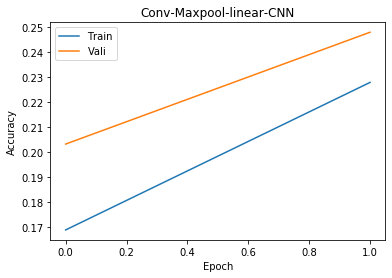

Vali Accu:  0.248 Best vali:  0.4219 Test Accu:  0.254 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  50 k:  5 N:  14
[1, 20000] loss: 2.319
[1, 40000] loss: 2.301
Training Accu:  0.098925
Validation Accu:  0.1082
[2, 20000] loss: 2.289
[2, 40000] loss: 2.278
Training Accu:  0.120825
Validation Accu:  0.1227
Finish Traning
Test 0 th batch, 133 correct, tested 1000, batch size 1000
Test 1 th batch, 251 correct, tested 2000, batch size 1000
Test 2 th batch, 375 correct, tested 3000, batch size 1000
Test 3 th batch, 506 correct, tested 4000, batch size 1000
Test 4 th batch, 635 correct, tested 5000, batch size 1000
Test 5 th batch, 740 correct, tested 6000, batch size 1000
Test 6 th batch, 869 correct, tested 7000, batch size 1000
Test 7 th batch, 1013 correct, tested 8000, batch size 1000
Test 8 th batch, 1149 correct, tested 9000, batch size 1000
Test 9 th batch, 1273 correct, tested 10000, batch size 1000


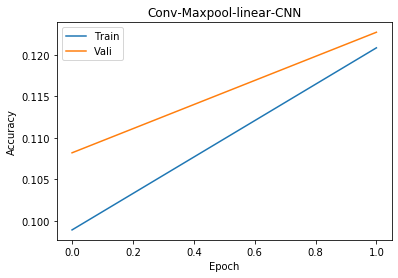

Vali Accu:  0.1227 Best vali:  0.4219 Test Accu:  0.1273 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  100 k:  5 N:  4
[1, 20000] loss: 2.234
[1, 40000] loss: 2.128
Training Accu:  0.23285
Validation Accu:  0.2963
[2, 20000] loss: 2.056
[2, 40000] loss: 2.006
Training Accu:  0.309625
Validation Accu:  0.3142
Finish Traning
Test 0 th batch, 352 correct, tested 1000, batch size 1000
Test 1 th batch, 675 correct, tested 2000, batch size 1000
Test 2 th batch, 1013 correct, tested 3000, batch size 1000
Test 3 th batch, 1350 correct, tested 4000, batch size 1000
Test 4 th batch, 1679 correct, tested 5000, batch size 1000
Test 5 th batch, 1998 correct, tested 6000, batch size 1000
Test 6 th batch, 2317 correct, tested 7000, batch size 1000
Test 7 th batch, 2648 correct, tested 8000, batch size 1000
Test 8 th batch, 2970 correct, tested 9000, batch size 1000
Test 9 th batch, 3306 correct, tested 10000, batch size 1000


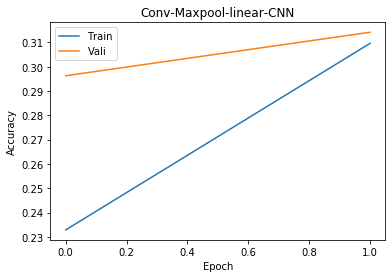

Vali Accu:  0.3142 Best vali:  0.4219 Test Accu:  0.3306 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  100 k:  5 N:  7
[1, 20000] loss: 2.263
[1, 40000] loss: 2.200
Training Accu:  0.203275
Validation Accu:  0.2504
[2, 20000] loss: 2.147
[2, 40000] loss: 2.109
Training Accu:  0.276375
Validation Accu:  0.2875
Finish Traning
Test 0 th batch, 318 correct, tested 1000, batch size 1000
Test 1 th batch, 598 correct, tested 2000, batch size 1000
Test 2 th batch, 883 correct, tested 3000, batch size 1000
Test 3 th batch, 1180 correct, tested 4000, batch size 1000
Test 4 th batch, 1479 correct, tested 5000, batch size 1000
Test 5 th batch, 1754 correct, tested 6000, batch size 1000
Test 6 th batch, 2033 correct, tested 7000, batch size 1000
Test 7 th batch, 2323 correct, tested 8000, batch size 1000
Test 8 th batch, 2603 correct, tested 9000, batch size 1000
Test 9 th batch, 2899 correct, tested 10000, batch size 1000


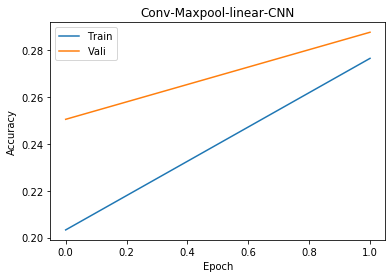

Vali Accu:  0.2875 Best vali:  0.4219 Test Accu:  0.2899 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  100 k:  5 N:  14
[1, 20000] loss: 2.320
[1, 40000] loss: 2.285
Training Accu:  0.115675
Validation Accu:  0.1307
[2, 20000] loss: 2.267
[2, 40000] loss: 2.254
Training Accu:  0.151825
Validation Accu:  0.1658
Finish Traning
Test 0 th batch, 186 correct, tested 1000, batch size 1000
Test 1 th batch, 347 correct, tested 2000, batch size 1000
Test 2 th batch, 502 correct, tested 3000, batch size 1000
Test 3 th batch, 666 correct, tested 4000, batch size 1000
Test 4 th batch, 851 correct, tested 5000, batch size 1000
Test 5 th batch, 1005 correct, tested 6000, batch size 1000
Test 6 th batch, 1177 correct, tested 7000, batch size 1000
Test 7 th batch, 1331 correct, tested 8000, batch size 1000
Test 8 th batch, 1511 correct, tested 9000, batch size 1000
Test 9 th batch, 1687 correct, tested 10000, batch size 1000


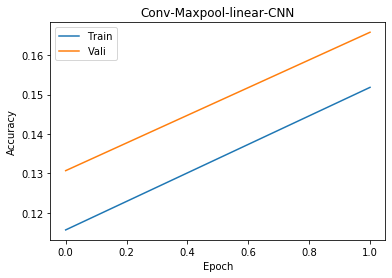

Vali Accu:  0.1658 Best vali:  0.4219 Test Accu:  0.1687 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  150 k:  5 N:  4
[1, 20000] loss: 2.221
[1, 40000] loss: 2.081
Training Accu:  0.243925
Validation Accu:  0.3117
[2, 20000] loss: 2.005
[2, 40000] loss: 1.948
Training Accu:  0.328575
Validation Accu:  0.3362
Finish Traning
Test 0 th batch, 365 correct, tested 1000, batch size 1000
Test 1 th batch, 698 correct, tested 2000, batch size 1000
Test 2 th batch, 1042 correct, tested 3000, batch size 1000
Test 3 th batch, 1384 correct, tested 4000, batch size 1000
Test 4 th batch, 1738 correct, tested 5000, batch size 1000
Test 5 th batch, 2082 correct, tested 6000, batch size 1000
Test 6 th batch, 2416 correct, tested 7000, batch size 1000
Test 7 th batch, 2754 correct, tested 8000, batch size 1000
Test 8 th batch, 3086 correct, tested 9000, batch size 1000
Test 9 th batch, 3446 correct, tested 10000, batch size 1000


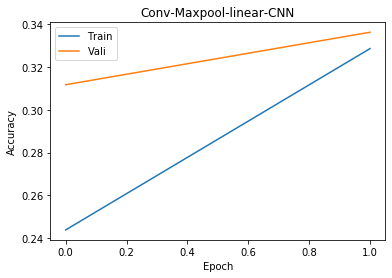

Vali Accu:  0.3362 Best vali:  0.4219 Test Accu:  0.3446 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  150 k:  5 N:  7
[1, 20000] loss: 2.269
[1, 40000] loss: 2.182
Training Accu:  0.1985
Validation Accu:  0.2807
[2, 20000] loss: 2.118
[2, 40000] loss: 2.072
Training Accu:  0.2909
Validation Accu:  0.2945
Finish Traning
Test 0 th batch, 320 correct, tested 1000, batch size 1000
Test 1 th batch, 612 correct, tested 2000, batch size 1000
Test 2 th batch, 925 correct, tested 3000, batch size 1000
Test 3 th batch, 1223 correct, tested 4000, batch size 1000
Test 4 th batch, 1526 correct, tested 5000, batch size 1000
Test 5 th batch, 1812 correct, tested 6000, batch size 1000
Test 6 th batch, 2118 correct, tested 7000, batch size 1000
Test 7 th batch, 2427 correct, tested 8000, batch size 1000
Test 8 th batch, 2724 correct, tested 9000, batch size 1000
Test 9 th batch, 3035 correct, tested 10000, batch size 1000


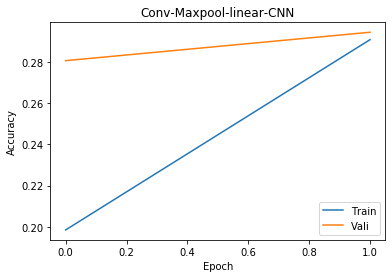

Vali Accu:  0.2945 Best vali:  0.4219 Test Accu:  0.3035 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.3 M:  150 k:  5 N:  14
[1, 20000] loss: 2.302
[1, 40000] loss: 2.274
Training Accu:  0.1374
Validation Accu:  0.1591
[2, 20000] loss: 2.251
[2, 40000] loss: 2.232
Training Accu:  0.18385
Validation Accu:  0.2037
Finish Traning
Test 0 th batch, 204 correct, tested 1000, batch size 1000
Test 1 th batch, 412 correct, tested 2000, batch size 1000
Test 2 th batch, 603 correct, tested 3000, batch size 1000
Test 3 th batch, 810 correct, tested 4000, batch size 1000
Test 4 th batch, 1021 correct, tested 5000, batch size 1000
Test 5 th batch, 1225 correct, tested 6000, batch size 1000
Test 6 th batch, 1427 correct, tested 7000, batch size 1000
Test 7 th batch, 1642 correct, tested 8000, batch size 1000
Test 8 th batch, 1829 correct, tested 9000, batch size 1000
Test 9 th batch, 2027 correct, tested 10000, batch size 1000


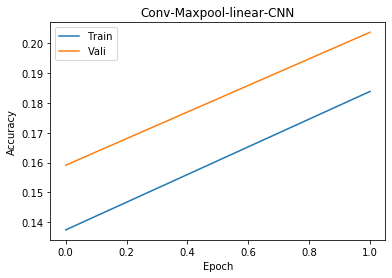

Vali Accu:  0.2037 Best vali:  0.4219 Test Accu:  0.2027 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  50 k:  5 N:  4
[1, 20000] loss: 2.247
[1, 40000] loss: 2.137
Training Accu:  0.22195
Validation Accu:  0.2834
[2, 20000] loss: 2.058
[2, 40000] loss: 2.009
Training Accu:  0.305025
Validation Accu:  0.3186
Finish Traning
Test 0 th batch, 336 correct, tested 1000, batch size 1000
Test 1 th batch, 649 correct, tested 2000, batch size 1000
Test 2 th batch, 977 correct, tested 3000, batch size 1000
Test 3 th batch, 1298 correct, tested 4000, batch size 1000
Test 4 th batch, 1611 correct, tested 5000, batch size 1000
Test 5 th batch, 1918 correct, tested 6000, batch size 1000
Test 6 th batch, 2238 correct, tested 7000, batch size 1000
Test 7 th batch, 2555 correct, tested 8000, batch size 1000
Test 8 th batch, 2864 correct, tested 9000, batch size 1000
Test 9 th batch, 3202 correct, tested 10000, batch size 1000


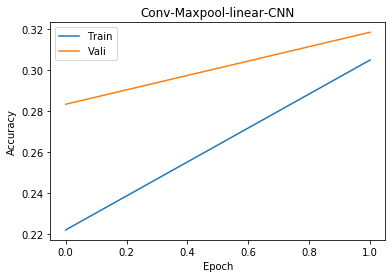

Vali Accu:  0.3186 Best vali:  0.4219 Test Accu:  0.3202 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  50 k:  5 N:  7
[1, 20000] loss: 2.269
[1, 40000] loss: 2.209
Training Accu:  0.18725
Validation Accu:  0.2499
[2, 20000] loss: 2.156
[2, 40000] loss: 2.112
Training Accu:  0.27255
Validation Accu:  0.2849
Finish Traning
Test 0 th batch, 320 correct, tested 1000, batch size 1000
Test 1 th batch, 597 correct, tested 2000, batch size 1000
Test 2 th batch, 895 correct, tested 3000, batch size 1000
Test 3 th batch, 1172 correct, tested 4000, batch size 1000
Test 4 th batch, 1467 correct, tested 5000, batch size 1000
Test 5 th batch, 1752 correct, tested 6000, batch size 1000
Test 6 th batch, 2043 correct, tested 7000, batch size 1000
Test 7 th batch, 2321 correct, tested 8000, batch size 1000
Test 8 th batch, 2615 correct, tested 9000, batch size 1000
Test 9 th batch, 2926 correct, tested 10000, batch size 1000


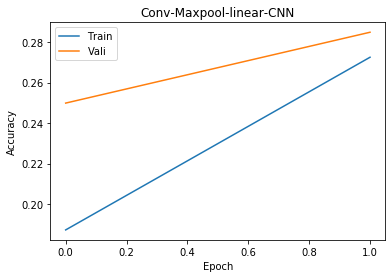

Vali Accu:  0.2849 Best vali:  0.4219 Test Accu:  0.2926 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  50 k:  5 N:  14
[1, 20000] loss: 2.329
[1, 40000] loss: 2.290
Training Accu:  0.1106
Validation Accu:  0.1364
[2, 20000] loss: 2.269
[2, 40000] loss: 2.251
Training Accu:  0.1571
Validation Accu:  0.1918
Finish Traning
Test 0 th batch, 179 correct, tested 1000, batch size 1000
Test 1 th batch, 358 correct, tested 2000, batch size 1000
Test 2 th batch, 544 correct, tested 3000, batch size 1000
Test 3 th batch, 744 correct, tested 4000, batch size 1000
Test 4 th batch, 943 correct, tested 5000, batch size 1000
Test 5 th batch, 1134 correct, tested 6000, batch size 1000
Test 6 th batch, 1326 correct, tested 7000, batch size 1000
Test 7 th batch, 1511 correct, tested 8000, batch size 1000
Test 8 th batch, 1712 correct, tested 9000, batch size 1000
Test 9 th batch, 1891 correct, tested 10000, batch size 1000


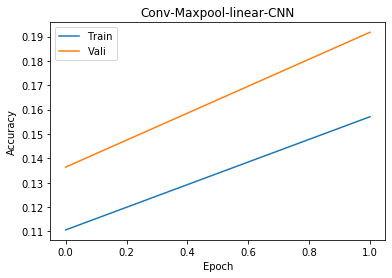

Vali Accu:  0.1918 Best vali:  0.4219 Test Accu:  0.1891 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  100 k:  5 N:  4
[1, 20000] loss: 2.211
[1, 40000] loss: 2.068
Training Accu:  0.2445
Validation Accu:  0.3016
[2, 20000] loss: 1.989
[2, 40000] loss: 1.945
Training Accu:  0.3279
Validation Accu:  0.3459
Finish Traning
Test 0 th batch, 383 correct, tested 1000, batch size 1000
Test 1 th batch, 738 correct, tested 2000, batch size 1000
Test 2 th batch, 1091 correct, tested 3000, batch size 1000
Test 3 th batch, 1441 correct, tested 4000, batch size 1000
Test 4 th batch, 1812 correct, tested 5000, batch size 1000
Test 5 th batch, 2162 correct, tested 6000, batch size 1000
Test 6 th batch, 2531 correct, tested 7000, batch size 1000
Test 7 th batch, 2884 correct, tested 8000, batch size 1000
Test 8 th batch, 3226 correct, tested 9000, batch size 1000
Test 9 th batch, 3583 correct, tested 10000, batch size 1000


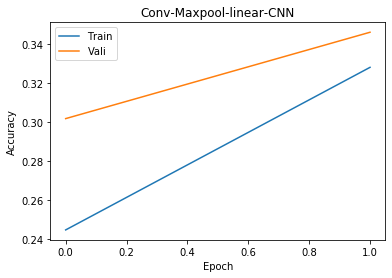

Vali Accu:  0.3459 Best vali:  0.4219 Test Accu:  0.3583 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  100 k:  5 N:  7
[1, 20000] loss: 2.254
[1, 40000] loss: 2.164
Training Accu:  0.21495
Validation Accu:  0.2872
[2, 20000] loss: 2.095
[2, 40000] loss: 2.039
Training Accu:  0.313525
Validation Accu:  0.3218
Finish Traning
Test 0 th batch, 338 correct, tested 1000, batch size 1000
Test 1 th batch, 663 correct, tested 2000, batch size 1000
Test 2 th batch, 1002 correct, tested 3000, batch size 1000
Test 3 th batch, 1323 correct, tested 4000, batch size 1000
Test 4 th batch, 1650 correct, tested 5000, batch size 1000
Test 5 th batch, 1977 correct, tested 6000, batch size 1000
Test 6 th batch, 2310 correct, tested 7000, batch size 1000
Test 7 th batch, 2637 correct, tested 8000, batch size 1000
Test 8 th batch, 2958 correct, tested 9000, batch size 1000
Test 9 th batch, 3290 correct, tested 10000, batch size 1000


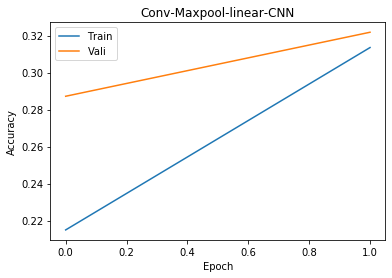

Vali Accu:  0.3218 Best vali:  0.4219 Test Accu:  0.329 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  100 k:  5 N:  14
[1, 20000] loss: 2.297
[1, 40000] loss: 2.264
Training Accu:  0.142825
Validation Accu:  0.194
[2, 20000] loss: 2.236
[2, 40000] loss: 2.211
Training Accu:  0.206075
Validation Accu:  0.2352
Finish Traning
Test 0 th batch, 248 correct, tested 1000, batch size 1000
Test 1 th batch, 466 correct, tested 2000, batch size 1000
Test 2 th batch, 704 correct, tested 3000, batch size 1000
Test 3 th batch, 954 correct, tested 4000, batch size 1000
Test 4 th batch, 1212 correct, tested 5000, batch size 1000
Test 5 th batch, 1438 correct, tested 6000, batch size 1000
Test 6 th batch, 1683 correct, tested 7000, batch size 1000
Test 7 th batch, 1913 correct, tested 8000, batch size 1000
Test 8 th batch, 2150 correct, tested 9000, batch size 1000
Test 9 th batch, 2398 correct, tested 10000, batch size 1000


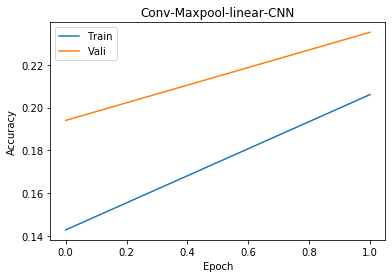

Vali Accu:  0.2352 Best vali:  0.4219 Test Accu:  0.2398 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  150 k:  5 N:  4
[1, 20000] loss: 2.184
[1, 40000] loss: 2.021
Training Accu:  0.261075
Validation Accu:  0.3215
[2, 20000] loss: 1.946
[2, 40000] loss: 1.879
Training Accu:  0.3477
Validation Accu:  0.3646
Finish Traning
Test 0 th batch, 380 correct, tested 1000, batch size 1000
Test 1 th batch, 747 correct, tested 2000, batch size 1000
Test 2 th batch, 1102 correct, tested 3000, batch size 1000
Test 3 th batch, 1486 correct, tested 4000, batch size 1000
Test 4 th batch, 1849 correct, tested 5000, batch size 1000
Test 5 th batch, 2193 correct, tested 6000, batch size 1000
Test 6 th batch, 2550 correct, tested 7000, batch size 1000
Test 7 th batch, 2909 correct, tested 8000, batch size 1000
Test 8 th batch, 3245 correct, tested 9000, batch size 1000
Test 9 th batch, 3628 correct, tested 10000, batch size 1000


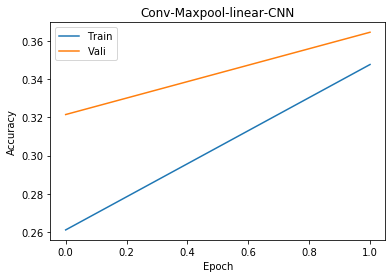

Vali Accu:  0.3646 Best vali:  0.4219 Test Accu:  0.3628 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  150 k:  5 N:  7
[1, 20000] loss: 2.236
[1, 40000] loss: 2.131
Training Accu:  0.226875
Validation Accu:  0.2832
[2, 20000] loss: 2.057
[2, 40000] loss: 2.004
Training Accu:  0.309975
Validation Accu:  0.3233
Finish Traning
Test 0 th batch, 362 correct, tested 1000, batch size 1000
Test 1 th batch, 685 correct, tested 2000, batch size 1000
Test 2 th batch, 1033 correct, tested 3000, batch size 1000
Test 3 th batch, 1363 correct, tested 4000, batch size 1000
Test 4 th batch, 1696 correct, tested 5000, batch size 1000
Test 5 th batch, 2023 correct, tested 6000, batch size 1000
Test 6 th batch, 2360 correct, tested 7000, batch size 1000
Test 7 th batch, 2680 correct, tested 8000, batch size 1000
Test 8 th batch, 3000 correct, tested 9000, batch size 1000
Test 9 th batch, 3328 correct, tested 10000, batch size 1000


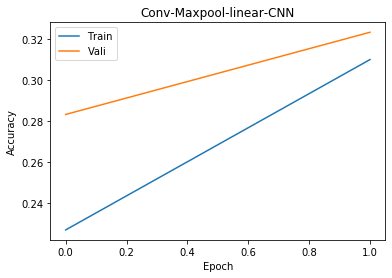

Vali Accu:  0.3233 Best vali:  0.4219 Test Accu:  0.3328 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.6 M:  150 k:  5 N:  14
[1, 20000] loss: 2.300
[1, 40000] loss: 2.252
Training Accu:  0.157925
Validation Accu:  0.2055
[2, 20000] loss: 2.217
[2, 40000] loss: 2.184
Training Accu:  0.235475
Validation Accu:  0.2629
Finish Traning
Test 0 th batch, 293 correct, tested 1000, batch size 1000
Test 1 th batch, 548 correct, tested 2000, batch size 1000
Test 2 th batch, 815 correct, tested 3000, batch size 1000
Test 3 th batch, 1097 correct, tested 4000, batch size 1000
Test 4 th batch, 1378 correct, tested 5000, batch size 1000
Test 5 th batch, 1645 correct, tested 6000, batch size 1000
Test 6 th batch, 1915 correct, tested 7000, batch size 1000
Test 7 th batch, 2190 correct, tested 8000, batch size 1000
Test 8 th batch, 2462 correct, tested 9000, batch size 1000
Test 9 th batch, 2749 correct, tested 10000, batch size 1000


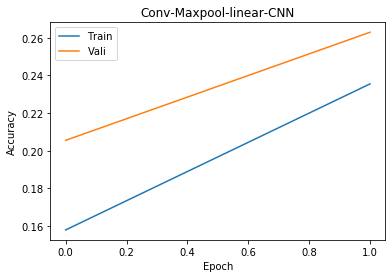

Vali Accu:  0.2629 Best vali:  0.4219 Test Accu:  0.2749 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  50 k:  5 N:  4
[1, 20000] loss: 2.201
[1, 40000] loss: 1.982
Training Accu:  0.2527
Validation Accu:  0.3412
[2, 20000] loss: 1.866
[2, 40000] loss: 1.783
Training Accu:  0.373375
Validation Accu:  0.4063
Finish Traning
Test 0 th batch, 428 correct, tested 1000, batch size 1000
Test 1 th batch, 835 correct, tested 2000, batch size 1000
Test 2 th batch, 1236 correct, tested 3000, batch size 1000
Test 3 th batch, 1655 correct, tested 4000, batch size 1000
Test 4 th batch, 2069 correct, tested 5000, batch size 1000
Test 5 th batch, 2476 correct, tested 6000, batch size 1000
Test 6 th batch, 2879 correct, tested 7000, batch size 1000
Test 7 th batch, 3283 correct, tested 8000, batch size 1000
Test 8 th batch, 3677 correct, tested 9000, batch size 1000
Test 9 th batch, 4086 correct, tested 10000, batch size 1000


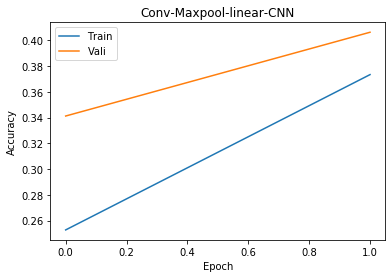

Vali Accu:  0.4063 Best vali:  0.4219 Test Accu:  0.4086 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  50 k:  5 N:  7
[1, 20000] loss: 2.266
[1, 40000] loss: 2.113
Training Accu:  0.207775
Validation Accu:  0.3012
[2, 20000] loss: 1.991
[2, 40000] loss: 1.901
Training Accu:  0.330825
Validation Accu:  0.3576
Finish Traning
Test 0 th batch, 384 correct, tested 1000, batch size 1000
Test 1 th batch, 746 correct, tested 2000, batch size 1000
Test 2 th batch, 1115 correct, tested 3000, batch size 1000
Test 3 th batch, 1489 correct, tested 4000, batch size 1000
Test 4 th batch, 1870 correct, tested 5000, batch size 1000
Test 5 th batch, 2220 correct, tested 6000, batch size 1000
Test 6 th batch, 2580 correct, tested 7000, batch size 1000
Test 7 th batch, 2948 correct, tested 8000, batch size 1000
Test 8 th batch, 3294 correct, tested 9000, batch size 1000
Test 9 th batch, 3672 correct, tested 10000, batch size 1000


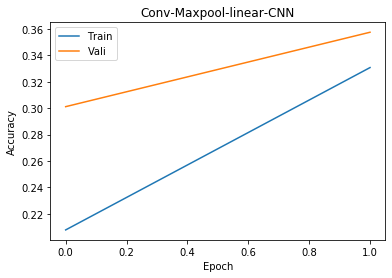

Vali Accu:  0.3576 Best vali:  0.4219 Test Accu:  0.3672 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  50 k:  5 N:  14
[1, 20000] loss: 2.284
[1, 40000] loss: 2.225
Training Accu:  0.17175
Validation Accu:  0.2294
[2, 20000] loss: 2.161
[2, 40000] loss: 2.104
Training Accu:  0.265875
Validation Accu:  0.2719
Finish Traning
Test 0 th batch, 286 correct, tested 1000, batch size 1000
Test 1 th batch, 562 correct, tested 2000, batch size 1000
Test 2 th batch, 838 correct, tested 3000, batch size 1000
Test 3 th batch, 1116 correct, tested 4000, batch size 1000
Test 4 th batch, 1405 correct, tested 5000, batch size 1000
Test 5 th batch, 1681 correct, tested 6000, batch size 1000
Test 6 th batch, 1954 correct, tested 7000, batch size 1000
Test 7 th batch, 2229 correct, tested 8000, batch size 1000
Test 8 th batch, 2525 correct, tested 9000, batch size 1000
Test 9 th batch, 2802 correct, tested 10000, batch size 1000


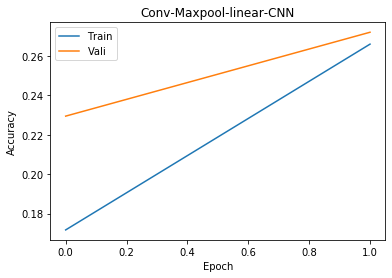

Vali Accu:  0.2719 Best vali:  0.4219 Test Accu:  0.2802 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  100 k:  5 N:  4
[1, 20000] loss: 2.137
[1, 40000] loss: 1.899
Training Accu:  0.286025
Validation Accu:  0.3625
[2, 20000] loss: 1.775
[2, 40000] loss: 1.699
Training Accu:  0.403375
Validation Accu:  0.4209
Finish Traning
Test 0 th batch, 437 correct, tested 1000, batch size 1000
Test 1 th batch, 865 correct, tested 2000, batch size 1000
Test 2 th batch, 1293 correct, tested 3000, batch size 1000
Test 3 th batch, 1741 correct, tested 4000, batch size 1000
Test 4 th batch, 2169 correct, tested 5000, batch size 1000
Test 5 th batch, 2596 correct, tested 6000, batch size 1000
Test 6 th batch, 3020 correct, tested 7000, batch size 1000
Test 7 th batch, 3446 correct, tested 8000, batch size 1000
Test 8 th batch, 3849 correct, tested 9000, batch size 1000
Test 9 th batch, 4294 correct, tested 10000, batch size 1000


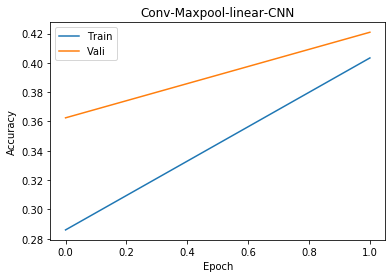

Vali Accu:  0.4209 Best vali:  0.4219 Test Accu:  0.4294 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  100 k:  5 N:  7
[1, 20000] loss: 2.212
[1, 40000] loss: 2.007
Training Accu:  0.241025
Validation Accu:  0.3341
[2, 20000] loss: 1.892
[2, 40000] loss: 1.808
Training Accu:  0.357475
Validation Accu:  0.3901
Finish Traning
Test 0 th batch, 414 correct, tested 1000, batch size 1000
Test 1 th batch, 779 correct, tested 2000, batch size 1000
Test 2 th batch, 1175 correct, tested 3000, batch size 1000
Test 3 th batch, 1561 correct, tested 4000, batch size 1000
Test 4 th batch, 1946 correct, tested 5000, batch size 1000
Test 5 th batch, 2318 correct, tested 6000, batch size 1000
Test 6 th batch, 2699 correct, tested 7000, batch size 1000
Test 7 th batch, 3108 correct, tested 8000, batch size 1000
Test 8 th batch, 3478 correct, tested 9000, batch size 1000
Test 9 th batch, 3862 correct, tested 10000, batch size 1000


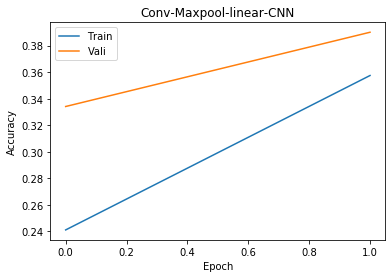

Vali Accu:  0.3901 Best vali:  0.4219 Test Accu:  0.3862 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  100 k:  5 N:  14
[1, 20000] loss: 2.277
[1, 40000] loss: 2.176
Training Accu:  0.185175
Validation Accu:  0.2562
[2, 20000] loss: 2.100
[2, 40000] loss: 2.041
Training Accu:  0.276375
Validation Accu:  0.2896
Finish Traning
Test 0 th batch, 308 correct, tested 1000, batch size 1000
Test 1 th batch, 601 correct, tested 2000, batch size 1000
Test 2 th batch, 883 correct, tested 3000, batch size 1000
Test 3 th batch, 1176 correct, tested 4000, batch size 1000
Test 4 th batch, 1478 correct, tested 5000, batch size 1000
Test 5 th batch, 1769 correct, tested 6000, batch size 1000
Test 6 th batch, 2073 correct, tested 7000, batch size 1000
Test 7 th batch, 2365 correct, tested 8000, batch size 1000
Test 8 th batch, 2652 correct, tested 9000, batch size 1000
Test 9 th batch, 2945 correct, tested 10000, batch size 1000


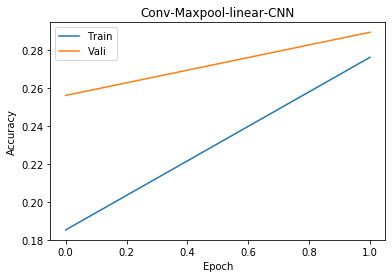

Vali Accu:  0.2896 Best vali:  0.4219 Test Accu:  0.2945 Best params:  {'lr': 0.003, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  150 k:  5 N:  4
[1, 20000] loss: 2.111
[1, 40000] loss: 1.833
Training Accu:  0.301425
Validation Accu:  0.3981
[2, 20000] loss: 1.712
[2, 40000] loss: 1.635
Training Accu:  0.42825
Validation Accu:  0.4426
Finish Traning
Test 0 th batch, 459 correct, tested 1000, batch size 1000
Test 1 th batch, 918 correct, tested 2000, batch size 1000
Test 2 th batch, 1365 correct, tested 3000, batch size 1000
Test 3 th batch, 1823 correct, tested 4000, batch size 1000
Test 4 th batch, 2276 correct, tested 5000, batch size 1000
Test 5 th batch, 2735 correct, tested 6000, batch size 1000
Test 6 th batch, 3182 correct, tested 7000, batch size 1000
Test 7 th batch, 3633 correct, tested 8000, batch size 1000
Test 8 th batch, 4070 correct, tested 9000, batch size 1000
Test 9 th batch, 4523 correct, tested 10000, batch size 1000


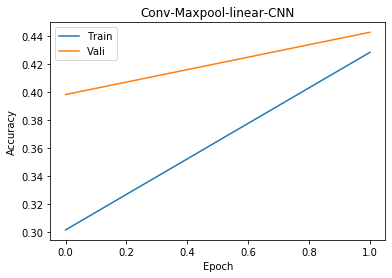

Vali Accu:  0.4426 Best vali:  0.4426 Test Accu:  0.4523 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  150 k:  5 N:  7
[1, 20000] loss: 2.186
[1, 40000] loss: 1.959
Training Accu:  0.261475
Validation Accu:  0.3654
[2, 20000] loss: 1.837
[2, 40000] loss: 1.760
Training Accu:  0.381825
Validation Accu:  0.4086
Finish Traning
Test 0 th batch, 429 correct, tested 1000, batch size 1000
Test 1 th batch, 834 correct, tested 2000, batch size 1000
Test 2 th batch, 1251 correct, tested 3000, batch size 1000
Test 3 th batch, 1666 correct, tested 4000, batch size 1000
Test 4 th batch, 2104 correct, tested 5000, batch size 1000
Test 5 th batch, 2514 correct, tested 6000, batch size 1000
Test 6 th batch, 2926 correct, tested 7000, batch size 1000
Test 7 th batch, 3358 correct, tested 8000, batch size 1000
Test 8 th batch, 3756 correct, tested 9000, batch size 1000
Test 9 th batch, 4165 correct, tested 10000, batch size 1000


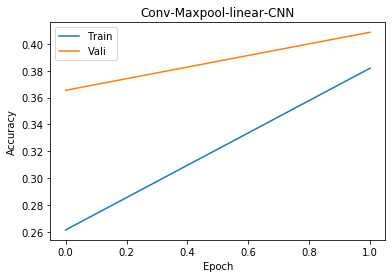

Vali Accu:  0.4086 Best vali:  0.4426 Test Accu:  0.4165 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
lr:  0.005 , momen:  0.9 M:  150 k:  5 N:  14
[1, 20000] loss: 2.284
[1, 40000] loss: 2.167
Training Accu:  0.18385
Validation Accu:  0.2581
[2, 20000] loss: 2.085
[2, 40000] loss: 2.034
Training Accu:  0.276925
Validation Accu:  0.2927
Finish Traning
Test 0 th batch, 296 correct, tested 1000, batch size 1000
Test 1 th batch, 588 correct, tested 2000, batch size 1000
Test 2 th batch, 882 correct, tested 3000, batch size 1000
Test 3 th batch, 1175 correct, tested 4000, batch size 1000
Test 4 th batch, 1474 correct, tested 5000, batch size 1000
Test 5 th batch, 1763 correct, tested 6000, batch size 1000
Test 6 th batch, 2069 correct, tested 7000, batch size 1000
Test 7 th batch, 2357 correct, tested 8000, batch size 1000
Test 8 th batch, 2651 correct, tested 9000, batch size 1000
Test 9 th batch, 2959 correct, tested 10000, batch size 1000


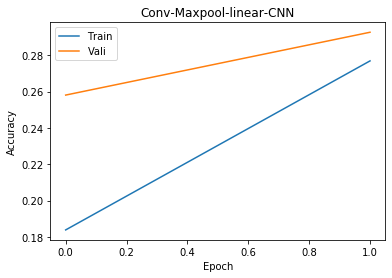

Vali Accu:  0.2927 Best vali:  0.4426 Test Accu:  0.2959 Best params:  {'lr': 0.005, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}
Best vali accu: 0.2927, Best test accu: 0.2959, Best param set: {'lr': 0.005, 'momentum': 0.9, 'M': 150, 'k': 5, 'N': 4}


NameError: name 'mean' is not defined

In [5]:
%%time
# A5c
# Convolutional layer with max-pool and fully-connected output
batch_size = 1000

# load data
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)

# define a loss function
criterion = torch.nn.CrossEntropyLoss()

lr_list = [0.001, 0.003, 0.005]
lr_accu_list = [[] for i in range(len(lr_list))]
momentum_list = [0.3, 0.6, 0.9]
momentum_accu_list = [[] for i in range(len(momentum_list))]
M_list = [50, 100, 150]
M_accu_list = [[] for i in range(len(M_list))]
k_list = [5]
k_accu_list = [[] for i in range(len(k_list))]
N_list = [4, 7, 14]
N_accu_list = [[] for i in range(len(N_list))]

vali_acct_best = 0
test_accu_best = 0

# Hyperparameters
# lr: Learning Rate
# momentum
# M: conv2d Filter size
# k: conv2d kernel size
# N: Maxpool kernel size, it is square in this case
for lr in lr_list:
    for momentum in momentum_list:
        for M in M_list:
            for k in k_list:
                for N in N_list:
                    
                    print("lr: ", lr, ", momen: ", momentum, 
                          "M: ", M,"k: ", k, "N: ", N )
                    # define model
                    model = CNN(M, k, N)
                    # define optimizer
                    optimizer = torch.optim.SGD(model.parameters(), 
                                                lr=lr, 
                                                momentum=momentum)

                    model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                                                 model=model, 
                                                                 optimizer=optimizer, 
                                                                 testloader=testloader,
                                                                 epochs=2, 
                                                                 batch_print_num=20, 
                                                                 batch_size=batch_size, 
                                                                 title="Conv-Maxpool-linear-CNN") 
                    lr_accu_list[lr_list.index(lr)].append(accu_vali)
                    momentum_accu_list[momentum_list.index(momentum)].append(accu_vali)
                    M_accu_list[M_list.index(M)].append(accu_vali)
                    k_accu_list[k_list.index(k)].append(accu_vali)
                    N_accu_list[N_list.index(N)].append(accu_vali)

                    if accu_vali > vali_acct_best:
                        vali_acct_best = accu_vali
                        test_accu_best = test_accu
                        best_params = {"lr": lr,"momentum": momentum, 
                                       "M": M, "k":k, "N":N}
                    print("Vali Accu: ", accu_vali, "Best vali: ", vali_acct_best, 
                          "Test Accu: ", test_accu, "Best params: ", best_params)

print("Best vali accu: {0}, Best test accu: {1}, Best param set: {2}".format(accu_vali, 
                                                                             test_accu, 
                                                                             best_params))
lr_accu_avg_list = avg_d_dimensional_list(lr_accu_list)
momentum_avg_list = avg_d_dimensional_list(momentum_accu_list)
M_avg_list = avg_d_dimensional_list(M_accu_list)
k_avg_list = avg_d_dimensional_list(k_accu_list)
N_avg_list = avg_d_dimensional_list(N_accu_list)


Text(0.5, 1.0, 'Lr vs Vali Accu')

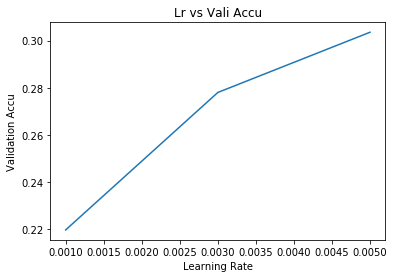

In [8]:
lr_accu_avg_list = avg_d_dimensional_list(lr_accu_list)
momentum_avg_list = avg_d_dimensional_list(momentum_accu_list)
M_avg_list = avg_d_dimensional_list(M_accu_list)
k_avg_list = avg_d_dimensional_list(k_accu_list)
N_avg_list = avg_d_dimensional_list(N_accu_list)

# plot lr change with accu plots
plt.plot(lr_list, lr_accu_avg_list)
plt.xlabel("Learning Rate")
plt.ylabel("Validation Accu")
plt.title("Lr vs Vali Accu")

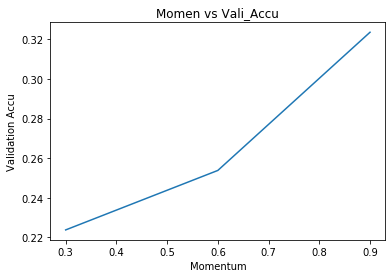

In [9]:
# plot momentum change with accu plotsu
plt.plot(momentum_list, momentum_avg_list)
plt.xlabel("Momentum")
plt.ylabel("Validation Accu")
plt.title("Momen vs Vali_Accu")
plt.show()

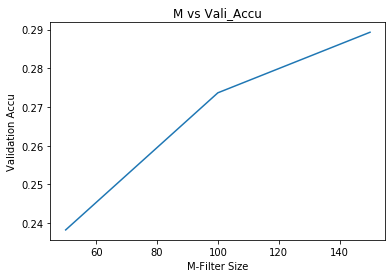

In [10]:
# plot M
plt.plot(M_list, M_avg_list)
plt.xlabel("M-Filter Size")
plt.ylabel("Validation Accu")
plt.title("M vs Vali_Accu")
plt.show()

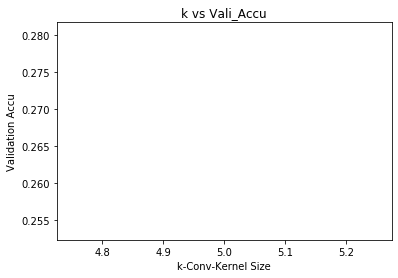

In [11]:
# plot k
plt.plot(k_list, k_avg_list)
plt.xlabel("k-Conv-Kernel Size")
plt.ylabel("Validation Accu")
plt.title("k vs Vali_Accu")
plt.show()

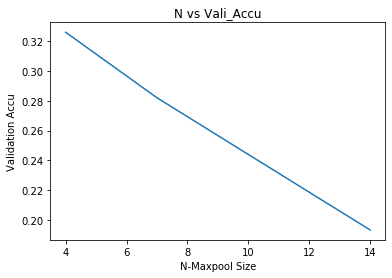

In [12]:
# plot N
plt.plot(N_list, N_avg_list)
plt.xlabel("N-Maxpool Size")
plt.ylabel("Validation Accu")
plt.title("N vs Vali_Accu")
plt.show()

In [17]:
# test accuracy with test dataset
batch_size = 1000
# load data
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)

# define a loss function
criterion = torch.nn.CrossEntropyLoss()

predicted_correct_num = 0
total_vali = 0
for i, data in  enumerate(testloader, 0):
        inputs, labels = data
        predicted_vali = torch.max(model(inputs), 1)
        
        total_vali += labels.size(0)
        predicted_correct_num += sum(predicted_vali.indices == labels)
        print("Vali {0} th batch, {1} correct, tested {2}, batch size {3}".format(i, 
                                                                      predicted_correct_num,
                                                                      batch_size*(i+1), batch_size))
        
accu_vali = predicted_correct_num.item() / total_vali    
    
print("Test Accu: ", accu_vali)

Files already downloaded and verified
Files already downloaded and verified
Vali 0 th batch, 317 correct, tested 1000, batch size 1000
Vali 1 th batch, 602 correct, tested 2000, batch size 1000
Vali 2 th batch, 907 correct, tested 3000, batch size 1000
Vali 3 th batch, 1208 correct, tested 4000, batch size 1000
Vali 4 th batch, 1517 correct, tested 5000, batch size 1000
Vali 5 th batch, 1801 correct, tested 6000, batch size 1000
Vali 6 th batch, 2104 correct, tested 7000, batch size 1000
Vali 7 th batch, 2376 correct, tested 8000, batch size 1000
Vali 8 th batch, 2662 correct, tested 9000, batch size 1000
Vali 9 th batch, 2979 correct, tested 10000, batch size 1000
Test Accu:  0.2979


Files already downloaded and verified
Files already downloaded and verified
Epoch:  1
[1, 20000] loss: 2.100
[1, 40000] loss: 1.819
Training Accu:  0.308275
Validation Accu:  0.3946
Finish Traning
Test 0 th batch, 423 correct, tested 1000, batch size 1000
Test 1 th batch, 831 correct, tested 2000, batch size 1000
Test 2 th batch, 1235 correct, tested 3000, batch size 1000
Test 3 th batch, 1658 correct, tested 4000, batch size 1000
Test 4 th batch, 2052 correct, tested 5000, batch size 1000
Test 5 th batch, 2441 correct, tested 6000, batch size 1000
Test 6 th batch, 2829 correct, tested 7000, batch size 1000
Test 7 th batch, 3233 correct, tested 8000, batch size 1000
Test 8 th batch, 3617 correct, tested 9000, batch size 1000
Test 9 th batch, 4025 correct, tested 10000, batch size 1000


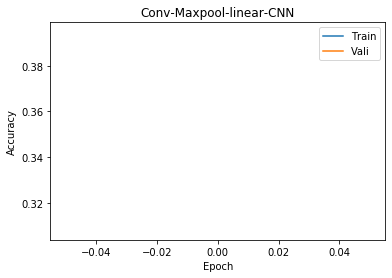

Test Accu: 0.4025
Epoch:  1
[1, 20000] loss: 1.702
[1, 40000] loss: 1.639
Training Accu:  0.430425
Validation Accu:  0.4548
Finish Traning
Test 0 th batch, 462 correct, tested 1000, batch size 1000
Test 1 th batch, 917 correct, tested 2000, batch size 1000
Test 2 th batch, 1370 correct, tested 3000, batch size 1000
Test 3 th batch, 1841 correct, tested 4000, batch size 1000
Test 4 th batch, 2306 correct, tested 5000, batch size 1000
Test 5 th batch, 2761 correct, tested 6000, batch size 1000
Test 6 th batch, 3200 correct, tested 7000, batch size 1000
Test 7 th batch, 3655 correct, tested 8000, batch size 1000
Test 8 th batch, 4084 correct, tested 9000, batch size 1000
Test 9 th batch, 4541 correct, tested 10000, batch size 1000


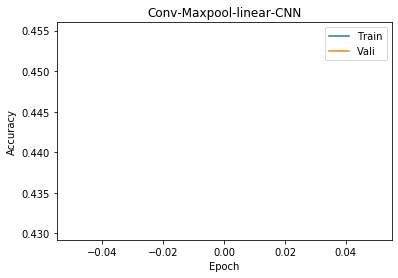

Test Accu: 0.4541
Epoch:  1
[1, 20000] loss: 1.574
[1, 40000] loss: 1.544
Training Accu:  0.4671
Validation Accu:  0.4827
Finish Traning
Test 0 th batch, 501 correct, tested 1000, batch size 1000
Test 1 th batch, 980 correct, tested 2000, batch size 1000
Test 2 th batch, 1446 correct, tested 3000, batch size 1000
Test 3 th batch, 1940 correct, tested 4000, batch size 1000
Test 4 th batch, 2444 correct, tested 5000, batch size 1000
Test 5 th batch, 2927 correct, tested 6000, batch size 1000
Test 6 th batch, 3396 correct, tested 7000, batch size 1000
Test 7 th batch, 3890 correct, tested 8000, batch size 1000
Test 8 th batch, 4350 correct, tested 9000, batch size 1000
Test 9 th batch, 4825 correct, tested 10000, batch size 1000


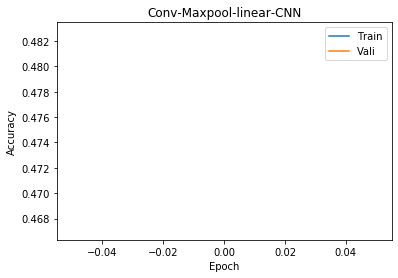

Test Accu: 0.4825
Epoch:  1
[1, 20000] loss: 1.508
[1, 40000] loss: 1.470
Training Accu:  0.491225
Validation Accu:  0.5043
Finish Traning
Test 0 th batch, 495 correct, tested 1000, batch size 1000
Test 1 th batch, 987 correct, tested 2000, batch size 1000
Test 2 th batch, 1474 correct, tested 3000, batch size 1000
Test 3 th batch, 1986 correct, tested 4000, batch size 1000
Test 4 th batch, 2493 correct, tested 5000, batch size 1000
Test 5 th batch, 3002 correct, tested 6000, batch size 1000
Test 6 th batch, 3473 correct, tested 7000, batch size 1000
Test 7 th batch, 3977 correct, tested 8000, batch size 1000
Test 8 th batch, 4459 correct, tested 9000, batch size 1000
Test 9 th batch, 4956 correct, tested 10000, batch size 1000


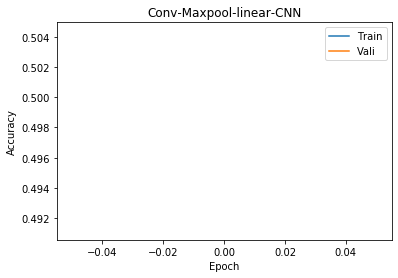

Test Accu: 0.4956
Epoch:  1
[1, 20000] loss: 1.455
[1, 40000] loss: 1.408
Training Accu:  0.5112
Validation Accu:  0.5223
Finish Traning
Test 0 th batch, 518 correct, tested 1000, batch size 1000
Test 1 th batch, 1028 correct, tested 2000, batch size 1000
Test 2 th batch, 1535 correct, tested 3000, batch size 1000
Test 3 th batch, 2063 correct, tested 4000, batch size 1000
Test 4 th batch, 2615 correct, tested 5000, batch size 1000
Test 5 th batch, 3125 correct, tested 6000, batch size 1000
Test 6 th batch, 3616 correct, tested 7000, batch size 1000
Test 7 th batch, 4149 correct, tested 8000, batch size 1000
Test 8 th batch, 4646 correct, tested 9000, batch size 1000
Test 9 th batch, 5150 correct, tested 10000, batch size 1000


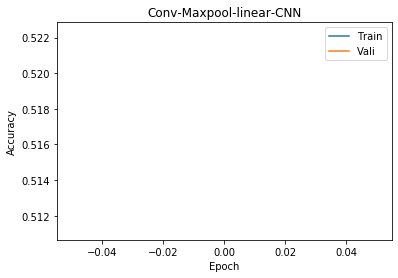

Test Accu: 0.515
Epoch:  1
[1, 20000] loss: 1.399
[1, 40000] loss: 1.371
Training Accu:  0.52605
Validation Accu:  0.5332
Finish Traning
Test 0 th batch, 533 correct, tested 1000, batch size 1000
Test 1 th batch, 1052 correct, tested 2000, batch size 1000
Test 2 th batch, 1576 correct, tested 3000, batch size 1000
Test 3 th batch, 2105 correct, tested 4000, batch size 1000
Test 4 th batch, 2653 correct, tested 5000, batch size 1000
Test 5 th batch, 3187 correct, tested 6000, batch size 1000
Test 6 th batch, 3698 correct, tested 7000, batch size 1000
Test 7 th batch, 4250 correct, tested 8000, batch size 1000
Test 8 th batch, 4754 correct, tested 9000, batch size 1000
Test 9 th batch, 5262 correct, tested 10000, batch size 1000


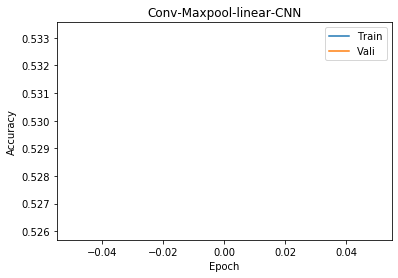

Test Accu: 0.5262
Epoch:  1
[1, 20000] loss: 1.345
[1, 40000] loss: 1.344
Training Accu:  0.5425
Validation Accu:  0.5388
Finish Traning
Test 0 th batch, 539 correct, tested 1000, batch size 1000
Test 1 th batch, 1074 correct, tested 2000, batch size 1000
Test 2 th batch, 1625 correct, tested 3000, batch size 1000
Test 3 th batch, 2172 correct, tested 4000, batch size 1000
Test 4 th batch, 2745 correct, tested 5000, batch size 1000
Test 5 th batch, 3270 correct, tested 6000, batch size 1000
Test 6 th batch, 3788 correct, tested 7000, batch size 1000
Test 7 th batch, 4346 correct, tested 8000, batch size 1000
Test 8 th batch, 4871 correct, tested 9000, batch size 1000
Test 9 th batch, 5396 correct, tested 10000, batch size 1000


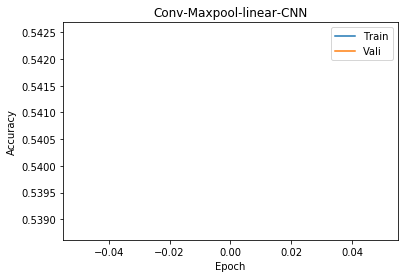

Test Accu: 0.5396
Epoch:  1
[1, 20000] loss: 1.315
[1, 40000] loss: 1.307
Training Accu:  0.554325
Validation Accu:  0.5522
Finish Traning
Test 0 th batch, 546 correct, tested 1000, batch size 1000
Test 1 th batch, 1082 correct, tested 2000, batch size 1000
Test 2 th batch, 1634 correct, tested 3000, batch size 1000
Test 3 th batch, 2193 correct, tested 4000, batch size 1000
Test 4 th batch, 2772 correct, tested 5000, batch size 1000
Test 5 th batch, 3320 correct, tested 6000, batch size 1000
Test 6 th batch, 3842 correct, tested 7000, batch size 1000
Test 7 th batch, 4405 correct, tested 8000, batch size 1000
Test 8 th batch, 4945 correct, tested 9000, batch size 1000
Test 9 th batch, 5481 correct, tested 10000, batch size 1000


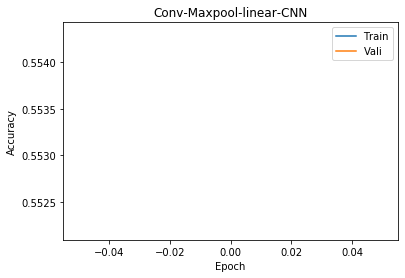

Test Accu: 0.5481
Epoch:  1
[1, 20000] loss: 1.282
[1, 40000] loss: 1.280
Training Accu:  0.564325
Validation Accu:  0.5575
Finish Traning
Test 0 th batch, 554 correct, tested 1000, batch size 1000
Test 1 th batch, 1117 correct, tested 2000, batch size 1000
Test 2 th batch, 1679 correct, tested 3000, batch size 1000
Test 3 th batch, 2236 correct, tested 4000, batch size 1000
Test 4 th batch, 2827 correct, tested 5000, batch size 1000
Test 5 th batch, 3373 correct, tested 6000, batch size 1000
Test 6 th batch, 3907 correct, tested 7000, batch size 1000
Test 7 th batch, 4485 correct, tested 8000, batch size 1000
Test 8 th batch, 5044 correct, tested 9000, batch size 1000
Test 9 th batch, 5584 correct, tested 10000, batch size 1000


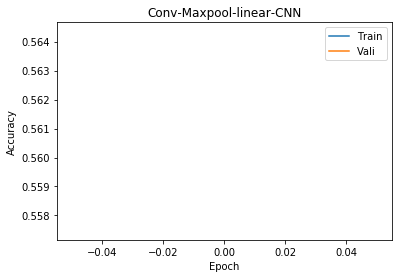

Test Accu: 0.5584
Epoch:  1
[1, 20000] loss: 1.255
[1, 40000] loss: 1.252
Training Accu:  0.57395
Validation Accu:  0.5617
Finish Traning
Test 0 th batch, 568 correct, tested 1000, batch size 1000
Test 1 th batch, 1127 correct, tested 2000, batch size 1000
Test 2 th batch, 1688 correct, tested 3000, batch size 1000
Test 3 th batch, 2244 correct, tested 4000, batch size 1000
Test 4 th batch, 2835 correct, tested 5000, batch size 1000
Test 5 th batch, 3410 correct, tested 6000, batch size 1000
Test 6 th batch, 3944 correct, tested 7000, batch size 1000
Test 7 th batch, 4521 correct, tested 8000, batch size 1000
Test 8 th batch, 5082 correct, tested 9000, batch size 1000
Test 9 th batch, 5626 correct, tested 10000, batch size 1000


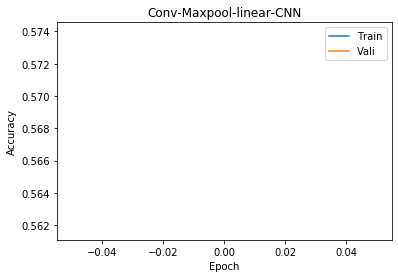

Test Accu: 0.5626
Epoch:  1
[1, 20000] loss: 1.238
[1, 40000] loss: 1.231
Training Accu:  0.5804
Validation Accu:  0.5757
Finish Traning
Test 0 th batch, 565 correct, tested 1000, batch size 1000
Test 1 th batch, 1122 correct, tested 2000, batch size 1000
Test 2 th batch, 1696 correct, tested 3000, batch size 1000
Test 3 th batch, 2262 correct, tested 4000, batch size 1000
Test 4 th batch, 2866 correct, tested 5000, batch size 1000
Test 5 th batch, 3439 correct, tested 6000, batch size 1000
Test 6 th batch, 3987 correct, tested 7000, batch size 1000
Test 7 th batch, 4568 correct, tested 8000, batch size 1000
Test 8 th batch, 5118 correct, tested 9000, batch size 1000
Test 9 th batch, 5655 correct, tested 10000, batch size 1000


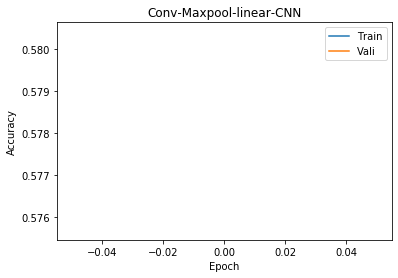

Test Accu: 0.5655
Epoch:  1
[1, 20000] loss: 1.218
[1, 40000] loss: 1.213
Training Accu:  0.5849
Validation Accu:  0.5846
Finish Traning
Test 0 th batch, 573 correct, tested 1000, batch size 1000
Test 1 th batch, 1140 correct, tested 2000, batch size 1000
Test 2 th batch, 1726 correct, tested 3000, batch size 1000
Test 3 th batch, 2304 correct, tested 4000, batch size 1000
Test 4 th batch, 2924 correct, tested 5000, batch size 1000
Test 5 th batch, 3509 correct, tested 6000, batch size 1000
Test 6 th batch, 4072 correct, tested 7000, batch size 1000
Test 7 th batch, 4675 correct, tested 8000, batch size 1000
Test 8 th batch, 5247 correct, tested 9000, batch size 1000
Test 9 th batch, 5800 correct, tested 10000, batch size 1000


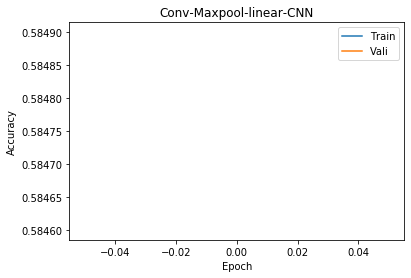

Test Accu: 0.58
Epoch:  1
[1, 20000] loss: 1.202
[1, 40000] loss: 1.195
Training Accu:  0.593175
Validation Accu:  0.5954
Finish Traning
Test 0 th batch, 588 correct, tested 1000, batch size 1000
Test 1 th batch, 1158 correct, tested 2000, batch size 1000
Test 2 th batch, 1744 correct, tested 3000, batch size 1000
Test 3 th batch, 2337 correct, tested 4000, batch size 1000
Test 4 th batch, 2955 correct, tested 5000, batch size 1000
Test 5 th batch, 3550 correct, tested 6000, batch size 1000
Test 6 th batch, 4102 correct, tested 7000, batch size 1000
Test 7 th batch, 4708 correct, tested 8000, batch size 1000
Test 8 th batch, 5289 correct, tested 9000, batch size 1000
Test 9 th batch, 5849 correct, tested 10000, batch size 1000


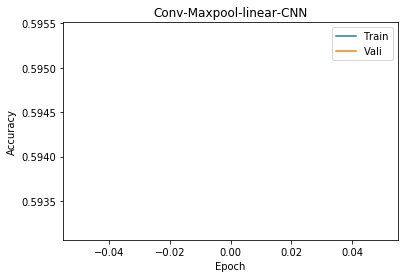

Test Accu: 0.5849
Epoch:  1
[1, 20000] loss: 1.189
[1, 40000] loss: 1.171
Training Accu:  0.59805
Validation Accu:  0.6108
Finish Traning
Test 0 th batch, 590 correct, tested 1000, batch size 1000
Test 1 th batch, 1175 correct, tested 2000, batch size 1000
Test 2 th batch, 1754 correct, tested 3000, batch size 1000
Test 3 th batch, 2358 correct, tested 4000, batch size 1000
Test 4 th batch, 2995 correct, tested 5000, batch size 1000
Test 5 th batch, 3580 correct, tested 6000, batch size 1000
Test 6 th batch, 4142 correct, tested 7000, batch size 1000
Test 7 th batch, 4751 correct, tested 8000, batch size 1000
Test 8 th batch, 5350 correct, tested 9000, batch size 1000
Test 9 th batch, 5912 correct, tested 10000, batch size 1000


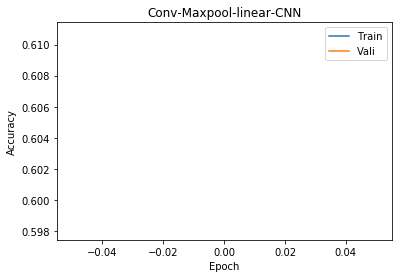

Test Accu: 0.5912
Epoch:  1
[1, 20000] loss: 1.166
[1, 40000] loss: 1.165
Training Accu:  0.60475
Validation Accu:  0.6021
Finish Traning
Test 0 th batch, 592 correct, tested 1000, batch size 1000
Test 1 th batch, 1171 correct, tested 2000, batch size 1000
Test 2 th batch, 1770 correct, tested 3000, batch size 1000
Test 3 th batch, 2362 correct, tested 4000, batch size 1000
Test 4 th batch, 2990 correct, tested 5000, batch size 1000
Test 5 th batch, 3572 correct, tested 6000, batch size 1000
Test 6 th batch, 4150 correct, tested 7000, batch size 1000
Test 7 th batch, 4762 correct, tested 8000, batch size 1000
Test 8 th batch, 5353 correct, tested 9000, batch size 1000
Test 9 th batch, 5909 correct, tested 10000, batch size 1000


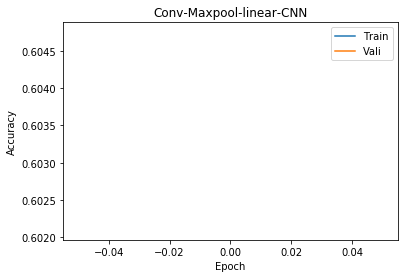

Test Accu: 0.5912
Epoch:  1
[1, 20000] loss: 1.157
[1, 40000] loss: 1.146
Training Accu:  0.609975
Validation Accu:  0.6181
Finish Traning
Test 0 th batch, 602 correct, tested 1000, batch size 1000
Test 1 th batch, 1210 correct, tested 2000, batch size 1000
Test 2 th batch, 1807 correct, tested 3000, batch size 1000
Test 3 th batch, 2419 correct, tested 4000, batch size 1000
Test 4 th batch, 3060 correct, tested 5000, batch size 1000
Test 5 th batch, 3654 correct, tested 6000, batch size 1000
Test 6 th batch, 4230 correct, tested 7000, batch size 1000
Test 7 th batch, 4834 correct, tested 8000, batch size 1000
Test 8 th batch, 5442 correct, tested 9000, batch size 1000
Test 9 th batch, 6018 correct, tested 10000, batch size 1000


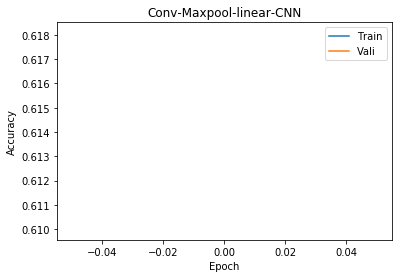

Test Accu: 0.6018
Epoch:  1
[1, 20000] loss: 1.129
[1, 40000] loss: 1.132
Training Accu:  0.6179
Validation Accu:  0.6103
Finish Traning
Test 0 th batch, 610 correct, tested 1000, batch size 1000
Test 1 th batch, 1222 correct, tested 2000, batch size 1000
Test 2 th batch, 1813 correct, tested 3000, batch size 1000
Test 3 th batch, 2424 correct, tested 4000, batch size 1000
Test 4 th batch, 3069 correct, tested 5000, batch size 1000
Test 5 th batch, 3667 correct, tested 6000, batch size 1000
Test 6 th batch, 4242 correct, tested 7000, batch size 1000
Test 7 th batch, 4849 correct, tested 8000, batch size 1000
Test 8 th batch, 5449 correct, tested 9000, batch size 1000
Test 9 th batch, 6028 correct, tested 10000, batch size 1000


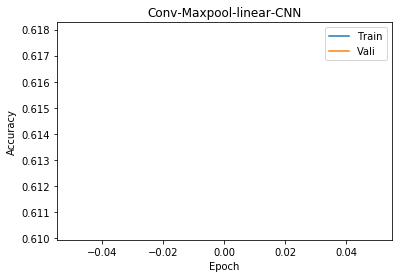

Test Accu: 0.6028
Epoch:  1
[1, 20000] loss: 1.117
[1, 40000] loss: 1.119
Training Accu:  0.621475
Validation Accu:  0.6172
Finish Traning
Test 0 th batch, 610 correct, tested 1000, batch size 1000
Test 1 th batch, 1220 correct, tested 2000, batch size 1000
Test 2 th batch, 1822 correct, tested 3000, batch size 1000
Test 3 th batch, 2436 correct, tested 4000, batch size 1000
Test 4 th batch, 3091 correct, tested 5000, batch size 1000
Test 5 th batch, 3686 correct, tested 6000, batch size 1000
Test 6 th batch, 4263 correct, tested 7000, batch size 1000
Test 7 th batch, 4891 correct, tested 8000, batch size 1000
Test 8 th batch, 5489 correct, tested 9000, batch size 1000
Test 9 th batch, 6079 correct, tested 10000, batch size 1000


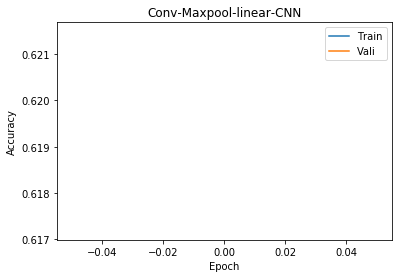

Test Accu: 0.6079
Epoch:  1
[1, 20000] loss: 1.102
[1, 40000] loss: 1.105
Training Accu:  0.625025
Validation Accu:  0.6298
Finish Traning
Test 0 th batch, 615 correct, tested 1000, batch size 1000
Test 1 th batch, 1218 correct, tested 2000, batch size 1000
Test 2 th batch, 1827 correct, tested 3000, batch size 1000
Test 3 th batch, 2449 correct, tested 4000, batch size 1000
Test 4 th batch, 3101 correct, tested 5000, batch size 1000
Test 5 th batch, 3702 correct, tested 6000, batch size 1000
Test 6 th batch, 4290 correct, tested 7000, batch size 1000
Test 7 th batch, 4917 correct, tested 8000, batch size 1000
Test 8 th batch, 5536 correct, tested 9000, batch size 1000
Test 9 th batch, 6127 correct, tested 10000, batch size 1000


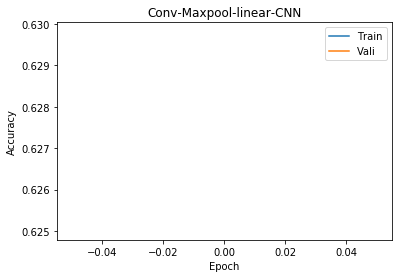

Test Accu: 0.6127
Epoch:  1
[1, 20000] loss: 1.106
[1, 40000] loss: 1.097
Training Accu:  0.6261
Validation Accu:  0.6339
Finish Traning
Test 0 th batch, 616 correct, tested 1000, batch size 1000
Test 1 th batch, 1223 correct, tested 2000, batch size 1000
Test 2 th batch, 1837 correct, tested 3000, batch size 1000
Test 3 th batch, 2465 correct, tested 4000, batch size 1000
Test 4 th batch, 3130 correct, tested 5000, batch size 1000
Test 5 th batch, 3741 correct, tested 6000, batch size 1000
Test 6 th batch, 4338 correct, tested 7000, batch size 1000
Test 7 th batch, 4967 correct, tested 8000, batch size 1000
Test 8 th batch, 5583 correct, tested 9000, batch size 1000
Test 9 th batch, 6182 correct, tested 10000, batch size 1000


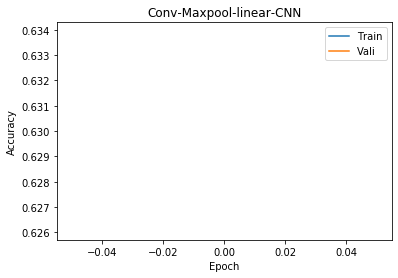

Test Accu: 0.6182
Epoch:  1
[1, 20000] loss: 1.083
[1, 40000] loss: 1.079
Training Accu:  0.634
Validation Accu:  0.626
Finish Traning
Test 0 th batch, 606 correct, tested 1000, batch size 1000
Test 1 th batch, 1210 correct, tested 2000, batch size 1000
Test 2 th batch, 1836 correct, tested 3000, batch size 1000
Test 3 th batch, 2453 correct, tested 4000, batch size 1000
Test 4 th batch, 3101 correct, tested 5000, batch size 1000
Test 5 th batch, 3717 correct, tested 6000, batch size 1000
Test 6 th batch, 4308 correct, tested 7000, batch size 1000
Test 7 th batch, 4927 correct, tested 8000, batch size 1000
Test 8 th batch, 5532 correct, tested 9000, batch size 1000
Test 9 th batch, 6120 correct, tested 10000, batch size 1000


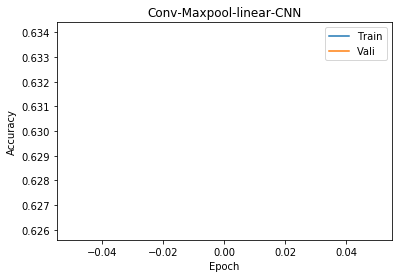

Test Accu: 0.6182
Epoch:  1
[1, 20000] loss: 1.079
[1, 40000] loss: 1.067
Training Accu:  0.63645
Validation Accu:  0.6389
Finish Traning
Test 0 th batch, 624 correct, tested 1000, batch size 1000
Test 1 th batch, 1244 correct, tested 2000, batch size 1000
Test 2 th batch, 1871 correct, tested 3000, batch size 1000
Test 3 th batch, 2512 correct, tested 4000, batch size 1000
Test 4 th batch, 3170 correct, tested 5000, batch size 1000
Test 5 th batch, 3785 correct, tested 6000, batch size 1000
Test 6 th batch, 4392 correct, tested 7000, batch size 1000
Test 7 th batch, 5016 correct, tested 8000, batch size 1000
Test 8 th batch, 5623 correct, tested 9000, batch size 1000
Test 9 th batch, 6223 correct, tested 10000, batch size 1000


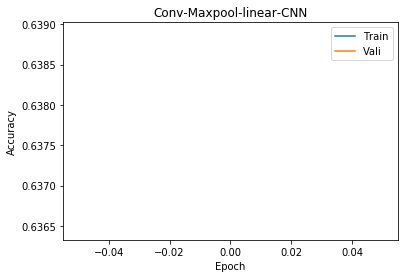

Test Accu: 0.6223
Epoch:  1
[1, 20000] loss: 1.068
[1, 40000] loss: 1.067
Training Accu:  0.638975
Validation Accu:  0.6457
Finish Traning
Test 0 th batch, 625 correct, tested 1000, batch size 1000
Test 1 th batch, 1241 correct, tested 2000, batch size 1000
Test 2 th batch, 1861 correct, tested 3000, batch size 1000
Test 3 th batch, 2492 correct, tested 4000, batch size 1000
Test 4 th batch, 3156 correct, tested 5000, batch size 1000
Test 5 th batch, 3769 correct, tested 6000, batch size 1000
Test 6 th batch, 4371 correct, tested 7000, batch size 1000
Test 7 th batch, 5003 correct, tested 8000, batch size 1000
Test 8 th batch, 5617 correct, tested 9000, batch size 1000
Test 9 th batch, 6215 correct, tested 10000, batch size 1000


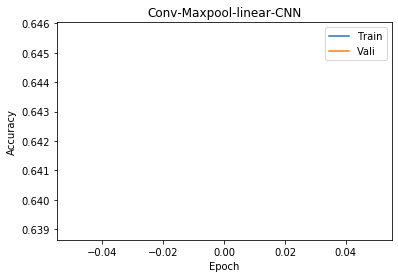

Test Accu: 0.6223
Epoch:  1
[1, 20000] loss: 1.046
[1, 40000] loss: 1.059
Training Accu:  0.6443
Validation Accu:  0.6468
Finish Traning
Test 0 th batch, 619 correct, tested 1000, batch size 1000
Test 1 th batch, 1237 correct, tested 2000, batch size 1000
Test 2 th batch, 1853 correct, tested 3000, batch size 1000
Test 3 th batch, 2492 correct, tested 4000, batch size 1000
Test 4 th batch, 3175 correct, tested 5000, batch size 1000
Test 5 th batch, 3796 correct, tested 6000, batch size 1000
Test 6 th batch, 4404 correct, tested 7000, batch size 1000
Test 7 th batch, 5038 correct, tested 8000, batch size 1000
Test 8 th batch, 5658 correct, tested 9000, batch size 1000
Test 9 th batch, 6258 correct, tested 10000, batch size 1000


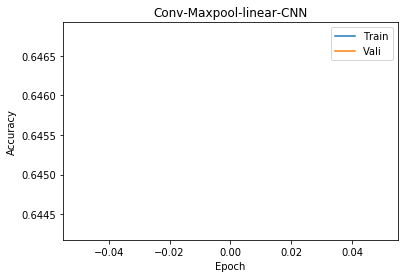

Test Accu: 0.6258
Epoch:  1
[1, 20000] loss: 1.038
[1, 40000] loss: 1.051
Training Accu:  0.647825
Validation Accu:  0.6455
Finish Traning
Test 0 th batch, 629 correct, tested 1000, batch size 1000
Test 1 th batch, 1252 correct, tested 2000, batch size 1000
Test 2 th batch, 1874 correct, tested 3000, batch size 1000
Test 3 th batch, 2524 correct, tested 4000, batch size 1000
Test 4 th batch, 3194 correct, tested 5000, batch size 1000
Test 5 th batch, 3818 correct, tested 6000, batch size 1000
Test 6 th batch, 4432 correct, tested 7000, batch size 1000
Test 7 th batch, 5065 correct, tested 8000, batch size 1000
Test 8 th batch, 5691 correct, tested 9000, batch size 1000
Test 9 th batch, 6292 correct, tested 10000, batch size 1000


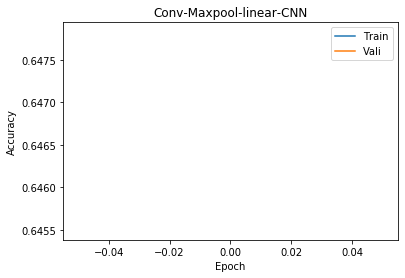

Test Accu: 0.6292
Epoch:  1
[1, 20000] loss: 1.051
[1, 40000] loss: 1.030
Training Accu:  0.648575
Validation Accu:  0.6505
Finish Traning
Test 0 th batch, 637 correct, tested 1000, batch size 1000
Test 1 th batch, 1262 correct, tested 2000, batch size 1000
Test 2 th batch, 1901 correct, tested 3000, batch size 1000
Test 3 th batch, 2551 correct, tested 4000, batch size 1000
Test 4 th batch, 3222 correct, tested 5000, batch size 1000
Test 5 th batch, 3844 correct, tested 6000, batch size 1000
Test 6 th batch, 4459 correct, tested 7000, batch size 1000
Test 7 th batch, 5103 correct, tested 8000, batch size 1000
Test 8 th batch, 5725 correct, tested 9000, batch size 1000
Test 9 th batch, 6337 correct, tested 10000, batch size 1000


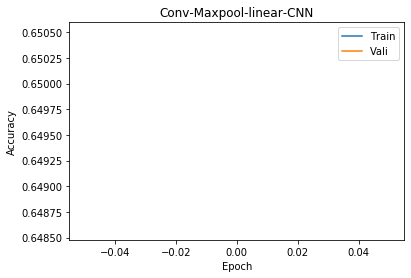

Test Accu: 0.6337
Epoch:  1
[1, 20000] loss: 1.031
[1, 40000] loss: 1.025
Training Accu:  0.653275
Validation Accu:  0.6499
Finish Traning
Test 0 th batch, 638 correct, tested 1000, batch size 1000
Test 1 th batch, 1259 correct, tested 2000, batch size 1000
Test 2 th batch, 1901 correct, tested 3000, batch size 1000
Test 3 th batch, 2555 correct, tested 4000, batch size 1000
Test 4 th batch, 3230 correct, tested 5000, batch size 1000
Test 5 th batch, 3842 correct, tested 6000, batch size 1000
Test 6 th batch, 4471 correct, tested 7000, batch size 1000
Test 7 th batch, 5111 correct, tested 8000, batch size 1000
Test 8 th batch, 5737 correct, tested 9000, batch size 1000
Test 9 th batch, 6351 correct, tested 10000, batch size 1000


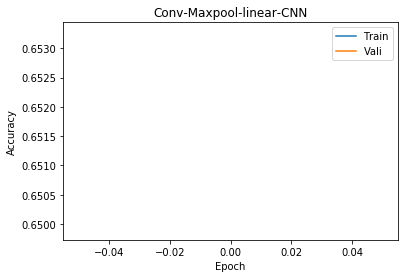

Test Accu: 0.6351
Epoch:  1
[1, 20000] loss: 1.031
[1, 40000] loss: 1.022
Training Accu:  0.653625
Validation Accu:  0.6639
Finish Traning
Test 0 th batch, 636 correct, tested 1000, batch size 1000
Test 1 th batch, 1266 correct, tested 2000, batch size 1000
Test 2 th batch, 1897 correct, tested 3000, batch size 1000
Test 3 th batch, 2540 correct, tested 4000, batch size 1000
Test 4 th batch, 3219 correct, tested 5000, batch size 1000
Test 5 th batch, 3841 correct, tested 6000, batch size 1000
Test 6 th batch, 4468 correct, tested 7000, batch size 1000
Test 7 th batch, 5112 correct, tested 8000, batch size 1000
Test 8 th batch, 5744 correct, tested 9000, batch size 1000
Test 9 th batch, 6366 correct, tested 10000, batch size 1000


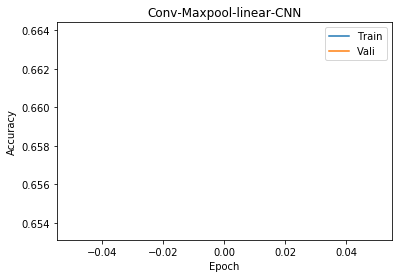

Test Accu: 0.6366
Epoch:  1
[1, 20000] loss: 1.017
[1, 40000] loss: 1.007
Training Accu:  0.659075
Validation Accu:  0.6574
Finish Traning
Test 0 th batch, 642 correct, tested 1000, batch size 1000
Test 1 th batch, 1273 correct, tested 2000, batch size 1000
Test 2 th batch, 1904 correct, tested 3000, batch size 1000
Test 3 th batch, 2558 correct, tested 4000, batch size 1000
Test 4 th batch, 3238 correct, tested 5000, batch size 1000
Test 5 th batch, 3863 correct, tested 6000, batch size 1000
Test 6 th batch, 4489 correct, tested 7000, batch size 1000
Test 7 th batch, 5141 correct, tested 8000, batch size 1000
Test 8 th batch, 5767 correct, tested 9000, batch size 1000
Test 9 th batch, 6392 correct, tested 10000, batch size 1000


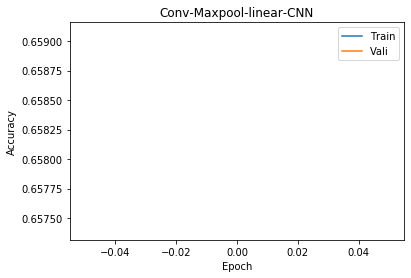

Test Accu: 0.6392
Epoch:  1
[1, 20000] loss: 0.993
[1, 40000] loss: 1.012
Training Accu:  0.661975
Validation Accu:  0.6631
Finish Traning
Test 0 th batch, 640 correct, tested 1000, batch size 1000
Test 1 th batch, 1263 correct, tested 2000, batch size 1000
Test 2 th batch, 1904 correct, tested 3000, batch size 1000
Test 3 th batch, 2565 correct, tested 4000, batch size 1000
Test 4 th batch, 3243 correct, tested 5000, batch size 1000
Test 5 th batch, 3869 correct, tested 6000, batch size 1000
Test 6 th batch, 4487 correct, tested 7000, batch size 1000
Test 7 th batch, 5136 correct, tested 8000, batch size 1000
Test 8 th batch, 5761 correct, tested 9000, batch size 1000
Test 9 th batch, 6387 correct, tested 10000, batch size 1000


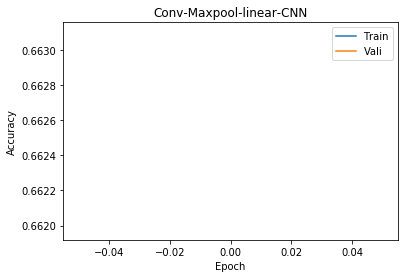

Test Accu: 0.6392
Epoch:  1
[1, 20000] loss: 1.003
[1, 40000] loss: 1.005
Training Accu:  0.65975
Validation Accu:  0.6698
Finish Traning
Test 0 th batch, 646 correct, tested 1000, batch size 1000
Test 1 th batch, 1285 correct, tested 2000, batch size 1000
Test 2 th batch, 1916 correct, tested 3000, batch size 1000
Test 3 th batch, 2577 correct, tested 4000, batch size 1000
Test 4 th batch, 3264 correct, tested 5000, batch size 1000
Test 5 th batch, 3903 correct, tested 6000, batch size 1000
Test 6 th batch, 4533 correct, tested 7000, batch size 1000
Test 7 th batch, 5195 correct, tested 8000, batch size 1000
Test 8 th batch, 5836 correct, tested 9000, batch size 1000
Test 9 th batch, 6460 correct, tested 10000, batch size 1000


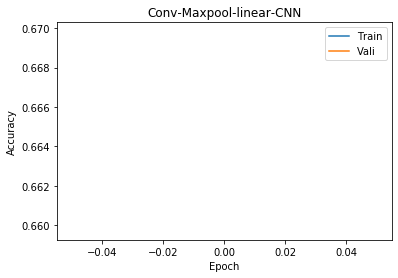

Test Accu: 0.646
Epoch:  1
[1, 20000] loss: 0.991
[1, 40000] loss: 0.988
Training Accu:  0.666825
Validation Accu:  0.6666
Finish Traning
Test 0 th batch, 646 correct, tested 1000, batch size 1000
Test 1 th batch, 1281 correct, tested 2000, batch size 1000
Test 2 th batch, 1927 correct, tested 3000, batch size 1000
Test 3 th batch, 2585 correct, tested 4000, batch size 1000
Test 4 th batch, 3267 correct, tested 5000, batch size 1000
Test 5 th batch, 3899 correct, tested 6000, batch size 1000
Test 6 th batch, 4530 correct, tested 7000, batch size 1000
Test 7 th batch, 5178 correct, tested 8000, batch size 1000
Test 8 th batch, 5806 correct, tested 9000, batch size 1000
Test 9 th batch, 6429 correct, tested 10000, batch size 1000


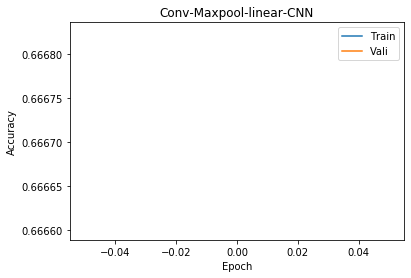

Test Accu: 0.646
Epoch:  1
[1, 20000] loss: 0.993
[1, 40000] loss: 0.983
Training Accu:  0.666475
Validation Accu:  0.672
Finish Traning
Test 0 th batch, 647 correct, tested 1000, batch size 1000
Test 1 th batch, 1282 correct, tested 2000, batch size 1000
Test 2 th batch, 1927 correct, tested 3000, batch size 1000
Test 3 th batch, 2592 correct, tested 4000, batch size 1000
Test 4 th batch, 3279 correct, tested 5000, batch size 1000
Test 5 th batch, 3911 correct, tested 6000, batch size 1000
Test 6 th batch, 4542 correct, tested 7000, batch size 1000
Test 7 th batch, 5197 correct, tested 8000, batch size 1000
Test 8 th batch, 5832 correct, tested 9000, batch size 1000
Test 9 th batch, 6460 correct, tested 10000, batch size 1000


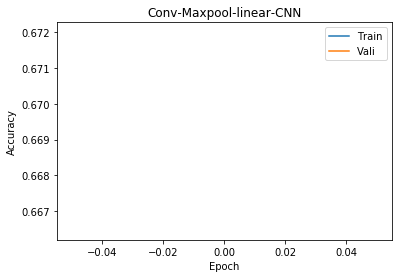

Test Accu: 0.646
Epoch:  1
[1, 20000] loss: 0.977
[1, 40000] loss: 0.988
Training Accu:  0.66875
Validation Accu:  0.6701
Finish Traning
Test 0 th batch, 655 correct, tested 1000, batch size 1000
Test 1 th batch, 1300 correct, tested 2000, batch size 1000
Test 2 th batch, 1931 correct, tested 3000, batch size 1000
Test 3 th batch, 2590 correct, tested 4000, batch size 1000
Test 4 th batch, 3280 correct, tested 5000, batch size 1000
Test 5 th batch, 3915 correct, tested 6000, batch size 1000
Test 6 th batch, 4541 correct, tested 7000, batch size 1000
Test 7 th batch, 5196 correct, tested 8000, batch size 1000
Test 8 th batch, 5822 correct, tested 9000, batch size 1000
Test 9 th batch, 6456 correct, tested 10000, batch size 1000


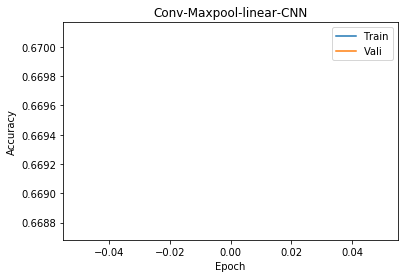

Test Accu: 0.646
Epoch:  1
[1, 20000] loss: 0.971
[1, 40000] loss: 0.971
Training Accu:  0.673075
Validation Accu:  0.6695
Finish Traning
Test 0 th batch, 656 correct, tested 1000, batch size 1000
Test 1 th batch, 1294 correct, tested 2000, batch size 1000
Test 2 th batch, 1942 correct, tested 3000, batch size 1000
Test 3 th batch, 2615 correct, tested 4000, batch size 1000
Test 4 th batch, 3307 correct, tested 5000, batch size 1000
Test 5 th batch, 3942 correct, tested 6000, batch size 1000
Test 6 th batch, 4575 correct, tested 7000, batch size 1000
Test 7 th batch, 5231 correct, tested 8000, batch size 1000
Test 8 th batch, 5868 correct, tested 9000, batch size 1000
Test 9 th batch, 6498 correct, tested 10000, batch size 1000


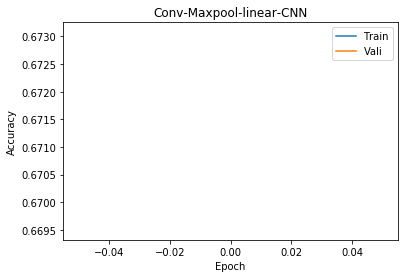

Test Accu: 0.6498
Epoch:  1
[1, 20000] loss: 0.958
[1, 40000] loss: 0.975
Training Accu:  0.6727
Validation Accu:  0.6753
Finish Traning
Test 0 th batch, 657 correct, tested 1000, batch size 1000
Test 1 th batch, 1297 correct, tested 2000, batch size 1000
Test 2 th batch, 1938 correct, tested 3000, batch size 1000
Test 3 th batch, 2601 correct, tested 4000, batch size 1000
Test 4 th batch, 3293 correct, tested 5000, batch size 1000
Test 5 th batch, 3925 correct, tested 6000, batch size 1000
Test 6 th batch, 4561 correct, tested 7000, batch size 1000
Test 7 th batch, 5222 correct, tested 8000, batch size 1000
Test 8 th batch, 5854 correct, tested 9000, batch size 1000
Test 9 th batch, 6478 correct, tested 10000, batch size 1000


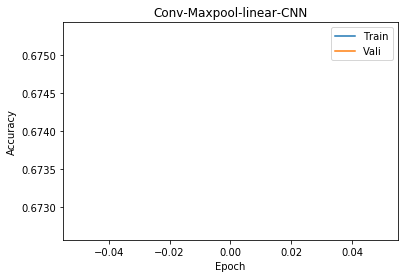

Test Accu: 0.6498
Epoch:  1
[1, 20000] loss: 0.964
[1, 40000] loss: 0.964
Training Accu:  0.67585
Validation Accu:  0.6788
Finish Traning
Test 0 th batch, 647 correct, tested 1000, batch size 1000
Test 1 th batch, 1288 correct, tested 2000, batch size 1000
Test 2 th batch, 1938 correct, tested 3000, batch size 1000
Test 3 th batch, 2604 correct, tested 4000, batch size 1000
Test 4 th batch, 3299 correct, tested 5000, batch size 1000
Test 5 th batch, 3943 correct, tested 6000, batch size 1000
Test 6 th batch, 4581 correct, tested 7000, batch size 1000
Test 7 th batch, 5242 correct, tested 8000, batch size 1000
Test 8 th batch, 5877 correct, tested 9000, batch size 1000
Test 9 th batch, 6509 correct, tested 10000, batch size 1000


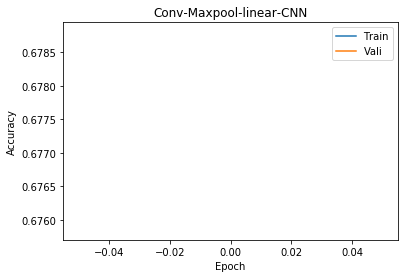

Test Accu: 0.6509
Epoch:  1
[1, 20000] loss: 0.953
[1, 40000] loss: 0.959
Training Accu:  0.678725
Validation Accu:  0.6851
Finish Traning
Test 0 th batch, 658 correct, tested 1000, batch size 1000
Test 1 th batch, 1297 correct, tested 2000, batch size 1000
Test 2 th batch, 1944 correct, tested 3000, batch size 1000
Test 3 th batch, 2611 correct, tested 4000, batch size 1000
Test 4 th batch, 3307 correct, tested 5000, batch size 1000
Test 5 th batch, 3949 correct, tested 6000, batch size 1000
Test 6 th batch, 4578 correct, tested 7000, batch size 1000
Test 7 th batch, 5246 correct, tested 8000, batch size 1000
Test 8 th batch, 5890 correct, tested 9000, batch size 1000
Test 9 th batch, 6536 correct, tested 10000, batch size 1000


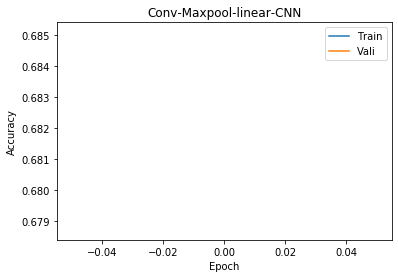

Test Accu: 0.6536
Epoch:  1
[1, 20000] loss: 0.942
[1, 40000] loss: 0.946
Training Accu:  0.68275
Validation Accu:  0.6698
Finish Traning
Test 0 th batch, 661 correct, tested 1000, batch size 1000
Test 1 th batch, 1301 correct, tested 2000, batch size 1000
Test 2 th batch, 1954 correct, tested 3000, batch size 1000
Test 3 th batch, 2621 correct, tested 4000, batch size 1000
Test 4 th batch, 3314 correct, tested 5000, batch size 1000
Test 5 th batch, 3961 correct, tested 6000, batch size 1000
Test 6 th batch, 4598 correct, tested 7000, batch size 1000
Test 7 th batch, 5257 correct, tested 8000, batch size 1000
Test 8 th batch, 5899 correct, tested 9000, batch size 1000
Test 9 th batch, 6534 correct, tested 10000, batch size 1000


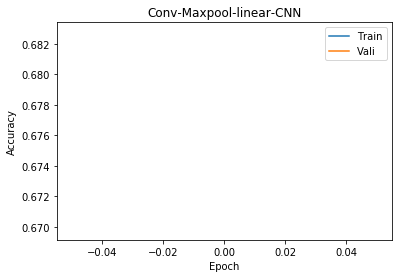

Test Accu: 0.6536
Epoch:  1
[1, 20000] loss: 0.940
[1, 40000] loss: 0.951
Training Accu:  0.68205
Validation Accu:  0.6796
Finish Traning
Test 0 th batch, 655 correct, tested 1000, batch size 1000
Test 1 th batch, 1303 correct, tested 2000, batch size 1000
Test 2 th batch, 1948 correct, tested 3000, batch size 1000
Test 3 th batch, 2612 correct, tested 4000, batch size 1000
Test 4 th batch, 3313 correct, tested 5000, batch size 1000
Test 5 th batch, 3971 correct, tested 6000, batch size 1000
Test 6 th batch, 4603 correct, tested 7000, batch size 1000
Test 7 th batch, 5261 correct, tested 8000, batch size 1000
Test 8 th batch, 5904 correct, tested 9000, batch size 1000
Test 9 th batch, 6548 correct, tested 10000, batch size 1000


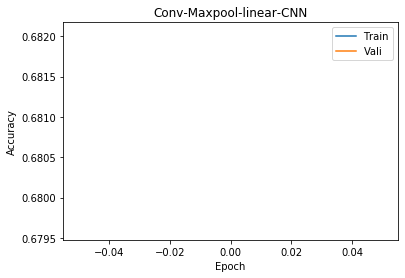

Test Accu: 0.6548
Epoch:  1
[1, 20000] loss: 0.944
[1, 40000] loss: 0.945
Training Accu:  0.6814
Validation Accu:  0.6828
Finish Traning
Test 0 th batch, 659 correct, tested 1000, batch size 1000
Test 1 th batch, 1301 correct, tested 2000, batch size 1000
Test 2 th batch, 1949 correct, tested 3000, batch size 1000
Test 3 th batch, 2616 correct, tested 4000, batch size 1000
Test 4 th batch, 3307 correct, tested 5000, batch size 1000
Test 5 th batch, 3941 correct, tested 6000, batch size 1000
Test 6 th batch, 4575 correct, tested 7000, batch size 1000
Test 7 th batch, 5231 correct, tested 8000, batch size 1000
Test 8 th batch, 5875 correct, tested 9000, batch size 1000
Test 9 th batch, 6511 correct, tested 10000, batch size 1000


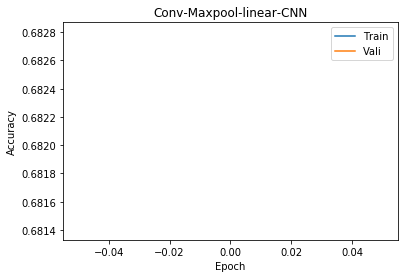

Test Accu: 0.6548
Epoch:  1
[1, 20000] loss: 0.945
[1, 40000] loss: 0.938
Training Accu:  0.68245
Validation Accu:  0.6838
Finish Traning
Test 0 th batch, 661 correct, tested 1000, batch size 1000
Test 1 th batch, 1301 correct, tested 2000, batch size 1000
Test 2 th batch, 1954 correct, tested 3000, batch size 1000
Test 3 th batch, 2619 correct, tested 4000, batch size 1000
Test 4 th batch, 3310 correct, tested 5000, batch size 1000
Test 5 th batch, 3952 correct, tested 6000, batch size 1000
Test 6 th batch, 4586 correct, tested 7000, batch size 1000
Test 7 th batch, 5255 correct, tested 8000, batch size 1000
Test 8 th batch, 5893 correct, tested 9000, batch size 1000
Test 9 th batch, 6530 correct, tested 10000, batch size 1000


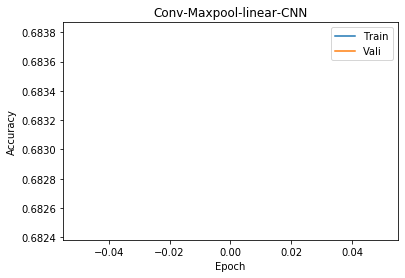

Test Accu: 0.6548
Epoch:  1
[1, 20000] loss: 0.917
[1, 40000] loss: 0.941
Training Accu:  0.68685
Validation Accu:  0.6816
Finish Traning
Test 0 th batch, 665 correct, tested 1000, batch size 1000
Test 1 th batch, 1314 correct, tested 2000, batch size 1000
Test 2 th batch, 1966 correct, tested 3000, batch size 1000
Test 3 th batch, 2640 correct, tested 4000, batch size 1000
Test 4 th batch, 3342 correct, tested 5000, batch size 1000
Test 5 th batch, 3983 correct, tested 6000, batch size 1000
Test 6 th batch, 4624 correct, tested 7000, batch size 1000
Test 7 th batch, 5289 correct, tested 8000, batch size 1000
Test 8 th batch, 5930 correct, tested 9000, batch size 1000
Test 9 th batch, 6572 correct, tested 10000, batch size 1000


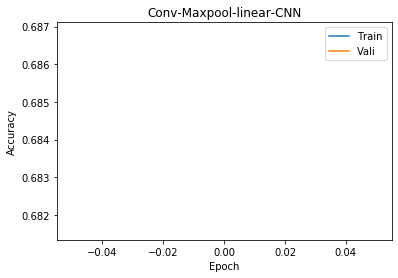

Test Accu: 0.6572
Epoch:  1
[1, 20000] loss: 0.924
[1, 40000] loss: 0.919
Training Accu:  0.69
Validation Accu:  0.6762
Finish Traning
Test 0 th batch, 661 correct, tested 1000, batch size 1000
Test 1 th batch, 1304 correct, tested 2000, batch size 1000
Test 2 th batch, 1961 correct, tested 3000, batch size 1000
Test 3 th batch, 2633 correct, tested 4000, batch size 1000
Test 4 th batch, 3333 correct, tested 5000, batch size 1000
Test 5 th batch, 3982 correct, tested 6000, batch size 1000
Test 6 th batch, 4620 correct, tested 7000, batch size 1000
Test 7 th batch, 5284 correct, tested 8000, batch size 1000
Test 8 th batch, 5933 correct, tested 9000, batch size 1000
Test 9 th batch, 6579 correct, tested 10000, batch size 1000


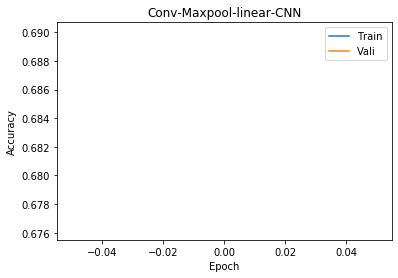

Test Accu: 0.6579
Epoch:  1
[1, 20000] loss: 0.911
[1, 40000] loss: 0.932
Training Accu:  0.690325
Validation Accu:  0.6848
Finish Traning
Test 0 th batch, 667 correct, tested 1000, batch size 1000
Test 1 th batch, 1313 correct, tested 2000, batch size 1000
Test 2 th batch, 1962 correct, tested 3000, batch size 1000
Test 3 th batch, 2636 correct, tested 4000, batch size 1000
Test 4 th batch, 3325 correct, tested 5000, batch size 1000
Test 5 th batch, 3989 correct, tested 6000, batch size 1000
Test 6 th batch, 4618 correct, tested 7000, batch size 1000
Test 7 th batch, 5288 correct, tested 8000, batch size 1000
Test 8 th batch, 5938 correct, tested 9000, batch size 1000
Test 9 th batch, 6591 correct, tested 10000, batch size 1000


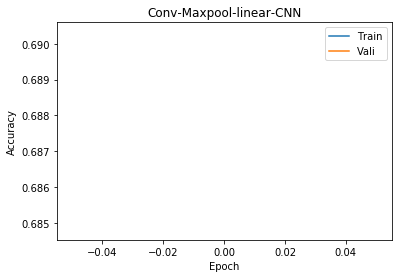

Test Accu: 0.6591
Epoch:  1
[1, 20000] loss: 0.912
[1, 40000] loss: 0.929
Training Accu:  0.68955
Validation Accu:  0.691
Finish Traning
Test 0 th batch, 662 correct, tested 1000, batch size 1000
Test 1 th batch, 1307 correct, tested 2000, batch size 1000
Test 2 th batch, 1953 correct, tested 3000, batch size 1000
Test 3 th batch, 2638 correct, tested 4000, batch size 1000
Test 4 th batch, 3343 correct, tested 5000, batch size 1000
Test 5 th batch, 3995 correct, tested 6000, batch size 1000
Test 6 th batch, 4630 correct, tested 7000, batch size 1000
Test 7 th batch, 5294 correct, tested 8000, batch size 1000
Test 8 th batch, 5921 correct, tested 9000, batch size 1000
Test 9 th batch, 6570 correct, tested 10000, batch size 1000


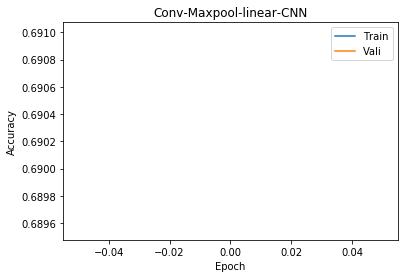

Test Accu: 0.6591
Epoch:  1
[1, 20000] loss: 0.905
[1, 40000] loss: 0.926
Training Accu:  0.692775
Validation Accu:  0.6957
Finish Traning
Test 0 th batch, 678 correct, tested 1000, batch size 1000
Test 1 th batch, 1337 correct, tested 2000, batch size 1000
Test 2 th batch, 1998 correct, tested 3000, batch size 1000
Test 3 th batch, 2676 correct, tested 4000, batch size 1000
Test 4 th batch, 3384 correct, tested 5000, batch size 1000
Test 5 th batch, 4038 correct, tested 6000, batch size 1000
Test 6 th batch, 4682 correct, tested 7000, batch size 1000
Test 7 th batch, 5347 correct, tested 8000, batch size 1000
Test 8 th batch, 5996 correct, tested 9000, batch size 1000
Test 9 th batch, 6653 correct, tested 10000, batch size 1000


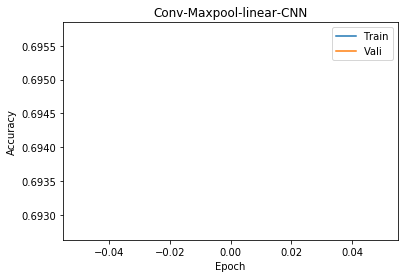

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.911
[1, 40000] loss: 0.912
Training Accu:  0.693075
Validation Accu:  0.6901
Finish Traning
Test 0 th batch, 665 correct, tested 1000, batch size 1000
Test 1 th batch, 1315 correct, tested 2000, batch size 1000
Test 2 th batch, 1970 correct, tested 3000, batch size 1000
Test 3 th batch, 2641 correct, tested 4000, batch size 1000
Test 4 th batch, 3336 correct, tested 5000, batch size 1000
Test 5 th batch, 3980 correct, tested 6000, batch size 1000
Test 6 th batch, 4620 correct, tested 7000, batch size 1000
Test 7 th batch, 5294 correct, tested 8000, batch size 1000
Test 8 th batch, 5936 correct, tested 9000, batch size 1000
Test 9 th batch, 6584 correct, tested 10000, batch size 1000


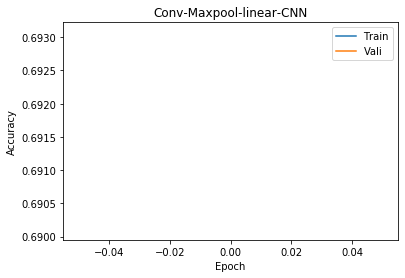

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.902
[1, 40000] loss: 0.907
Training Accu:  0.695975
Validation Accu:  0.6951
Finish Traning
Test 0 th batch, 664 correct, tested 1000, batch size 1000
Test 1 th batch, 1313 correct, tested 2000, batch size 1000
Test 2 th batch, 1973 correct, tested 3000, batch size 1000
Test 3 th batch, 2655 correct, tested 4000, batch size 1000
Test 4 th batch, 3352 correct, tested 5000, batch size 1000
Test 5 th batch, 4011 correct, tested 6000, batch size 1000
Test 6 th batch, 4657 correct, tested 7000, batch size 1000
Test 7 th batch, 5329 correct, tested 8000, batch size 1000
Test 8 th batch, 5990 correct, tested 9000, batch size 1000
Test 9 th batch, 6642 correct, tested 10000, batch size 1000


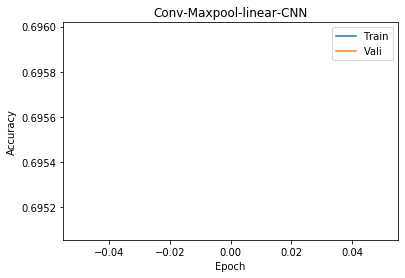

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.900
[1, 40000] loss: 0.908
Training Accu:  0.6964
Validation Accu:  0.6994
Finish Traning
Test 0 th batch, 674 correct, tested 1000, batch size 1000
Test 1 th batch, 1321 correct, tested 2000, batch size 1000
Test 2 th batch, 1973 correct, tested 3000, batch size 1000
Test 3 th batch, 2660 correct, tested 4000, batch size 1000
Test 4 th batch, 3361 correct, tested 5000, batch size 1000
Test 5 th batch, 4017 correct, tested 6000, batch size 1000
Test 6 th batch, 4664 correct, tested 7000, batch size 1000
Test 7 th batch, 5328 correct, tested 8000, batch size 1000
Test 8 th batch, 5968 correct, tested 9000, batch size 1000
Test 9 th batch, 6618 correct, tested 10000, batch size 1000


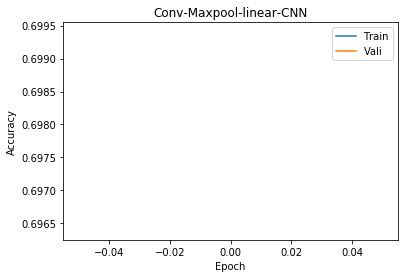

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.896
[1, 40000] loss: 0.907
Training Accu:  0.6978
Validation Accu:  0.699
Finish Traning
Test 0 th batch, 669 correct, tested 1000, batch size 1000
Test 1 th batch, 1313 correct, tested 2000, batch size 1000
Test 2 th batch, 1976 correct, tested 3000, batch size 1000
Test 3 th batch, 2659 correct, tested 4000, batch size 1000
Test 4 th batch, 3361 correct, tested 5000, batch size 1000
Test 5 th batch, 4014 correct, tested 6000, batch size 1000
Test 6 th batch, 4649 correct, tested 7000, batch size 1000
Test 7 th batch, 5323 correct, tested 8000, batch size 1000
Test 8 th batch, 5969 correct, tested 9000, batch size 1000
Test 9 th batch, 6626 correct, tested 10000, batch size 1000


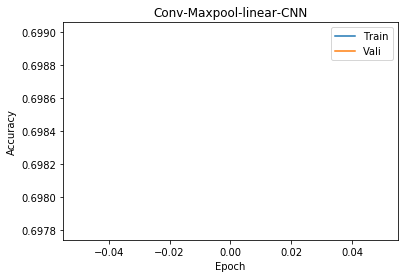

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.888
[1, 40000] loss: 0.907
Training Accu:  0.6984
Validation Accu:  0.6998
Finish Traning
Test 0 th batch, 660 correct, tested 1000, batch size 1000
Test 1 th batch, 1306 correct, tested 2000, batch size 1000
Test 2 th batch, 1968 correct, tested 3000, batch size 1000
Test 3 th batch, 2652 correct, tested 4000, batch size 1000
Test 4 th batch, 3349 correct, tested 5000, batch size 1000
Test 5 th batch, 3987 correct, tested 6000, batch size 1000
Test 6 th batch, 4625 correct, tested 7000, batch size 1000
Test 7 th batch, 5299 correct, tested 8000, batch size 1000
Test 8 th batch, 5946 correct, tested 9000, batch size 1000
Test 9 th batch, 6582 correct, tested 10000, batch size 1000


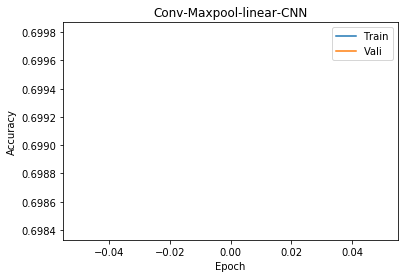

Test Accu: 0.6653
Epoch:  1
[1, 20000] loss: 0.899
[1, 40000] loss: 0.889
Training Accu:  0.70275
Validation Accu:  0.7014
Finish Traning
Test 0 th batch, 674 correct, tested 1000, batch size 1000
Test 1 th batch, 1340 correct, tested 2000, batch size 1000
Test 2 th batch, 1991 correct, tested 3000, batch size 1000
Test 3 th batch, 2677 correct, tested 4000, batch size 1000
Test 4 th batch, 3380 correct, tested 5000, batch size 1000
Test 5 th batch, 4038 correct, tested 6000, batch size 1000
Test 6 th batch, 4691 correct, tested 7000, batch size 1000
Test 7 th batch, 5368 correct, tested 8000, batch size 1000
Test 8 th batch, 6021 correct, tested 9000, batch size 1000
Test 9 th batch, 6673 correct, tested 10000, batch size 1000


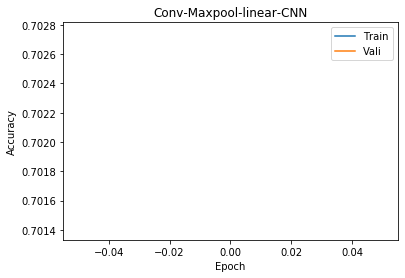

Test Accu: 0.6673
Epoch:  1
[1, 20000] loss: 0.879
[1, 40000] loss: 0.901
Training Accu:  0.699825
Validation Accu:  0.7029
Finish Traning
Test 0 th batch, 671 correct, tested 1000, batch size 1000
Test 1 th batch, 1332 correct, tested 2000, batch size 1000
Test 2 th batch, 1991 correct, tested 3000, batch size 1000
Test 3 th batch, 2683 correct, tested 4000, batch size 1000
Test 4 th batch, 3403 correct, tested 5000, batch size 1000
Test 5 th batch, 4073 correct, tested 6000, batch size 1000
Test 6 th batch, 4723 correct, tested 7000, batch size 1000
Test 7 th batch, 5398 correct, tested 8000, batch size 1000
Test 8 th batch, 6040 correct, tested 9000, batch size 1000
Test 9 th batch, 6698 correct, tested 10000, batch size 1000


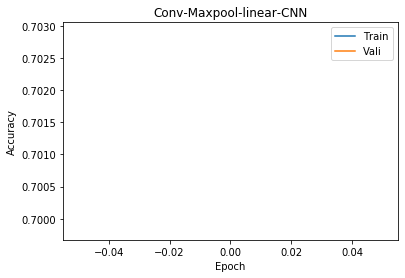

Test Accu: 0.6698
Epoch:  1
[1, 20000] loss: 0.881
[1, 40000] loss: 0.888
Training Accu:  0.701525
Validation Accu:  0.706
Finish Traning
Test 0 th batch, 681 correct, tested 1000, batch size 1000
Test 1 th batch, 1339 correct, tested 2000, batch size 1000
Test 2 th batch, 1995 correct, tested 3000, batch size 1000
Test 3 th batch, 2676 correct, tested 4000, batch size 1000
Test 4 th batch, 3379 correct, tested 5000, batch size 1000
Test 5 th batch, 4040 correct, tested 6000, batch size 1000
Test 6 th batch, 4696 correct, tested 7000, batch size 1000
Test 7 th batch, 5364 correct, tested 8000, batch size 1000
Test 8 th batch, 6022 correct, tested 9000, batch size 1000
Test 9 th batch, 6676 correct, tested 10000, batch size 1000


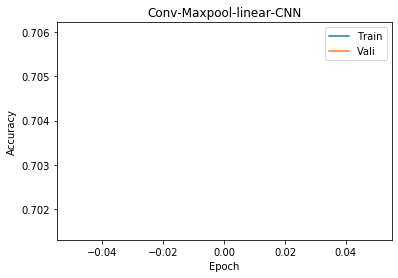

Test Accu: 0.6698
Epoch:  1
[1, 20000] loss: 0.874
[1, 40000] loss: 0.893
Training Accu:  0.70405
Validation Accu:  0.703
Finish Traning
Test 0 th batch, 677 correct, tested 1000, batch size 1000
Test 1 th batch, 1330 correct, tested 2000, batch size 1000
Test 2 th batch, 1991 correct, tested 3000, batch size 1000
Test 3 th batch, 2679 correct, tested 4000, batch size 1000
Test 4 th batch, 3392 correct, tested 5000, batch size 1000
Test 5 th batch, 4059 correct, tested 6000, batch size 1000
Test 6 th batch, 4707 correct, tested 7000, batch size 1000
Test 7 th batch, 5386 correct, tested 8000, batch size 1000
Test 8 th batch, 6037 correct, tested 9000, batch size 1000
Test 9 th batch, 6708 correct, tested 10000, batch size 1000


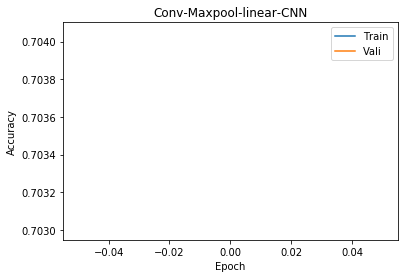

Test Accu: 0.6708
Epoch:  1
[1, 20000] loss: 0.873
[1, 40000] loss: 0.880
Training Accu:  0.70635
Validation Accu:  0.7007
Finish Traning
Test 0 th batch, 681 correct, tested 1000, batch size 1000
Test 1 th batch, 1351 correct, tested 2000, batch size 1000
Test 2 th batch, 2017 correct, tested 3000, batch size 1000
Test 3 th batch, 2703 correct, tested 4000, batch size 1000
Test 4 th batch, 3406 correct, tested 5000, batch size 1000
Test 5 th batch, 4061 correct, tested 6000, batch size 1000
Test 6 th batch, 4717 correct, tested 7000, batch size 1000
Test 7 th batch, 5388 correct, tested 8000, batch size 1000
Test 8 th batch, 6034 correct, tested 9000, batch size 1000
Test 9 th batch, 6688 correct, tested 10000, batch size 1000


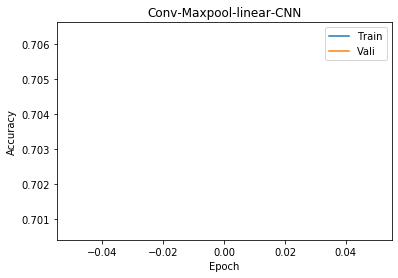

Test Accu: 0.6708
Epoch:  1
[1, 20000] loss: 0.879
[1, 40000] loss: 0.875
Training Accu:  0.707725
Validation Accu:  0.7085
Finish Traning
Test 0 th batch, 680 correct, tested 1000, batch size 1000
Test 1 th batch, 1346 correct, tested 2000, batch size 1000
Test 2 th batch, 2008 correct, tested 3000, batch size 1000
Test 3 th batch, 2696 correct, tested 4000, batch size 1000
Test 4 th batch, 3402 correct, tested 5000, batch size 1000
Test 5 th batch, 4060 correct, tested 6000, batch size 1000
Test 6 th batch, 4711 correct, tested 7000, batch size 1000
Test 7 th batch, 5383 correct, tested 8000, batch size 1000
Test 8 th batch, 6032 correct, tested 9000, batch size 1000
Test 9 th batch, 6693 correct, tested 10000, batch size 1000


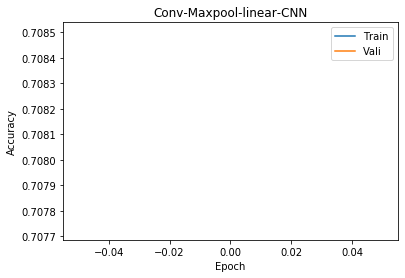

Test Accu: 0.6708
Epoch:  1
[1, 20000] loss: 0.866
[1, 40000] loss: 0.872
Training Accu:  0.7095
Validation Accu:  0.7037
Finish Traning
Test 0 th batch, 684 correct, tested 1000, batch size 1000
Test 1 th batch, 1342 correct, tested 2000, batch size 1000
Test 2 th batch, 1999 correct, tested 3000, batch size 1000
Test 3 th batch, 2691 correct, tested 4000, batch size 1000
Test 4 th batch, 3402 correct, tested 5000, batch size 1000
Test 5 th batch, 4065 correct, tested 6000, batch size 1000
Test 6 th batch, 4718 correct, tested 7000, batch size 1000
Test 7 th batch, 5400 correct, tested 8000, batch size 1000
Test 8 th batch, 6047 correct, tested 9000, batch size 1000
Test 9 th batch, 6713 correct, tested 10000, batch size 1000


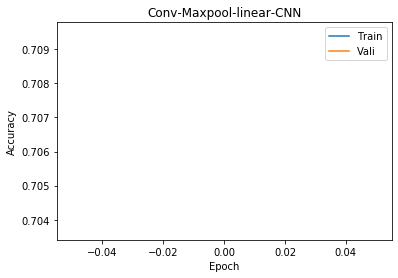

Test Accu: 0.6713
Epoch:  1
[1, 20000] loss: 0.864
[1, 40000] loss: 0.870
Training Accu:  0.7113
Validation Accu:  0.7048
Finish Traning
Test 0 th batch, 691 correct, tested 1000, batch size 1000
Test 1 th batch, 1353 correct, tested 2000, batch size 1000
Test 2 th batch, 2012 correct, tested 3000, batch size 1000
Test 3 th batch, 2697 correct, tested 4000, batch size 1000
Test 4 th batch, 3407 correct, tested 5000, batch size 1000
Test 5 th batch, 4071 correct, tested 6000, batch size 1000
Test 6 th batch, 4729 correct, tested 7000, batch size 1000
Test 7 th batch, 5405 correct, tested 8000, batch size 1000
Test 8 th batch, 6058 correct, tested 9000, batch size 1000
Test 9 th batch, 6720 correct, tested 10000, batch size 1000


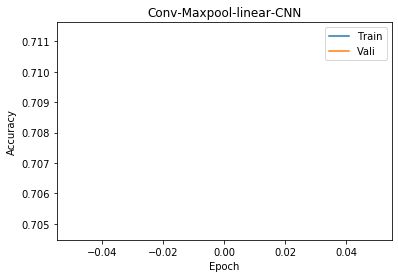

Test Accu: 0.672
Epoch:  1
[1, 20000] loss: 0.864
[1, 40000] loss: 0.870
Training Accu:  0.711675
Validation Accu:  0.7109
Finish Traning
Test 0 th batch, 691 correct, tested 1000, batch size 1000
Test 1 th batch, 1350 correct, tested 2000, batch size 1000
Test 2 th batch, 2016 correct, tested 3000, batch size 1000
Test 3 th batch, 2705 correct, tested 4000, batch size 1000
Test 4 th batch, 3412 correct, tested 5000, batch size 1000
Test 5 th batch, 4078 correct, tested 6000, batch size 1000
Test 6 th batch, 4721 correct, tested 7000, batch size 1000
Test 7 th batch, 5399 correct, tested 8000, batch size 1000
Test 8 th batch, 6055 correct, tested 9000, batch size 1000
Test 9 th batch, 6711 correct, tested 10000, batch size 1000


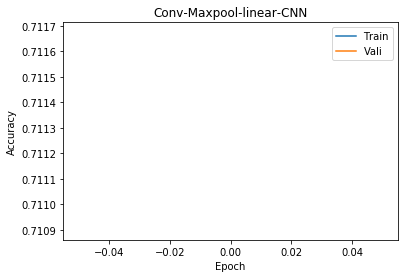

Test Accu: 0.672
Epoch:  1
[1, 20000] loss: 0.865
[1, 40000] loss: 0.856
Training Accu:  0.711675
Validation Accu:  0.709
Finish Traning
Test 0 th batch, 684 correct, tested 1000, batch size 1000
Test 1 th batch, 1351 correct, tested 2000, batch size 1000
Test 2 th batch, 2014 correct, tested 3000, batch size 1000
Test 3 th batch, 2700 correct, tested 4000, batch size 1000
Test 4 th batch, 3411 correct, tested 5000, batch size 1000
Test 5 th batch, 4067 correct, tested 6000, batch size 1000
Test 6 th batch, 4716 correct, tested 7000, batch size 1000
Test 7 th batch, 5396 correct, tested 8000, batch size 1000
Test 8 th batch, 6041 correct, tested 9000, batch size 1000
Test 9 th batch, 6698 correct, tested 10000, batch size 1000


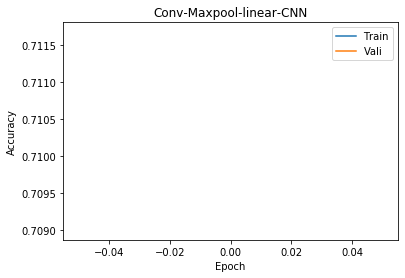

Test Accu: 0.672
Epoch:  1
[1, 20000] loss: 0.848
[1, 40000] loss: 0.864
Training Accu:  0.715625
Validation Accu:  0.7089
Finish Traning
Test 0 th batch, 682 correct, tested 1000, batch size 1000
Test 1 th batch, 1341 correct, tested 2000, batch size 1000
Test 2 th batch, 2003 correct, tested 3000, batch size 1000
Test 3 th batch, 2696 correct, tested 4000, batch size 1000
Test 4 th batch, 3405 correct, tested 5000, batch size 1000
Test 5 th batch, 4079 correct, tested 6000, batch size 1000
Test 6 th batch, 4726 correct, tested 7000, batch size 1000
Test 7 th batch, 5405 correct, tested 8000, batch size 1000
Test 8 th batch, 6058 correct, tested 9000, batch size 1000
Test 9 th batch, 6715 correct, tested 10000, batch size 1000


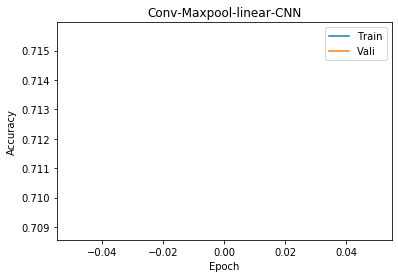

Test Accu: 0.672
Epoch:  1
[1, 20000] loss: 0.851
[1, 40000] loss: 0.853
Training Accu:  0.713975
Validation Accu:  0.7108
Finish Traning
Test 0 th batch, 680 correct, tested 1000, batch size 1000
Test 1 th batch, 1347 correct, tested 2000, batch size 1000
Test 2 th batch, 2023 correct, tested 3000, batch size 1000
Test 3 th batch, 2709 correct, tested 4000, batch size 1000
Test 4 th batch, 3424 correct, tested 5000, batch size 1000
Test 5 th batch, 4085 correct, tested 6000, batch size 1000
Test 6 th batch, 4734 correct, tested 7000, batch size 1000
Test 7 th batch, 5422 correct, tested 8000, batch size 1000
Test 8 th batch, 6081 correct, tested 9000, batch size 1000
Test 9 th batch, 6733 correct, tested 10000, batch size 1000


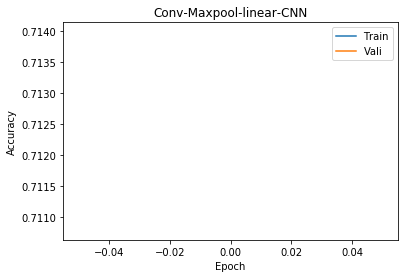

Test Accu: 0.6733
Epoch:  1
[1, 20000] loss: 0.846
[1, 40000] loss: 0.852
Training Accu:  0.718375
Validation Accu:  0.7086
Finish Traning
Test 0 th batch, 685 correct, tested 1000, batch size 1000
Test 1 th batch, 1342 correct, tested 2000, batch size 1000
Test 2 th batch, 2017 correct, tested 3000, batch size 1000
Test 3 th batch, 2708 correct, tested 4000, batch size 1000
Test 4 th batch, 3421 correct, tested 5000, batch size 1000
Test 5 th batch, 4091 correct, tested 6000, batch size 1000
Test 6 th batch, 4755 correct, tested 7000, batch size 1000
Test 7 th batch, 5444 correct, tested 8000, batch size 1000
Test 8 th batch, 6102 correct, tested 9000, batch size 1000
Test 9 th batch, 6770 correct, tested 10000, batch size 1000


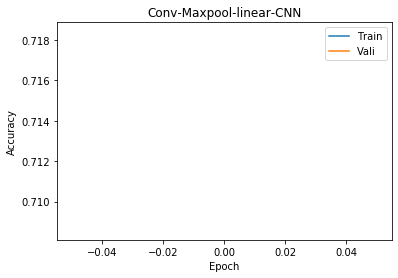

Test Accu: 0.677
Epoch:  1
[1, 20000] loss: 0.845
[1, 40000] loss: 0.861
Training Accu:  0.715075
Validation Accu:  0.7292
Finish Traning
Test 0 th batch, 677 correct, tested 1000, batch size 1000
Test 1 th batch, 1329 correct, tested 2000, batch size 1000
Test 2 th batch, 1992 correct, tested 3000, batch size 1000
Test 3 th batch, 2672 correct, tested 4000, batch size 1000
Test 4 th batch, 3382 correct, tested 5000, batch size 1000
Test 5 th batch, 4053 correct, tested 6000, batch size 1000
Test 6 th batch, 4716 correct, tested 7000, batch size 1000
Test 7 th batch, 5399 correct, tested 8000, batch size 1000
Test 8 th batch, 6043 correct, tested 9000, batch size 1000
Test 9 th batch, 6707 correct, tested 10000, batch size 1000


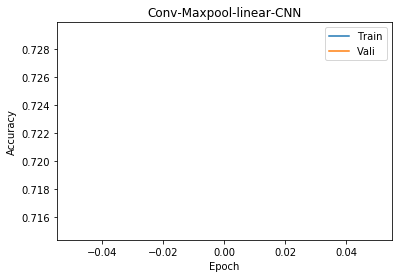

Test Accu: 0.677
Epoch:  1
[1, 20000] loss: 0.848
[1, 40000] loss: 0.849
Training Accu:  0.7169
Validation Accu:  0.7148
Finish Traning
Test 0 th batch, 681 correct, tested 1000, batch size 1000
Test 1 th batch, 1349 correct, tested 2000, batch size 1000
Test 2 th batch, 2025 correct, tested 3000, batch size 1000
Test 3 th batch, 2714 correct, tested 4000, batch size 1000
Test 4 th batch, 3419 correct, tested 5000, batch size 1000
Test 5 th batch, 4074 correct, tested 6000, batch size 1000
Test 6 th batch, 4736 correct, tested 7000, batch size 1000
Test 7 th batch, 5418 correct, tested 8000, batch size 1000
Test 8 th batch, 6074 correct, tested 9000, batch size 1000
Test 9 th batch, 6732 correct, tested 10000, batch size 1000


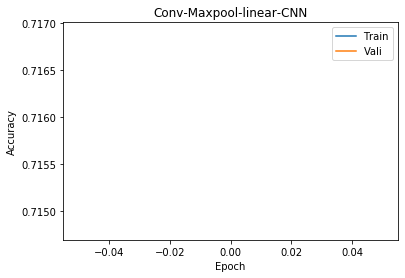

Test Accu: 0.677
Epoch:  1
[1, 20000] loss: 0.843
[1, 40000] loss: 0.844
Training Accu:  0.718
Validation Accu:  0.7196
Finish Traning
Test 0 th batch, 691 correct, tested 1000, batch size 1000
Test 1 th batch, 1359 correct, tested 2000, batch size 1000
Test 2 th batch, 2033 correct, tested 3000, batch size 1000
Test 3 th batch, 2724 correct, tested 4000, batch size 1000
Test 4 th batch, 3439 correct, tested 5000, batch size 1000
Test 5 th batch, 4102 correct, tested 6000, batch size 1000
Test 6 th batch, 4763 correct, tested 7000, batch size 1000
Test 7 th batch, 5450 correct, tested 8000, batch size 1000
Test 8 th batch, 6105 correct, tested 9000, batch size 1000
Test 9 th batch, 6772 correct, tested 10000, batch size 1000


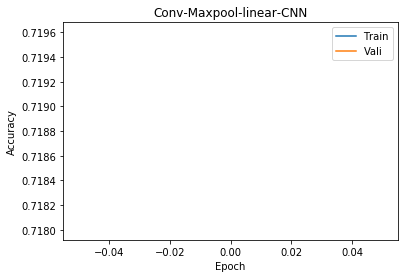

Test Accu: 0.6772
Epoch:  1
[1, 20000] loss: 0.838
[1, 40000] loss: 0.844
Training Accu:  0.719925
Validation Accu:  0.7161
Finish Traning
Test 0 th batch, 675 correct, tested 1000, batch size 1000
Test 1 th batch, 1344 correct, tested 2000, batch size 1000
Test 2 th batch, 2019 correct, tested 3000, batch size 1000
Test 3 th batch, 2715 correct, tested 4000, batch size 1000
Test 4 th batch, 3431 correct, tested 5000, batch size 1000
Test 5 th batch, 4114 correct, tested 6000, batch size 1000
Test 6 th batch, 4766 correct, tested 7000, batch size 1000
Test 7 th batch, 5452 correct, tested 8000, batch size 1000
Test 8 th batch, 6117 correct, tested 9000, batch size 1000
Test 9 th batch, 6782 correct, tested 10000, batch size 1000


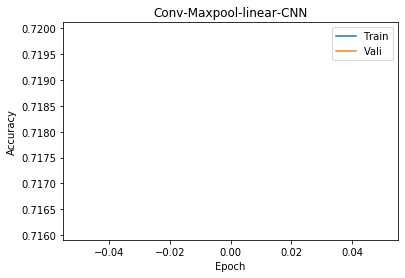

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.837
[1, 40000] loss: 0.846
Training Accu:  0.718
Validation Accu:  0.7221
Finish Traning
Test 0 th batch, 684 correct, tested 1000, batch size 1000
Test 1 th batch, 1344 correct, tested 2000, batch size 1000
Test 2 th batch, 2014 correct, tested 3000, batch size 1000
Test 3 th batch, 2697 correct, tested 4000, batch size 1000
Test 4 th batch, 3406 correct, tested 5000, batch size 1000
Test 5 th batch, 4076 correct, tested 6000, batch size 1000
Test 6 th batch, 4737 correct, tested 7000, batch size 1000
Test 7 th batch, 5426 correct, tested 8000, batch size 1000
Test 8 th batch, 6087 correct, tested 9000, batch size 1000
Test 9 th batch, 6754 correct, tested 10000, batch size 1000


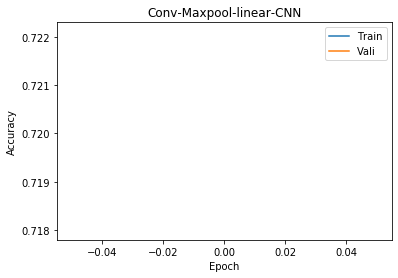

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.836
[1, 40000] loss: 0.833
Training Accu:  0.7218
Validation Accu:  0.7212
Finish Traning
Test 0 th batch, 683 correct, tested 1000, batch size 1000
Test 1 th batch, 1353 correct, tested 2000, batch size 1000
Test 2 th batch, 2017 correct, tested 3000, batch size 1000
Test 3 th batch, 2711 correct, tested 4000, batch size 1000
Test 4 th batch, 3418 correct, tested 5000, batch size 1000
Test 5 th batch, 4081 correct, tested 6000, batch size 1000
Test 6 th batch, 4752 correct, tested 7000, batch size 1000
Test 7 th batch, 5442 correct, tested 8000, batch size 1000
Test 8 th batch, 6094 correct, tested 9000, batch size 1000
Test 9 th batch, 6748 correct, tested 10000, batch size 1000


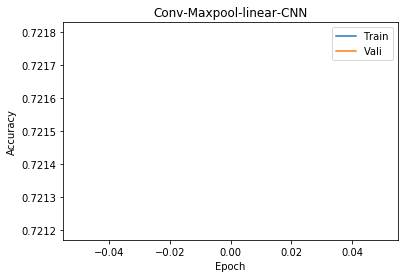

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.835
[1, 40000] loss: 0.832
Training Accu:  0.719975
Validation Accu:  0.7273
Finish Traning
Test 0 th batch, 686 correct, tested 1000, batch size 1000
Test 1 th batch, 1349 correct, tested 2000, batch size 1000
Test 2 th batch, 2013 correct, tested 3000, batch size 1000
Test 3 th batch, 2707 correct, tested 4000, batch size 1000
Test 4 th batch, 3417 correct, tested 5000, batch size 1000
Test 5 th batch, 4094 correct, tested 6000, batch size 1000
Test 6 th batch, 4757 correct, tested 7000, batch size 1000
Test 7 th batch, 5440 correct, tested 8000, batch size 1000
Test 8 th batch, 6103 correct, tested 9000, batch size 1000
Test 9 th batch, 6765 correct, tested 10000, batch size 1000


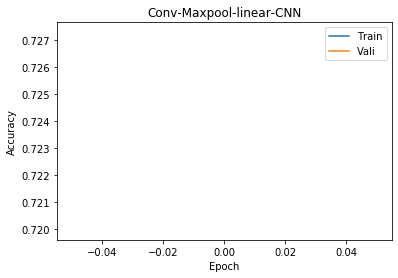

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.831
[1, 40000] loss: 0.832
Training Accu:  0.722075
Validation Accu:  0.7255
Finish Traning
Test 0 th batch, 691 correct, tested 1000, batch size 1000
Test 1 th batch, 1364 correct, tested 2000, batch size 1000
Test 2 th batch, 2026 correct, tested 3000, batch size 1000
Test 3 th batch, 2720 correct, tested 4000, batch size 1000
Test 4 th batch, 3433 correct, tested 5000, batch size 1000
Test 5 th batch, 4094 correct, tested 6000, batch size 1000
Test 6 th batch, 4757 correct, tested 7000, batch size 1000
Test 7 th batch, 5448 correct, tested 8000, batch size 1000
Test 8 th batch, 6097 correct, tested 9000, batch size 1000
Test 9 th batch, 6764 correct, tested 10000, batch size 1000


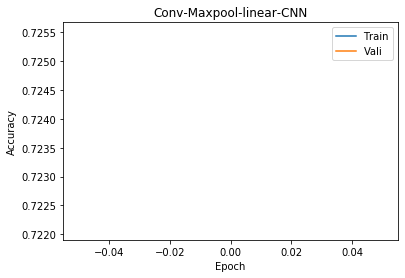

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.820
[1, 40000] loss: 0.825
Training Accu:  0.72795
Validation Accu:  0.717
Finish Traning
Test 0 th batch, 686 correct, tested 1000, batch size 1000
Test 1 th batch, 1358 correct, tested 2000, batch size 1000
Test 2 th batch, 2028 correct, tested 3000, batch size 1000
Test 3 th batch, 2719 correct, tested 4000, batch size 1000
Test 4 th batch, 3420 correct, tested 5000, batch size 1000
Test 5 th batch, 4087 correct, tested 6000, batch size 1000
Test 6 th batch, 4735 correct, tested 7000, batch size 1000
Test 7 th batch, 5424 correct, tested 8000, batch size 1000
Test 8 th batch, 6089 correct, tested 9000, batch size 1000
Test 9 th batch, 6740 correct, tested 10000, batch size 1000


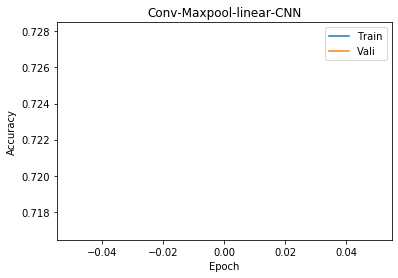

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.814
[1, 40000] loss: 0.829
Training Accu:  0.7254
Validation Accu:  0.7297
Finish Traning
Test 0 th batch, 679 correct, tested 1000, batch size 1000
Test 1 th batch, 1355 correct, tested 2000, batch size 1000
Test 2 th batch, 2031 correct, tested 3000, batch size 1000
Test 3 th batch, 2724 correct, tested 4000, batch size 1000
Test 4 th batch, 3436 correct, tested 5000, batch size 1000
Test 5 th batch, 4100 correct, tested 6000, batch size 1000
Test 6 th batch, 4767 correct, tested 7000, batch size 1000
Test 7 th batch, 5460 correct, tested 8000, batch size 1000
Test 8 th batch, 6124 correct, tested 9000, batch size 1000
Test 9 th batch, 6782 correct, tested 10000, batch size 1000


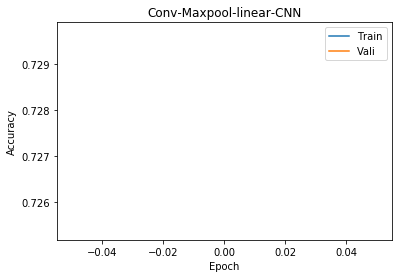

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.819
[1, 40000] loss: 0.826
Training Accu:  0.72305
Validation Accu:  0.7315
Finish Traning
Test 0 th batch, 686 correct, tested 1000, batch size 1000
Test 1 th batch, 1349 correct, tested 2000, batch size 1000
Test 2 th batch, 2022 correct, tested 3000, batch size 1000
Test 3 th batch, 2706 correct, tested 4000, batch size 1000
Test 4 th batch, 3415 correct, tested 5000, batch size 1000
Test 5 th batch, 4077 correct, tested 6000, batch size 1000
Test 6 th batch, 4739 correct, tested 7000, batch size 1000
Test 7 th batch, 5420 correct, tested 8000, batch size 1000
Test 8 th batch, 6078 correct, tested 9000, batch size 1000
Test 9 th batch, 6755 correct, tested 10000, batch size 1000


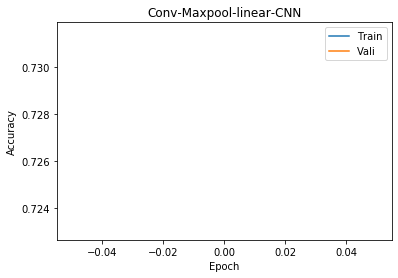

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.819
[1, 40000] loss: 0.826
Training Accu:  0.724875
Validation Accu:  0.732
Finish Traning
Test 0 th batch, 688 correct, tested 1000, batch size 1000
Test 1 th batch, 1363 correct, tested 2000, batch size 1000
Test 2 th batch, 2031 correct, tested 3000, batch size 1000
Test 3 th batch, 2731 correct, tested 4000, batch size 1000
Test 4 th batch, 3442 correct, tested 5000, batch size 1000
Test 5 th batch, 4107 correct, tested 6000, batch size 1000
Test 6 th batch, 4771 correct, tested 7000, batch size 1000
Test 7 th batch, 5449 correct, tested 8000, batch size 1000
Test 8 th batch, 6116 correct, tested 9000, batch size 1000
Test 9 th batch, 6775 correct, tested 10000, batch size 1000


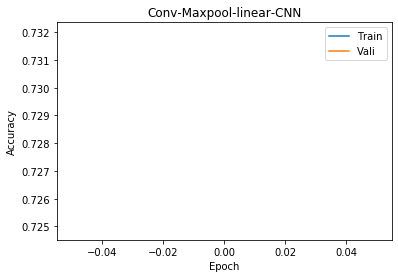

Test Accu: 0.6782
Epoch:  1
[1, 20000] loss: 0.808
[1, 40000] loss: 0.815
Training Accu:  0.73045
Validation Accu:  0.7202
Finish Traning
Test 0 th batch, 694 correct, tested 1000, batch size 1000
Test 1 th batch, 1368 correct, tested 2000, batch size 1000
Test 2 th batch, 2035 correct, tested 3000, batch size 1000
Test 3 th batch, 2730 correct, tested 4000, batch size 1000
Test 4 th batch, 3449 correct, tested 5000, batch size 1000
Test 5 th batch, 4121 correct, tested 6000, batch size 1000
Test 6 th batch, 4792 correct, tested 7000, batch size 1000
Test 7 th batch, 5487 correct, tested 8000, batch size 1000
Test 8 th batch, 6142 correct, tested 9000, batch size 1000
Test 9 th batch, 6820 correct, tested 10000, batch size 1000


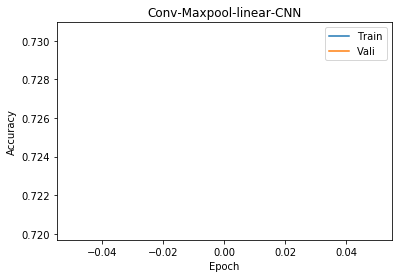

Test Accu: 0.682
Epoch:  1
[1, 20000] loss: 0.816
[1, 40000] loss: 0.812
Training Accu:  0.7311
Validation Accu:  0.7285
Finish Traning
Test 0 th batch, 696 correct, tested 1000, batch size 1000
Test 1 th batch, 1355 correct, tested 2000, batch size 1000
Test 2 th batch, 2034 correct, tested 3000, batch size 1000
Test 3 th batch, 2735 correct, tested 4000, batch size 1000
Test 4 th batch, 3456 correct, tested 5000, batch size 1000
Test 5 th batch, 4135 correct, tested 6000, batch size 1000
Test 6 th batch, 4803 correct, tested 7000, batch size 1000
Test 7 th batch, 5496 correct, tested 8000, batch size 1000
Test 8 th batch, 6160 correct, tested 9000, batch size 1000
Test 9 th batch, 6835 correct, tested 10000, batch size 1000


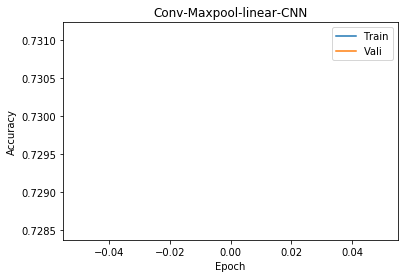

Test Accu: 0.6835
Epoch:  1
[1, 20000] loss: 0.804
[1, 40000] loss: 0.810
Training Accu:  0.731825
Validation Accu:  0.7311
Finish Traning
Test 0 th batch, 685 correct, tested 1000, batch size 1000
Test 1 th batch, 1352 correct, tested 2000, batch size 1000
Test 2 th batch, 2022 correct, tested 3000, batch size 1000
Test 3 th batch, 2716 correct, tested 4000, batch size 1000
Test 4 th batch, 3430 correct, tested 5000, batch size 1000
Test 5 th batch, 4098 correct, tested 6000, batch size 1000
Test 6 th batch, 4762 correct, tested 7000, batch size 1000
Test 7 th batch, 5452 correct, tested 8000, batch size 1000
Test 8 th batch, 6116 correct, tested 9000, batch size 1000
Test 9 th batch, 6778 correct, tested 10000, batch size 1000


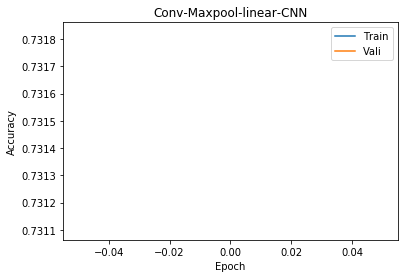

Test Accu: 0.6835
Epoch:  1
[1, 20000] loss: 0.800
[1, 40000] loss: 0.809
Training Accu:  0.734625
Validation Accu:  0.7289
Finish Traning
Test 0 th batch, 691 correct, tested 1000, batch size 1000
Test 1 th batch, 1361 correct, tested 2000, batch size 1000
Test 2 th batch, 2028 correct, tested 3000, batch size 1000
Test 3 th batch, 2720 correct, tested 4000, batch size 1000
Test 4 th batch, 3438 correct, tested 5000, batch size 1000
Test 5 th batch, 4113 correct, tested 6000, batch size 1000
Test 6 th batch, 4779 correct, tested 7000, batch size 1000
Test 7 th batch, 5468 correct, tested 8000, batch size 1000
Test 8 th batch, 6136 correct, tested 9000, batch size 1000
Test 9 th batch, 6805 correct, tested 10000, batch size 1000


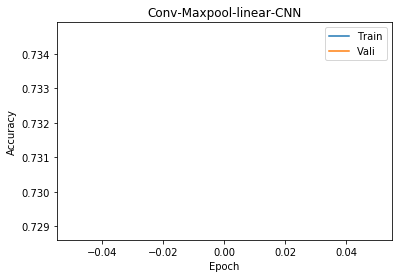

Test Accu: 0.6835
Epoch:  1
[1, 20000] loss: 0.793
[1, 40000] loss: 0.815
Training Accu:  0.73305
Validation Accu:  0.7298
Finish Traning
Test 0 th batch, 688 correct, tested 1000, batch size 1000
Test 1 th batch, 1352 correct, tested 2000, batch size 1000
Test 2 th batch, 2026 correct, tested 3000, batch size 1000
Test 3 th batch, 2712 correct, tested 4000, batch size 1000
Test 4 th batch, 3428 correct, tested 5000, batch size 1000
Test 5 th batch, 4108 correct, tested 6000, batch size 1000
Test 6 th batch, 4772 correct, tested 7000, batch size 1000
Test 7 th batch, 5460 correct, tested 8000, batch size 1000
Test 8 th batch, 6119 correct, tested 9000, batch size 1000
Test 9 th batch, 6793 correct, tested 10000, batch size 1000


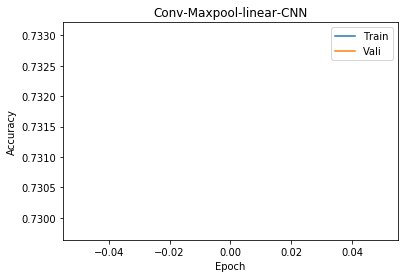

Test Accu: 0.6835
Epoch:  1
[1, 20000] loss: 0.799
[1, 40000] loss: 0.803
Training Accu:  0.735575
Validation Accu:  0.7333
Finish Traning
Test 0 th batch, 682 correct, tested 1000, batch size 1000
Test 1 th batch, 1348 correct, tested 2000, batch size 1000
Test 2 th batch, 2027 correct, tested 3000, batch size 1000
Test 3 th batch, 2720 correct, tested 4000, batch size 1000
Test 4 th batch, 3434 correct, tested 5000, batch size 1000
Test 5 th batch, 4115 correct, tested 6000, batch size 1000
Test 6 th batch, 4784 correct, tested 7000, batch size 1000
Test 7 th batch, 5476 correct, tested 8000, batch size 1000
Test 8 th batch, 6140 correct, tested 9000, batch size 1000
Test 9 th batch, 6808 correct, tested 10000, batch size 1000


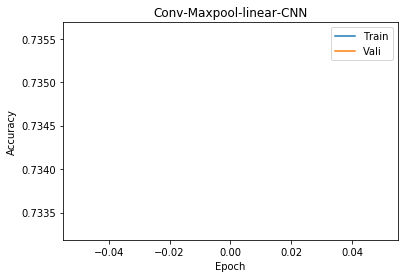

Test Accu: 0.6835
Epoch:  1
[1, 20000] loss: 0.800
[1, 40000] loss: 0.810
Training Accu:  0.73215
Validation Accu:  0.7352
Finish Traning
Test 0 th batch, 698 correct, tested 1000, batch size 1000
Test 1 th batch, 1378 correct, tested 2000, batch size 1000
Test 2 th batch, 2056 correct, tested 3000, batch size 1000
Test 3 th batch, 2755 correct, tested 4000, batch size 1000
Test 4 th batch, 3479 correct, tested 5000, batch size 1000
Test 5 th batch, 4154 correct, tested 6000, batch size 1000
Test 6 th batch, 4814 correct, tested 7000, batch size 1000
Test 7 th batch, 5507 correct, tested 8000, batch size 1000
Test 8 th batch, 6168 correct, tested 9000, batch size 1000
Test 9 th batch, 6837 correct, tested 10000, batch size 1000


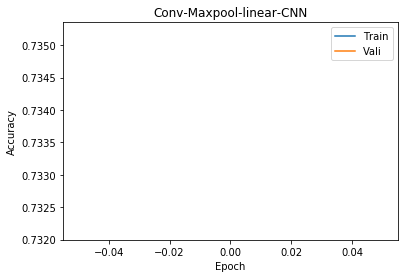

Test Accu: 0.6837
Epoch:  1
[1, 20000] loss: 0.795
[1, 40000] loss: 0.796
Training Accu:  0.7351
Validation Accu:  0.732
Finish Traning
Test 0 th batch, 694 correct, tested 1000, batch size 1000
Test 1 th batch, 1363 correct, tested 2000, batch size 1000
Test 2 th batch, 2040 correct, tested 3000, batch size 1000
Test 3 th batch, 2728 correct, tested 4000, batch size 1000
Test 4 th batch, 3449 correct, tested 5000, batch size 1000
Test 5 th batch, 4120 correct, tested 6000, batch size 1000
Test 6 th batch, 4781 correct, tested 7000, batch size 1000
Test 7 th batch, 5473 correct, tested 8000, batch size 1000
Test 8 th batch, 6138 correct, tested 9000, batch size 1000
Test 9 th batch, 6820 correct, tested 10000, batch size 1000


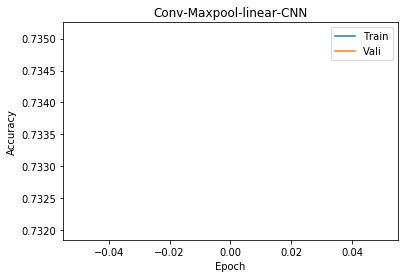

Test Accu: 0.6837
Epoch:  1
[1, 20000] loss: 0.785
[1, 40000] loss: 0.799
Training Accu:  0.737425
Validation Accu:  0.7397
Finish Traning
Test 0 th batch, 696 correct, tested 1000, batch size 1000
Test 1 th batch, 1370 correct, tested 2000, batch size 1000
Test 2 th batch, 2047 correct, tested 3000, batch size 1000
Test 3 th batch, 2752 correct, tested 4000, batch size 1000
Test 4 th batch, 3471 correct, tested 5000, batch size 1000
Test 5 th batch, 4139 correct, tested 6000, batch size 1000
Test 6 th batch, 4808 correct, tested 7000, batch size 1000
Test 7 th batch, 5504 correct, tested 8000, batch size 1000
Test 8 th batch, 6168 correct, tested 9000, batch size 1000
Test 9 th batch, 6840 correct, tested 10000, batch size 1000


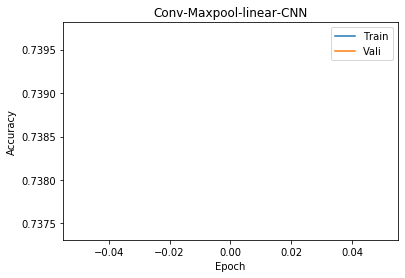

Test Accu: 0.684
Epoch:  1
[1, 20000] loss: 0.784
[1, 40000] loss: 0.797
Training Accu:  0.737375
Validation Accu:  0.7279
Finish Traning
Test 0 th batch, 694 correct, tested 1000, batch size 1000
Test 1 th batch, 1368 correct, tested 2000, batch size 1000
Test 2 th batch, 2054 correct, tested 3000, batch size 1000
Test 3 th batch, 2754 correct, tested 4000, batch size 1000
Test 4 th batch, 3470 correct, tested 5000, batch size 1000
Test 5 th batch, 4155 correct, tested 6000, batch size 1000
Test 6 th batch, 4828 correct, tested 7000, batch size 1000
Test 7 th batch, 5522 correct, tested 8000, batch size 1000
Test 8 th batch, 6188 correct, tested 9000, batch size 1000
Test 9 th batch, 6862 correct, tested 10000, batch size 1000


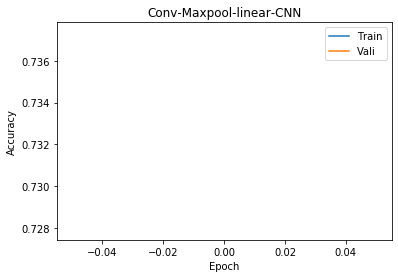

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.788
[1, 40000] loss: 0.785
Training Accu:  0.737875
Validation Accu:  0.737
Finish Traning
Test 0 th batch, 688 correct, tested 1000, batch size 1000
Test 1 th batch, 1354 correct, tested 2000, batch size 1000
Test 2 th batch, 2034 correct, tested 3000, batch size 1000
Test 3 th batch, 2729 correct, tested 4000, batch size 1000
Test 4 th batch, 3448 correct, tested 5000, batch size 1000
Test 5 th batch, 4130 correct, tested 6000, batch size 1000
Test 6 th batch, 4807 correct, tested 7000, batch size 1000
Test 7 th batch, 5504 correct, tested 8000, batch size 1000
Test 8 th batch, 6174 correct, tested 9000, batch size 1000
Test 9 th batch, 6850 correct, tested 10000, batch size 1000


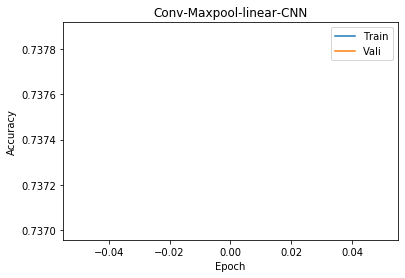

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.783
[1, 40000] loss: 0.786
Training Accu:  0.73875
Validation Accu:  0.7363
Finish Traning
Test 0 th batch, 692 correct, tested 1000, batch size 1000
Test 1 th batch, 1359 correct, tested 2000, batch size 1000
Test 2 th batch, 2034 correct, tested 3000, batch size 1000
Test 3 th batch, 2727 correct, tested 4000, batch size 1000
Test 4 th batch, 3452 correct, tested 5000, batch size 1000
Test 5 th batch, 4134 correct, tested 6000, batch size 1000
Test 6 th batch, 4802 correct, tested 7000, batch size 1000
Test 7 th batch, 5498 correct, tested 8000, batch size 1000
Test 8 th batch, 6166 correct, tested 9000, batch size 1000
Test 9 th batch, 6840 correct, tested 10000, batch size 1000


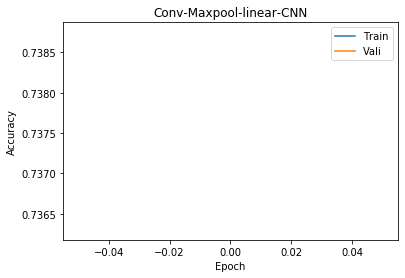

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.784
[1, 40000] loss: 0.778
Training Accu:  0.7418
Validation Accu:  0.7378
Finish Traning
Test 0 th batch, 696 correct, tested 1000, batch size 1000
Test 1 th batch, 1374 correct, tested 2000, batch size 1000
Test 2 th batch, 2058 correct, tested 3000, batch size 1000
Test 3 th batch, 2756 correct, tested 4000, batch size 1000
Test 4 th batch, 3470 correct, tested 5000, batch size 1000
Test 5 th batch, 4145 correct, tested 6000, batch size 1000
Test 6 th batch, 4814 correct, tested 7000, batch size 1000
Test 7 th batch, 5506 correct, tested 8000, batch size 1000
Test 8 th batch, 6178 correct, tested 9000, batch size 1000
Test 9 th batch, 6850 correct, tested 10000, batch size 1000


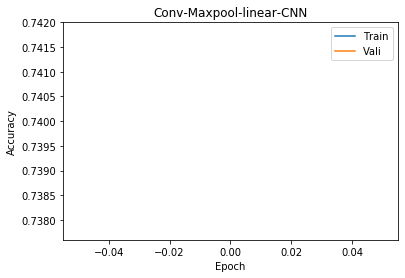

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.784
[1, 40000] loss: 0.782
Training Accu:  0.7392
Validation Accu:  0.7394
Finish Traning
Test 0 th batch, 687 correct, tested 1000, batch size 1000
Test 1 th batch, 1349 correct, tested 2000, batch size 1000
Test 2 th batch, 2019 correct, tested 3000, batch size 1000
Test 3 th batch, 2707 correct, tested 4000, batch size 1000
Test 4 th batch, 3416 correct, tested 5000, batch size 1000
Test 5 th batch, 4098 correct, tested 6000, batch size 1000
Test 6 th batch, 4759 correct, tested 7000, batch size 1000
Test 7 th batch, 5450 correct, tested 8000, batch size 1000
Test 8 th batch, 6122 correct, tested 9000, batch size 1000
Test 9 th batch, 6786 correct, tested 10000, batch size 1000


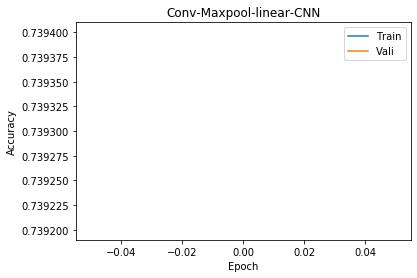

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.788
[1, 40000] loss: 0.773
Training Accu:  0.740925
Validation Accu:  0.7442
Finish Traning
Test 0 th batch, 688 correct, tested 1000, batch size 1000
Test 1 th batch, 1360 correct, tested 2000, batch size 1000
Test 2 th batch, 2031 correct, tested 3000, batch size 1000
Test 3 th batch, 2723 correct, tested 4000, batch size 1000
Test 4 th batch, 3439 correct, tested 5000, batch size 1000
Test 5 th batch, 4119 correct, tested 6000, batch size 1000
Test 6 th batch, 4787 correct, tested 7000, batch size 1000
Test 7 th batch, 5486 correct, tested 8000, batch size 1000
Test 8 th batch, 6161 correct, tested 9000, batch size 1000
Test 9 th batch, 6832 correct, tested 10000, batch size 1000


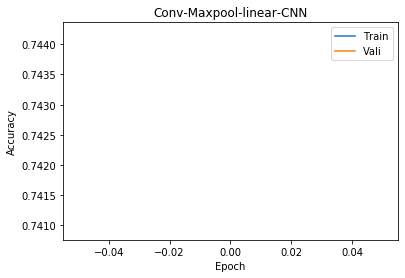

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.770
[1, 40000] loss: 0.779
Training Accu:  0.7434
Validation Accu:  0.7342
Finish Traning
Test 0 th batch, 689 correct, tested 1000, batch size 1000
Test 1 th batch, 1355 correct, tested 2000, batch size 1000
Test 2 th batch, 2032 correct, tested 3000, batch size 1000
Test 3 th batch, 2721 correct, tested 4000, batch size 1000
Test 4 th batch, 3435 correct, tested 5000, batch size 1000
Test 5 th batch, 4112 correct, tested 6000, batch size 1000
Test 6 th batch, 4778 correct, tested 7000, batch size 1000
Test 7 th batch, 5474 correct, tested 8000, batch size 1000
Test 8 th batch, 6140 correct, tested 9000, batch size 1000
Test 9 th batch, 6808 correct, tested 10000, batch size 1000


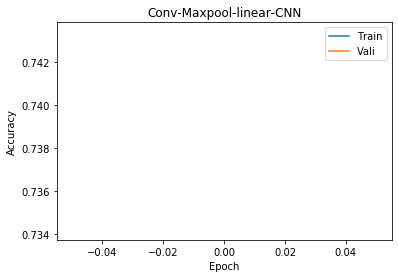

Test Accu: 0.6862
Epoch:  1
[1, 20000] loss: 0.781
[1, 40000] loss: 0.764
Training Accu:  0.7451
Validation Accu:  0.7356
Finish Traning
Test 0 th batch, 688 correct, tested 1000, batch size 1000
Test 1 th batch, 1360 correct, tested 2000, batch size 1000
Test 2 th batch, 2050 correct, tested 3000, batch size 1000
Test 3 th batch, 2754 correct, tested 4000, batch size 1000
Test 4 th batch, 3479 correct, tested 5000, batch size 1000
Test 5 th batch, 4166 correct, tested 6000, batch size 1000
Test 6 th batch, 4843 correct, tested 7000, batch size 1000
Test 7 th batch, 5544 correct, tested 8000, batch size 1000
Test 8 th batch, 6214 correct, tested 9000, batch size 1000
Test 9 th batch, 6891 correct, tested 10000, batch size 1000


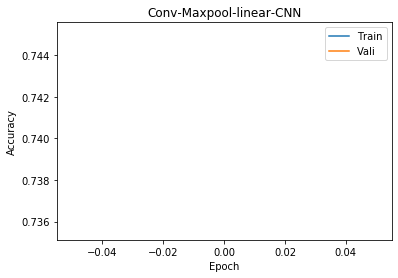

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.770
[1, 40000] loss: 0.756
Training Accu:  0.7465
Validation Accu:  0.7351
Finish Traning
Test 0 th batch, 695 correct, tested 1000, batch size 1000
Test 1 th batch, 1372 correct, tested 2000, batch size 1000
Test 2 th batch, 2059 correct, tested 3000, batch size 1000
Test 3 th batch, 2763 correct, tested 4000, batch size 1000
Test 4 th batch, 3479 correct, tested 5000, batch size 1000
Test 5 th batch, 4162 correct, tested 6000, batch size 1000
Test 6 th batch, 4838 correct, tested 7000, batch size 1000
Test 7 th batch, 5530 correct, tested 8000, batch size 1000
Test 8 th batch, 6206 correct, tested 9000, batch size 1000
Test 9 th batch, 6884 correct, tested 10000, batch size 1000


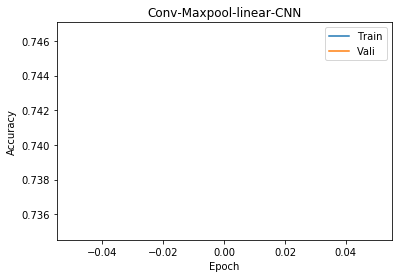

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.770
[1, 40000] loss: 0.769
Training Accu:  0.746675
Validation Accu:  0.7462
Finish Traning
Test 0 th batch, 704 correct, tested 1000, batch size 1000
Test 1 th batch, 1392 correct, tested 2000, batch size 1000
Test 2 th batch, 2070 correct, tested 3000, batch size 1000
Test 3 th batch, 2770 correct, tested 4000, batch size 1000
Test 4 th batch, 3487 correct, tested 5000, batch size 1000
Test 5 th batch, 4175 correct, tested 6000, batch size 1000
Test 6 th batch, 4838 correct, tested 7000, batch size 1000
Test 7 th batch, 5535 correct, tested 8000, batch size 1000
Test 8 th batch, 6210 correct, tested 9000, batch size 1000
Test 9 th batch, 6880 correct, tested 10000, batch size 1000


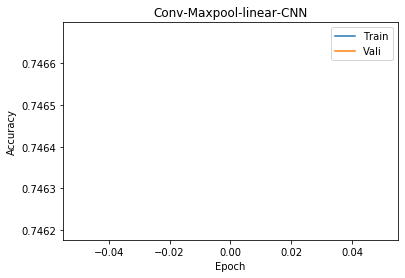

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.767
[1, 40000] loss: 0.767
Training Accu:  0.7476
Validation Accu:  0.7501
Finish Traning
Test 0 th batch, 694 correct, tested 1000, batch size 1000
Test 1 th batch, 1364 correct, tested 2000, batch size 1000
Test 2 th batch, 2048 correct, tested 3000, batch size 1000
Test 3 th batch, 2744 correct, tested 4000, batch size 1000
Test 4 th batch, 3462 correct, tested 5000, batch size 1000
Test 5 th batch, 4145 correct, tested 6000, batch size 1000
Test 6 th batch, 4808 correct, tested 7000, batch size 1000
Test 7 th batch, 5501 correct, tested 8000, batch size 1000
Test 8 th batch, 6174 correct, tested 9000, batch size 1000
Test 9 th batch, 6854 correct, tested 10000, batch size 1000


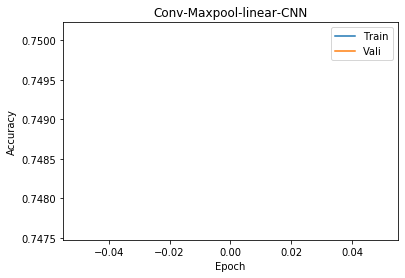

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.764
[1, 40000] loss: 0.766
Training Accu:  0.74515
Validation Accu:  0.75
Finish Traning
Test 0 th batch, 699 correct, tested 1000, batch size 1000
Test 1 th batch, 1384 correct, tested 2000, batch size 1000
Test 2 th batch, 2059 correct, tested 3000, batch size 1000
Test 3 th batch, 2760 correct, tested 4000, batch size 1000
Test 4 th batch, 3480 correct, tested 5000, batch size 1000
Test 5 th batch, 4159 correct, tested 6000, batch size 1000
Test 6 th batch, 4839 correct, tested 7000, batch size 1000
Test 7 th batch, 5540 correct, tested 8000, batch size 1000
Test 8 th batch, 6214 correct, tested 9000, batch size 1000
Test 9 th batch, 6880 correct, tested 10000, batch size 1000


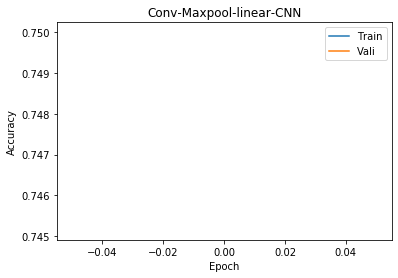

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.764
[1, 40000] loss: 0.762
Training Accu:  0.74675
Validation Accu:  0.746
Finish Traning
Test 0 th batch, 700 correct, tested 1000, batch size 1000
Test 1 th batch, 1386 correct, tested 2000, batch size 1000
Test 2 th batch, 2062 correct, tested 3000, batch size 1000
Test 3 th batch, 2765 correct, tested 4000, batch size 1000
Test 4 th batch, 3483 correct, tested 5000, batch size 1000
Test 5 th batch, 4156 correct, tested 6000, batch size 1000
Test 6 th batch, 4826 correct, tested 7000, batch size 1000
Test 7 th batch, 5517 correct, tested 8000, batch size 1000
Test 8 th batch, 6193 correct, tested 9000, batch size 1000
Test 9 th batch, 6863 correct, tested 10000, batch size 1000


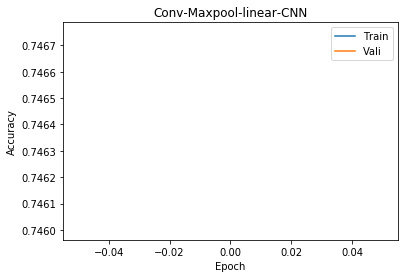

Test Accu: 0.6891
Epoch:  1
[1, 20000] loss: 0.764
[1, 40000] loss: 0.752
Training Accu:  0.749025
Validation Accu:  0.7475
Finish Traning
Test 0 th batch, 701 correct, tested 1000, batch size 1000
Test 1 th batch, 1378 correct, tested 2000, batch size 1000
Test 2 th batch, 2066 correct, tested 3000, batch size 1000
Test 3 th batch, 2773 correct, tested 4000, batch size 1000
Test 4 th batch, 3498 correct, tested 5000, batch size 1000
Test 5 th batch, 4189 correct, tested 6000, batch size 1000
Test 6 th batch, 4862 correct, tested 7000, batch size 1000
Test 7 th batch, 5568 correct, tested 8000, batch size 1000
Test 8 th batch, 6239 correct, tested 9000, batch size 1000
Test 9 th batch, 6917 correct, tested 10000, batch size 1000


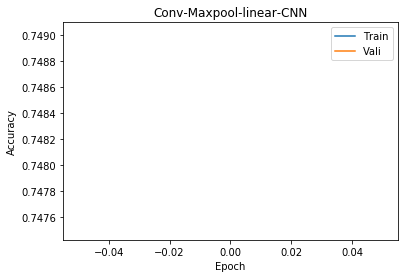

Test Accu: 0.6917
Epoch:  1
[1, 20000] loss: 0.752
[1, 40000] loss: 0.757
Training Accu:  0.75065
Validation Accu:  0.7521
Finish Traning
Test 0 th batch, 698 correct, tested 1000, batch size 1000
Test 1 th batch, 1385 correct, tested 2000, batch size 1000
Test 2 th batch, 2065 correct, tested 3000, batch size 1000
Test 3 th batch, 2773 correct, tested 4000, batch size 1000
Test 4 th batch, 3492 correct, tested 5000, batch size 1000
Test 5 th batch, 4172 correct, tested 6000, batch size 1000
Test 6 th batch, 4842 correct, tested 7000, batch size 1000
Test 7 th batch, 5545 correct, tested 8000, batch size 1000
Test 8 th batch, 6221 correct, tested 9000, batch size 1000
Test 9 th batch, 6906 correct, tested 10000, batch size 1000


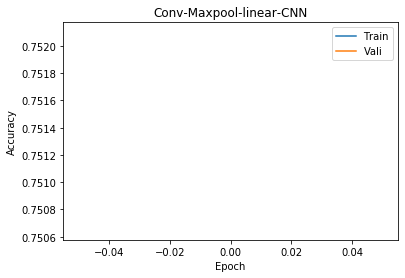

Test Accu: 0.6917
Epoch:  1
[1, 20000] loss: 0.743
[1, 40000] loss: 0.760
Training Accu:  0.750125
Validation Accu:  0.7505
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2091 correct, tested 3000, batch size 1000
Test 3 th batch, 2802 correct, tested 4000, batch size 1000
Test 4 th batch, 3528 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4882 correct, tested 7000, batch size 1000
Test 7 th batch, 5583 correct, tested 8000, batch size 1000
Test 8 th batch, 6260 correct, tested 9000, batch size 1000
Test 9 th batch, 6935 correct, tested 10000, batch size 1000


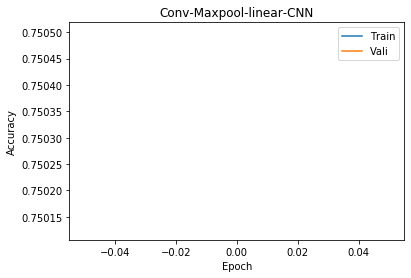

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.749
[1, 40000] loss: 0.748
Training Accu:  0.752875
Validation Accu:  0.75
Finish Traning
Test 0 th batch, 694 correct, tested 1000, batch size 1000
Test 1 th batch, 1369 correct, tested 2000, batch size 1000
Test 2 th batch, 2048 correct, tested 3000, batch size 1000
Test 3 th batch, 2750 correct, tested 4000, batch size 1000
Test 4 th batch, 3475 correct, tested 5000, batch size 1000
Test 5 th batch, 4167 correct, tested 6000, batch size 1000
Test 6 th batch, 4837 correct, tested 7000, batch size 1000
Test 7 th batch, 5532 correct, tested 8000, batch size 1000
Test 8 th batch, 6213 correct, tested 9000, batch size 1000
Test 9 th batch, 6885 correct, tested 10000, batch size 1000


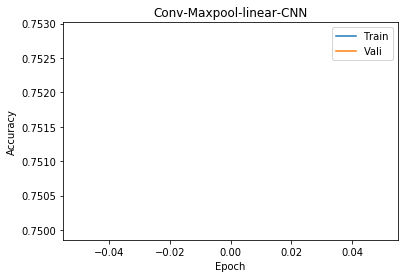

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.751
[1, 40000] loss: 0.750
Training Accu:  0.752425
Validation Accu:  0.7491
Finish Traning
Test 0 th batch, 695 correct, tested 1000, batch size 1000
Test 1 th batch, 1381 correct, tested 2000, batch size 1000
Test 2 th batch, 2067 correct, tested 3000, batch size 1000
Test 3 th batch, 2765 correct, tested 4000, batch size 1000
Test 4 th batch, 3475 correct, tested 5000, batch size 1000
Test 5 th batch, 4137 correct, tested 6000, batch size 1000
Test 6 th batch, 4800 correct, tested 7000, batch size 1000
Test 7 th batch, 5494 correct, tested 8000, batch size 1000
Test 8 th batch, 6164 correct, tested 9000, batch size 1000
Test 9 th batch, 6831 correct, tested 10000, batch size 1000


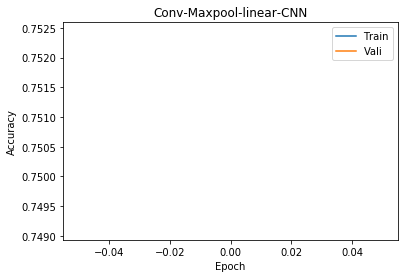

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.742
[1, 40000] loss: 0.755
Training Accu:  0.75175
Validation Accu:  0.7529
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1400 correct, tested 2000, batch size 1000
Test 2 th batch, 2086 correct, tested 3000, batch size 1000
Test 3 th batch, 2793 correct, tested 4000, batch size 1000
Test 4 th batch, 3510 correct, tested 5000, batch size 1000
Test 5 th batch, 4201 correct, tested 6000, batch size 1000
Test 6 th batch, 4867 correct, tested 7000, batch size 1000
Test 7 th batch, 5562 correct, tested 8000, batch size 1000
Test 8 th batch, 6240 correct, tested 9000, batch size 1000
Test 9 th batch, 6916 correct, tested 10000, batch size 1000


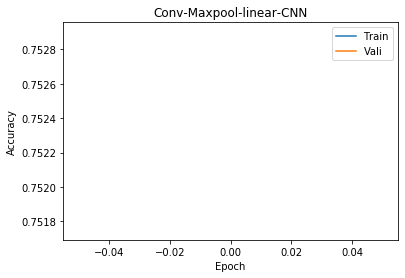

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.740
[1, 40000] loss: 0.748
Training Accu:  0.7545
Validation Accu:  0.746
Finish Traning
Test 0 th batch, 692 correct, tested 1000, batch size 1000
Test 1 th batch, 1379 correct, tested 2000, batch size 1000
Test 2 th batch, 2057 correct, tested 3000, batch size 1000
Test 3 th batch, 2757 correct, tested 4000, batch size 1000
Test 4 th batch, 3485 correct, tested 5000, batch size 1000
Test 5 th batch, 4172 correct, tested 6000, batch size 1000
Test 6 th batch, 4849 correct, tested 7000, batch size 1000
Test 7 th batch, 5552 correct, tested 8000, batch size 1000
Test 8 th batch, 6218 correct, tested 9000, batch size 1000
Test 9 th batch, 6903 correct, tested 10000, batch size 1000


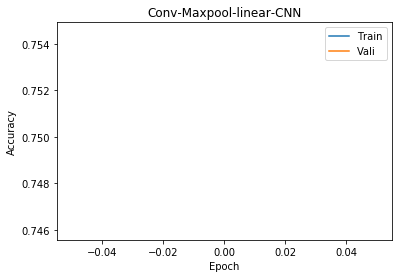

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.738
[1, 40000] loss: 0.749
Training Accu:  0.753125
Validation Accu:  0.755
Finish Traning
Test 0 th batch, 697 correct, tested 1000, batch size 1000
Test 1 th batch, 1383 correct, tested 2000, batch size 1000
Test 2 th batch, 2076 correct, tested 3000, batch size 1000
Test 3 th batch, 2776 correct, tested 4000, batch size 1000
Test 4 th batch, 3499 correct, tested 5000, batch size 1000
Test 5 th batch, 4189 correct, tested 6000, batch size 1000
Test 6 th batch, 4873 correct, tested 7000, batch size 1000
Test 7 th batch, 5575 correct, tested 8000, batch size 1000
Test 8 th batch, 6250 correct, tested 9000, batch size 1000
Test 9 th batch, 6927 correct, tested 10000, batch size 1000


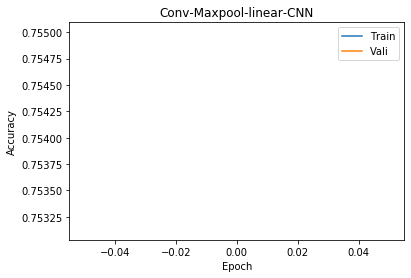

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.734
[1, 40000] loss: 0.737
Training Accu:  0.757575
Validation Accu:  0.7488
Finish Traning
Test 0 th batch, 704 correct, tested 1000, batch size 1000
Test 1 th batch, 1376 correct, tested 2000, batch size 1000
Test 2 th batch, 2066 correct, tested 3000, batch size 1000
Test 3 th batch, 2764 correct, tested 4000, batch size 1000
Test 4 th batch, 3489 correct, tested 5000, batch size 1000
Test 5 th batch, 4178 correct, tested 6000, batch size 1000
Test 6 th batch, 4854 correct, tested 7000, batch size 1000
Test 7 th batch, 5557 correct, tested 8000, batch size 1000
Test 8 th batch, 6240 correct, tested 9000, batch size 1000
Test 9 th batch, 6910 correct, tested 10000, batch size 1000


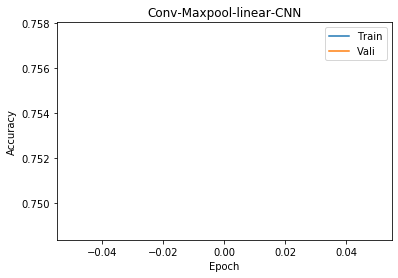

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.741
[1, 40000] loss: 0.740
Training Accu:  0.7559
Validation Accu:  0.7518
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1384 correct, tested 2000, batch size 1000
Test 2 th batch, 2062 correct, tested 3000, batch size 1000
Test 3 th batch, 2763 correct, tested 4000, batch size 1000
Test 4 th batch, 3488 correct, tested 5000, batch size 1000
Test 5 th batch, 4166 correct, tested 6000, batch size 1000
Test 6 th batch, 4841 correct, tested 7000, batch size 1000
Test 7 th batch, 5544 correct, tested 8000, batch size 1000
Test 8 th batch, 6226 correct, tested 9000, batch size 1000
Test 9 th batch, 6908 correct, tested 10000, batch size 1000


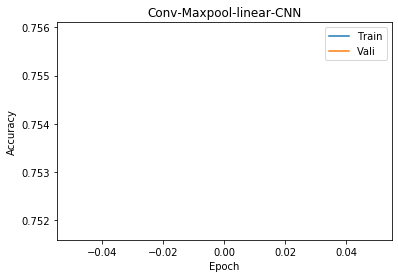

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.730
[1, 40000] loss: 0.739
Training Accu:  0.756025
Validation Accu:  0.7644
Finish Traning
Test 0 th batch, 699 correct, tested 1000, batch size 1000
Test 1 th batch, 1394 correct, tested 2000, batch size 1000
Test 2 th batch, 2082 correct, tested 3000, batch size 1000
Test 3 th batch, 2785 correct, tested 4000, batch size 1000
Test 4 th batch, 3506 correct, tested 5000, batch size 1000
Test 5 th batch, 4191 correct, tested 6000, batch size 1000
Test 6 th batch, 4866 correct, tested 7000, batch size 1000
Test 7 th batch, 5566 correct, tested 8000, batch size 1000
Test 8 th batch, 6250 correct, tested 9000, batch size 1000
Test 9 th batch, 6931 correct, tested 10000, batch size 1000


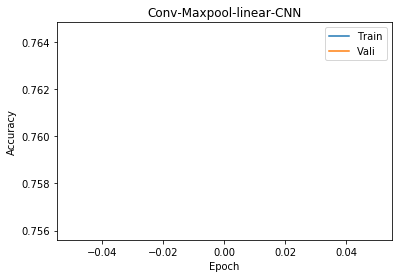

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.723
[1, 40000] loss: 0.730
Training Accu:  0.758525
Validation Accu:  0.7551
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1393 correct, tested 2000, batch size 1000
Test 2 th batch, 2076 correct, tested 3000, batch size 1000
Test 3 th batch, 2783 correct, tested 4000, batch size 1000
Test 4 th batch, 3506 correct, tested 5000, batch size 1000
Test 5 th batch, 4197 correct, tested 6000, batch size 1000
Test 6 th batch, 4872 correct, tested 7000, batch size 1000
Test 7 th batch, 5574 correct, tested 8000, batch size 1000
Test 8 th batch, 6259 correct, tested 9000, batch size 1000
Test 9 th batch, 6935 correct, tested 10000, batch size 1000


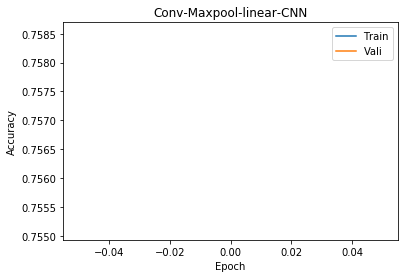

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.732
[1, 40000] loss: 0.726
Training Accu:  0.759525
Validation Accu:  0.7576
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1388 correct, tested 2000, batch size 1000
Test 2 th batch, 2087 correct, tested 3000, batch size 1000
Test 3 th batch, 2785 correct, tested 4000, batch size 1000
Test 4 th batch, 3507 correct, tested 5000, batch size 1000
Test 5 th batch, 4196 correct, tested 6000, batch size 1000
Test 6 th batch, 4871 correct, tested 7000, batch size 1000
Test 7 th batch, 5575 correct, tested 8000, batch size 1000
Test 8 th batch, 6252 correct, tested 9000, batch size 1000
Test 9 th batch, 6931 correct, tested 10000, batch size 1000


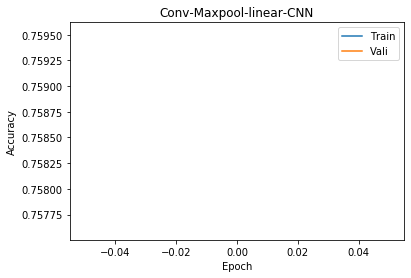

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.720
[1, 40000] loss: 0.734
Training Accu:  0.759825
Validation Accu:  0.7543
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1397 correct, tested 2000, batch size 1000
Test 2 th batch, 2083 correct, tested 3000, batch size 1000
Test 3 th batch, 2778 correct, tested 4000, batch size 1000
Test 4 th batch, 3492 correct, tested 5000, batch size 1000
Test 5 th batch, 4161 correct, tested 6000, batch size 1000
Test 6 th batch, 4832 correct, tested 7000, batch size 1000
Test 7 th batch, 5531 correct, tested 8000, batch size 1000
Test 8 th batch, 6208 correct, tested 9000, batch size 1000
Test 9 th batch, 6879 correct, tested 10000, batch size 1000


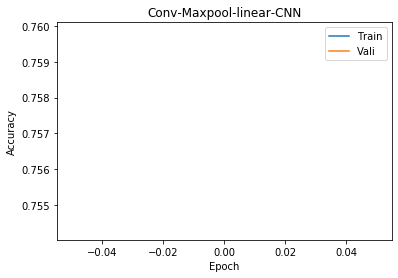

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.720
[1, 40000] loss: 0.734
Training Accu:  0.75925
Validation Accu:  0.7575
Finish Traning
Test 0 th batch, 696 correct, tested 1000, batch size 1000
Test 1 th batch, 1388 correct, tested 2000, batch size 1000
Test 2 th batch, 2075 correct, tested 3000, batch size 1000
Test 3 th batch, 2782 correct, tested 4000, batch size 1000
Test 4 th batch, 3502 correct, tested 5000, batch size 1000
Test 5 th batch, 4191 correct, tested 6000, batch size 1000
Test 6 th batch, 4867 correct, tested 7000, batch size 1000
Test 7 th batch, 5575 correct, tested 8000, batch size 1000
Test 8 th batch, 6247 correct, tested 9000, batch size 1000
Test 9 th batch, 6930 correct, tested 10000, batch size 1000


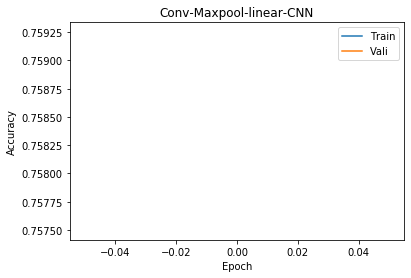

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.721
[1, 40000] loss: 0.724
Training Accu:  0.758775
Validation Accu:  0.7595
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1388 correct, tested 2000, batch size 1000
Test 2 th batch, 2071 correct, tested 3000, batch size 1000
Test 3 th batch, 2774 correct, tested 4000, batch size 1000
Test 4 th batch, 3496 correct, tested 5000, batch size 1000
Test 5 th batch, 4186 correct, tested 6000, batch size 1000
Test 6 th batch, 4861 correct, tested 7000, batch size 1000
Test 7 th batch, 5563 correct, tested 8000, batch size 1000
Test 8 th batch, 6250 correct, tested 9000, batch size 1000
Test 9 th batch, 6926 correct, tested 10000, batch size 1000


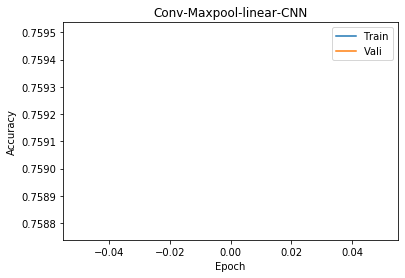

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.720
[1, 40000] loss: 0.715
Training Accu:  0.76415
Validation Accu:  0.7507
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1378 correct, tested 2000, batch size 1000
Test 2 th batch, 2056 correct, tested 3000, batch size 1000
Test 3 th batch, 2753 correct, tested 4000, batch size 1000
Test 4 th batch, 3474 correct, tested 5000, batch size 1000
Test 5 th batch, 4176 correct, tested 6000, batch size 1000
Test 6 th batch, 4855 correct, tested 7000, batch size 1000
Test 7 th batch, 5556 correct, tested 8000, batch size 1000
Test 8 th batch, 6223 correct, tested 9000, batch size 1000
Test 9 th batch, 6903 correct, tested 10000, batch size 1000


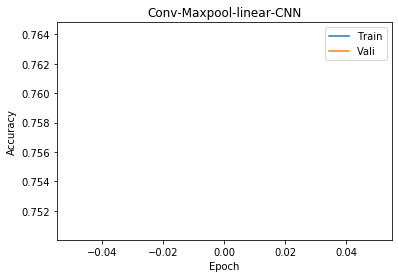

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.722
[1, 40000] loss: 0.715
Training Accu:  0.76275
Validation Accu:  0.7616
Finish Traning
Test 0 th batch, 701 correct, tested 1000, batch size 1000
Test 1 th batch, 1386 correct, tested 2000, batch size 1000
Test 2 th batch, 2081 correct, tested 3000, batch size 1000
Test 3 th batch, 2781 correct, tested 4000, batch size 1000
Test 4 th batch, 3499 correct, tested 5000, batch size 1000
Test 5 th batch, 4191 correct, tested 6000, batch size 1000
Test 6 th batch, 4872 correct, tested 7000, batch size 1000
Test 7 th batch, 5580 correct, tested 8000, batch size 1000
Test 8 th batch, 6256 correct, tested 9000, batch size 1000
Test 9 th batch, 6933 correct, tested 10000, batch size 1000


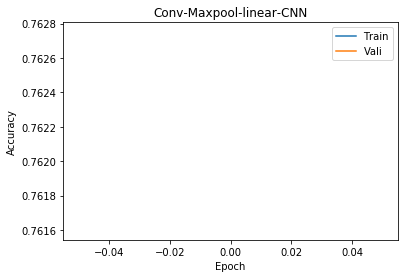

Test Accu: 0.6935
Epoch:  1
[1, 20000] loss: 0.710
[1, 40000] loss: 0.724
Training Accu:  0.763075
Validation Accu:  0.765
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2109 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4231 correct, tested 6000, batch size 1000
Test 6 th batch, 4909 correct, tested 7000, batch size 1000
Test 7 th batch, 5613 correct, tested 8000, batch size 1000
Test 8 th batch, 6295 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


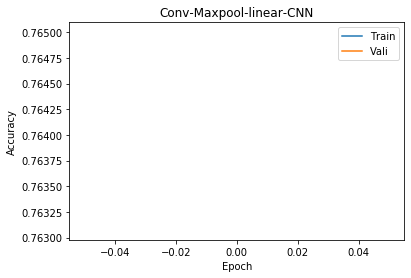

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.706
[1, 40000] loss: 0.723
Training Accu:  0.765625
Validation Accu:  0.7612
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1395 correct, tested 2000, batch size 1000
Test 2 th batch, 2077 correct, tested 3000, batch size 1000
Test 3 th batch, 2781 correct, tested 4000, batch size 1000
Test 4 th batch, 3509 correct, tested 5000, batch size 1000
Test 5 th batch, 4190 correct, tested 6000, batch size 1000
Test 6 th batch, 4861 correct, tested 7000, batch size 1000
Test 7 th batch, 5580 correct, tested 8000, batch size 1000
Test 8 th batch, 6273 correct, tested 9000, batch size 1000
Test 9 th batch, 6961 correct, tested 10000, batch size 1000


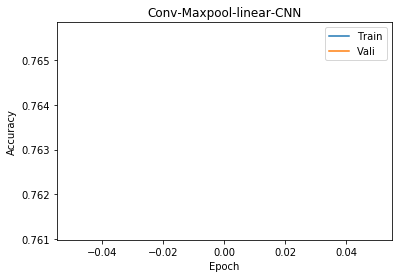

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.711
[1, 40000] loss: 0.720
Training Accu:  0.76355
Validation Accu:  0.7618
Finish Traning
Test 0 th batch, 698 correct, tested 1000, batch size 1000
Test 1 th batch, 1393 correct, tested 2000, batch size 1000
Test 2 th batch, 2078 correct, tested 3000, batch size 1000
Test 3 th batch, 2779 correct, tested 4000, batch size 1000
Test 4 th batch, 3499 correct, tested 5000, batch size 1000
Test 5 th batch, 4186 correct, tested 6000, batch size 1000
Test 6 th batch, 4856 correct, tested 7000, batch size 1000
Test 7 th batch, 5552 correct, tested 8000, batch size 1000
Test 8 th batch, 6243 correct, tested 9000, batch size 1000
Test 9 th batch, 6921 correct, tested 10000, batch size 1000


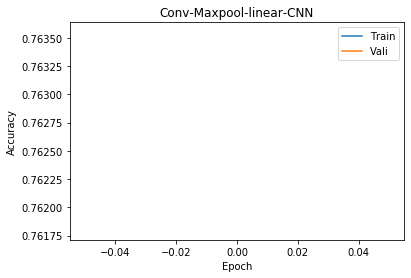

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.707
[1, 40000] loss: 0.719
Training Accu:  0.766475
Validation Accu:  0.7605
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1392 correct, tested 2000, batch size 1000
Test 2 th batch, 2091 correct, tested 3000, batch size 1000
Test 3 th batch, 2791 correct, tested 4000, batch size 1000
Test 4 th batch, 3513 correct, tested 5000, batch size 1000
Test 5 th batch, 4195 correct, tested 6000, batch size 1000
Test 6 th batch, 4882 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6270 correct, tested 9000, batch size 1000
Test 9 th batch, 6950 correct, tested 10000, batch size 1000


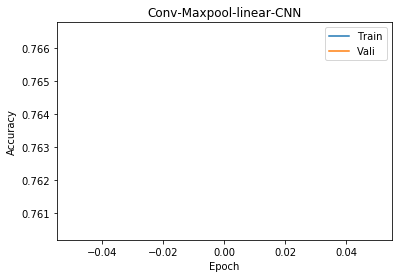

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.715
[1, 40000] loss: 0.717
Training Accu:  0.763125
Validation Accu:  0.7751
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2104 correct, tested 3000, batch size 1000
Test 3 th batch, 2799 correct, tested 4000, batch size 1000
Test 4 th batch, 3521 correct, tested 5000, batch size 1000
Test 5 th batch, 4204 correct, tested 6000, batch size 1000
Test 6 th batch, 4886 correct, tested 7000, batch size 1000
Test 7 th batch, 5590 correct, tested 8000, batch size 1000
Test 8 th batch, 6281 correct, tested 9000, batch size 1000
Test 9 th batch, 6955 correct, tested 10000, batch size 1000


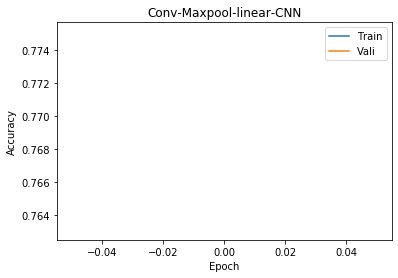

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.707
[1, 40000] loss: 0.715
Training Accu:  0.764675
Validation Accu:  0.7713
Finish Traning
Test 0 th batch, 699 correct, tested 1000, batch size 1000
Test 1 th batch, 1390 correct, tested 2000, batch size 1000
Test 2 th batch, 2087 correct, tested 3000, batch size 1000
Test 3 th batch, 2787 correct, tested 4000, batch size 1000
Test 4 th batch, 3510 correct, tested 5000, batch size 1000
Test 5 th batch, 4205 correct, tested 6000, batch size 1000
Test 6 th batch, 4881 correct, tested 7000, batch size 1000
Test 7 th batch, 5582 correct, tested 8000, batch size 1000
Test 8 th batch, 6266 correct, tested 9000, batch size 1000
Test 9 th batch, 6962 correct, tested 10000, batch size 1000


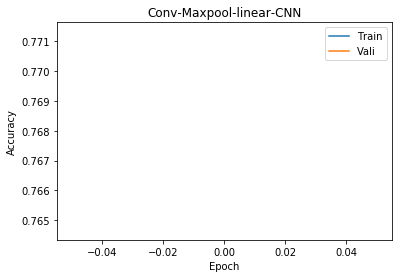

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.706
[1, 40000] loss: 0.699
Training Accu:  0.768825
Validation Accu:  0.7596
Finish Traning
Test 0 th batch, 701 correct, tested 1000, batch size 1000
Test 1 th batch, 1397 correct, tested 2000, batch size 1000
Test 2 th batch, 2090 correct, tested 3000, batch size 1000
Test 3 th batch, 2797 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4208 correct, tested 6000, batch size 1000
Test 6 th batch, 4893 correct, tested 7000, batch size 1000
Test 7 th batch, 5610 correct, tested 8000, batch size 1000
Test 8 th batch, 6289 correct, tested 9000, batch size 1000
Test 9 th batch, 6970 correct, tested 10000, batch size 1000


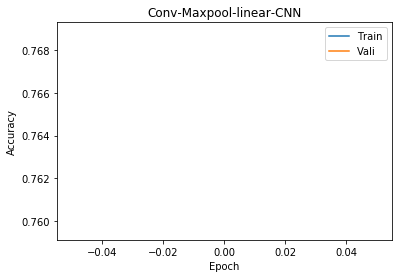

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.700
[1, 40000] loss: 0.702
Training Accu:  0.771625
Validation Accu:  0.7599
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1391 correct, tested 2000, batch size 1000
Test 2 th batch, 2087 correct, tested 3000, batch size 1000
Test 3 th batch, 2787 correct, tested 4000, batch size 1000
Test 4 th batch, 3515 correct, tested 5000, batch size 1000
Test 5 th batch, 4190 correct, tested 6000, batch size 1000
Test 6 th batch, 4876 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6268 correct, tested 9000, batch size 1000
Test 9 th batch, 6947 correct, tested 10000, batch size 1000


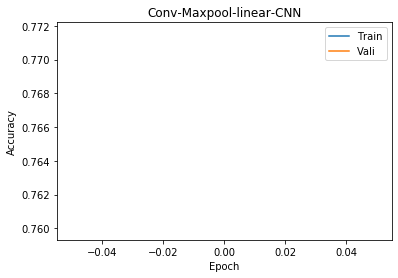

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.703
[1, 40000] loss: 0.699
Training Accu:  0.768975
Validation Accu:  0.7601
Finish Traning
Test 0 th batch, 701 correct, tested 1000, batch size 1000
Test 1 th batch, 1392 correct, tested 2000, batch size 1000
Test 2 th batch, 2086 correct, tested 3000, batch size 1000
Test 3 th batch, 2785 correct, tested 4000, batch size 1000
Test 4 th batch, 3504 correct, tested 5000, batch size 1000
Test 5 th batch, 4180 correct, tested 6000, batch size 1000
Test 6 th batch, 4854 correct, tested 7000, batch size 1000
Test 7 th batch, 5563 correct, tested 8000, batch size 1000
Test 8 th batch, 6229 correct, tested 9000, batch size 1000
Test 9 th batch, 6904 correct, tested 10000, batch size 1000


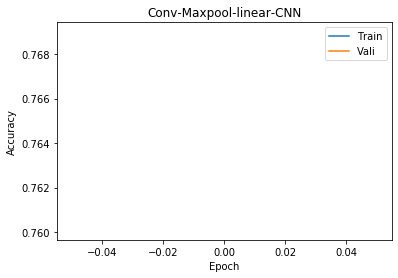

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.697
[1, 40000] loss: 0.704
Training Accu:  0.7695
Validation Accu:  0.7641
Finish Traning
Test 0 th batch, 702 correct, tested 1000, batch size 1000
Test 1 th batch, 1386 correct, tested 2000, batch size 1000
Test 2 th batch, 2077 correct, tested 3000, batch size 1000
Test 3 th batch, 2768 correct, tested 4000, batch size 1000
Test 4 th batch, 3480 correct, tested 5000, batch size 1000
Test 5 th batch, 4162 correct, tested 6000, batch size 1000
Test 6 th batch, 4830 correct, tested 7000, batch size 1000
Test 7 th batch, 5536 correct, tested 8000, batch size 1000
Test 8 th batch, 6209 correct, tested 9000, batch size 1000
Test 9 th batch, 6879 correct, tested 10000, batch size 1000


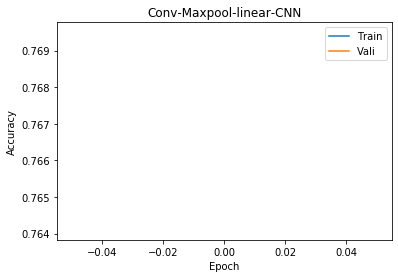

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.700
[1, 40000] loss: 0.702
Training Accu:  0.76775
Validation Accu:  0.7617
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1382 correct, tested 2000, batch size 1000
Test 2 th batch, 2061 correct, tested 3000, batch size 1000
Test 3 th batch, 2755 correct, tested 4000, batch size 1000
Test 4 th batch, 3481 correct, tested 5000, batch size 1000
Test 5 th batch, 4170 correct, tested 6000, batch size 1000
Test 6 th batch, 4849 correct, tested 7000, batch size 1000
Test 7 th batch, 5556 correct, tested 8000, batch size 1000
Test 8 th batch, 6229 correct, tested 9000, batch size 1000
Test 9 th batch, 6917 correct, tested 10000, batch size 1000


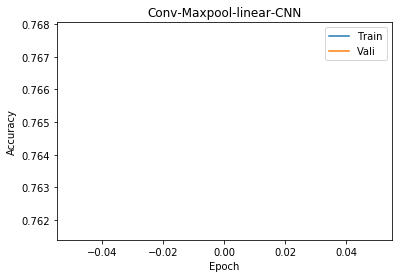

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.691
[1, 40000] loss: 0.705
Training Accu:  0.769875
Validation Accu:  0.7745
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2101 correct, tested 3000, batch size 1000
Test 3 th batch, 2803 correct, tested 4000, batch size 1000
Test 4 th batch, 3527 correct, tested 5000, batch size 1000
Test 5 th batch, 4208 correct, tested 6000, batch size 1000
Test 6 th batch, 4894 correct, tested 7000, batch size 1000
Test 7 th batch, 5608 correct, tested 8000, batch size 1000
Test 8 th batch, 6297 correct, tested 9000, batch size 1000
Test 9 th batch, 6975 correct, tested 10000, batch size 1000


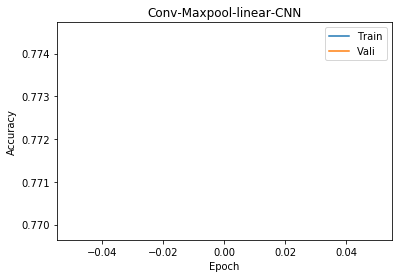

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.702
[1, 40000] loss: 0.699
Training Accu:  0.768
Validation Accu:  0.7674
Finish Traning
Test 0 th batch, 704 correct, tested 1000, batch size 1000
Test 1 th batch, 1385 correct, tested 2000, batch size 1000
Test 2 th batch, 2085 correct, tested 3000, batch size 1000
Test 3 th batch, 2790 correct, tested 4000, batch size 1000
Test 4 th batch, 3513 correct, tested 5000, batch size 1000
Test 5 th batch, 4188 correct, tested 6000, batch size 1000
Test 6 th batch, 4861 correct, tested 7000, batch size 1000
Test 7 th batch, 5564 correct, tested 8000, batch size 1000
Test 8 th batch, 6242 correct, tested 9000, batch size 1000
Test 9 th batch, 6931 correct, tested 10000, batch size 1000


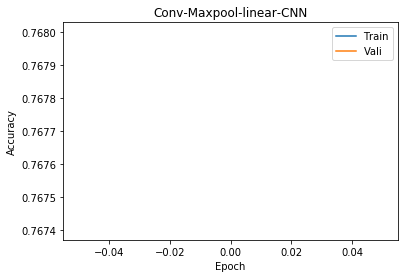

Test Accu: 0.6979
Epoch:  1
[1, 20000] loss: 0.692
[1, 40000] loss: 0.704
Training Accu:  0.7705
Validation Accu:  0.7824
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1403 correct, tested 2000, batch size 1000
Test 2 th batch, 2100 correct, tested 3000, batch size 1000
Test 3 th batch, 2805 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4231 correct, tested 6000, batch size 1000
Test 6 th batch, 4920 correct, tested 7000, batch size 1000
Test 7 th batch, 5637 correct, tested 8000, batch size 1000
Test 8 th batch, 6321 correct, tested 9000, batch size 1000
Test 9 th batch, 7001 correct, tested 10000, batch size 1000


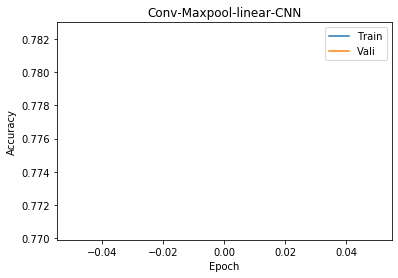

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.687
[1, 40000] loss: 0.684
Training Accu:  0.7746
Validation Accu:  0.7679
Finish Traning
Test 0 th batch, 701 correct, tested 1000, batch size 1000
Test 1 th batch, 1393 correct, tested 2000, batch size 1000
Test 2 th batch, 2089 correct, tested 3000, batch size 1000
Test 3 th batch, 2792 correct, tested 4000, batch size 1000
Test 4 th batch, 3519 correct, tested 5000, batch size 1000
Test 5 th batch, 4205 correct, tested 6000, batch size 1000
Test 6 th batch, 4894 correct, tested 7000, batch size 1000
Test 7 th batch, 5607 correct, tested 8000, batch size 1000
Test 8 th batch, 6284 correct, tested 9000, batch size 1000
Test 9 th batch, 6971 correct, tested 10000, batch size 1000


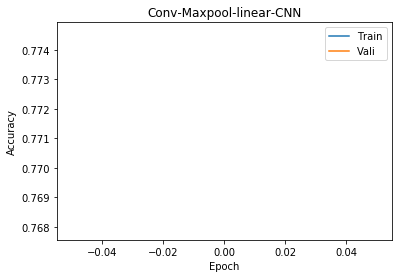

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.695
[1, 40000] loss: 0.687
Training Accu:  0.77065
Validation Accu:  0.776
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2105 correct, tested 3000, batch size 1000
Test 3 th batch, 2819 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4234 correct, tested 6000, batch size 1000
Test 6 th batch, 4915 correct, tested 7000, batch size 1000
Test 7 th batch, 5623 correct, tested 8000, batch size 1000
Test 8 th batch, 6311 correct, tested 9000, batch size 1000
Test 9 th batch, 7000 correct, tested 10000, batch size 1000


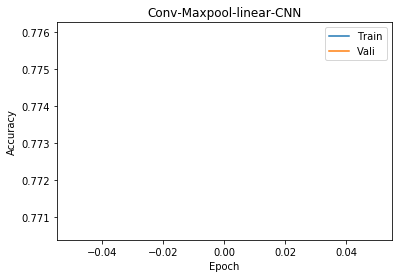

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.692
[1, 40000] loss: 0.680
Training Accu:  0.775225
Validation Accu:  0.7751
Finish Traning
Test 0 th batch, 704 correct, tested 1000, batch size 1000
Test 1 th batch, 1390 correct, tested 2000, batch size 1000
Test 2 th batch, 2075 correct, tested 3000, batch size 1000
Test 3 th batch, 2773 correct, tested 4000, batch size 1000
Test 4 th batch, 3496 correct, tested 5000, batch size 1000
Test 5 th batch, 4193 correct, tested 6000, batch size 1000
Test 6 th batch, 4864 correct, tested 7000, batch size 1000
Test 7 th batch, 5575 correct, tested 8000, batch size 1000
Test 8 th batch, 6266 correct, tested 9000, batch size 1000
Test 9 th batch, 6951 correct, tested 10000, batch size 1000


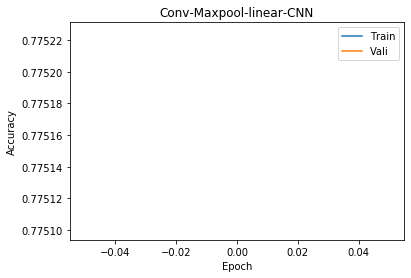

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.669
[1, 40000] loss: 0.695
Training Accu:  0.77575
Validation Accu:  0.7621
Finish Traning
Test 0 th batch, 697 correct, tested 1000, batch size 1000
Test 1 th batch, 1401 correct, tested 2000, batch size 1000
Test 2 th batch, 2085 correct, tested 3000, batch size 1000
Test 3 th batch, 2788 correct, tested 4000, batch size 1000
Test 4 th batch, 3504 correct, tested 5000, batch size 1000
Test 5 th batch, 4180 correct, tested 6000, batch size 1000
Test 6 th batch, 4852 correct, tested 7000, batch size 1000
Test 7 th batch, 5547 correct, tested 8000, batch size 1000
Test 8 th batch, 6230 correct, tested 9000, batch size 1000
Test 9 th batch, 6909 correct, tested 10000, batch size 1000


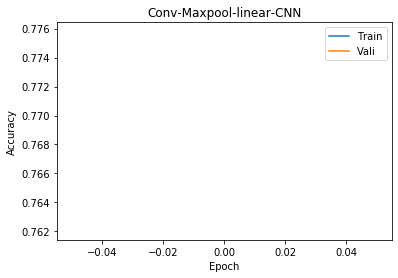

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.683
[1, 40000] loss: 0.687
Training Accu:  0.774025
Validation Accu:  0.7734
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2101 correct, tested 3000, batch size 1000
Test 3 th batch, 2803 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4223 correct, tested 6000, batch size 1000
Test 6 th batch, 4912 correct, tested 7000, batch size 1000
Test 7 th batch, 5614 correct, tested 8000, batch size 1000
Test 8 th batch, 6314 correct, tested 9000, batch size 1000
Test 9 th batch, 7000 correct, tested 10000, batch size 1000


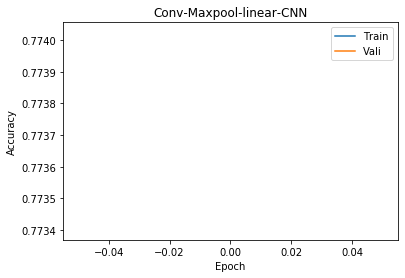

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.680
[1, 40000] loss: 0.679
Training Accu:  0.775875
Validation Accu:  0.7762
Finish Traning
Test 0 th batch, 702 correct, tested 1000, batch size 1000
Test 1 th batch, 1395 correct, tested 2000, batch size 1000
Test 2 th batch, 2088 correct, tested 3000, batch size 1000
Test 3 th batch, 2788 correct, tested 4000, batch size 1000
Test 4 th batch, 3509 correct, tested 5000, batch size 1000
Test 5 th batch, 4208 correct, tested 6000, batch size 1000
Test 6 th batch, 4898 correct, tested 7000, batch size 1000
Test 7 th batch, 5604 correct, tested 8000, batch size 1000
Test 8 th batch, 6282 correct, tested 9000, batch size 1000
Test 9 th batch, 6969 correct, tested 10000, batch size 1000


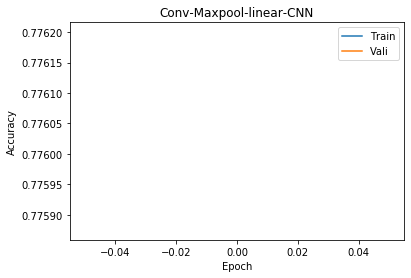

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.680
[1, 40000] loss: 0.682
Training Accu:  0.7763
Validation Accu:  0.7746
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2100 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4223 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5594 correct, tested 8000, batch size 1000
Test 8 th batch, 6288 correct, tested 9000, batch size 1000
Test 9 th batch, 6964 correct, tested 10000, batch size 1000


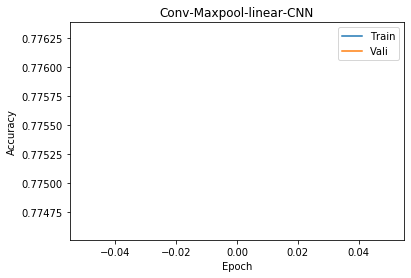

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.676
[1, 40000] loss: 0.678
Training Accu:  0.775925
Validation Accu:  0.7695
Finish Traning
Test 0 th batch, 700 correct, tested 1000, batch size 1000
Test 1 th batch, 1390 correct, tested 2000, batch size 1000
Test 2 th batch, 2082 correct, tested 3000, batch size 1000
Test 3 th batch, 2772 correct, tested 4000, batch size 1000
Test 4 th batch, 3493 correct, tested 5000, batch size 1000
Test 5 th batch, 4191 correct, tested 6000, batch size 1000
Test 6 th batch, 4872 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6272 correct, tested 9000, batch size 1000
Test 9 th batch, 6950 correct, tested 10000, batch size 1000


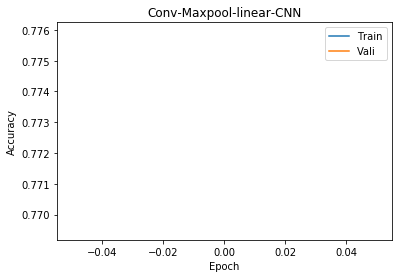

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.668
[1, 40000] loss: 0.670
Training Accu:  0.780875
Validation Accu:  0.7722
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2104 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3531 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5611 correct, tested 8000, batch size 1000
Test 8 th batch, 6290 correct, tested 9000, batch size 1000
Test 9 th batch, 6974 correct, tested 10000, batch size 1000


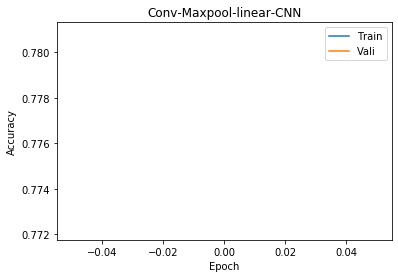

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.673
[1, 40000] loss: 0.669
Training Accu:  0.7815
Validation Accu:  0.7823
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1404 correct, tested 2000, batch size 1000
Test 2 th batch, 2103 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3533 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4921 correct, tested 7000, batch size 1000
Test 7 th batch, 5629 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 7000 correct, tested 10000, batch size 1000


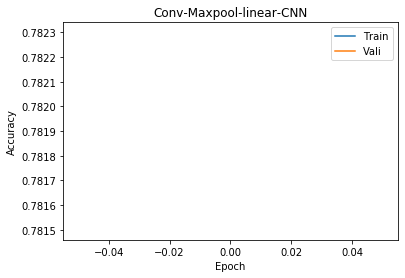

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.669
[1, 40000] loss: 0.680
Training Accu:  0.779025
Validation Accu:  0.7805
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2108 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4913 correct, tested 7000, batch size 1000
Test 7 th batch, 5624 correct, tested 8000, batch size 1000
Test 8 th batch, 6315 correct, tested 9000, batch size 1000
Test 9 th batch, 6999 correct, tested 10000, batch size 1000


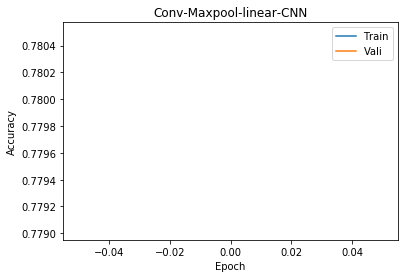

Test Accu: 0.7001
Epoch:  1
[1, 20000] loss: 0.673
[1, 40000] loss: 0.665
Training Accu:  0.77965
Validation Accu:  0.7858
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2119 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4244 correct, tested 6000, batch size 1000
Test 6 th batch, 4927 correct, tested 7000, batch size 1000
Test 7 th batch, 5644 correct, tested 8000, batch size 1000
Test 8 th batch, 6330 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


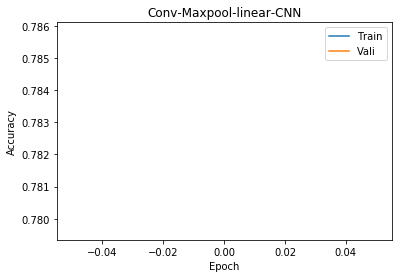

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.662
[1, 40000] loss: 0.676
Training Accu:  0.78065
Validation Accu:  0.7822
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2104 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3542 correct, tested 5000, batch size 1000
Test 5 th batch, 4241 correct, tested 6000, batch size 1000
Test 6 th batch, 4928 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6331 correct, tested 9000, batch size 1000
Test 9 th batch, 7011 correct, tested 10000, batch size 1000


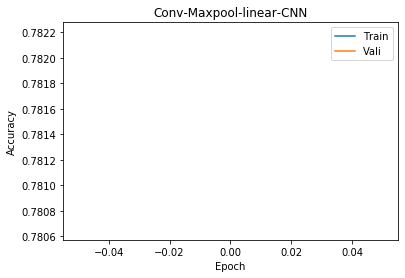

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.662
[1, 40000] loss: 0.670
Training Accu:  0.7828
Validation Accu:  0.7811
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1403 correct, tested 2000, batch size 1000
Test 2 th batch, 2100 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4209 correct, tested 6000, batch size 1000
Test 6 th batch, 4883 correct, tested 7000, batch size 1000
Test 7 th batch, 5599 correct, tested 8000, batch size 1000
Test 8 th batch, 6287 correct, tested 9000, batch size 1000
Test 9 th batch, 6959 correct, tested 10000, batch size 1000


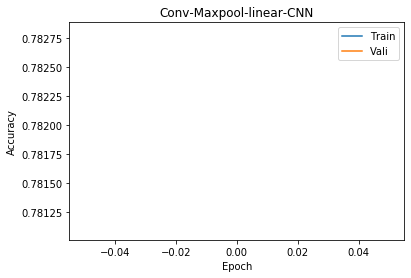

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.661
[1, 40000] loss: 0.666
Training Accu:  0.782475
Validation Accu:  0.7788
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2108 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3525 correct, tested 5000, batch size 1000
Test 5 th batch, 4208 correct, tested 6000, batch size 1000
Test 6 th batch, 4892 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6287 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


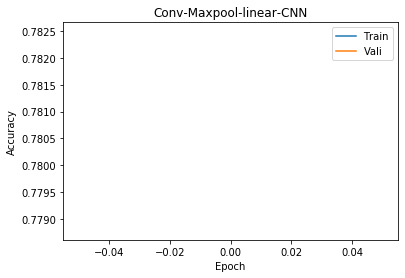

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.668
[1, 40000] loss: 0.651
Training Accu:  0.782225
Validation Accu:  0.784
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1403 correct, tested 2000, batch size 1000
Test 2 th batch, 2107 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4240 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5642 correct, tested 8000, batch size 1000
Test 8 th batch, 6328 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


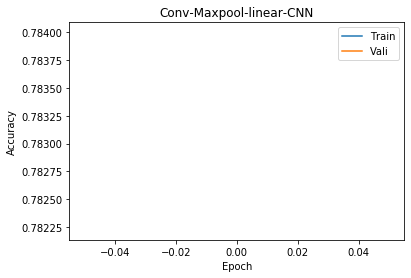

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.652
[1, 40000] loss: 0.661
Training Accu:  0.7839
Validation Accu:  0.7774
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1401 correct, tested 2000, batch size 1000
Test 2 th batch, 2092 correct, tested 3000, batch size 1000
Test 3 th batch, 2801 correct, tested 4000, batch size 1000
Test 4 th batch, 3521 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4879 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6278 correct, tested 9000, batch size 1000
Test 9 th batch, 6950 correct, tested 10000, batch size 1000


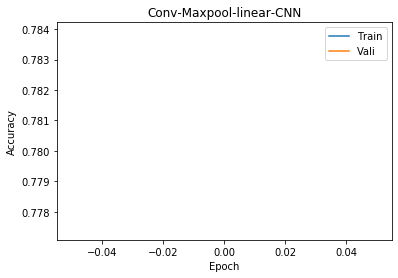

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.659
[1, 40000] loss: 0.663
Training Accu:  0.7816
Validation Accu:  0.782
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2106 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4907 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6301 correct, tested 9000, batch size 1000
Test 9 th batch, 6983 correct, tested 10000, batch size 1000


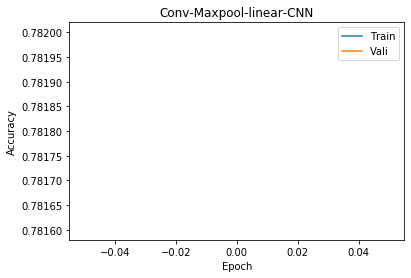

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.652
[1, 40000] loss: 0.663
Training Accu:  0.78425
Validation Accu:  0.7931
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1404 correct, tested 2000, batch size 1000
Test 2 th batch, 2096 correct, tested 3000, batch size 1000
Test 3 th batch, 2798 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4220 correct, tested 6000, batch size 1000
Test 6 th batch, 4899 correct, tested 7000, batch size 1000
Test 7 th batch, 5617 correct, tested 8000, batch size 1000
Test 8 th batch, 6304 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


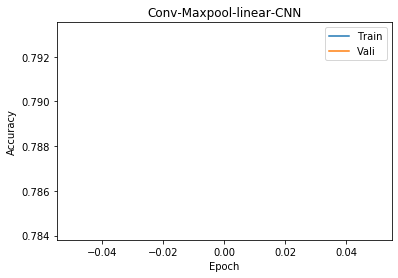

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.641
[1, 40000] loss: 0.652
Training Accu:  0.788825
Validation Accu:  0.7798
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4242 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5648 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7013 correct, tested 10000, batch size 1000


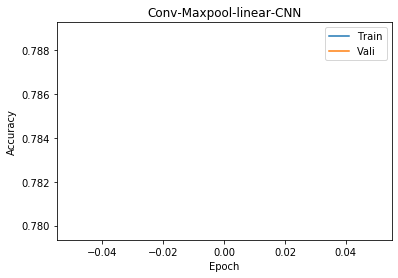

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.647
[1, 40000] loss: 0.657
Training Accu:  0.78835
Validation Accu:  0.7871
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2106 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5632 correct, tested 8000, batch size 1000
Test 8 th batch, 6313 correct, tested 9000, batch size 1000
Test 9 th batch, 6992 correct, tested 10000, batch size 1000


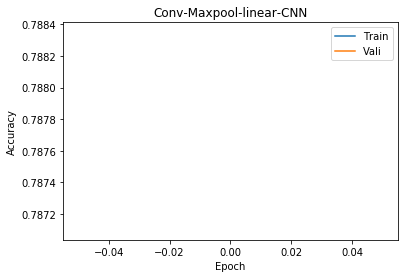

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.647
[1, 40000] loss: 0.653
Training Accu:  0.78925
Validation Accu:  0.7839
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5641 correct, tested 8000, batch size 1000
Test 8 th batch, 6333 correct, tested 9000, batch size 1000
Test 9 th batch, 7010 correct, tested 10000, batch size 1000


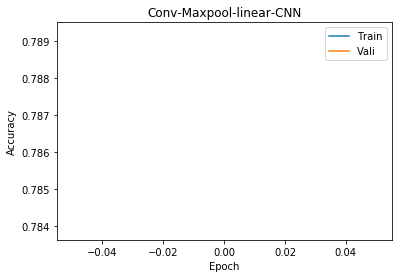

Test Accu: 0.7014
Epoch:  1
[1, 20000] loss: 0.642
[1, 40000] loss: 0.657
Training Accu:  0.786975
Validation Accu:  0.7908
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4258 correct, tested 6000, batch size 1000
Test 6 th batch, 4935 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7015 correct, tested 10000, batch size 1000


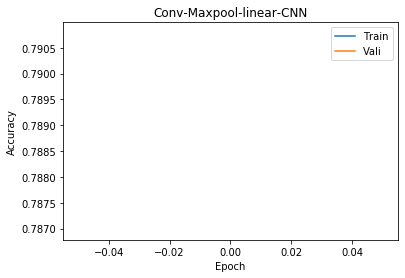

Test Accu: 0.7015
Epoch:  1
[1, 20000] loss: 0.648
[1, 40000] loss: 0.653
Training Accu:  0.7861
Validation Accu:  0.7854
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4233 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


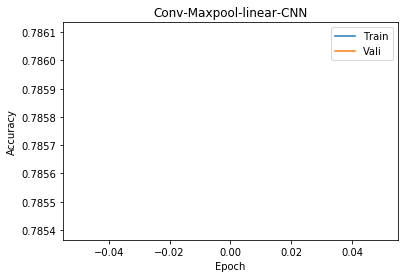

Test Accu: 0.7015
Epoch:  1
[1, 20000] loss: 0.656
[1, 40000] loss: 0.648
Training Accu:  0.785475
Validation Accu:  0.7868
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1397 correct, tested 2000, batch size 1000
Test 2 th batch, 2099 correct, tested 3000, batch size 1000
Test 3 th batch, 2797 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4215 correct, tested 6000, batch size 1000
Test 6 th batch, 4900 correct, tested 7000, batch size 1000
Test 7 th batch, 5609 correct, tested 8000, batch size 1000
Test 8 th batch, 6285 correct, tested 9000, batch size 1000
Test 9 th batch, 6969 correct, tested 10000, batch size 1000


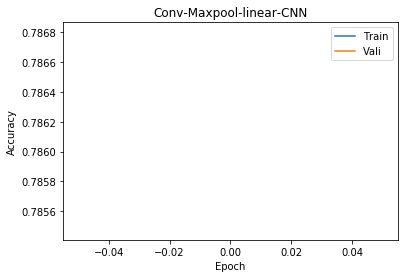

Test Accu: 0.7015
Epoch:  1
[1, 20000] loss: 0.643
[1, 40000] loss: 0.647
Training Accu:  0.7887
Validation Accu:  0.7947
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2810 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4227 correct, tested 6000, batch size 1000
Test 6 th batch, 4898 correct, tested 7000, batch size 1000
Test 7 th batch, 5600 correct, tested 8000, batch size 1000
Test 8 th batch, 6294 correct, tested 9000, batch size 1000
Test 9 th batch, 6987 correct, tested 10000, batch size 1000


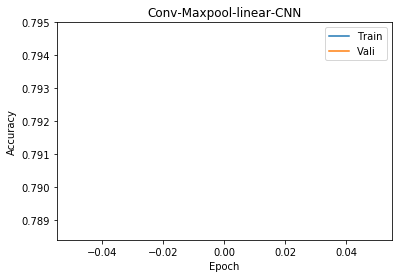

Test Accu: 0.7015
Epoch:  1
[1, 20000] loss: 0.639
[1, 40000] loss: 0.642
Training Accu:  0.792225
Validation Accu:  0.7839
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4249 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5660 correct, tested 8000, batch size 1000
Test 8 th batch, 6352 correct, tested 9000, batch size 1000
Test 9 th batch, 7033 correct, tested 10000, batch size 1000


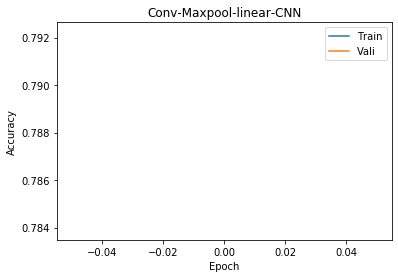

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.643
[1, 40000] loss: 0.647
Training Accu:  0.78815
Validation Accu:  0.7931
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2106 correct, tested 3000, batch size 1000
Test 3 th batch, 2807 correct, tested 4000, batch size 1000
Test 4 th batch, 3531 correct, tested 5000, batch size 1000
Test 5 th batch, 4233 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5644 correct, tested 8000, batch size 1000
Test 8 th batch, 6331 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


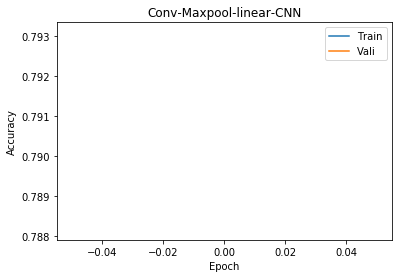

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.628
[1, 40000] loss: 0.641
Training Accu:  0.79325
Validation Accu:  0.7915
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2109 correct, tested 3000, batch size 1000
Test 3 th batch, 2808 correct, tested 4000, batch size 1000
Test 4 th batch, 3535 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6319 correct, tested 9000, batch size 1000
Test 9 th batch, 7010 correct, tested 10000, batch size 1000


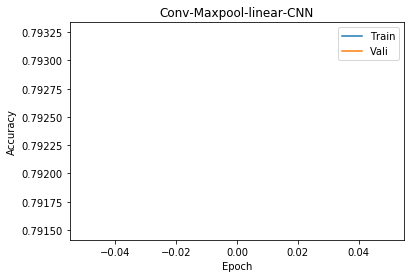

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.636
[1, 40000] loss: 0.641
Training Accu:  0.792375
Validation Accu:  0.7872
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1399 correct, tested 2000, batch size 1000
Test 2 th batch, 2094 correct, tested 3000, batch size 1000
Test 3 th batch, 2802 correct, tested 4000, batch size 1000
Test 4 th batch, 3520 correct, tested 5000, batch size 1000
Test 5 th batch, 4213 correct, tested 6000, batch size 1000
Test 6 th batch, 4895 correct, tested 7000, batch size 1000
Test 7 th batch, 5600 correct, tested 8000, batch size 1000
Test 8 th batch, 6280 correct, tested 9000, batch size 1000
Test 9 th batch, 6957 correct, tested 10000, batch size 1000


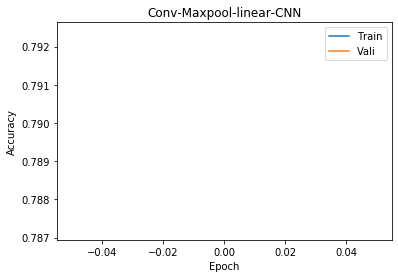

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.637
[1, 40000] loss: 0.627
Training Accu:  0.7952
Validation Accu:  0.7882
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1402 correct, tested 2000, batch size 1000
Test 2 th batch, 2104 correct, tested 3000, batch size 1000
Test 3 th batch, 2805 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4217 correct, tested 6000, batch size 1000
Test 6 th batch, 4902 correct, tested 7000, batch size 1000
Test 7 th batch, 5625 correct, tested 8000, batch size 1000
Test 8 th batch, 6302 correct, tested 9000, batch size 1000
Test 9 th batch, 6969 correct, tested 10000, batch size 1000


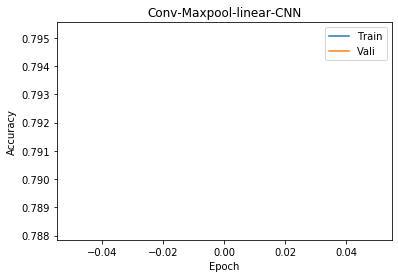

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.631
[1, 40000] loss: 0.632
Training Accu:  0.7928
Validation Accu:  0.7831
Finish Traning
Test 0 th batch, 702 correct, tested 1000, batch size 1000
Test 1 th batch, 1400 correct, tested 2000, batch size 1000
Test 2 th batch, 2100 correct, tested 3000, batch size 1000
Test 3 th batch, 2799 correct, tested 4000, batch size 1000
Test 4 th batch, 3519 correct, tested 5000, batch size 1000
Test 5 th batch, 4199 correct, tested 6000, batch size 1000
Test 6 th batch, 4871 correct, tested 7000, batch size 1000
Test 7 th batch, 5589 correct, tested 8000, batch size 1000
Test 8 th batch, 6268 correct, tested 9000, batch size 1000
Test 9 th batch, 6946 correct, tested 10000, batch size 1000


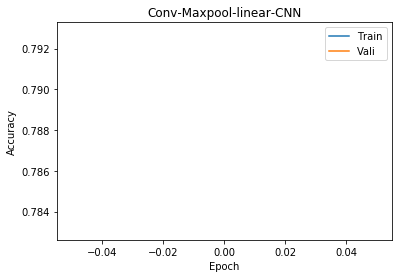

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.621
[1, 40000] loss: 0.641
Training Accu:  0.792875
Validation Accu:  0.7973
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2106 correct, tested 3000, batch size 1000
Test 3 th batch, 2807 correct, tested 4000, batch size 1000
Test 4 th batch, 3531 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4910 correct, tested 7000, batch size 1000
Test 7 th batch, 5626 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 7004 correct, tested 10000, batch size 1000


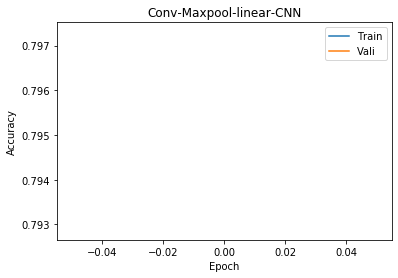

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.629
[1, 40000] loss: 0.638
Training Accu:  0.792075
Validation Accu:  0.7971
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4906 correct, tested 7000, batch size 1000
Test 7 th batch, 5624 correct, tested 8000, batch size 1000
Test 8 th batch, 6314 correct, tested 9000, batch size 1000
Test 9 th batch, 7007 correct, tested 10000, batch size 1000


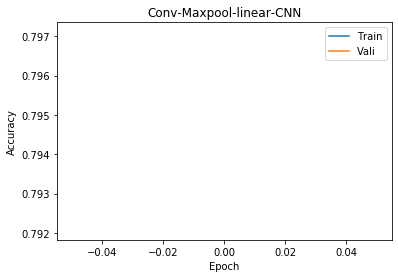

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.619
[1, 40000] loss: 0.638
Training Accu:  0.794325
Validation Accu:  0.793
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4930 correct, tested 7000, batch size 1000
Test 7 th batch, 5644 correct, tested 8000, batch size 1000
Test 8 th batch, 6327 correct, tested 9000, batch size 1000
Test 9 th batch, 7017 correct, tested 10000, batch size 1000


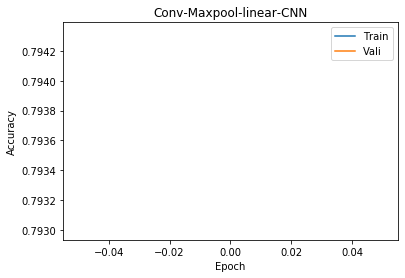

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.618
[1, 40000] loss: 0.628
Training Accu:  0.796825
Validation Accu:  0.7911
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1437 correct, tested 2000, batch size 1000
Test 2 th batch, 2142 correct, tested 3000, batch size 1000
Test 3 th batch, 2856 correct, tested 4000, batch size 1000
Test 4 th batch, 3578 correct, tested 5000, batch size 1000
Test 5 th batch, 4265 correct, tested 6000, batch size 1000
Test 6 th batch, 4947 correct, tested 7000, batch size 1000
Test 7 th batch, 5663 correct, tested 8000, batch size 1000
Test 8 th batch, 6349 correct, tested 9000, batch size 1000
Test 9 th batch, 7031 correct, tested 10000, batch size 1000


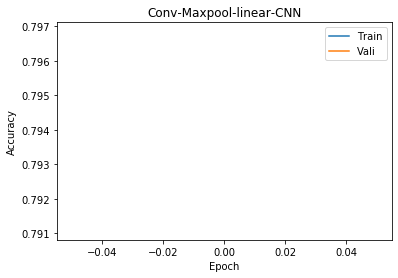

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.622
[1, 40000] loss: 0.618
Training Accu:  0.798925
Validation Accu:  0.7876
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2126 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 6995 correct, tested 10000, batch size 1000


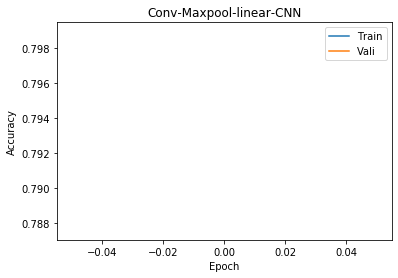

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.625
[1, 40000] loss: 0.618
Training Accu:  0.796525
Validation Accu:  0.7999
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1405 correct, tested 2000, batch size 1000
Test 2 th batch, 2107 correct, tested 3000, batch size 1000
Test 3 th batch, 2807 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5633 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7003 correct, tested 10000, batch size 1000


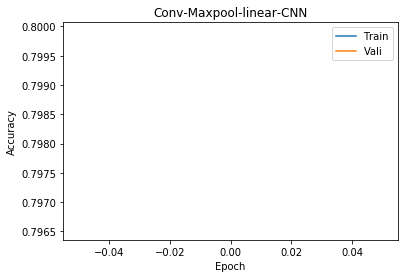

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.623
[1, 40000] loss: 0.636
Training Accu:  0.793325
Validation Accu:  0.7909
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2113 correct, tested 3000, batch size 1000
Test 3 th batch, 2818 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4918 correct, tested 7000, batch size 1000
Test 7 th batch, 5632 correct, tested 8000, batch size 1000
Test 8 th batch, 6316 correct, tested 9000, batch size 1000
Test 9 th batch, 6999 correct, tested 10000, batch size 1000


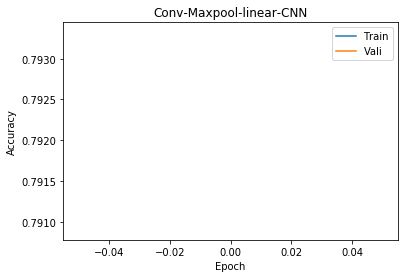

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.622
[1, 40000] loss: 0.619
Training Accu:  0.796575
Validation Accu:  0.7905
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4270 correct, tested 6000, batch size 1000
Test 6 th batch, 4955 correct, tested 7000, batch size 1000
Test 7 th batch, 5668 correct, tested 8000, batch size 1000
Test 8 th batch, 6349 correct, tested 9000, batch size 1000
Test 9 th batch, 7033 correct, tested 10000, batch size 1000


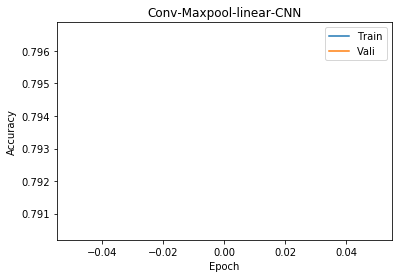

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.627
[1, 40000] loss: 0.624
Training Accu:  0.792725
Validation Accu:  0.7979
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4227 correct, tested 6000, batch size 1000
Test 6 th batch, 4918 correct, tested 7000, batch size 1000
Test 7 th batch, 5640 correct, tested 8000, batch size 1000
Test 8 th batch, 6322 correct, tested 9000, batch size 1000
Test 9 th batch, 7006 correct, tested 10000, batch size 1000


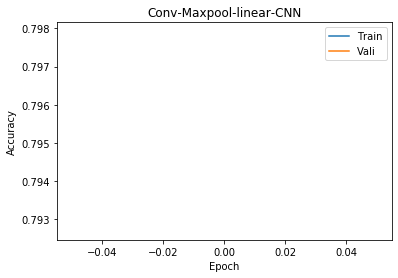

Test Accu: 0.7033
Epoch:  1
[1, 20000] loss: 0.614
[1, 40000] loss: 0.621
Training Accu:  0.798175
Validation Accu:  0.7997
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2846 correct, tested 4000, batch size 1000
Test 4 th batch, 3581 correct, tested 5000, batch size 1000
Test 5 th batch, 4285 correct, tested 6000, batch size 1000
Test 6 th batch, 4975 correct, tested 7000, batch size 1000
Test 7 th batch, 5682 correct, tested 8000, batch size 1000
Test 8 th batch, 6359 correct, tested 9000, batch size 1000
Test 9 th batch, 7051 correct, tested 10000, batch size 1000


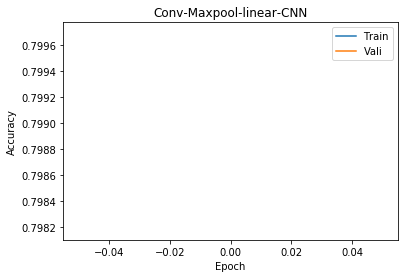

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.620
[1, 40000] loss: 0.612
Training Accu:  0.80065
Validation Accu:  0.7984
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4262 correct, tested 6000, batch size 1000
Test 6 th batch, 4947 correct, tested 7000, batch size 1000
Test 7 th batch, 5657 correct, tested 8000, batch size 1000
Test 8 th batch, 6345 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


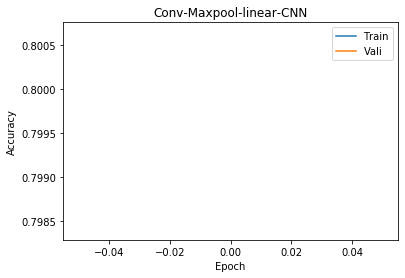

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.619
[1, 40000] loss: 0.612
Training Accu:  0.797475
Validation Accu:  0.7972
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1401 correct, tested 2000, batch size 1000
Test 2 th batch, 2101 correct, tested 3000, batch size 1000
Test 3 th batch, 2796 correct, tested 4000, batch size 1000
Test 4 th batch, 3515 correct, tested 5000, batch size 1000
Test 5 th batch, 4205 correct, tested 6000, batch size 1000
Test 6 th batch, 4888 correct, tested 7000, batch size 1000
Test 7 th batch, 5597 correct, tested 8000, batch size 1000
Test 8 th batch, 6284 correct, tested 9000, batch size 1000
Test 9 th batch, 6961 correct, tested 10000, batch size 1000


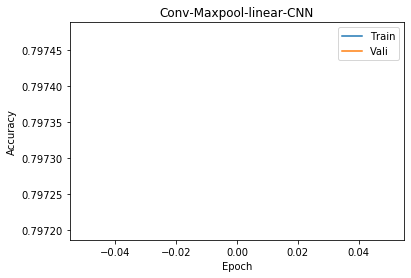

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.615
[1, 40000] loss: 0.619
Training Accu:  0.797625
Validation Accu:  0.7975
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2111 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4249 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5653 correct, tested 8000, batch size 1000
Test 8 th batch, 6335 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


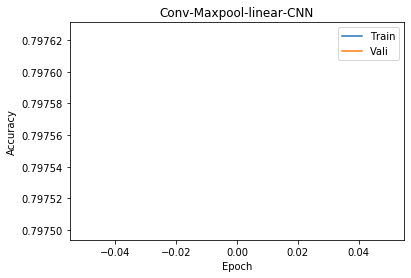

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.610
[1, 40000] loss: 0.611
Training Accu:  0.800875
Validation Accu:  0.8013
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5666 correct, tested 8000, batch size 1000
Test 8 th batch, 6355 correct, tested 9000, batch size 1000
Test 9 th batch, 7041 correct, tested 10000, batch size 1000


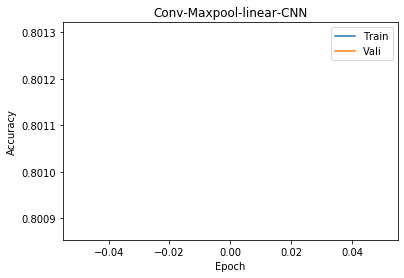

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.608
[1, 40000] loss: 0.613
Training Accu:  0.800575
Validation Accu:  0.8106
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5653 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


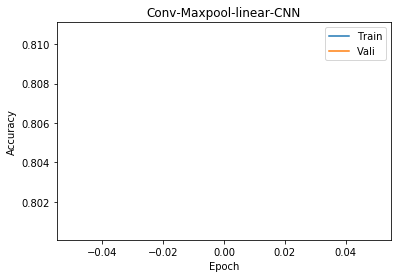

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.600
[1, 40000] loss: 0.609
Training Accu:  0.802775
Validation Accu:  0.8
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2107 correct, tested 3000, batch size 1000
Test 3 th batch, 2804 correct, tested 4000, batch size 1000
Test 4 th batch, 3531 correct, tested 5000, batch size 1000
Test 5 th batch, 4227 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5633 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 6991 correct, tested 10000, batch size 1000


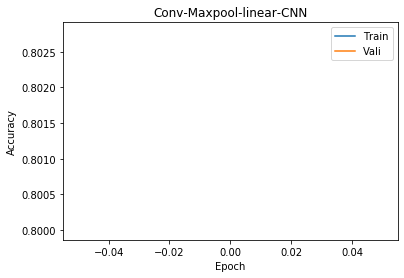

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.604
[1, 40000] loss: 0.606
Training Accu:  0.803425
Validation Accu:  0.8051
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1396 correct, tested 2000, batch size 1000
Test 2 th batch, 2092 correct, tested 3000, batch size 1000
Test 3 th batch, 2793 correct, tested 4000, batch size 1000
Test 4 th batch, 3520 correct, tested 5000, batch size 1000
Test 5 th batch, 4215 correct, tested 6000, batch size 1000
Test 6 th batch, 4903 correct, tested 7000, batch size 1000
Test 7 th batch, 5617 correct, tested 8000, batch size 1000
Test 8 th batch, 6308 correct, tested 9000, batch size 1000
Test 9 th batch, 6990 correct, tested 10000, batch size 1000


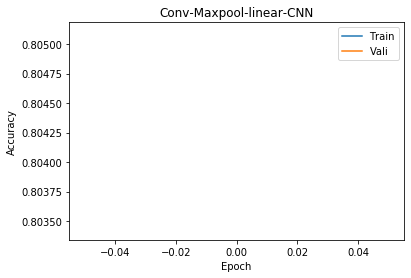

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.597
[1, 40000] loss: 0.607
Training Accu:  0.8047
Validation Accu:  0.8021
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2831 correct, tested 4000, batch size 1000
Test 4 th batch, 3565 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4937 correct, tested 7000, batch size 1000
Test 7 th batch, 5657 correct, tested 8000, batch size 1000
Test 8 th batch, 6351 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


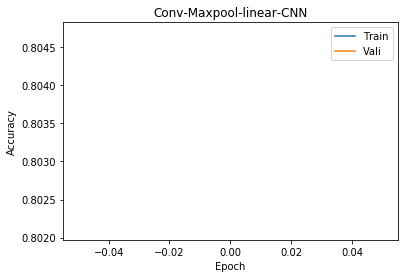

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.601
[1, 40000] loss: 0.602
Training Accu:  0.804325
Validation Accu:  0.8014
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4244 correct, tested 6000, batch size 1000
Test 6 th batch, 4935 correct, tested 7000, batch size 1000
Test 7 th batch, 5651 correct, tested 8000, batch size 1000
Test 8 th batch, 6340 correct, tested 9000, batch size 1000
Test 9 th batch, 7026 correct, tested 10000, batch size 1000


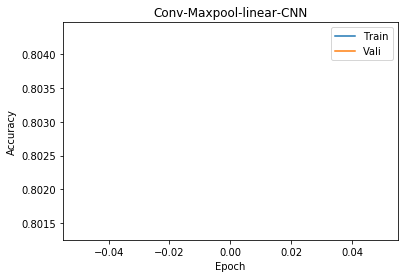

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.590
[1, 40000] loss: 0.608
Training Accu:  0.805325
Validation Accu:  0.804
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2829 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4252 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5662 correct, tested 8000, batch size 1000
Test 8 th batch, 6345 correct, tested 9000, batch size 1000
Test 9 th batch, 7029 correct, tested 10000, batch size 1000


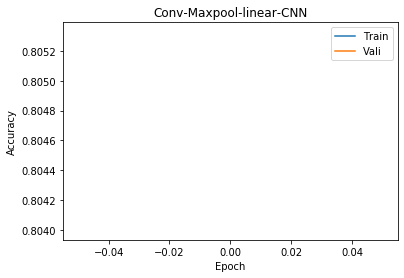

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.605
[1, 40000] loss: 0.590
Training Accu:  0.805175
Validation Accu:  0.8074
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2841 correct, tested 4000, batch size 1000
Test 4 th batch, 3568 correct, tested 5000, batch size 1000
Test 5 th batch, 4261 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5655 correct, tested 8000, batch size 1000
Test 8 th batch, 6347 correct, tested 9000, batch size 1000
Test 9 th batch, 7042 correct, tested 10000, batch size 1000


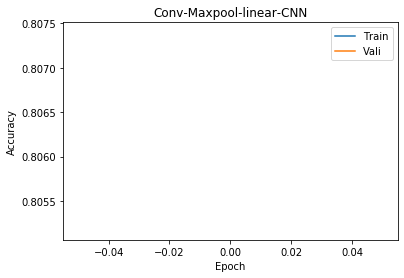

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.586
[1, 40000] loss: 0.601
Training Accu:  0.806225
Validation Accu:  0.8075
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2836 correct, tested 4000, batch size 1000
Test 4 th batch, 3562 correct, tested 5000, batch size 1000
Test 5 th batch, 4260 correct, tested 6000, batch size 1000
Test 6 th batch, 4945 correct, tested 7000, batch size 1000
Test 7 th batch, 5664 correct, tested 8000, batch size 1000
Test 8 th batch, 6354 correct, tested 9000, batch size 1000
Test 9 th batch, 7038 correct, tested 10000, batch size 1000


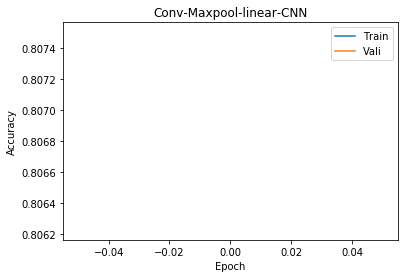

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.589
[1, 40000] loss: 0.603
Training Accu:  0.804575
Validation Accu:  0.7972
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1395 correct, tested 2000, batch size 1000
Test 2 th batch, 2099 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3542 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4928 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 6998 correct, tested 10000, batch size 1000


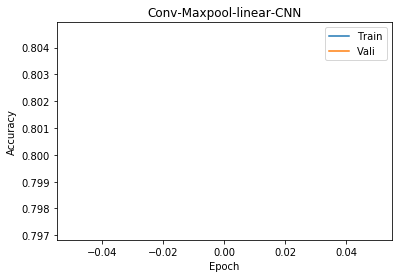

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.594
[1, 40000] loss: 0.593
Training Accu:  0.80615
Validation Accu:  0.8128
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3564 correct, tested 5000, batch size 1000
Test 5 th batch, 4252 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5651 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7035 correct, tested 10000, batch size 1000


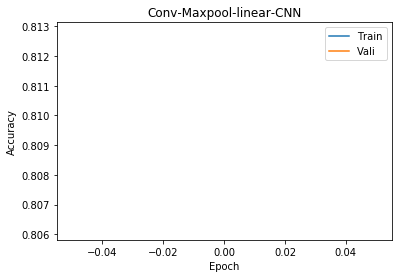

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.587
[1, 40000] loss: 0.597
Training Accu:  0.806675
Validation Accu:  0.801
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4247 correct, tested 6000, batch size 1000
Test 6 th batch, 4926 correct, tested 7000, batch size 1000
Test 7 th batch, 5638 correct, tested 8000, batch size 1000
Test 8 th batch, 6326 correct, tested 9000, batch size 1000
Test 9 th batch, 7016 correct, tested 10000, batch size 1000


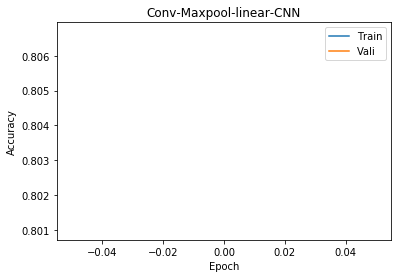

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.597
[1, 40000] loss: 0.589
Training Accu:  0.804475
Validation Accu:  0.8043
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2841 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4932 correct, tested 7000, batch size 1000
Test 7 th batch, 5654 correct, tested 8000, batch size 1000
Test 8 th batch, 6340 correct, tested 9000, batch size 1000
Test 9 th batch, 7013 correct, tested 10000, batch size 1000


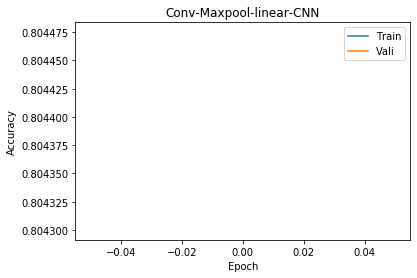

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.586
[1, 40000] loss: 0.595
Training Accu:  0.808475
Validation Accu:  0.8064
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2819 correct, tested 4000, batch size 1000
Test 4 th batch, 3548 correct, tested 5000, batch size 1000
Test 5 th batch, 4249 correct, tested 6000, batch size 1000
Test 6 th batch, 4945 correct, tested 7000, batch size 1000
Test 7 th batch, 5658 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


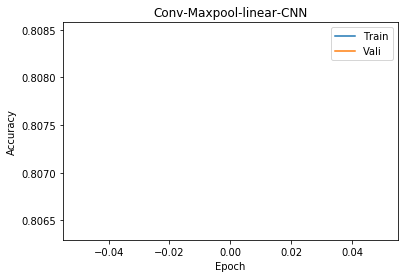

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.584
[1, 40000] loss: 0.595
Training Accu:  0.809725
Validation Accu:  0.8054
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1425 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2836 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4262 correct, tested 6000, batch size 1000
Test 6 th batch, 4941 correct, tested 7000, batch size 1000
Test 7 th batch, 5656 correct, tested 8000, batch size 1000
Test 8 th batch, 6338 correct, tested 9000, batch size 1000
Test 9 th batch, 7027 correct, tested 10000, batch size 1000


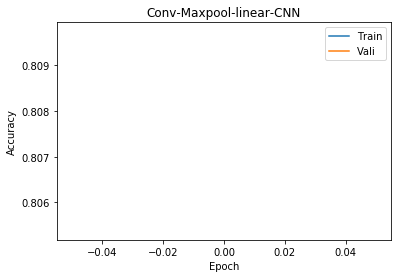

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.595
[1, 40000] loss: 0.587
Training Accu:  0.80705
Validation Accu:  0.8044
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4942 correct, tested 7000, batch size 1000
Test 7 th batch, 5663 correct, tested 8000, batch size 1000
Test 8 th batch, 6355 correct, tested 9000, batch size 1000
Test 9 th batch, 7042 correct, tested 10000, batch size 1000


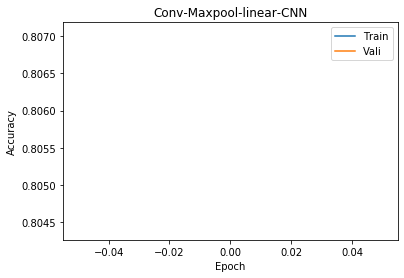

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.582
[1, 40000] loss: 0.588
Training Accu:  0.81
Validation Accu:  0.8053
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2115 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4932 correct, tested 7000, batch size 1000
Test 7 th batch, 5643 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 6994 correct, tested 10000, batch size 1000


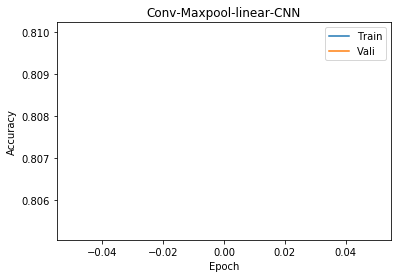

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.582
[1, 40000] loss: 0.590
Training Accu:  0.80835
Validation Accu:  0.8116
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4909 correct, tested 7000, batch size 1000
Test 7 th batch, 5619 correct, tested 8000, batch size 1000
Test 8 th batch, 6305 correct, tested 9000, batch size 1000
Test 9 th batch, 6998 correct, tested 10000, batch size 1000


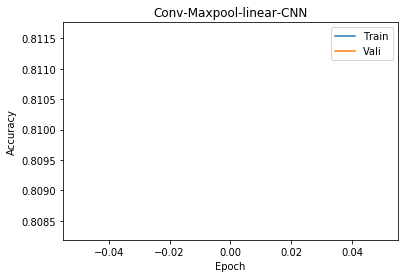

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.578
[1, 40000] loss: 0.585
Training Accu:  0.809175
Validation Accu:  0.809
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2109 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4222 correct, tested 6000, batch size 1000
Test 6 th batch, 4906 correct, tested 7000, batch size 1000
Test 7 th batch, 5621 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 6987 correct, tested 10000, batch size 1000


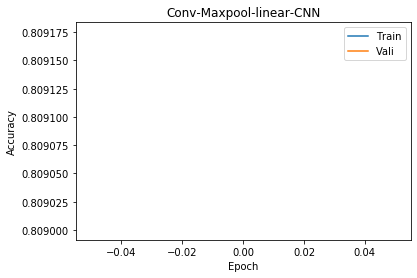

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.587
[1, 40000] loss: 0.577
Training Accu:  0.8095
Validation Accu:  0.8145
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2839 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4248 correct, tested 6000, batch size 1000
Test 6 th batch, 4937 correct, tested 7000, batch size 1000
Test 7 th batch, 5657 correct, tested 8000, batch size 1000
Test 8 th batch, 6349 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


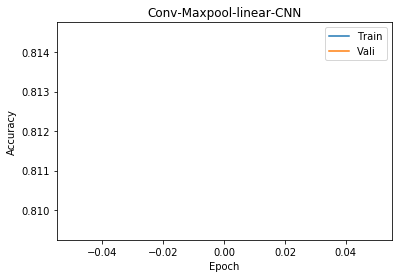

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.577
[1, 40000] loss: 0.581
Training Accu:  0.8114
Validation Accu:  0.81
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2107 correct, tested 3000, batch size 1000
Test 3 th batch, 2807 correct, tested 4000, batch size 1000
Test 4 th batch, 3533 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4910 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6305 correct, tested 9000, batch size 1000
Test 9 th batch, 6986 correct, tested 10000, batch size 1000


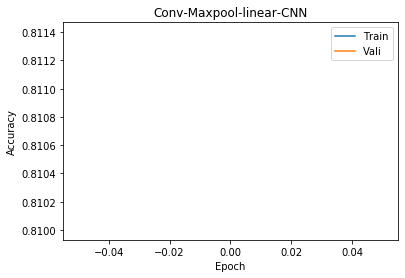

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.578
[1, 40000] loss: 0.574
Training Accu:  0.8122
Validation Accu:  0.8152
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2816 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4942 correct, tested 7000, batch size 1000
Test 7 th batch, 5665 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


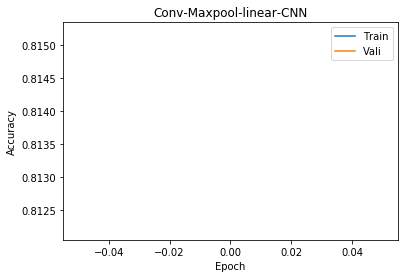

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.577
[1, 40000] loss: 0.572
Training Accu:  0.813475
Validation Accu:  0.8202
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4262 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5661 correct, tested 8000, batch size 1000
Test 8 th batch, 6351 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


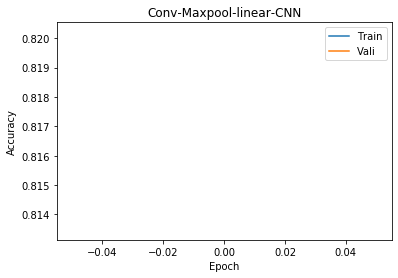

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.559
[1, 40000] loss: 0.585
Training Accu:  0.8144
Validation Accu:  0.8016
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1413 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2804 correct, tested 4000, batch size 1000
Test 4 th batch, 3520 correct, tested 5000, batch size 1000
Test 5 th batch, 4208 correct, tested 6000, batch size 1000
Test 6 th batch, 4883 correct, tested 7000, batch size 1000
Test 7 th batch, 5595 correct, tested 8000, batch size 1000
Test 8 th batch, 6285 correct, tested 9000, batch size 1000
Test 9 th batch, 6963 correct, tested 10000, batch size 1000


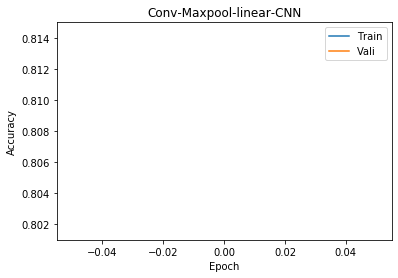

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.573
[1, 40000] loss: 0.576
Training Accu:  0.81175
Validation Accu:  0.8052
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1406 correct, tested 2000, batch size 1000
Test 2 th batch, 2102 correct, tested 3000, batch size 1000
Test 3 th batch, 2805 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4207 correct, tested 6000, batch size 1000
Test 6 th batch, 4882 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6283 correct, tested 9000, batch size 1000
Test 9 th batch, 6961 correct, tested 10000, batch size 1000


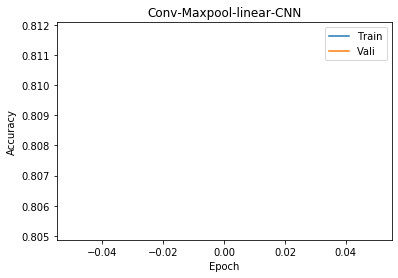

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.567
[1, 40000] loss: 0.579
Training Accu:  0.8126
Validation Accu:  0.8063
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1406 correct, tested 2000, batch size 1000
Test 2 th batch, 2103 correct, tested 3000, batch size 1000
Test 3 th batch, 2802 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4222 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5615 correct, tested 8000, batch size 1000
Test 8 th batch, 6294 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


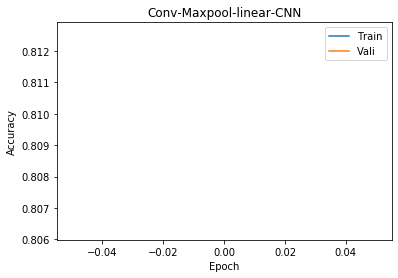

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.570
[1, 40000] loss: 0.588
Training Accu:  0.8127
Validation Accu:  0.8053
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3538 correct, tested 5000, batch size 1000
Test 5 th batch, 4222 correct, tested 6000, batch size 1000
Test 6 th batch, 4909 correct, tested 7000, batch size 1000
Test 7 th batch, 5614 correct, tested 8000, batch size 1000
Test 8 th batch, 6295 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


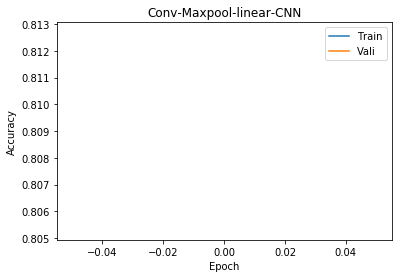

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.575
[1, 40000] loss: 0.564
Training Accu:  0.8139
Validation Accu:  0.8154
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5644 correct, tested 8000, batch size 1000
Test 8 th batch, 6338 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


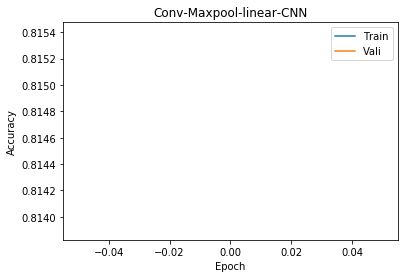

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.554
[1, 40000] loss: 0.565
Training Accu:  0.81835
Validation Accu:  0.8128
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2126 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3548 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5640 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


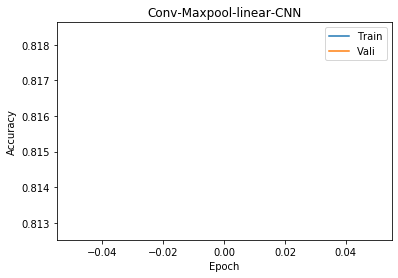

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.565
[1, 40000] loss: 0.569
Training Accu:  0.816425
Validation Accu:  0.8199
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4264 correct, tested 6000, batch size 1000
Test 6 th batch, 4957 correct, tested 7000, batch size 1000
Test 7 th batch, 5666 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


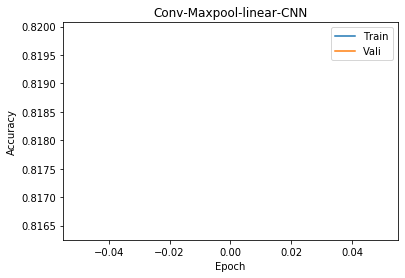

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.566
[1, 40000] loss: 0.565
Training Accu:  0.816425
Validation Accu:  0.8158
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3550 correct, tested 5000, batch size 1000
Test 5 th batch, 4232 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5628 correct, tested 8000, batch size 1000
Test 8 th batch, 6322 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


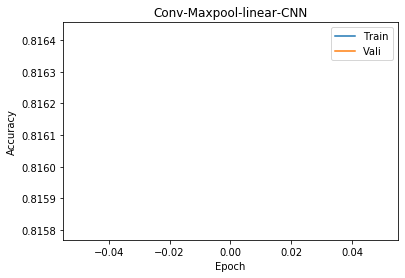

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.562
[1, 40000] loss: 0.573
Training Accu:  0.813275
Validation Accu:  0.8231
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2829 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4252 correct, tested 6000, batch size 1000
Test 6 th batch, 4945 correct, tested 7000, batch size 1000
Test 7 th batch, 5665 correct, tested 8000, batch size 1000
Test 8 th batch, 6360 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


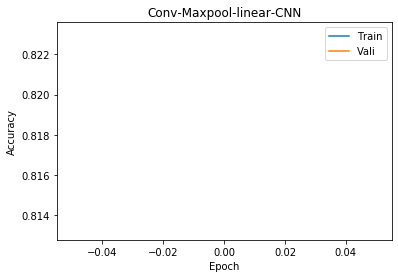

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.554
[1, 40000] loss: 0.571
Training Accu:  0.817675
Validation Accu:  0.8182
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3566 correct, tested 5000, batch size 1000
Test 5 th batch, 4263 correct, tested 6000, batch size 1000
Test 6 th batch, 4946 correct, tested 7000, batch size 1000
Test 7 th batch, 5658 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7037 correct, tested 10000, batch size 1000


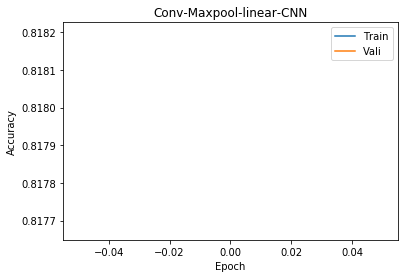

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.556
[1, 40000] loss: 0.564
Training Accu:  0.8201
Validation Accu:  0.815
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2111 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3536 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4913 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6308 correct, tested 9000, batch size 1000
Test 9 th batch, 6991 correct, tested 10000, batch size 1000


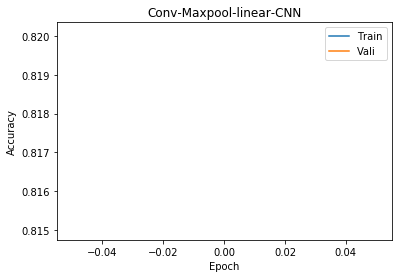

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.575
[1, 40000] loss: 0.558
Training Accu:  0.8166
Validation Accu:  0.8152
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3557 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4940 correct, tested 7000, batch size 1000
Test 7 th batch, 5650 correct, tested 8000, batch size 1000
Test 8 th batch, 6330 correct, tested 9000, batch size 1000
Test 9 th batch, 7016 correct, tested 10000, batch size 1000


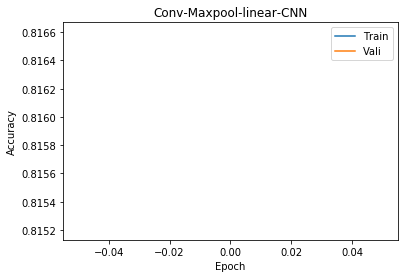

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.564
[1, 40000] loss: 0.565
Training Accu:  0.8149
Validation Accu:  0.8141
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2119 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4220 correct, tested 6000, batch size 1000
Test 6 th batch, 4905 correct, tested 7000, batch size 1000
Test 7 th batch, 5609 correct, tested 8000, batch size 1000
Test 8 th batch, 6300 correct, tested 9000, batch size 1000
Test 9 th batch, 6970 correct, tested 10000, batch size 1000


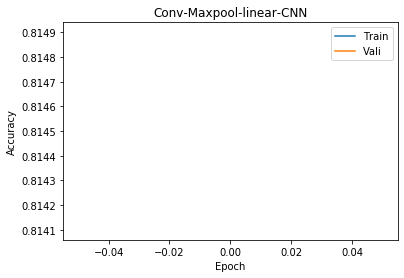

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.556
[1, 40000] loss: 0.555
Training Accu:  0.818675
Validation Accu:  0.8184
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5651 correct, tested 8000, batch size 1000
Test 8 th batch, 6338 correct, tested 9000, batch size 1000
Test 9 th batch, 7022 correct, tested 10000, batch size 1000


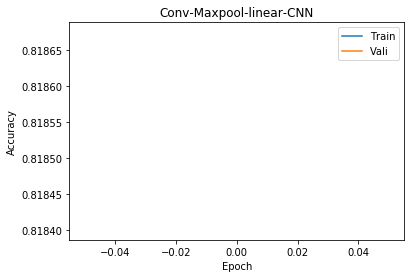

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.554
[1, 40000] loss: 0.557
Training Accu:  0.8205
Validation Accu:  0.8233
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2841 correct, tested 4000, batch size 1000
Test 4 th batch, 3570 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4953 correct, tested 7000, batch size 1000
Test 7 th batch, 5661 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7034 correct, tested 10000, batch size 1000


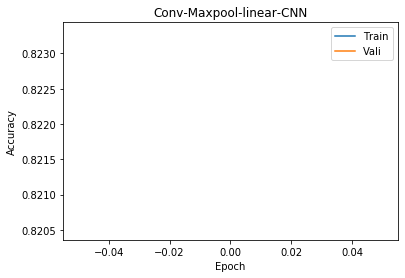

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.542
[1, 40000] loss: 0.558
Training Accu:  0.82125
Validation Accu:  0.8137
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4238 correct, tested 6000, batch size 1000
Test 6 th batch, 4936 correct, tested 7000, batch size 1000
Test 7 th batch, 5652 correct, tested 8000, batch size 1000
Test 8 th batch, 6340 correct, tested 9000, batch size 1000
Test 9 th batch, 7034 correct, tested 10000, batch size 1000


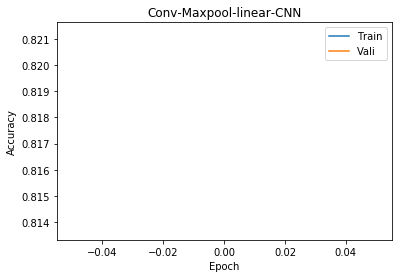

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.553
[1, 40000] loss: 0.548
Training Accu:  0.821
Validation Accu:  0.8167
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4942 correct, tested 7000, batch size 1000
Test 7 th batch, 5661 correct, tested 8000, batch size 1000
Test 8 th batch, 6355 correct, tested 9000, batch size 1000
Test 9 th batch, 7033 correct, tested 10000, batch size 1000


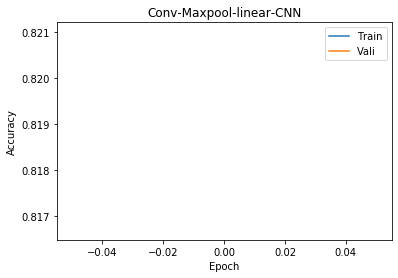

Test Accu: 0.7051
Epoch:  1
[1, 20000] loss: 0.552
[1, 40000] loss: 0.547
Training Accu:  0.822125
Validation Accu:  0.8234
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2144 correct, tested 3000, batch size 1000
Test 3 th batch, 2840 correct, tested 4000, batch size 1000
Test 4 th batch, 3568 correct, tested 5000, batch size 1000
Test 5 th batch, 4263 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5661 correct, tested 8000, batch size 1000
Test 8 th batch, 6357 correct, tested 9000, batch size 1000
Test 9 th batch, 7054 correct, tested 10000, batch size 1000


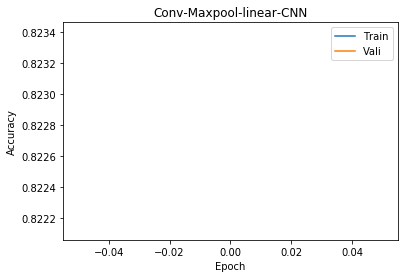

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.541
[1, 40000] loss: 0.557
Training Accu:  0.82235
Validation Accu:  0.8161
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4934 correct, tested 7000, batch size 1000
Test 7 th batch, 5638 correct, tested 8000, batch size 1000
Test 8 th batch, 6339 correct, tested 9000, batch size 1000
Test 9 th batch, 7038 correct, tested 10000, batch size 1000


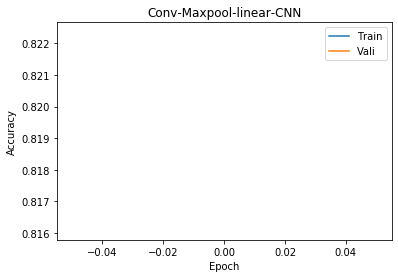

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.548
[1, 40000] loss: 0.549
Training Accu:  0.821925
Validation Accu:  0.8303
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4957 correct, tested 7000, batch size 1000
Test 7 th batch, 5675 correct, tested 8000, batch size 1000
Test 8 th batch, 6361 correct, tested 9000, batch size 1000
Test 9 th batch, 7046 correct, tested 10000, batch size 1000


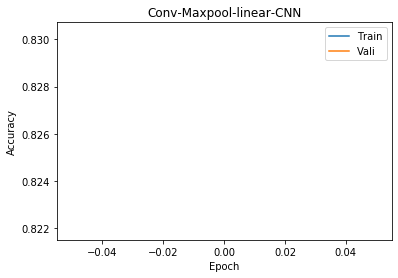

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.543
[1, 40000] loss: 0.549
Training Accu:  0.825575
Validation Accu:  0.8218
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4924 correct, tested 7000, batch size 1000
Test 7 th batch, 5633 correct, tested 8000, batch size 1000
Test 8 th batch, 6323 correct, tested 9000, batch size 1000
Test 9 th batch, 7003 correct, tested 10000, batch size 1000


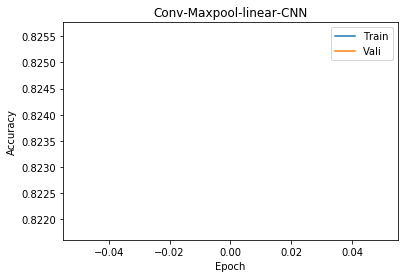

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.545
[1, 40000] loss: 0.549
Training Accu:  0.821975
Validation Accu:  0.8245
Finish Traning
Test 0 th batch, 731 correct, tested 1000, batch size 1000
Test 1 th batch, 1433 correct, tested 2000, batch size 1000
Test 2 th batch, 2143 correct, tested 3000, batch size 1000
Test 3 th batch, 2845 correct, tested 4000, batch size 1000
Test 4 th batch, 3575 correct, tested 5000, batch size 1000
Test 5 th batch, 4271 correct, tested 6000, batch size 1000
Test 6 th batch, 4961 correct, tested 7000, batch size 1000
Test 7 th batch, 5669 correct, tested 8000, batch size 1000
Test 8 th batch, 6360 correct, tested 9000, batch size 1000
Test 9 th batch, 7046 correct, tested 10000, batch size 1000


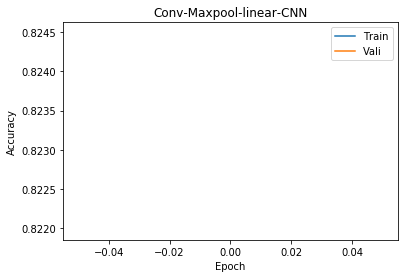

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.533
[1, 40000] loss: 0.545
Training Accu:  0.826675
Validation Accu:  0.8157
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4232 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5637 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7003 correct, tested 10000, batch size 1000


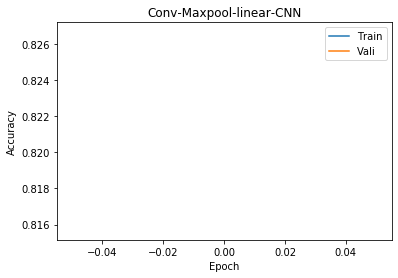

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.535
[1, 40000] loss: 0.552
Training Accu:  0.823375
Validation Accu:  0.8186
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2112 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3538 correct, tested 5000, batch size 1000
Test 5 th batch, 4237 correct, tested 6000, batch size 1000
Test 6 th batch, 4915 correct, tested 7000, batch size 1000
Test 7 th batch, 5622 correct, tested 8000, batch size 1000
Test 8 th batch, 6301 correct, tested 9000, batch size 1000
Test 9 th batch, 6994 correct, tested 10000, batch size 1000


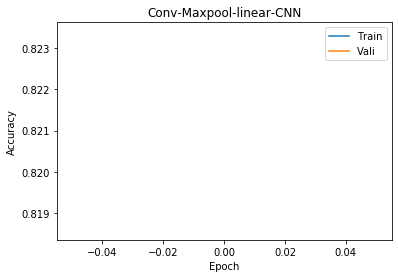

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.537
[1, 40000] loss: 0.560
Training Accu:  0.820125
Validation Accu:  0.8188
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2114 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3538 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5657 correct, tested 8000, batch size 1000
Test 8 th batch, 6345 correct, tested 9000, batch size 1000
Test 9 th batch, 7028 correct, tested 10000, batch size 1000


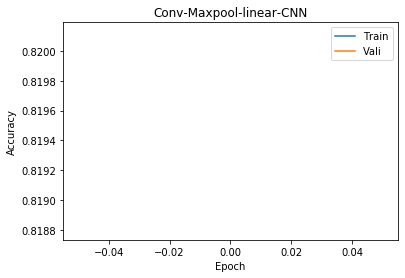

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.536
[1, 40000] loss: 0.540
Training Accu:  0.824475
Validation Accu:  0.8261
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


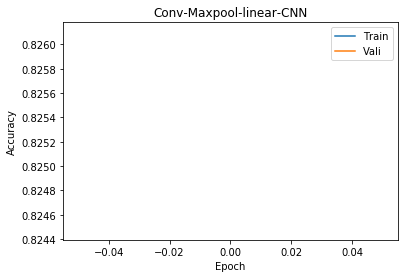

Test Accu: 0.7054
Epoch:  1
[1, 20000] loss: 0.534
[1, 40000] loss: 0.544
Training Accu:  0.82445
Validation Accu:  0.8231
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2142 correct, tested 3000, batch size 1000
Test 3 th batch, 2847 correct, tested 4000, batch size 1000
Test 4 th batch, 3577 correct, tested 5000, batch size 1000
Test 5 th batch, 4274 correct, tested 6000, batch size 1000
Test 6 th batch, 4961 correct, tested 7000, batch size 1000
Test 7 th batch, 5673 correct, tested 8000, batch size 1000
Test 8 th batch, 6368 correct, tested 9000, batch size 1000
Test 9 th batch, 7058 correct, tested 10000, batch size 1000


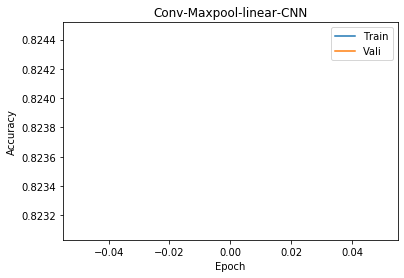

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.537
[1, 40000] loss: 0.539
Training Accu:  0.82595
Validation Accu:  0.8297
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3554 correct, tested 5000, batch size 1000
Test 5 th batch, 4238 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5631 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7010 correct, tested 10000, batch size 1000


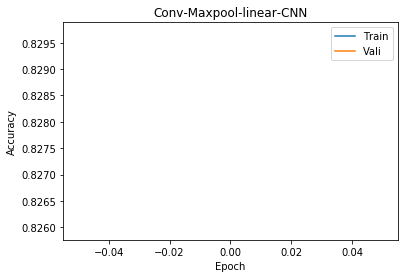

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.531
[1, 40000] loss: 0.540
Training Accu:  0.825575
Validation Accu:  0.8294
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2843 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5655 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7028 correct, tested 10000, batch size 1000


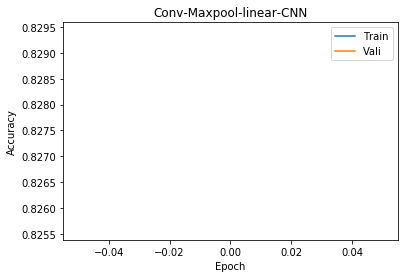

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.525
[1, 40000] loss: 0.543
Training Accu:  0.8265
Validation Accu:  0.8252
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2837 correct, tested 4000, batch size 1000
Test 4 th batch, 3557 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4942 correct, tested 7000, batch size 1000
Test 7 th batch, 5652 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7021 correct, tested 10000, batch size 1000


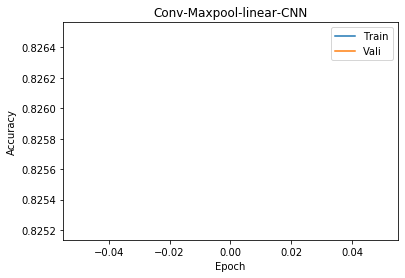

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.534
[1, 40000] loss: 0.537
Training Accu:  0.828675
Validation Accu:  0.8258
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3546 correct, tested 5000, batch size 1000
Test 5 th batch, 4237 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5646 correct, tested 8000, batch size 1000
Test 8 th batch, 6337 correct, tested 9000, batch size 1000
Test 9 th batch, 7022 correct, tested 10000, batch size 1000


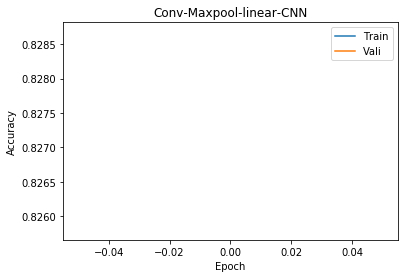

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.524
[1, 40000] loss: 0.544
Training Accu:  0.82715
Validation Accu:  0.832
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1432 correct, tested 2000, batch size 1000
Test 2 th batch, 2141 correct, tested 3000, batch size 1000
Test 3 th batch, 2839 correct, tested 4000, batch size 1000
Test 4 th batch, 3561 correct, tested 5000, batch size 1000
Test 5 th batch, 4258 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5658 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7026 correct, tested 10000, batch size 1000


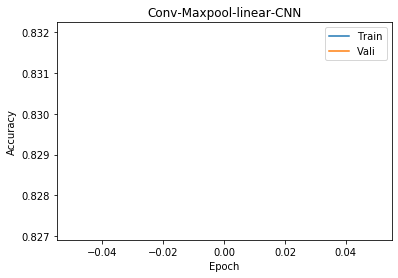

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.526
[1, 40000] loss: 0.527
Training Accu:  0.82945
Validation Accu:  0.8256
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2843 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4255 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5656 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


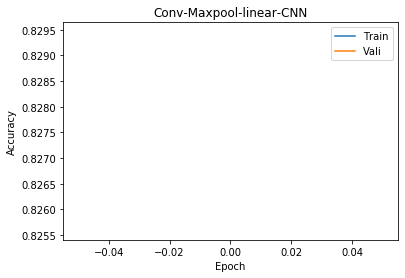

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.520
[1, 40000] loss: 0.537
Training Accu:  0.8292
Validation Accu:  0.8265
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2818 correct, tested 4000, batch size 1000
Test 4 th batch, 3542 correct, tested 5000, batch size 1000
Test 5 th batch, 4238 correct, tested 6000, batch size 1000
Test 6 th batch, 4926 correct, tested 7000, batch size 1000
Test 7 th batch, 5635 correct, tested 8000, batch size 1000
Test 8 th batch, 6332 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


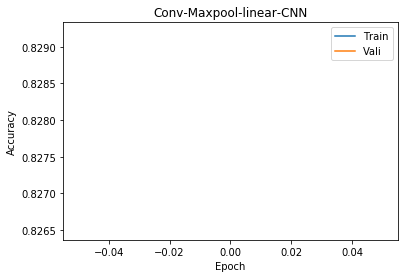

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.517
[1, 40000] loss: 0.526
Training Accu:  0.8351
Validation Accu:  0.8271
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2816 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4232 correct, tested 6000, batch size 1000
Test 6 th batch, 4921 correct, tested 7000, batch size 1000
Test 7 th batch, 5630 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7018 correct, tested 10000, batch size 1000


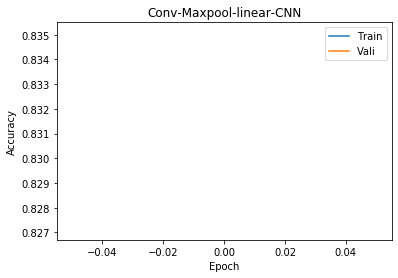

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.520
[1, 40000] loss: 0.531
Training Accu:  0.830775
Validation Accu:  0.8298
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4950 correct, tested 7000, batch size 1000
Test 7 th batch, 5659 correct, tested 8000, batch size 1000
Test 8 th batch, 6358 correct, tested 9000, batch size 1000
Test 9 th batch, 7056 correct, tested 10000, batch size 1000


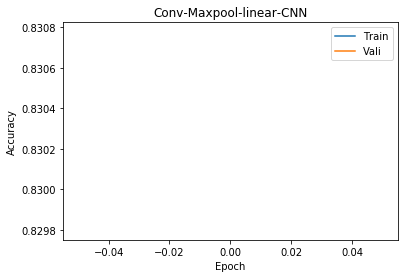

Test Accu: 0.7058
Epoch:  1
[1, 20000] loss: 0.524
[1, 40000] loss: 0.526
Training Accu:  0.8299
Validation Accu:  0.8312
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4959 correct, tested 7000, batch size 1000
Test 7 th batch, 5676 correct, tested 8000, batch size 1000
Test 8 th batch, 6367 correct, tested 9000, batch size 1000
Test 9 th batch, 7060 correct, tested 10000, batch size 1000


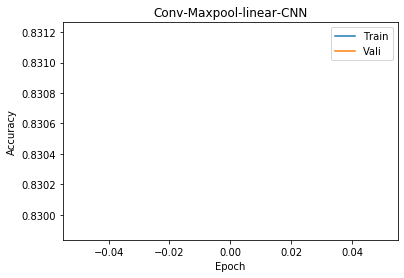

Test Accu: 0.706
Epoch:  1
[1, 20000] loss: 0.512
[1, 40000] loss: 0.523
Training Accu:  0.834675
Validation Accu:  0.8291
Finish Traning
Test 0 th batch, 735 correct, tested 1000, batch size 1000
Test 1 th batch, 1446 correct, tested 2000, batch size 1000
Test 2 th batch, 2158 correct, tested 3000, batch size 1000
Test 3 th batch, 2858 correct, tested 4000, batch size 1000
Test 4 th batch, 3593 correct, tested 5000, batch size 1000
Test 5 th batch, 4300 correct, tested 6000, batch size 1000
Test 6 th batch, 4992 correct, tested 7000, batch size 1000
Test 7 th batch, 5707 correct, tested 8000, batch size 1000
Test 8 th batch, 6403 correct, tested 9000, batch size 1000
Test 9 th batch, 7094 correct, tested 10000, batch size 1000


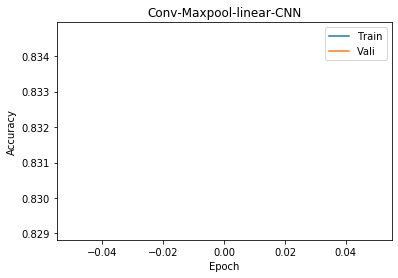

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.516
[1, 40000] loss: 0.519
Training Accu:  0.8336
Validation Accu:  0.8338
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3551 correct, tested 5000, batch size 1000
Test 5 th batch, 4253 correct, tested 6000, batch size 1000
Test 6 th batch, 4940 correct, tested 7000, batch size 1000
Test 7 th batch, 5648 correct, tested 8000, batch size 1000
Test 8 th batch, 6344 correct, tested 9000, batch size 1000
Test 9 th batch, 7033 correct, tested 10000, batch size 1000


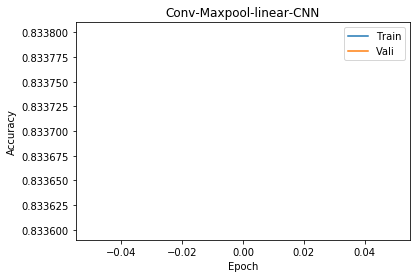

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.514
[1, 40000] loss: 0.523
Training Accu:  0.833275
Validation Accu:  0.8331
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4269 correct, tested 6000, batch size 1000
Test 6 th batch, 4959 correct, tested 7000, batch size 1000
Test 7 th batch, 5671 correct, tested 8000, batch size 1000
Test 8 th batch, 6362 correct, tested 9000, batch size 1000
Test 9 th batch, 7057 correct, tested 10000, batch size 1000


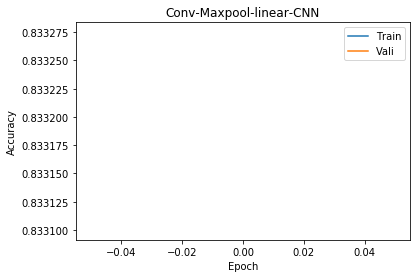

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.514
[1, 40000] loss: 0.528
Training Accu:  0.833025
Validation Accu:  0.829
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3546 correct, tested 5000, batch size 1000
Test 5 th batch, 4234 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6321 correct, tested 9000, batch size 1000
Test 9 th batch, 7000 correct, tested 10000, batch size 1000


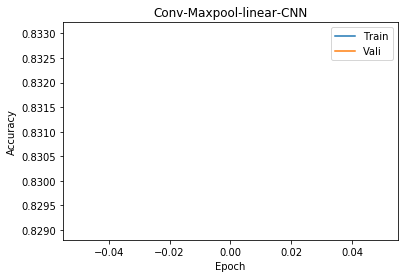

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.517
[1, 40000] loss: 0.521
Training Accu:  0.832075
Validation Accu:  0.8323
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2836 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4275 correct, tested 6000, batch size 1000
Test 6 th batch, 4969 correct, tested 7000, batch size 1000
Test 7 th batch, 5680 correct, tested 8000, batch size 1000
Test 8 th batch, 6371 correct, tested 9000, batch size 1000
Test 9 th batch, 7052 correct, tested 10000, batch size 1000


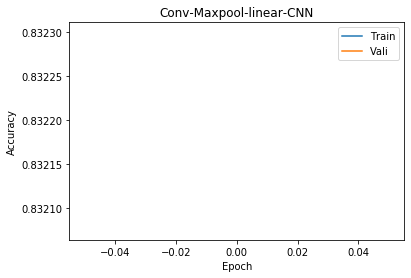

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.517
[1, 40000] loss: 0.511
Training Accu:  0.83675
Validation Accu:  0.835
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2136 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5635 correct, tested 8000, batch size 1000
Test 8 th batch, 6329 correct, tested 9000, batch size 1000
Test 9 th batch, 7015 correct, tested 10000, batch size 1000


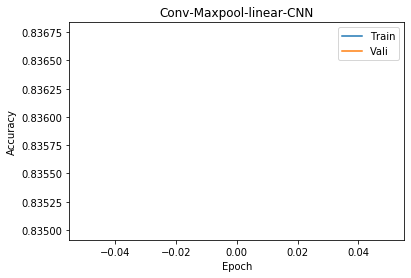

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.514
[1, 40000] loss: 0.517
Training Accu:  0.834675
Validation Accu:  0.8394
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2148 correct, tested 3000, batch size 1000
Test 3 th batch, 2848 correct, tested 4000, batch size 1000
Test 4 th batch, 3571 correct, tested 5000, batch size 1000
Test 5 th batch, 4270 correct, tested 6000, batch size 1000
Test 6 th batch, 4959 correct, tested 7000, batch size 1000
Test 7 th batch, 5671 correct, tested 8000, batch size 1000
Test 8 th batch, 6361 correct, tested 9000, batch size 1000
Test 9 th batch, 7050 correct, tested 10000, batch size 1000


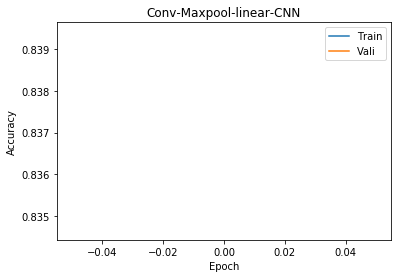

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.512
[1, 40000] loss: 0.520
Training Accu:  0.8341
Validation Accu:  0.8311
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2831 correct, tested 4000, batch size 1000
Test 4 th batch, 3564 correct, tested 5000, batch size 1000
Test 5 th batch, 4263 correct, tested 6000, batch size 1000
Test 6 th batch, 4961 correct, tested 7000, batch size 1000
Test 7 th batch, 5664 correct, tested 8000, batch size 1000
Test 8 th batch, 6364 correct, tested 9000, batch size 1000
Test 9 th batch, 7055 correct, tested 10000, batch size 1000


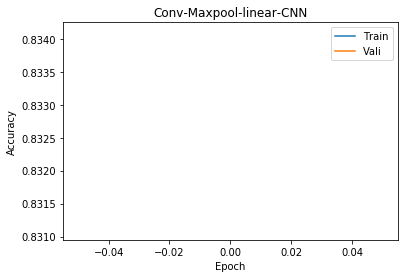

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.514
[1, 40000] loss: 0.506
Training Accu:  0.83725
Validation Accu:  0.8405
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2136 correct, tested 3000, batch size 1000
Test 3 th batch, 2837 correct, tested 4000, batch size 1000
Test 4 th batch, 3569 correct, tested 5000, batch size 1000
Test 5 th batch, 4270 correct, tested 6000, batch size 1000
Test 6 th batch, 4963 correct, tested 7000, batch size 1000
Test 7 th batch, 5677 correct, tested 8000, batch size 1000
Test 8 th batch, 6374 correct, tested 9000, batch size 1000
Test 9 th batch, 7064 correct, tested 10000, batch size 1000


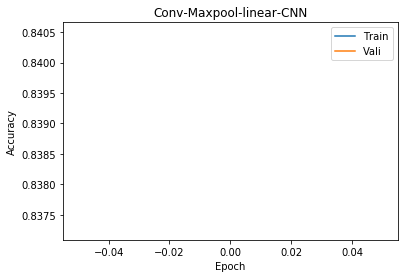

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.506
[1, 40000] loss: 0.511
Training Accu:  0.83765
Validation Accu:  0.8365
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1432 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4259 correct, tested 6000, batch size 1000
Test 6 th batch, 4948 correct, tested 7000, batch size 1000
Test 7 th batch, 5658 correct, tested 8000, batch size 1000
Test 8 th batch, 6353 correct, tested 9000, batch size 1000
Test 9 th batch, 7050 correct, tested 10000, batch size 1000


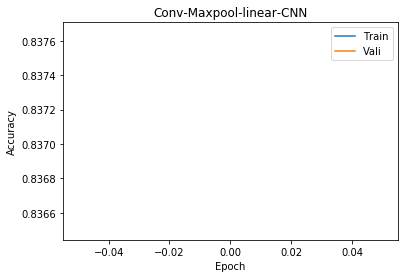

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.510
[1, 40000] loss: 0.507
Training Accu:  0.83765
Validation Accu:  0.8359
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4269 correct, tested 6000, batch size 1000
Test 6 th batch, 4974 correct, tested 7000, batch size 1000
Test 7 th batch, 5683 correct, tested 8000, batch size 1000
Test 8 th batch, 6382 correct, tested 9000, batch size 1000
Test 9 th batch, 7068 correct, tested 10000, batch size 1000


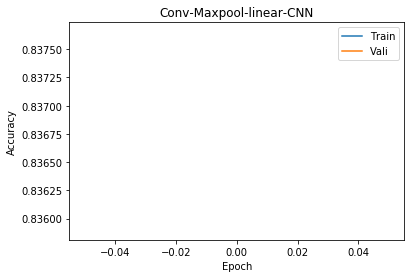

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.510
[1, 40000] loss: 0.506
Training Accu:  0.8355
Validation Accu:  0.8269
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2126 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3557 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7020 correct, tested 10000, batch size 1000


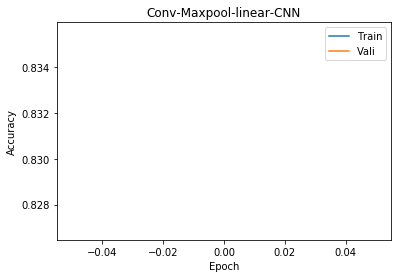

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.507
[1, 40000] loss: 0.508
Training Accu:  0.83725
Validation Accu:  0.8386
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2145 correct, tested 3000, batch size 1000
Test 3 th batch, 2843 correct, tested 4000, batch size 1000
Test 4 th batch, 3574 correct, tested 5000, batch size 1000
Test 5 th batch, 4277 correct, tested 6000, batch size 1000
Test 6 th batch, 4968 correct, tested 7000, batch size 1000
Test 7 th batch, 5674 correct, tested 8000, batch size 1000
Test 8 th batch, 6373 correct, tested 9000, batch size 1000
Test 9 th batch, 7061 correct, tested 10000, batch size 1000


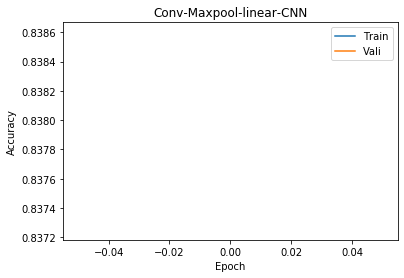

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.502
[1, 40000] loss: 0.511
Training Accu:  0.8376
Validation Accu:  0.8332
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1437 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2829 correct, tested 4000, batch size 1000
Test 4 th batch, 3561 correct, tested 5000, batch size 1000
Test 5 th batch, 4260 correct, tested 6000, batch size 1000
Test 6 th batch, 4963 correct, tested 7000, batch size 1000
Test 7 th batch, 5674 correct, tested 8000, batch size 1000
Test 8 th batch, 6368 correct, tested 9000, batch size 1000
Test 9 th batch, 7058 correct, tested 10000, batch size 1000


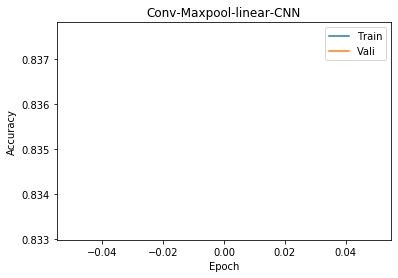

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.504
[1, 40000] loss: 0.509
Training Accu:  0.83625
Validation Accu:  0.8433
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1425 correct, tested 2000, batch size 1000
Test 2 th batch, 2135 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3568 correct, tested 5000, batch size 1000
Test 5 th batch, 4269 correct, tested 6000, batch size 1000
Test 6 th batch, 4961 correct, tested 7000, batch size 1000
Test 7 th batch, 5673 correct, tested 8000, batch size 1000
Test 8 th batch, 6377 correct, tested 9000, batch size 1000
Test 9 th batch, 7065 correct, tested 10000, batch size 1000


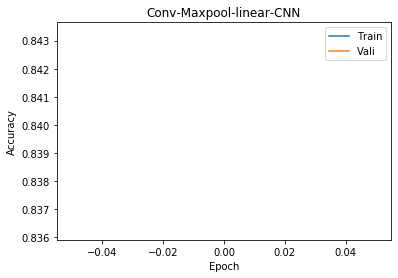

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.495
[1, 40000] loss: 0.508
Training Accu:  0.83915
Validation Accu:  0.8374
Finish Traning
Test 0 th batch, 731 correct, tested 1000, batch size 1000
Test 1 th batch, 1443 correct, tested 2000, batch size 1000
Test 2 th batch, 2152 correct, tested 3000, batch size 1000
Test 3 th batch, 2844 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4265 correct, tested 6000, batch size 1000
Test 6 th batch, 4954 correct, tested 7000, batch size 1000
Test 7 th batch, 5657 correct, tested 8000, batch size 1000
Test 8 th batch, 6349 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


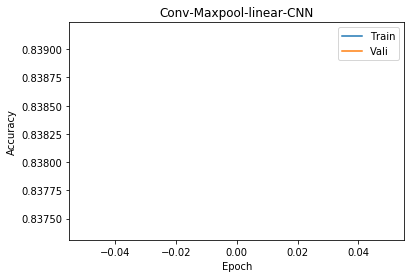

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.490
[1, 40000] loss: 0.507
Training Accu:  0.840525
Validation Accu:  0.8353
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3573 correct, tested 5000, batch size 1000
Test 5 th batch, 4263 correct, tested 6000, batch size 1000
Test 6 th batch, 4955 correct, tested 7000, batch size 1000
Test 7 th batch, 5674 correct, tested 8000, batch size 1000
Test 8 th batch, 6372 correct, tested 9000, batch size 1000
Test 9 th batch, 7054 correct, tested 10000, batch size 1000


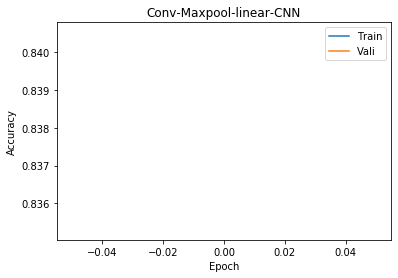

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.495
[1, 40000] loss: 0.499
Training Accu:  0.841625
Validation Accu:  0.8325
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3562 correct, tested 5000, batch size 1000
Test 5 th batch, 4255 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5659 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7038 correct, tested 10000, batch size 1000


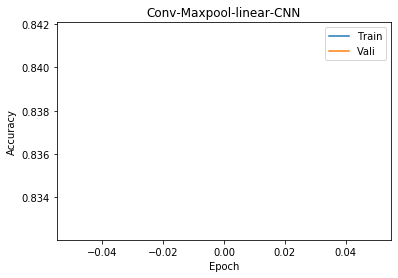

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.497
[1, 40000] loss: 0.508
Training Accu:  0.837475
Validation Accu:  0.8364
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1411 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3545 correct, tested 5000, batch size 1000
Test 5 th batch, 4241 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5634 correct, tested 8000, batch size 1000
Test 8 th batch, 6331 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


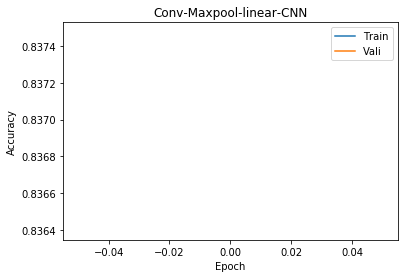

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.494
[1, 40000] loss: 0.495
Training Accu:  0.842025
Validation Accu:  0.8355
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2810 correct, tested 4000, batch size 1000
Test 4 th batch, 3540 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5648 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7027 correct, tested 10000, batch size 1000


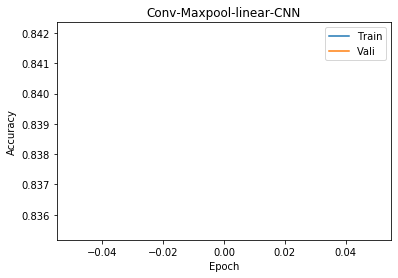

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.486
[1, 40000] loss: 0.497
Training Accu:  0.841475
Validation Accu:  0.8415
Finish Traning
Test 0 th batch, 728 correct, tested 1000, batch size 1000
Test 1 th batch, 1436 correct, tested 2000, batch size 1000
Test 2 th batch, 2143 correct, tested 3000, batch size 1000
Test 3 th batch, 2843 correct, tested 4000, batch size 1000
Test 4 th batch, 3571 correct, tested 5000, batch size 1000
Test 5 th batch, 4270 correct, tested 6000, batch size 1000
Test 6 th batch, 4963 correct, tested 7000, batch size 1000
Test 7 th batch, 5685 correct, tested 8000, batch size 1000
Test 8 th batch, 6381 correct, tested 9000, batch size 1000
Test 9 th batch, 7072 correct, tested 10000, batch size 1000


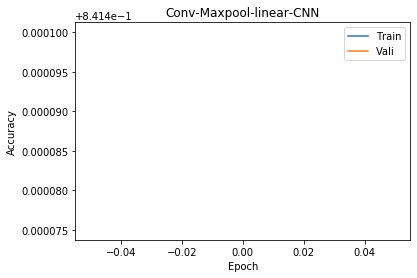

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.493
[1, 40000] loss: 0.503
Training Accu:  0.839125
Validation Accu:  0.8262
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2135 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4241 correct, tested 6000, batch size 1000
Test 6 th batch, 4924 correct, tested 7000, batch size 1000
Test 7 th batch, 5622 correct, tested 8000, batch size 1000
Test 8 th batch, 6302 correct, tested 9000, batch size 1000
Test 9 th batch, 6992 correct, tested 10000, batch size 1000


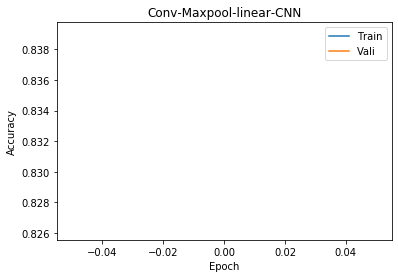

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.501
[1, 40000] loss: 0.498
Training Accu:  0.839975
Validation Accu:  0.8432
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4946 correct, tested 7000, batch size 1000
Test 7 th batch, 5650 correct, tested 8000, batch size 1000
Test 8 th batch, 6341 correct, tested 9000, batch size 1000
Test 9 th batch, 7038 correct, tested 10000, batch size 1000


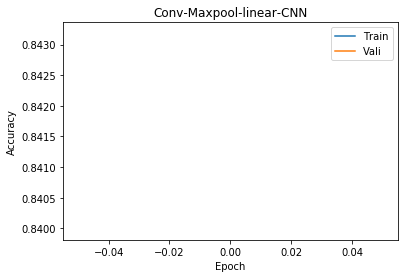

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.489
[1, 40000] loss: 0.501
Training Accu:  0.839625
Validation Accu:  0.8367
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1440 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3550 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4930 correct, tested 7000, batch size 1000
Test 7 th batch, 5641 correct, tested 8000, batch size 1000
Test 8 th batch, 6335 correct, tested 9000, batch size 1000
Test 9 th batch, 7030 correct, tested 10000, batch size 1000


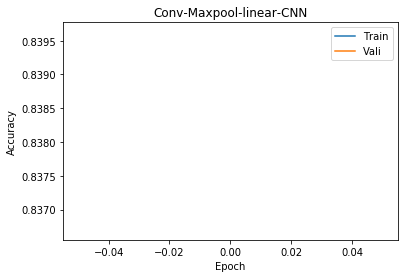

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.489
[1, 40000] loss: 0.495
Training Accu:  0.8432
Validation Accu:  0.8473
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4276 correct, tested 6000, batch size 1000
Test 6 th batch, 4970 correct, tested 7000, batch size 1000
Test 7 th batch, 5668 correct, tested 8000, batch size 1000
Test 8 th batch, 6366 correct, tested 9000, batch size 1000
Test 9 th batch, 7060 correct, tested 10000, batch size 1000


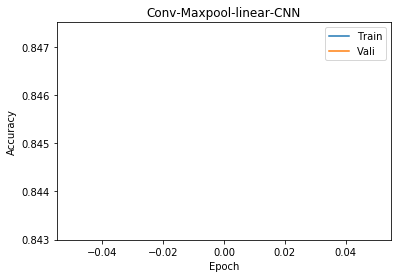

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.489
[1, 40000] loss: 0.501
Training Accu:  0.840925
Validation Accu:  0.8404
Finish Traning
Test 0 th batch, 732 correct, tested 1000, batch size 1000
Test 1 th batch, 1442 correct, tested 2000, batch size 1000
Test 2 th batch, 2151 correct, tested 3000, batch size 1000
Test 3 th batch, 2848 correct, tested 4000, batch size 1000
Test 4 th batch, 3571 correct, tested 5000, batch size 1000
Test 5 th batch, 4269 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5656 correct, tested 8000, batch size 1000
Test 8 th batch, 6359 correct, tested 9000, batch size 1000
Test 9 th batch, 7043 correct, tested 10000, batch size 1000


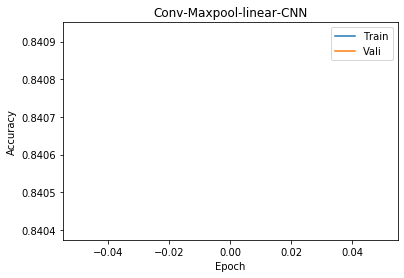

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.489
[1, 40000] loss: 0.495
Training Accu:  0.84075
Validation Accu:  0.8338
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5624 correct, tested 8000, batch size 1000
Test 8 th batch, 6314 correct, tested 9000, batch size 1000
Test 9 th batch, 6990 correct, tested 10000, batch size 1000


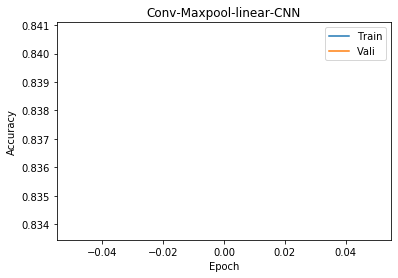

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.494
[1, 40000] loss: 0.482
Training Accu:  0.8449
Validation Accu:  0.8453
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1446 correct, tested 2000, batch size 1000
Test 2 th batch, 2153 correct, tested 3000, batch size 1000
Test 3 th batch, 2847 correct, tested 4000, batch size 1000
Test 4 th batch, 3574 correct, tested 5000, batch size 1000
Test 5 th batch, 4276 correct, tested 6000, batch size 1000
Test 6 th batch, 4966 correct, tested 7000, batch size 1000
Test 7 th batch, 5680 correct, tested 8000, batch size 1000
Test 8 th batch, 6367 correct, tested 9000, batch size 1000
Test 9 th batch, 7057 correct, tested 10000, batch size 1000


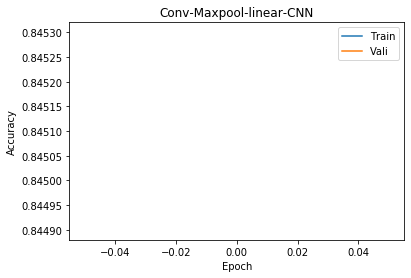

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.482
[1, 40000] loss: 0.486
Training Accu:  0.845075
Validation Accu:  0.8378
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1442 correct, tested 2000, batch size 1000
Test 2 th batch, 2146 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4264 correct, tested 6000, batch size 1000
Test 6 th batch, 4954 correct, tested 7000, batch size 1000
Test 7 th batch, 5668 correct, tested 8000, batch size 1000
Test 8 th batch, 6362 correct, tested 9000, batch size 1000
Test 9 th batch, 7050 correct, tested 10000, batch size 1000


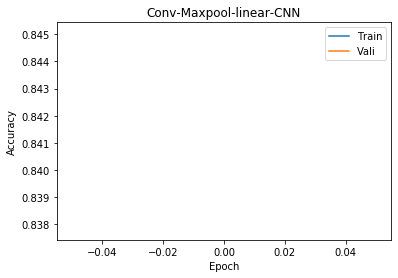

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.487
[1, 40000] loss: 0.488
Training Accu:  0.845525
Validation Accu:  0.8401
Finish Traning
Test 0 th batch, 728 correct, tested 1000, batch size 1000
Test 1 th batch, 1437 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3570 correct, tested 5000, batch size 1000
Test 5 th batch, 4277 correct, tested 6000, batch size 1000
Test 6 th batch, 4971 correct, tested 7000, batch size 1000
Test 7 th batch, 5686 correct, tested 8000, batch size 1000
Test 8 th batch, 6377 correct, tested 9000, batch size 1000
Test 9 th batch, 7076 correct, tested 10000, batch size 1000


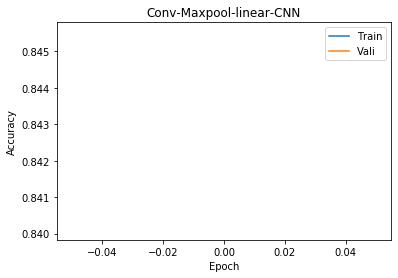

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.483
[1, 40000] loss: 0.490
Training Accu:  0.8451
Validation Accu:  0.8454
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3549 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4932 correct, tested 7000, batch size 1000
Test 7 th batch, 5633 correct, tested 8000, batch size 1000
Test 8 th batch, 6331 correct, tested 9000, batch size 1000
Test 9 th batch, 7020 correct, tested 10000, batch size 1000


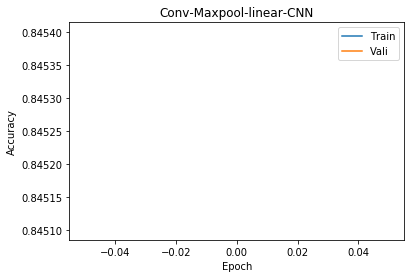

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.485
[1, 40000] loss: 0.483
Training Accu:  0.845525
Validation Accu:  0.8457
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1433 correct, tested 2000, batch size 1000
Test 2 th batch, 2141 correct, tested 3000, batch size 1000
Test 3 th batch, 2839 correct, tested 4000, batch size 1000
Test 4 th batch, 3564 correct, tested 5000, batch size 1000
Test 5 th batch, 4261 correct, tested 6000, batch size 1000
Test 6 th batch, 4957 correct, tested 7000, batch size 1000
Test 7 th batch, 5665 correct, tested 8000, batch size 1000
Test 8 th batch, 6360 correct, tested 9000, batch size 1000
Test 9 th batch, 7057 correct, tested 10000, batch size 1000


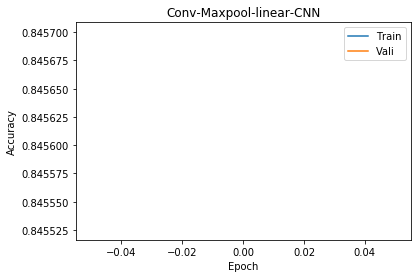

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.469
[1, 40000] loss: 0.492
Training Accu:  0.8469
Validation Accu:  0.8391
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3533 correct, tested 5000, batch size 1000
Test 5 th batch, 4229 correct, tested 6000, batch size 1000
Test 6 th batch, 4911 correct, tested 7000, batch size 1000
Test 7 th batch, 5612 correct, tested 8000, batch size 1000
Test 8 th batch, 6304 correct, tested 9000, batch size 1000
Test 9 th batch, 6992 correct, tested 10000, batch size 1000


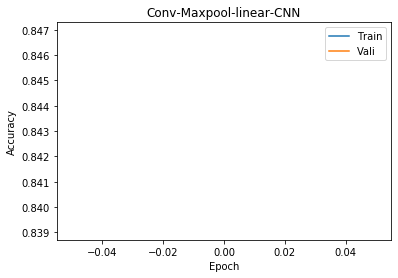

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.479
[1, 40000] loss: 0.492
Training Accu:  0.845075
Validation Accu:  0.8498
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3561 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4955 correct, tested 7000, batch size 1000
Test 7 th batch, 5668 correct, tested 8000, batch size 1000
Test 8 th batch, 6360 correct, tested 9000, batch size 1000
Test 9 th batch, 7052 correct, tested 10000, batch size 1000


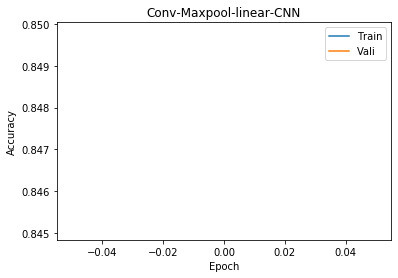

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.482
[1, 40000] loss: 0.486
Training Accu:  0.84345
Validation Accu:  0.8487
Finish Traning
Test 0 th batch, 731 correct, tested 1000, batch size 1000
Test 1 th batch, 1443 correct, tested 2000, batch size 1000
Test 2 th batch, 2155 correct, tested 3000, batch size 1000
Test 3 th batch, 2859 correct, tested 4000, batch size 1000
Test 4 th batch, 3592 correct, tested 5000, batch size 1000
Test 5 th batch, 4291 correct, tested 6000, batch size 1000
Test 6 th batch, 4981 correct, tested 7000, batch size 1000
Test 7 th batch, 5693 correct, tested 8000, batch size 1000
Test 8 th batch, 6389 correct, tested 9000, batch size 1000
Test 9 th batch, 7086 correct, tested 10000, batch size 1000


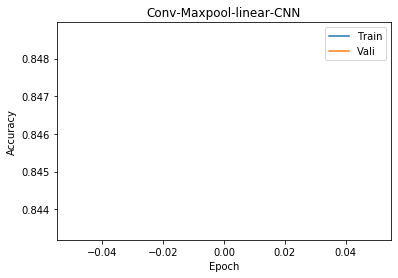

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.477
[1, 40000] loss: 0.477
Training Accu:  0.848475
Validation Accu:  0.8398
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1406 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2815 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4928 correct, tested 7000, batch size 1000
Test 7 th batch, 5626 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7005 correct, tested 10000, batch size 1000


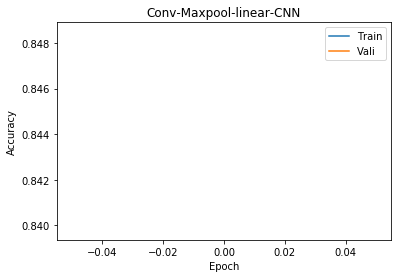

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.481
[1, 40000] loss: 0.480
Training Accu:  0.845275
Validation Accu:  0.8441
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4263 correct, tested 6000, batch size 1000
Test 6 th batch, 4958 correct, tested 7000, batch size 1000
Test 7 th batch, 5662 correct, tested 8000, batch size 1000
Test 8 th batch, 6361 correct, tested 9000, batch size 1000
Test 9 th batch, 7059 correct, tested 10000, batch size 1000


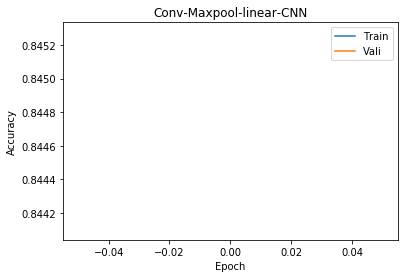

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.476
[1, 40000] loss: 0.479
Training Accu:  0.846325
Validation Accu:  0.8477
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5644 correct, tested 8000, batch size 1000
Test 8 th batch, 6340 correct, tested 9000, batch size 1000
Test 9 th batch, 7020 correct, tested 10000, batch size 1000


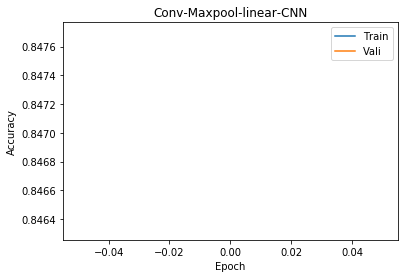

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.480
[1, 40000] loss: 0.494
Training Accu:  0.8422
Validation Accu:  0.8517
Finish Traning
Test 0 th batch, 729 correct, tested 1000, batch size 1000
Test 1 th batch, 1443 correct, tested 2000, batch size 1000
Test 2 th batch, 2151 correct, tested 3000, batch size 1000
Test 3 th batch, 2846 correct, tested 4000, batch size 1000
Test 4 th batch, 3577 correct, tested 5000, batch size 1000
Test 5 th batch, 4278 correct, tested 6000, batch size 1000
Test 6 th batch, 4969 correct, tested 7000, batch size 1000
Test 7 th batch, 5684 correct, tested 8000, batch size 1000
Test 8 th batch, 6389 correct, tested 9000, batch size 1000
Test 9 th batch, 7081 correct, tested 10000, batch size 1000


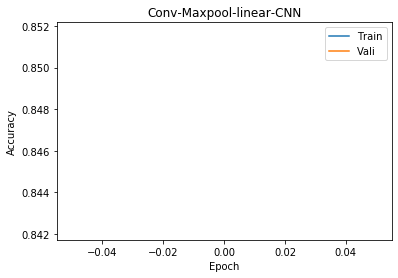

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.471
[1, 40000] loss: 0.481
Training Accu:  0.848275
Validation Accu:  0.8369
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3531 correct, tested 5000, batch size 1000
Test 5 th batch, 4224 correct, tested 6000, batch size 1000
Test 6 th batch, 4901 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6283 correct, tested 9000, batch size 1000
Test 9 th batch, 6965 correct, tested 10000, batch size 1000


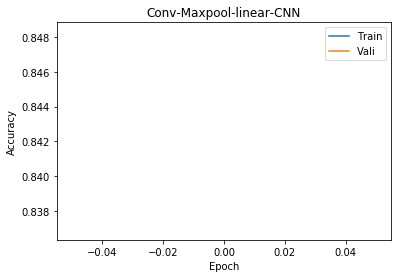

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.465
[1, 40000] loss: 0.477
Training Accu:  0.850975
Validation Accu:  0.8353
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4265 correct, tested 6000, batch size 1000
Test 6 th batch, 4959 correct, tested 7000, batch size 1000
Test 7 th batch, 5652 correct, tested 8000, batch size 1000
Test 8 th batch, 6352 correct, tested 9000, batch size 1000
Test 9 th batch, 7036 correct, tested 10000, batch size 1000


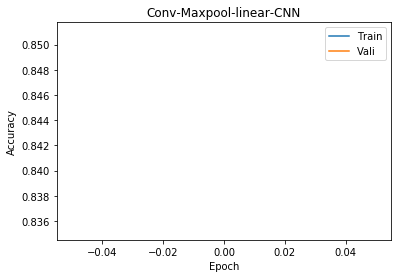

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.475
[1, 40000] loss: 0.483
Training Accu:  0.84695
Validation Accu:  0.8535
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2136 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3565 correct, tested 5000, batch size 1000
Test 5 th batch, 4267 correct, tested 6000, batch size 1000
Test 6 th batch, 4963 correct, tested 7000, batch size 1000
Test 7 th batch, 5667 correct, tested 8000, batch size 1000
Test 8 th batch, 6363 correct, tested 9000, batch size 1000
Test 9 th batch, 7055 correct, tested 10000, batch size 1000


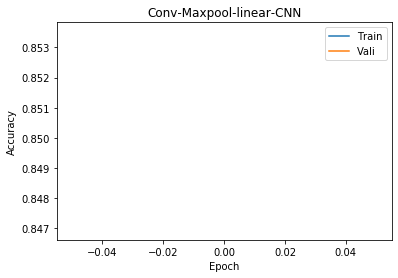

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.464
[1, 40000] loss: 0.474
Training Accu:  0.85105
Validation Accu:  0.8431
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4226 correct, tested 6000, batch size 1000
Test 6 th batch, 4909 correct, tested 7000, batch size 1000
Test 7 th batch, 5610 correct, tested 8000, batch size 1000
Test 8 th batch, 6302 correct, tested 9000, batch size 1000
Test 9 th batch, 6995 correct, tested 10000, batch size 1000


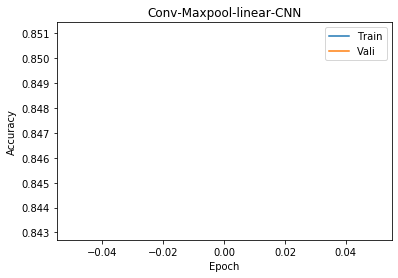

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.469
[1, 40000] loss: 0.470
Training Accu:  0.850725
Validation Accu:  0.8524
Finish Traning
Test 0 th batch, 735 correct, tested 1000, batch size 1000
Test 1 th batch, 1440 correct, tested 2000, batch size 1000
Test 2 th batch, 2147 correct, tested 3000, batch size 1000
Test 3 th batch, 2845 correct, tested 4000, batch size 1000
Test 4 th batch, 3567 correct, tested 5000, batch size 1000
Test 5 th batch, 4267 correct, tested 6000, batch size 1000
Test 6 th batch, 4957 correct, tested 7000, batch size 1000
Test 7 th batch, 5672 correct, tested 8000, batch size 1000
Test 8 th batch, 6359 correct, tested 9000, batch size 1000
Test 9 th batch, 7051 correct, tested 10000, batch size 1000


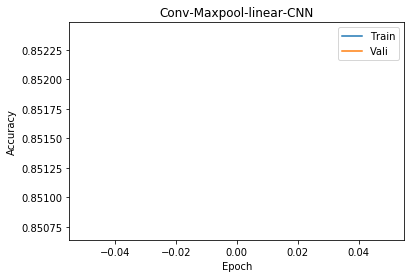

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.456
[1, 40000] loss: 0.479
Training Accu:  0.85165
Validation Accu:  0.851
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4954 correct, tested 7000, batch size 1000
Test 7 th batch, 5660 correct, tested 8000, batch size 1000
Test 8 th batch, 6357 correct, tested 9000, batch size 1000
Test 9 th batch, 7057 correct, tested 10000, batch size 1000


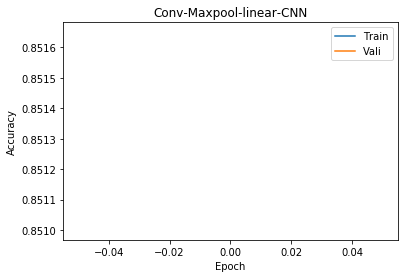

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.461
[1, 40000] loss: 0.473
Training Accu:  0.85115
Validation Accu:  0.8462
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3562 correct, tested 5000, batch size 1000
Test 5 th batch, 4258 correct, tested 6000, batch size 1000
Test 6 th batch, 4945 correct, tested 7000, batch size 1000
Test 7 th batch, 5648 correct, tested 8000, batch size 1000
Test 8 th batch, 6348 correct, tested 9000, batch size 1000
Test 9 th batch, 7031 correct, tested 10000, batch size 1000


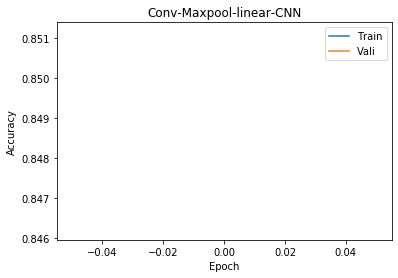

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.458
[1, 40000] loss: 0.463
Training Accu:  0.853775
Validation Accu:  0.856
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1432 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2849 correct, tested 4000, batch size 1000
Test 4 th batch, 3570 correct, tested 5000, batch size 1000
Test 5 th batch, 4265 correct, tested 6000, batch size 1000
Test 6 th batch, 4958 correct, tested 7000, batch size 1000
Test 7 th batch, 5667 correct, tested 8000, batch size 1000
Test 8 th batch, 6363 correct, tested 9000, batch size 1000
Test 9 th batch, 7049 correct, tested 10000, batch size 1000


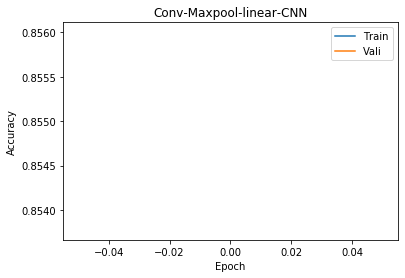

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.461
[1, 40000] loss: 0.466
Training Accu:  0.855075
Validation Accu:  0.8523
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2841 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4261 correct, tested 6000, batch size 1000
Test 6 th batch, 4956 correct, tested 7000, batch size 1000
Test 7 th batch, 5652 correct, tested 8000, batch size 1000
Test 8 th batch, 6345 correct, tested 9000, batch size 1000
Test 9 th batch, 7035 correct, tested 10000, batch size 1000


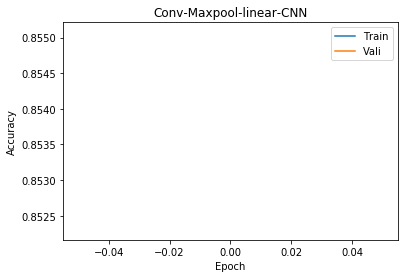

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.454
[1, 40000] loss: 0.471
Training Accu:  0.853425
Validation Accu:  0.8521
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1436 correct, tested 2000, batch size 1000
Test 2 th batch, 2143 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3566 correct, tested 5000, batch size 1000
Test 5 th batch, 4271 correct, tested 6000, batch size 1000
Test 6 th batch, 4964 correct, tested 7000, batch size 1000
Test 7 th batch, 5671 correct, tested 8000, batch size 1000
Test 8 th batch, 6364 correct, tested 9000, batch size 1000
Test 9 th batch, 7059 correct, tested 10000, batch size 1000


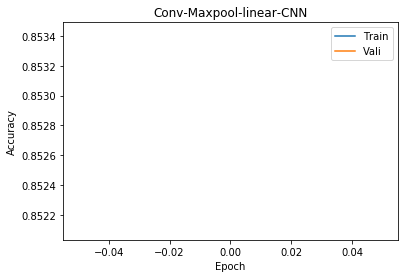

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.462
[1, 40000] loss: 0.463
Training Accu:  0.85115
Validation Accu:  0.8534
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4247 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5633 correct, tested 8000, batch size 1000
Test 8 th batch, 6333 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


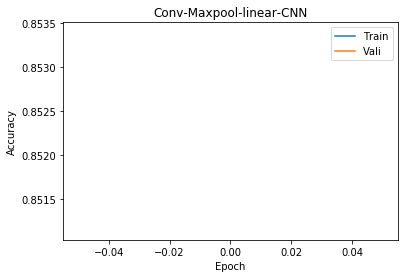

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.460
[1, 40000] loss: 0.457
Training Accu:  0.85585
Validation Accu:  0.8413
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2808 correct, tested 4000, batch size 1000
Test 4 th batch, 3535 correct, tested 5000, batch size 1000
Test 5 th batch, 4223 correct, tested 6000, batch size 1000
Test 6 th batch, 4911 correct, tested 7000, batch size 1000
Test 7 th batch, 5610 correct, tested 8000, batch size 1000
Test 8 th batch, 6300 correct, tested 9000, batch size 1000
Test 9 th batch, 6986 correct, tested 10000, batch size 1000


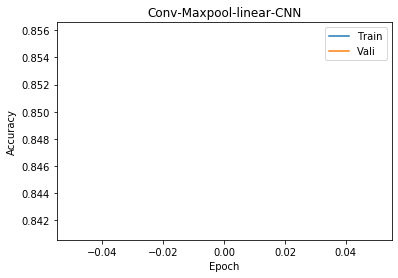

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.464
[1, 40000] loss: 0.466
Training Accu:  0.850875
Validation Accu:  0.8513
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4950 correct, tested 7000, batch size 1000
Test 7 th batch, 5670 correct, tested 8000, batch size 1000
Test 8 th batch, 6364 correct, tested 9000, batch size 1000
Test 9 th batch, 7053 correct, tested 10000, batch size 1000


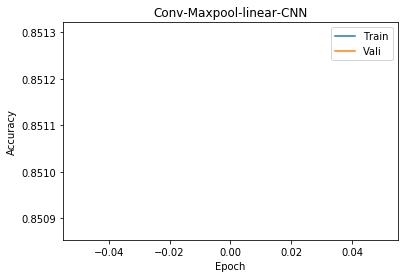

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.453
[1, 40000] loss: 0.458
Training Accu:  0.857225
Validation Accu:  0.8535
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3570 correct, tested 5000, batch size 1000
Test 5 th batch, 4267 correct, tested 6000, batch size 1000
Test 6 th batch, 4955 correct, tested 7000, batch size 1000
Test 7 th batch, 5670 correct, tested 8000, batch size 1000
Test 8 th batch, 6364 correct, tested 9000, batch size 1000
Test 9 th batch, 7051 correct, tested 10000, batch size 1000


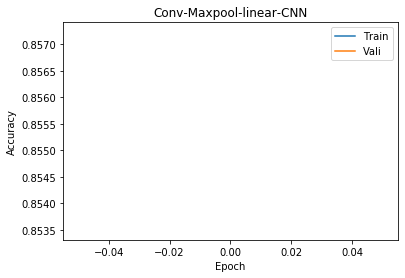

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.458
[1, 40000] loss: 0.457
Training Accu:  0.85495
Validation Accu:  0.8478
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4227 correct, tested 6000, batch size 1000
Test 6 th batch, 4915 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6319 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


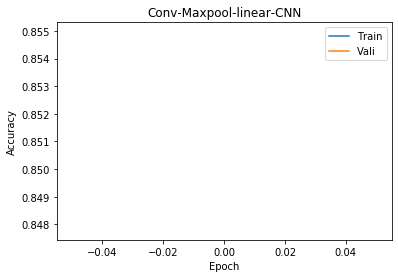

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.467
[1, 40000] loss: 0.464
Training Accu:  0.85005
Validation Accu:  0.86
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3565 correct, tested 5000, batch size 1000
Test 5 th batch, 4271 correct, tested 6000, batch size 1000
Test 6 th batch, 4960 correct, tested 7000, batch size 1000
Test 7 th batch, 5672 correct, tested 8000, batch size 1000
Test 8 th batch, 6366 correct, tested 9000, batch size 1000
Test 9 th batch, 7050 correct, tested 10000, batch size 1000


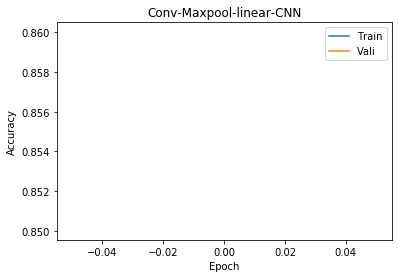

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.457
[1, 40000] loss: 0.453
Training Accu:  0.85595
Validation Accu:  0.8585
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3536 correct, tested 5000, batch size 1000
Test 5 th batch, 4232 correct, tested 6000, batch size 1000
Test 6 th batch, 4921 correct, tested 7000, batch size 1000
Test 7 th batch, 5627 correct, tested 8000, batch size 1000
Test 8 th batch, 6317 correct, tested 9000, batch size 1000
Test 9 th batch, 7003 correct, tested 10000, batch size 1000


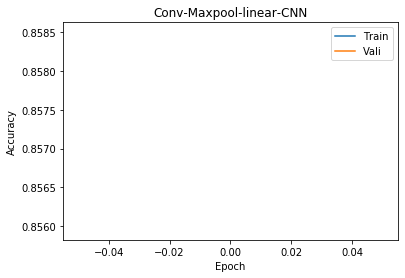

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.449
[1, 40000] loss: 0.457
Training Accu:  0.856675
Validation Accu:  0.8429
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3549 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4934 correct, tested 7000, batch size 1000
Test 7 th batch, 5635 correct, tested 8000, batch size 1000
Test 8 th batch, 6322 correct, tested 9000, batch size 1000
Test 9 th batch, 6995 correct, tested 10000, batch size 1000


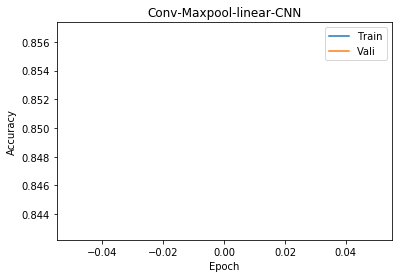

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.453
[1, 40000] loss: 0.453
Training Accu:  0.85695
Validation Accu:  0.8597
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2142 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3564 correct, tested 5000, batch size 1000
Test 5 th batch, 4268 correct, tested 6000, batch size 1000
Test 6 th batch, 4957 correct, tested 7000, batch size 1000
Test 7 th batch, 5660 correct, tested 8000, batch size 1000
Test 8 th batch, 6343 correct, tested 9000, batch size 1000
Test 9 th batch, 7037 correct, tested 10000, batch size 1000


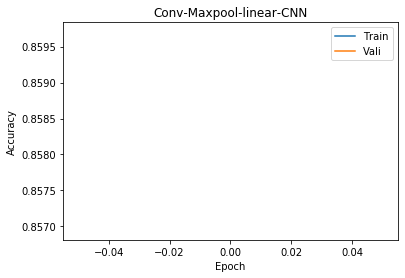

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.447
[1, 40000] loss: 0.458
Training Accu:  0.857825
Validation Accu:  0.8545
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4240 correct, tested 6000, batch size 1000
Test 6 th batch, 4936 correct, tested 7000, batch size 1000
Test 7 th batch, 5640 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


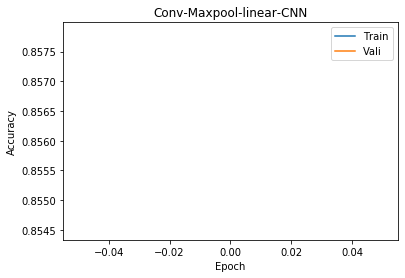

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.449
[1, 40000] loss: 0.456
Training Accu:  0.857975
Validation Accu:  0.8627
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3559 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4960 correct, tested 7000, batch size 1000
Test 7 th batch, 5659 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


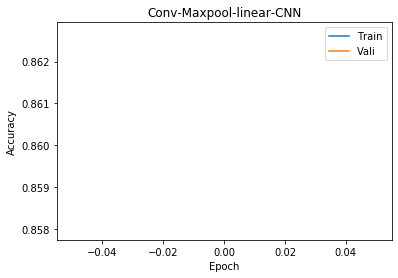

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.448
[1, 40000] loss: 0.447
Training Accu:  0.860925
Validation Accu:  0.8599
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4935 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


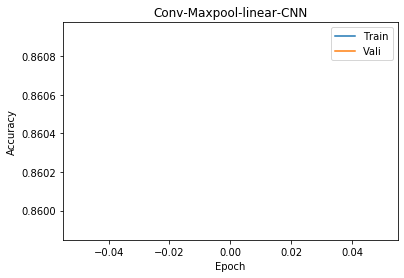

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.443
[1, 40000] loss: 0.450
Training Accu:  0.8592
Validation Accu:  0.8569
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2143 correct, tested 3000, batch size 1000
Test 3 th batch, 2836 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4956 correct, tested 7000, batch size 1000
Test 7 th batch, 5655 correct, tested 8000, batch size 1000
Test 8 th batch, 6349 correct, tested 9000, batch size 1000
Test 9 th batch, 7047 correct, tested 10000, batch size 1000


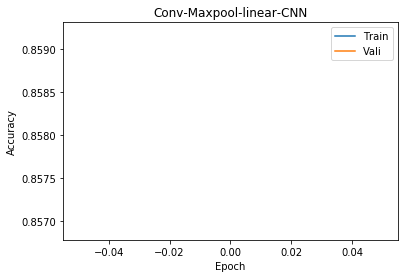

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.451
[1, 40000] loss: 0.450
Training Accu:  0.858725
Validation Accu:  0.8595
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2819 correct, tested 4000, batch size 1000
Test 4 th batch, 3549 correct, tested 5000, batch size 1000
Test 5 th batch, 4255 correct, tested 6000, batch size 1000
Test 6 th batch, 4948 correct, tested 7000, batch size 1000
Test 7 th batch, 5654 correct, tested 8000, batch size 1000
Test 8 th batch, 6341 correct, tested 9000, batch size 1000
Test 9 th batch, 7032 correct, tested 10000, batch size 1000


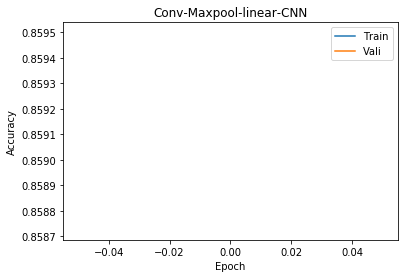

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.447
[1, 40000] loss: 0.445
Training Accu:  0.860625
Validation Accu:  0.8576
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2842 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4940 correct, tested 7000, batch size 1000
Test 7 th batch, 5647 correct, tested 8000, batch size 1000
Test 8 th batch, 6337 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


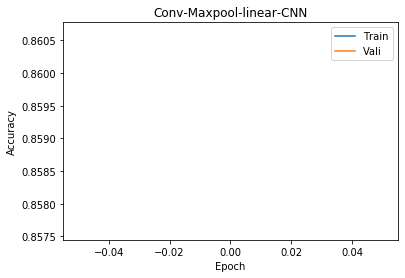

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.438
[1, 40000] loss: 0.458
Training Accu:  0.8583
Validation Accu:  0.8608
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1432 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5647 correct, tested 8000, batch size 1000
Test 8 th batch, 6335 correct, tested 9000, batch size 1000
Test 9 th batch, 7026 correct, tested 10000, batch size 1000


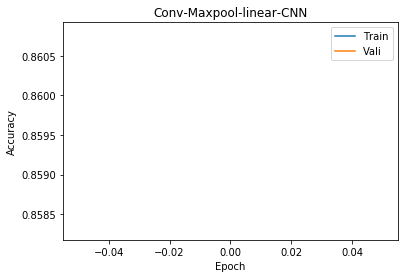

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.453
[1, 40000] loss: 0.454
Training Accu:  0.855025
Validation Accu:  0.8562
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1434 correct, tested 2000, batch size 1000
Test 2 th batch, 2144 correct, tested 3000, batch size 1000
Test 3 th batch, 2842 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4261 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5635 correct, tested 8000, batch size 1000
Test 8 th batch, 6332 correct, tested 9000, batch size 1000
Test 9 th batch, 7018 correct, tested 10000, batch size 1000


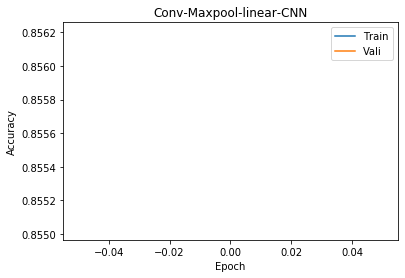

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.440
[1, 40000] loss: 0.447
Training Accu:  0.86065
Validation Accu:  0.8638
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3550 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5648 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7037 correct, tested 10000, batch size 1000


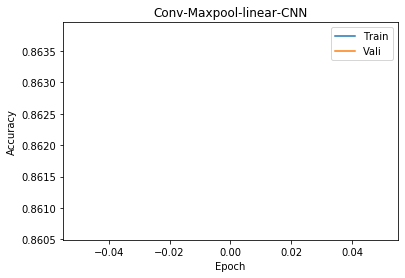

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.436
[1, 40000] loss: 0.448
Training Accu:  0.860075
Validation Accu:  0.8634
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1433 correct, tested 2000, batch size 1000
Test 2 th batch, 2141 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4945 correct, tested 7000, batch size 1000
Test 7 th batch, 5642 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7029 correct, tested 10000, batch size 1000


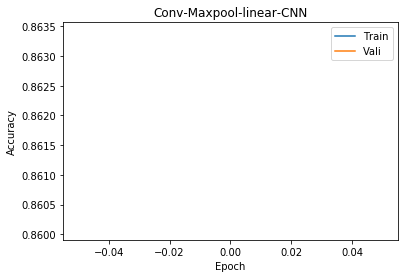

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.446
[1, 40000] loss: 0.441
Training Accu:  0.860575
Validation Accu:  0.8534
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2135 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3560 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4951 correct, tested 7000, batch size 1000
Test 7 th batch, 5647 correct, tested 8000, batch size 1000
Test 8 th batch, 6340 correct, tested 9000, batch size 1000
Test 9 th batch, 7024 correct, tested 10000, batch size 1000


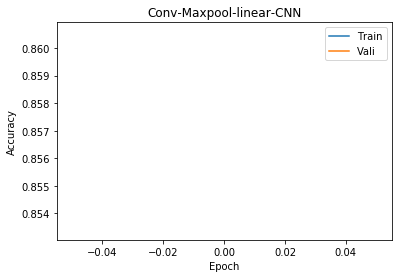

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.429
[1, 40000] loss: 0.446
Training Accu:  0.86205
Validation Accu:  0.8582
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5643 correct, tested 8000, batch size 1000
Test 8 th batch, 6344 correct, tested 9000, batch size 1000
Test 9 th batch, 7033 correct, tested 10000, batch size 1000


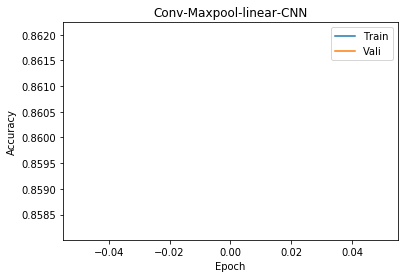

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.436
[1, 40000] loss: 0.447
Training Accu:  0.8601
Validation Accu:  0.8621
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4900 correct, tested 7000, batch size 1000
Test 7 th batch, 5612 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 6990 correct, tested 10000, batch size 1000


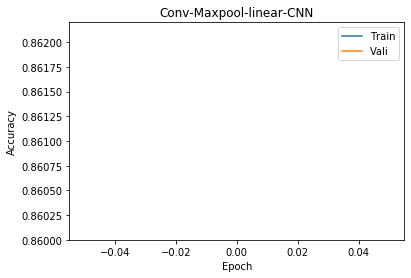

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.439
[1, 40000] loss: 0.442
Training Accu:  0.862175
Validation Accu:  0.8606
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2815 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5622 correct, tested 8000, batch size 1000
Test 8 th batch, 6319 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


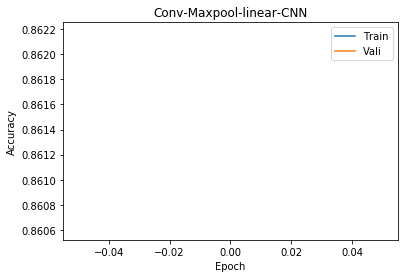

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.439
[1, 40000] loss: 0.440
Training Accu:  0.862075
Validation Accu:  0.8644
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4920 correct, tested 7000, batch size 1000
Test 7 th batch, 5630 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 7005 correct, tested 10000, batch size 1000


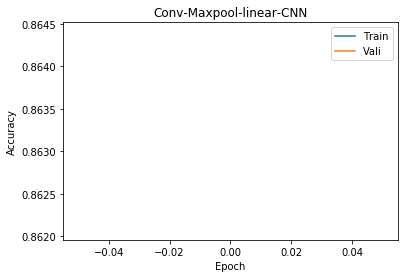

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.435
[1, 40000] loss: 0.444
Training Accu:  0.859575
Validation Accu:  0.8645
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3551 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4926 correct, tested 7000, batch size 1000
Test 7 th batch, 5630 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7011 correct, tested 10000, batch size 1000


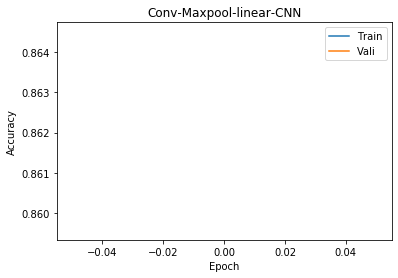

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.435
[1, 40000] loss: 0.434
Training Accu:  0.86455
Validation Accu:  0.8578
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2815 correct, tested 4000, batch size 1000
Test 4 th batch, 3535 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5632 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 7012 correct, tested 10000, batch size 1000


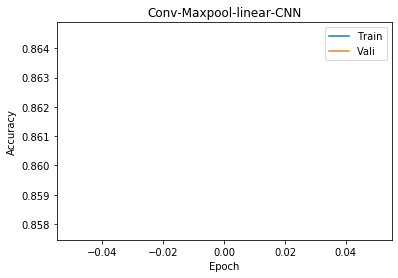

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.439
[1, 40000] loss: 0.449
Training Accu:  0.85865
Validation Accu:  0.8649
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4260 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5652 correct, tested 8000, batch size 1000
Test 8 th batch, 6344 correct, tested 9000, batch size 1000
Test 9 th batch, 7037 correct, tested 10000, batch size 1000


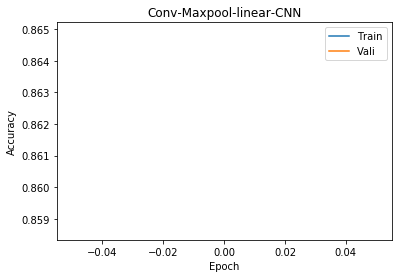

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.427
[1, 40000] loss: 0.433
Training Accu:  0.86565
Validation Accu:  0.8636
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4242 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5617 correct, tested 8000, batch size 1000
Test 8 th batch, 6319 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


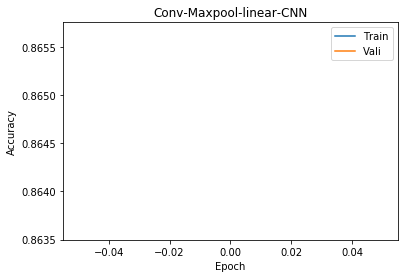

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.423
[1, 40000] loss: 0.438
Training Accu:  0.8658
Validation Accu:  0.8649
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2831 correct, tested 4000, batch size 1000
Test 4 th batch, 3563 correct, tested 5000, batch size 1000
Test 5 th batch, 4266 correct, tested 6000, batch size 1000
Test 6 th batch, 4958 correct, tested 7000, batch size 1000
Test 7 th batch, 5656 correct, tested 8000, batch size 1000
Test 8 th batch, 6350 correct, tested 9000, batch size 1000
Test 9 th batch, 7039 correct, tested 10000, batch size 1000


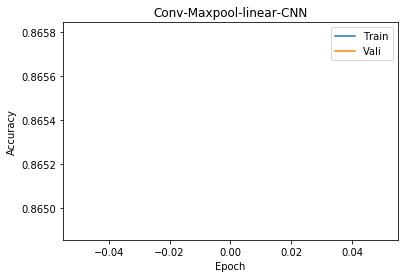

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.412
[1, 40000] loss: 0.447
Training Accu:  0.865125
Validation Accu:  0.8663
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2136 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4261 correct, tested 6000, batch size 1000
Test 6 th batch, 4947 correct, tested 7000, batch size 1000
Test 7 th batch, 5643 correct, tested 8000, batch size 1000
Test 8 th batch, 6343 correct, tested 9000, batch size 1000
Test 9 th batch, 7037 correct, tested 10000, batch size 1000


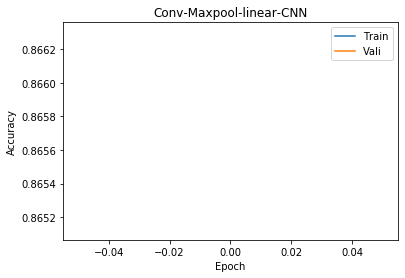

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.430
[1, 40000] loss: 0.429
Training Accu:  0.8658
Validation Accu:  0.861
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3546 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4942 correct, tested 7000, batch size 1000
Test 7 th batch, 5639 correct, tested 8000, batch size 1000
Test 8 th batch, 6346 correct, tested 9000, batch size 1000
Test 9 th batch, 7032 correct, tested 10000, batch size 1000


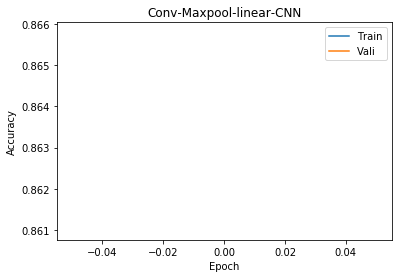

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.426
[1, 40000] loss: 0.434
Training Accu:  0.86465
Validation Accu:  0.865
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3551 correct, tested 5000, batch size 1000
Test 5 th batch, 4244 correct, tested 6000, batch size 1000
Test 6 th batch, 4936 correct, tested 7000, batch size 1000
Test 7 th batch, 5630 correct, tested 8000, batch size 1000
Test 8 th batch, 6321 correct, tested 9000, batch size 1000
Test 9 th batch, 7006 correct, tested 10000, batch size 1000


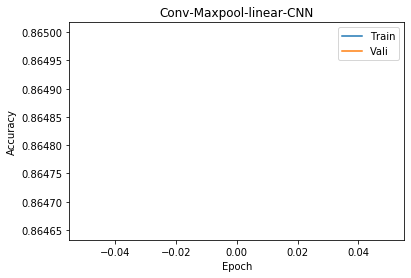

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.424
[1, 40000] loss: 0.425
Training Accu:  0.86915
Validation Accu:  0.8582
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2821 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4231 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5614 correct, tested 8000, batch size 1000
Test 8 th batch, 6313 correct, tested 9000, batch size 1000
Test 9 th batch, 7004 correct, tested 10000, batch size 1000


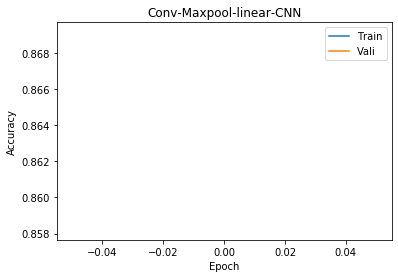

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.424
[1, 40000] loss: 0.420
Training Accu:  0.86795
Validation Accu:  0.8615
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1437 correct, tested 2000, batch size 1000
Test 2 th batch, 2145 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3568 correct, tested 5000, batch size 1000
Test 5 th batch, 4267 correct, tested 6000, batch size 1000
Test 6 th batch, 4958 correct, tested 7000, batch size 1000
Test 7 th batch, 5671 correct, tested 8000, batch size 1000
Test 8 th batch, 6357 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


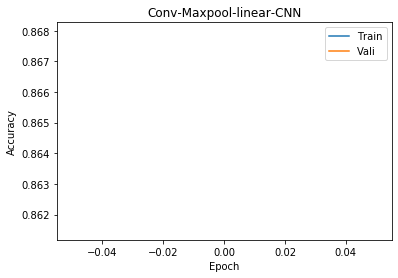

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.420
[1, 40000] loss: 0.431
Training Accu:  0.86785
Validation Accu:  0.8607
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1413 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3539 correct, tested 5000, batch size 1000
Test 5 th batch, 4237 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5625 correct, tested 8000, batch size 1000
Test 8 th batch, 6317 correct, tested 9000, batch size 1000
Test 9 th batch, 7023 correct, tested 10000, batch size 1000


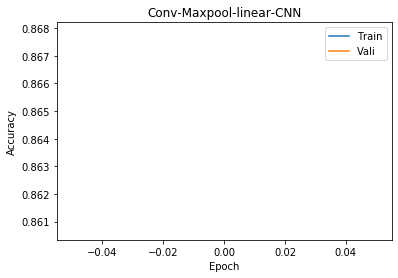

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.428
[1, 40000] loss: 0.428
Training Accu:  0.866875
Validation Accu:  0.8725
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2829 correct, tested 4000, batch size 1000
Test 4 th batch, 3557 correct, tested 5000, batch size 1000
Test 5 th batch, 4257 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5645 correct, tested 8000, batch size 1000
Test 8 th batch, 6332 correct, tested 9000, batch size 1000
Test 9 th batch, 7020 correct, tested 10000, batch size 1000


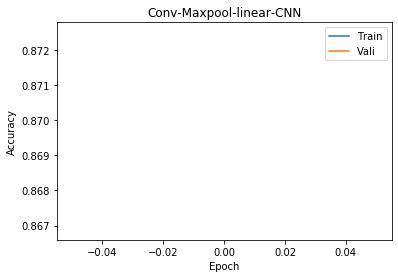

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.422
[1, 40000] loss: 0.425
Training Accu:  0.867875
Validation Accu:  0.8559
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2128 correct, tested 3000, batch size 1000
Test 3 th batch, 2819 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4229 correct, tested 6000, batch size 1000
Test 6 th batch, 4927 correct, tested 7000, batch size 1000
Test 7 th batch, 5607 correct, tested 8000, batch size 1000
Test 8 th batch, 6303 correct, tested 9000, batch size 1000
Test 9 th batch, 6996 correct, tested 10000, batch size 1000


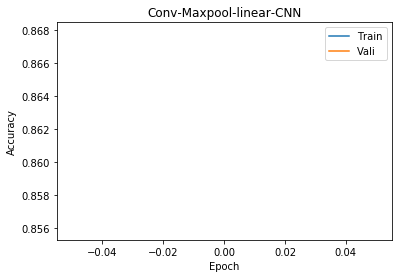

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.419
[1, 40000] loss: 0.431
Training Accu:  0.868325
Validation Accu:  0.8687
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1419 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4238 correct, tested 6000, batch size 1000
Test 6 th batch, 4927 correct, tested 7000, batch size 1000
Test 7 th batch, 5621 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 7006 correct, tested 10000, batch size 1000


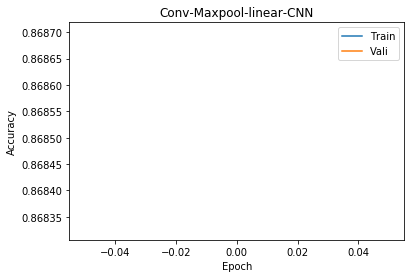

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.413
[1, 40000] loss: 0.430
Training Accu:  0.868775
Validation Accu:  0.8638
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1428 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4252 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5630 correct, tested 8000, batch size 1000
Test 8 th batch, 6332 correct, tested 9000, batch size 1000
Test 9 th batch, 7015 correct, tested 10000, batch size 1000


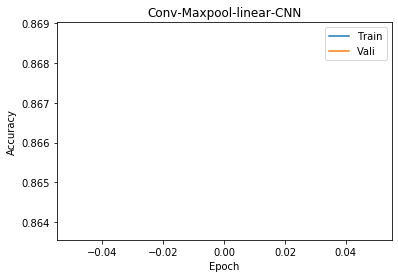

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.417
[1, 40000] loss: 0.425
Training Accu:  0.8685
Validation Accu:  0.8589
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2815 correct, tested 4000, batch size 1000
Test 4 th batch, 3536 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4917 correct, tested 7000, batch size 1000
Test 7 th batch, 5625 correct, tested 8000, batch size 1000
Test 8 th batch, 6307 correct, tested 9000, batch size 1000
Test 9 th batch, 6985 correct, tested 10000, batch size 1000


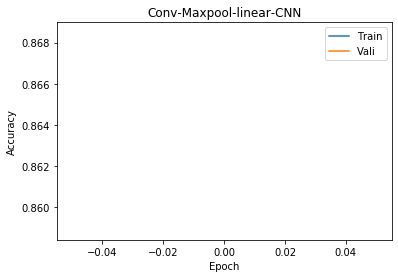

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.419
[1, 40000] loss: 0.417
Training Accu:  0.869575
Validation Accu:  0.8639
Finish Traning
Test 0 th batch, 728 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2144 correct, tested 3000, batch size 1000
Test 3 th batch, 2840 correct, tested 4000, batch size 1000
Test 4 th batch, 3561 correct, tested 5000, batch size 1000
Test 5 th batch, 4255 correct, tested 6000, batch size 1000
Test 6 th batch, 4944 correct, tested 7000, batch size 1000
Test 7 th batch, 5636 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7020 correct, tested 10000, batch size 1000


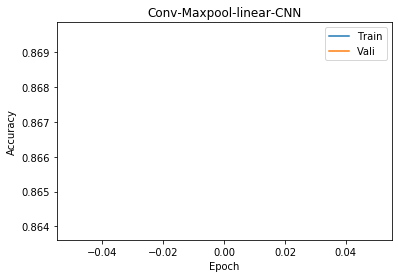

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.420
[1, 40000] loss: 0.423
Training Accu:  0.868475
Validation Accu:  0.8711
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2826 correct, tested 4000, batch size 1000
Test 4 th batch, 3559 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4949 correct, tested 7000, batch size 1000
Test 7 th batch, 5654 correct, tested 8000, batch size 1000
Test 8 th batch, 6342 correct, tested 9000, batch size 1000
Test 9 th batch, 7023 correct, tested 10000, batch size 1000


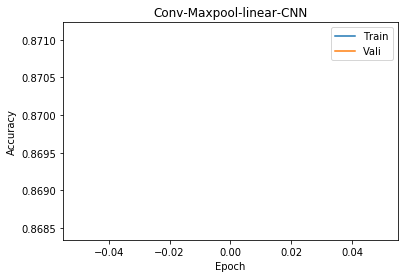

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.416
[1, 40000] loss: 0.420
Training Accu:  0.869375
Validation Accu:  0.8691
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4930 correct, tested 7000, batch size 1000
Test 7 th batch, 5627 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 7011 correct, tested 10000, batch size 1000


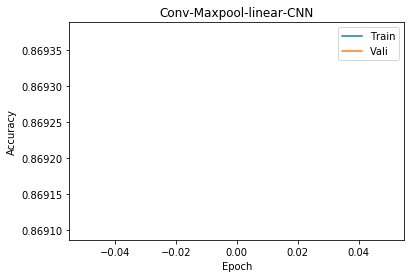

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.409
[1, 40000] loss: 0.420
Training Accu:  0.872725
Validation Accu:  0.875
Finish Traning
Test 0 th batch, 728 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5641 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7035 correct, tested 10000, batch size 1000


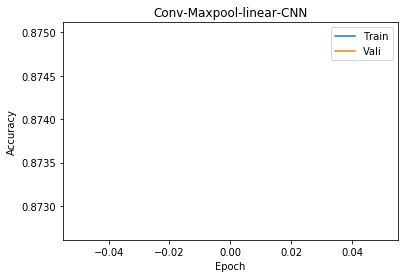

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.413
[1, 40000] loss: 0.427
Training Accu:  0.868275
Validation Accu:  0.8733
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2140 correct, tested 3000, batch size 1000
Test 3 th batch, 2838 correct, tested 4000, batch size 1000
Test 4 th batch, 3557 correct, tested 5000, batch size 1000
Test 5 th batch, 4254 correct, tested 6000, batch size 1000
Test 6 th batch, 4930 correct, tested 7000, batch size 1000
Test 7 th batch, 5637 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7016 correct, tested 10000, batch size 1000


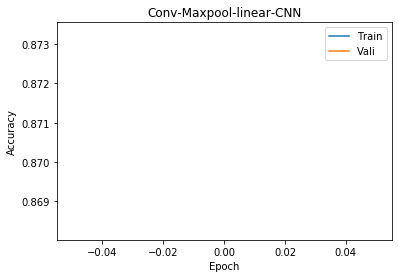

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.414
[1, 40000] loss: 0.417
Training Accu:  0.872
Validation Accu:  0.8659
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1427 correct, tested 2000, batch size 1000
Test 2 th batch, 2139 correct, tested 3000, batch size 1000
Test 3 th batch, 2835 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4255 correct, tested 6000, batch size 1000
Test 6 th batch, 4943 correct, tested 7000, batch size 1000
Test 7 th batch, 5641 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7023 correct, tested 10000, batch size 1000


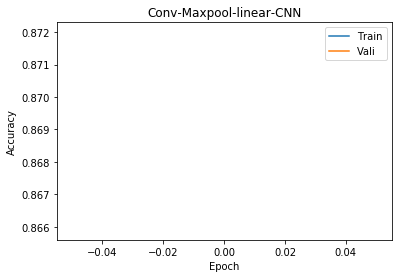

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.417
[1, 40000] loss: 0.407
Training Accu:  0.872425
Validation Accu:  0.8693
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5598 correct, tested 8000, batch size 1000
Test 8 th batch, 6290 correct, tested 9000, batch size 1000
Test 9 th batch, 6966 correct, tested 10000, batch size 1000


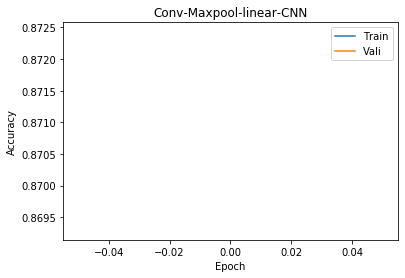

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.407
[1, 40000] loss: 0.418
Training Accu:  0.8724
Validation Accu:  0.8649
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3538 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5629 correct, tested 8000, batch size 1000
Test 8 th batch, 6318 correct, tested 9000, batch size 1000
Test 9 th batch, 7001 correct, tested 10000, batch size 1000


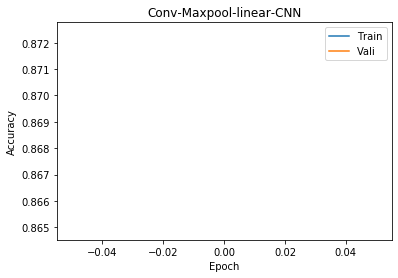

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.415
[1, 40000] loss: 0.409
Training Accu:  0.87295
Validation Accu:  0.8691
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3533 correct, tested 5000, batch size 1000
Test 5 th batch, 4231 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5611 correct, tested 8000, batch size 1000
Test 8 th batch, 6312 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


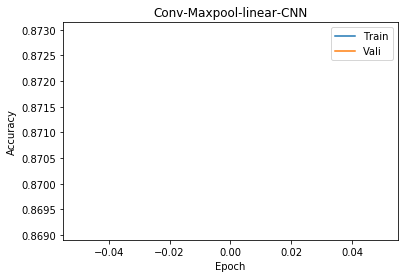

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.403
[1, 40000] loss: 0.413
Training Accu:  0.87475
Validation Accu:  0.8752
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5635 correct, tested 8000, batch size 1000
Test 8 th batch, 6324 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


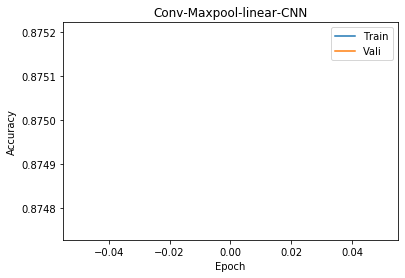

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.402
[1, 40000] loss: 0.416
Training Accu:  0.873775
Validation Accu:  0.865
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4221 correct, tested 6000, batch size 1000
Test 6 th batch, 4908 correct, tested 7000, batch size 1000
Test 7 th batch, 5600 correct, tested 8000, batch size 1000
Test 8 th batch, 6295 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


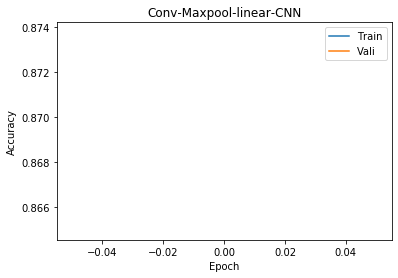

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.418
[1, 40000] loss: 0.410
Training Accu:  0.87035
Validation Accu:  0.8763
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3550 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4939 correct, tested 7000, batch size 1000
Test 7 th batch, 5643 correct, tested 8000, batch size 1000
Test 8 th batch, 6333 correct, tested 9000, batch size 1000
Test 9 th batch, 7030 correct, tested 10000, batch size 1000


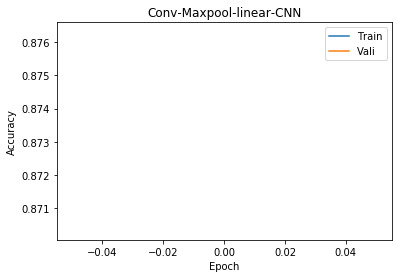

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.404
[1, 40000] loss: 0.407
Training Accu:  0.87395
Validation Accu:  0.8707
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2830 correct, tested 4000, batch size 1000
Test 4 th batch, 3555 correct, tested 5000, batch size 1000
Test 5 th batch, 4262 correct, tested 6000, batch size 1000
Test 6 th batch, 4948 correct, tested 7000, batch size 1000
Test 7 th batch, 5641 correct, tested 8000, batch size 1000
Test 8 th batch, 6339 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


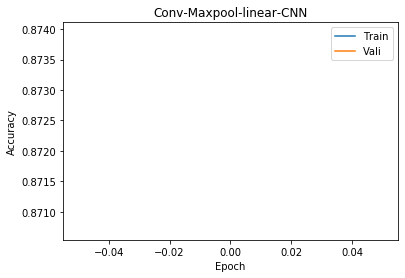

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.410
[1, 40000] loss: 0.409
Training Accu:  0.872925
Validation Accu:  0.88
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4258 correct, tested 6000, batch size 1000
Test 6 th batch, 4947 correct, tested 7000, batch size 1000
Test 7 th batch, 5651 correct, tested 8000, batch size 1000
Test 8 th batch, 6352 correct, tested 9000, batch size 1000
Test 9 th batch, 7035 correct, tested 10000, batch size 1000


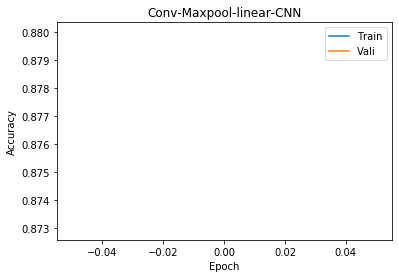

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.400
[1, 40000] loss: 0.406
Training Accu:  0.8754
Validation Accu:  0.8667
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1436 correct, tested 2000, batch size 1000
Test 2 th batch, 2141 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5637 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


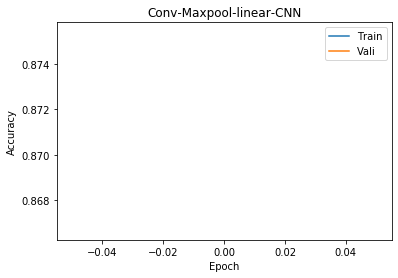

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.405
[1, 40000] loss: 0.403
Training Accu:  0.87615
Validation Accu:  0.8777
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1405 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3540 correct, tested 5000, batch size 1000
Test 5 th batch, 4239 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5614 correct, tested 8000, batch size 1000
Test 8 th batch, 6315 correct, tested 9000, batch size 1000
Test 9 th batch, 6994 correct, tested 10000, batch size 1000


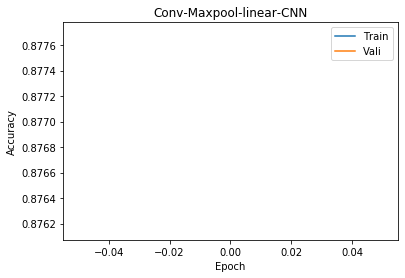

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.401
[1, 40000] loss: 0.404
Training Accu:  0.87565
Validation Accu:  0.871
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4229 correct, tested 6000, batch size 1000
Test 6 th batch, 4911 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 7003 correct, tested 10000, batch size 1000


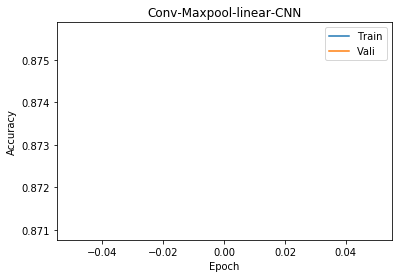

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.394
[1, 40000] loss: 0.410
Training Accu:  0.8757
Validation Accu:  0.876
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1432 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3554 correct, tested 5000, batch size 1000
Test 5 th batch, 4237 correct, tested 6000, batch size 1000
Test 6 th batch, 4924 correct, tested 7000, batch size 1000
Test 7 th batch, 5629 correct, tested 8000, batch size 1000
Test 8 th batch, 6314 correct, tested 9000, batch size 1000
Test 9 th batch, 6999 correct, tested 10000, batch size 1000


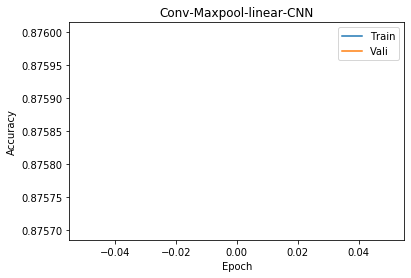

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.398
[1, 40000] loss: 0.403
Training Accu:  0.877075
Validation Accu:  0.8736
Finish Traning
Test 0 th batch, 724 correct, tested 1000, batch size 1000
Test 1 th batch, 1435 correct, tested 2000, batch size 1000
Test 2 th batch, 2142 correct, tested 3000, batch size 1000
Test 3 th batch, 2832 correct, tested 4000, batch size 1000
Test 4 th batch, 3553 correct, tested 5000, batch size 1000
Test 5 th batch, 4252 correct, tested 6000, batch size 1000
Test 6 th batch, 4938 correct, tested 7000, batch size 1000
Test 7 th batch, 5638 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7026 correct, tested 10000, batch size 1000


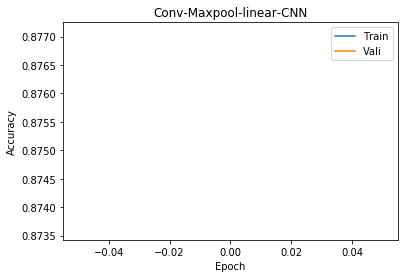

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.401
[1, 40000] loss: 0.401
Training Accu:  0.876125
Validation Accu:  0.8619
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1394 correct, tested 2000, batch size 1000
Test 2 th batch, 2091 correct, tested 3000, batch size 1000
Test 3 th batch, 2781 correct, tested 4000, batch size 1000
Test 4 th batch, 3497 correct, tested 5000, batch size 1000
Test 5 th batch, 4185 correct, tested 6000, batch size 1000
Test 6 th batch, 4869 correct, tested 7000, batch size 1000
Test 7 th batch, 5568 correct, tested 8000, batch size 1000
Test 8 th batch, 6242 correct, tested 9000, batch size 1000
Test 9 th batch, 6931 correct, tested 10000, batch size 1000


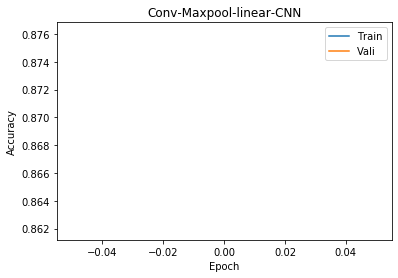

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.404
[1, 40000] loss: 0.396
Training Accu:  0.87615
Validation Accu:  0.8752
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2808 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4216 correct, tested 6000, batch size 1000
Test 6 th batch, 4894 correct, tested 7000, batch size 1000
Test 7 th batch, 5592 correct, tested 8000, batch size 1000
Test 8 th batch, 6276 correct, tested 9000, batch size 1000
Test 9 th batch, 6958 correct, tested 10000, batch size 1000


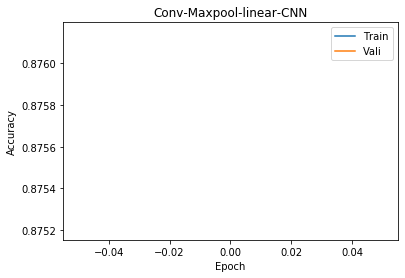

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.402
[1, 40000] loss: 0.401
Training Accu:  0.87665
Validation Accu:  0.8782
Finish Traning
Test 0 th batch, 726 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2135 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3549 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5631 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


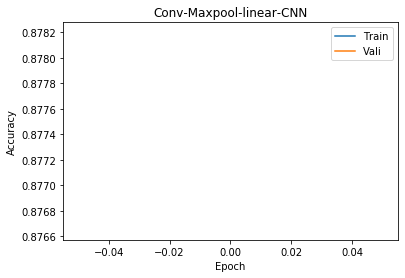

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.402
[1, 40000] loss: 0.401
Training Accu:  0.874975
Validation Accu:  0.8639
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1400 correct, tested 2000, batch size 1000
Test 2 th batch, 2097 correct, tested 3000, batch size 1000
Test 3 th batch, 2789 correct, tested 4000, batch size 1000
Test 4 th batch, 3510 correct, tested 5000, batch size 1000
Test 5 th batch, 4200 correct, tested 6000, batch size 1000
Test 6 th batch, 4876 correct, tested 7000, batch size 1000
Test 7 th batch, 5564 correct, tested 8000, batch size 1000
Test 8 th batch, 6256 correct, tested 9000, batch size 1000
Test 9 th batch, 6935 correct, tested 10000, batch size 1000


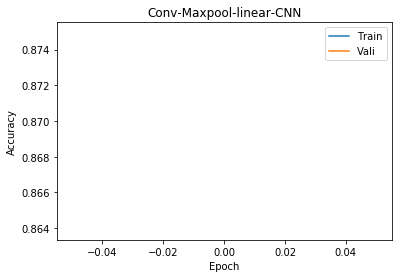

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.399
[1, 40000] loss: 0.390
Training Accu:  0.87905
Validation Accu:  0.8749
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5622 correct, tested 8000, batch size 1000
Test 8 th batch, 6311 correct, tested 9000, batch size 1000
Test 9 th batch, 6995 correct, tested 10000, batch size 1000


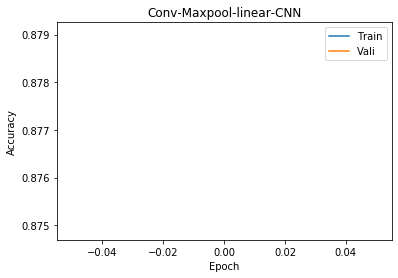

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.391
[1, 40000] loss: 0.398
Training Accu:  0.877975
Validation Accu:  0.8732
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2818 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4932 correct, tested 7000, batch size 1000
Test 7 th batch, 5631 correct, tested 8000, batch size 1000
Test 8 th batch, 6323 correct, tested 9000, batch size 1000
Test 9 th batch, 7010 correct, tested 10000, batch size 1000


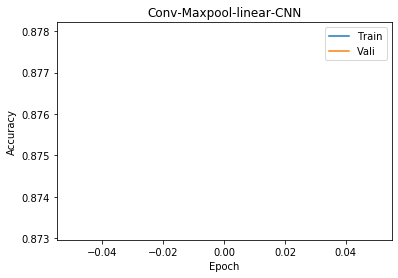

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.393
[1, 40000] loss: 0.392
Training Accu:  0.879825
Validation Accu:  0.8768
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4937 correct, tested 7000, batch size 1000
Test 7 th batch, 5626 correct, tested 8000, batch size 1000
Test 8 th batch, 6327 correct, tested 9000, batch size 1000
Test 9 th batch, 7018 correct, tested 10000, batch size 1000


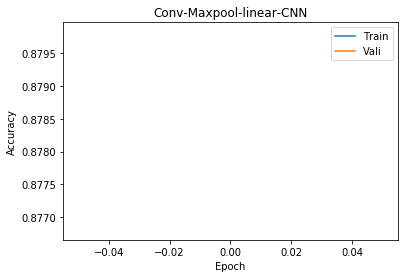

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.390
[1, 40000] loss: 0.400
Training Accu:  0.878875
Validation Accu:  0.8788
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2141 correct, tested 3000, batch size 1000
Test 3 th batch, 2836 correct, tested 4000, batch size 1000
Test 4 th batch, 3558 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4933 correct, tested 7000, batch size 1000
Test 7 th batch, 5634 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7017 correct, tested 10000, batch size 1000


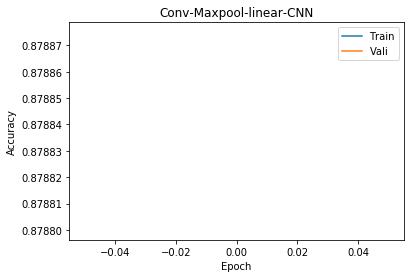

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.403
[1, 40000] loss: 0.393
Training Accu:  0.875025
Validation Accu:  0.8775
Finish Traning
Test 0 th batch, 709 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5625 correct, tested 8000, batch size 1000
Test 8 th batch, 6315 correct, tested 9000, batch size 1000
Test 9 th batch, 6992 correct, tested 10000, batch size 1000


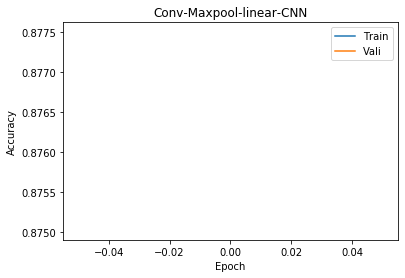

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.393
[1, 40000] loss: 0.393
Training Accu:  0.877875
Validation Accu:  0.8649
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1411 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2808 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4917 correct, tested 7000, batch size 1000
Test 7 th batch, 5619 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 7005 correct, tested 10000, batch size 1000


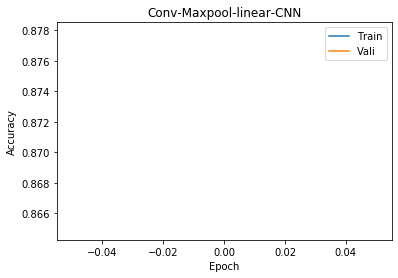

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.390
[1, 40000] loss: 0.403
Training Accu:  0.8761
Validation Accu:  0.8788
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3546 correct, tested 5000, batch size 1000
Test 5 th batch, 4240 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5599 correct, tested 8000, batch size 1000
Test 8 th batch, 6306 correct, tested 9000, batch size 1000
Test 9 th batch, 6986 correct, tested 10000, batch size 1000


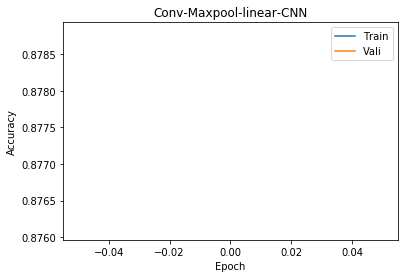

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.384
[1, 40000] loss: 0.399
Training Accu:  0.8797
Validation Accu:  0.8783
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1437 correct, tested 2000, batch size 1000
Test 2 th batch, 2139 correct, tested 3000, batch size 1000
Test 3 th batch, 2834 correct, tested 4000, batch size 1000
Test 4 th batch, 3559 correct, tested 5000, batch size 1000
Test 5 th batch, 4258 correct, tested 6000, batch size 1000
Test 6 th batch, 4941 correct, tested 7000, batch size 1000
Test 7 th batch, 5638 correct, tested 8000, batch size 1000
Test 8 th batch, 6338 correct, tested 9000, batch size 1000
Test 9 th batch, 7025 correct, tested 10000, batch size 1000


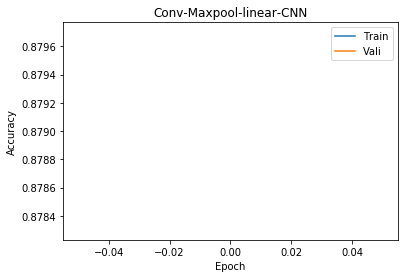

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.394
[1, 40000] loss: 0.398
Training Accu:  0.8754
Validation Accu:  0.8729
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2817 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4908 correct, tested 7000, batch size 1000
Test 7 th batch, 5613 correct, tested 8000, batch size 1000
Test 8 th batch, 6298 correct, tested 9000, batch size 1000
Test 9 th batch, 6980 correct, tested 10000, batch size 1000


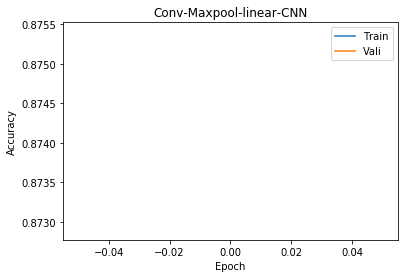

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.391
[1, 40000] loss: 0.391
Training Accu:  0.8807
Validation Accu:  0.8821
Finish Traning
Test 0 th batch, 725 correct, tested 1000, batch size 1000
Test 1 th batch, 1431 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3530 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5615 correct, tested 8000, batch size 1000
Test 8 th batch, 6300 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


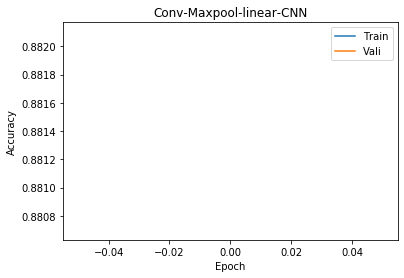

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.385
[1, 40000] loss: 0.397
Training Accu:  0.8794
Validation Accu:  0.8769
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3552 correct, tested 5000, batch size 1000
Test 5 th batch, 4256 correct, tested 6000, batch size 1000
Test 6 th batch, 4950 correct, tested 7000, batch size 1000
Test 7 th batch, 5655 correct, tested 8000, batch size 1000
Test 8 th batch, 6351 correct, tested 9000, batch size 1000
Test 9 th batch, 7044 correct, tested 10000, batch size 1000


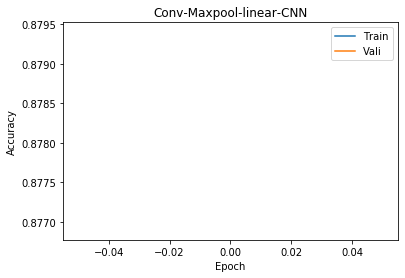

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.391
[1, 40000] loss: 0.390
Training Accu:  0.879625
Validation Accu:  0.8837
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2820 correct, tested 4000, batch size 1000
Test 4 th batch, 3542 correct, tested 5000, batch size 1000
Test 5 th batch, 4241 correct, tested 6000, batch size 1000
Test 6 th batch, 4926 correct, tested 7000, batch size 1000
Test 7 th batch, 5632 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7006 correct, tested 10000, batch size 1000


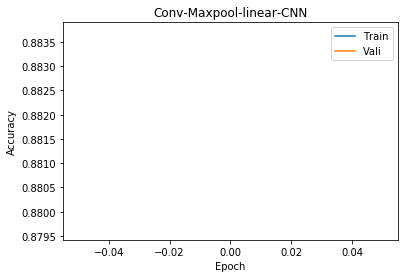

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.379
[1, 40000] loss: 0.387
Training Accu:  0.885175
Validation Accu:  0.8832
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2829 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4232 correct, tested 6000, batch size 1000
Test 6 th batch, 4921 correct, tested 7000, batch size 1000
Test 7 th batch, 5618 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


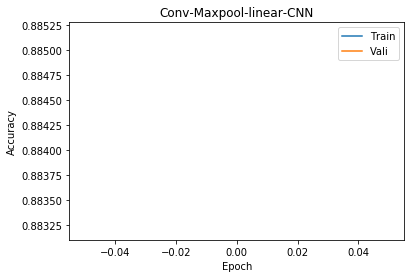

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.383
[1, 40000] loss: 0.379
Training Accu:  0.884675
Validation Accu:  0.8695
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1408 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2802 correct, tested 4000, batch size 1000
Test 4 th batch, 3514 correct, tested 5000, batch size 1000
Test 5 th batch, 4202 correct, tested 6000, batch size 1000
Test 6 th batch, 4888 correct, tested 7000, batch size 1000
Test 7 th batch, 5587 correct, tested 8000, batch size 1000
Test 8 th batch, 6279 correct, tested 9000, batch size 1000
Test 9 th batch, 6965 correct, tested 10000, batch size 1000


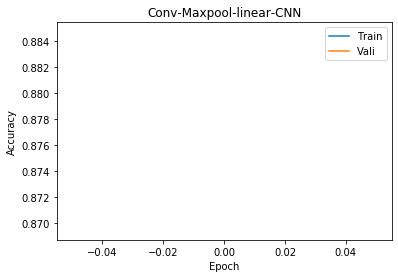

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.386
[1, 40000] loss: 0.388
Training Accu:  0.88165
Validation Accu:  0.8778
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1430 correct, tested 2000, batch size 1000
Test 2 th batch, 2139 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3551 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4946 correct, tested 7000, batch size 1000
Test 7 th batch, 5640 correct, tested 8000, batch size 1000
Test 8 th batch, 6336 correct, tested 9000, batch size 1000
Test 9 th batch, 7035 correct, tested 10000, batch size 1000


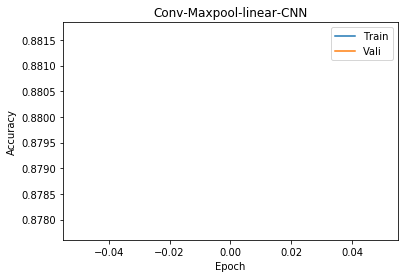

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.379
[1, 40000] loss: 0.391
Training Accu:  0.88185
Validation Accu:  0.8878
Finish Traning
Test 0 th batch, 719 correct, tested 1000, batch size 1000
Test 1 th batch, 1413 correct, tested 2000, batch size 1000
Test 2 th batch, 2111 correct, tested 3000, batch size 1000
Test 3 th batch, 2803 correct, tested 4000, batch size 1000
Test 4 th batch, 3527 correct, tested 5000, batch size 1000
Test 5 th batch, 4234 correct, tested 6000, batch size 1000
Test 6 th batch, 4930 correct, tested 7000, batch size 1000
Test 7 th batch, 5632 correct, tested 8000, batch size 1000
Test 8 th batch, 6323 correct, tested 9000, batch size 1000
Test 9 th batch, 7011 correct, tested 10000, batch size 1000


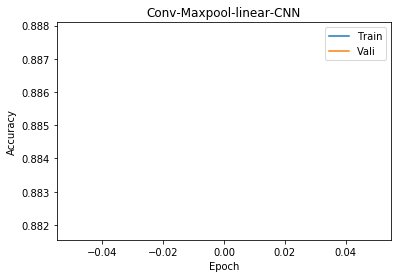

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.376
[1, 40000] loss: 0.392
Training Accu:  0.8831
Validation Accu:  0.8851
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1413 correct, tested 2000, batch size 1000
Test 2 th batch, 2114 correct, tested 3000, batch size 1000
Test 3 th batch, 2816 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4240 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5628 correct, tested 8000, batch size 1000
Test 8 th batch, 6314 correct, tested 9000, batch size 1000
Test 9 th batch, 7002 correct, tested 10000, batch size 1000


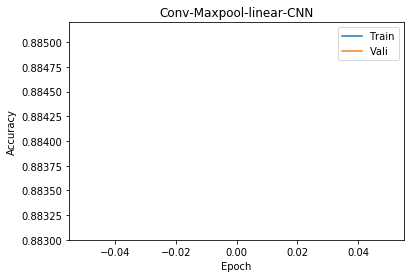

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.378
[1, 40000] loss: 0.389
Training Accu:  0.88205
Validation Accu:  0.882
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2808 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4224 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5594 correct, tested 8000, batch size 1000
Test 8 th batch, 6292 correct, tested 9000, batch size 1000
Test 9 th batch, 6983 correct, tested 10000, batch size 1000


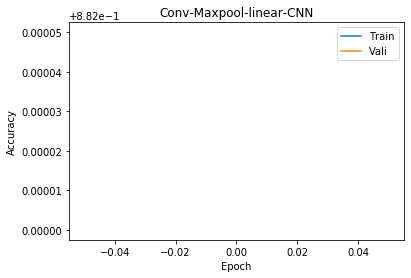

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.378
[1, 40000] loss: 0.383
Training Accu:  0.8838
Validation Accu:  0.8748
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3525 correct, tested 5000, batch size 1000
Test 5 th batch, 4223 correct, tested 6000, batch size 1000
Test 6 th batch, 4912 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6281 correct, tested 9000, batch size 1000
Test 9 th batch, 6965 correct, tested 10000, batch size 1000


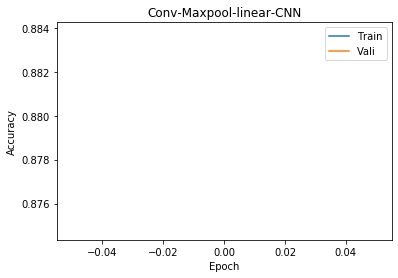

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.385
[1, 40000] loss: 0.377
Training Accu:  0.8838
Validation Accu:  0.8796
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2126 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3556 correct, tested 5000, batch size 1000
Test 5 th batch, 4251 correct, tested 6000, batch size 1000
Test 6 th batch, 4934 correct, tested 7000, batch size 1000
Test 7 th batch, 5637 correct, tested 8000, batch size 1000
Test 8 th batch, 6333 correct, tested 9000, batch size 1000
Test 9 th batch, 7014 correct, tested 10000, batch size 1000


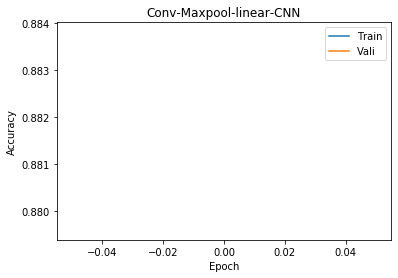

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.371
[1, 40000] loss: 0.383
Training Accu:  0.886175
Validation Accu:  0.8845
Finish Traning
Test 0 th batch, 727 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2138 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4246 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5618 correct, tested 8000, batch size 1000
Test 8 th batch, 6316 correct, tested 9000, batch size 1000
Test 9 th batch, 7007 correct, tested 10000, batch size 1000


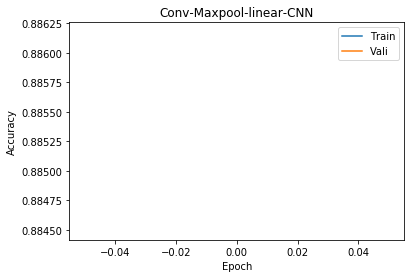

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.370
[1, 40000] loss: 0.389
Training Accu:  0.884275
Validation Accu:  0.8845
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2132 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3536 correct, tested 5000, batch size 1000
Test 5 th batch, 4218 correct, tested 6000, batch size 1000
Test 6 th batch, 4902 correct, tested 7000, batch size 1000
Test 7 th batch, 5598 correct, tested 8000, batch size 1000
Test 8 th batch, 6293 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


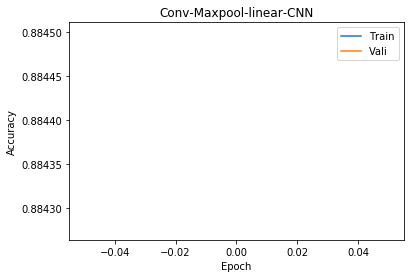

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.375
[1, 40000] loss: 0.379
Training Accu:  0.884025
Validation Accu:  0.8745
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2805 correct, tested 4000, batch size 1000
Test 4 th batch, 3515 correct, tested 5000, batch size 1000
Test 5 th batch, 4195 correct, tested 6000, batch size 1000
Test 6 th batch, 4877 correct, tested 7000, batch size 1000
Test 7 th batch, 5576 correct, tested 8000, batch size 1000
Test 8 th batch, 6271 correct, tested 9000, batch size 1000
Test 9 th batch, 6941 correct, tested 10000, batch size 1000


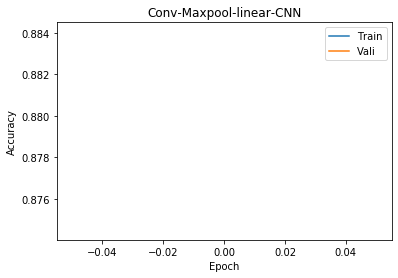

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.401
[1, 40000] loss: 0.387
Training Accu:  0.874275
Validation Accu:  0.8867
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2119 correct, tested 3000, batch size 1000
Test 3 th batch, 2805 correct, tested 4000, batch size 1000
Test 4 th batch, 3520 correct, tested 5000, batch size 1000
Test 5 th batch, 4217 correct, tested 6000, batch size 1000
Test 6 th batch, 4913 correct, tested 7000, batch size 1000
Test 7 th batch, 5610 correct, tested 8000, batch size 1000
Test 8 th batch, 6294 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


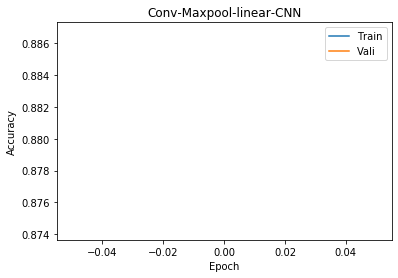

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.374
[1, 40000] loss: 0.374
Training Accu:  0.8867
Validation Accu:  0.8854
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3534 correct, tested 5000, batch size 1000
Test 5 th batch, 4224 correct, tested 6000, batch size 1000
Test 6 th batch, 4903 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6297 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


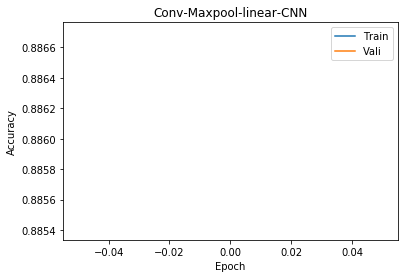

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.364
[1, 40000] loss: 0.381
Training Accu:  0.8876
Validation Accu:  0.8711
Finish Traning
Test 0 th batch, 703 correct, tested 1000, batch size 1000
Test 1 th batch, 1401 correct, tested 2000, batch size 1000
Test 2 th batch, 2096 correct, tested 3000, batch size 1000
Test 3 th batch, 2787 correct, tested 4000, batch size 1000
Test 4 th batch, 3499 correct, tested 5000, batch size 1000
Test 5 th batch, 4197 correct, tested 6000, batch size 1000
Test 6 th batch, 4871 correct, tested 7000, batch size 1000
Test 7 th batch, 5557 correct, tested 8000, batch size 1000
Test 8 th batch, 6257 correct, tested 9000, batch size 1000
Test 9 th batch, 6934 correct, tested 10000, batch size 1000


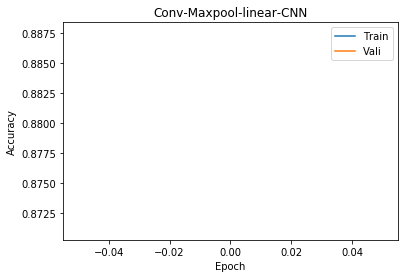

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.374
[1, 40000] loss: 0.371
Training Accu:  0.88795
Validation Accu:  0.8838
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4922 correct, tested 7000, batch size 1000
Test 7 th batch, 5612 correct, tested 8000, batch size 1000
Test 8 th batch, 6304 correct, tested 9000, batch size 1000
Test 9 th batch, 6988 correct, tested 10000, batch size 1000


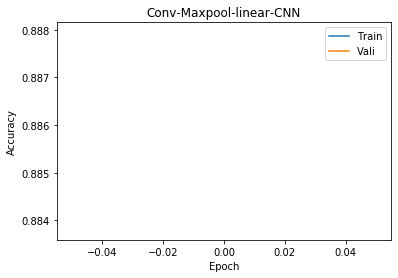

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.364
[1, 40000] loss: 0.374
Training Accu:  0.888575
Validation Accu:  0.8696
Finish Traning
Test 0 th batch, 706 correct, tested 1000, batch size 1000
Test 1 th batch, 1401 correct, tested 2000, batch size 1000
Test 2 th batch, 2101 correct, tested 3000, batch size 1000
Test 3 th batch, 2787 correct, tested 4000, batch size 1000
Test 4 th batch, 3494 correct, tested 5000, batch size 1000
Test 5 th batch, 4183 correct, tested 6000, batch size 1000
Test 6 th batch, 4856 correct, tested 7000, batch size 1000
Test 7 th batch, 5542 correct, tested 8000, batch size 1000
Test 8 th batch, 6237 correct, tested 9000, batch size 1000
Test 9 th batch, 6908 correct, tested 10000, batch size 1000


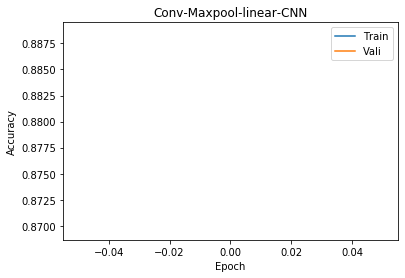

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.379
[1, 40000] loss: 0.368
Training Accu:  0.88625
Validation Accu:  0.8826
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4220 correct, tested 6000, batch size 1000
Test 6 th batch, 4900 correct, tested 7000, batch size 1000
Test 7 th batch, 5606 correct, tested 8000, batch size 1000
Test 8 th batch, 6292 correct, tested 9000, batch size 1000
Test 9 th batch, 6966 correct, tested 10000, batch size 1000


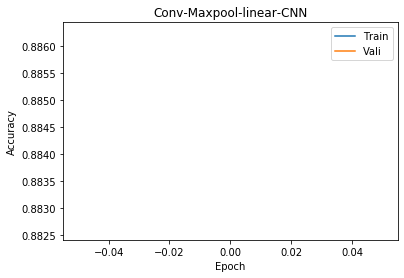

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.374
[1, 40000] loss: 0.374
Training Accu:  0.886525
Validation Accu:  0.8853
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2130 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3540 correct, tested 5000, batch size 1000
Test 5 th batch, 4227 correct, tested 6000, batch size 1000
Test 6 th batch, 4915 correct, tested 7000, batch size 1000
Test 7 th batch, 5607 correct, tested 8000, batch size 1000
Test 8 th batch, 6296 correct, tested 9000, batch size 1000
Test 9 th batch, 6981 correct, tested 10000, batch size 1000


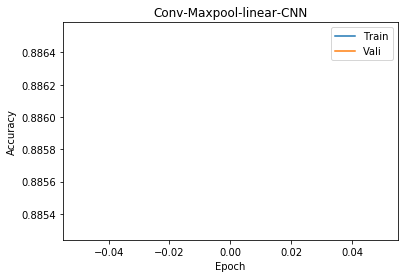

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.368
[1, 40000] loss: 0.370
Training Accu:  0.888675
Validation Accu:  0.8899
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3538 correct, tested 5000, batch size 1000
Test 5 th batch, 4241 correct, tested 6000, batch size 1000
Test 6 th batch, 4926 correct, tested 7000, batch size 1000
Test 7 th batch, 5621 correct, tested 8000, batch size 1000
Test 8 th batch, 6317 correct, tested 9000, batch size 1000
Test 9 th batch, 6998 correct, tested 10000, batch size 1000


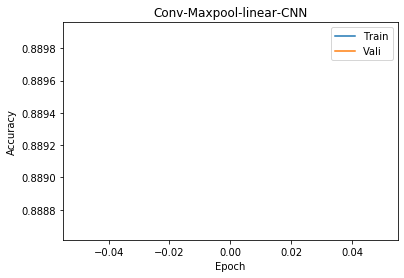

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.370
[1, 40000] loss: 0.369
Training Accu:  0.88815
Validation Accu:  0.8895
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2115 correct, tested 3000, batch size 1000
Test 3 th batch, 2811 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4240 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5620 correct, tested 8000, batch size 1000
Test 8 th batch, 6308 correct, tested 9000, batch size 1000
Test 9 th batch, 6996 correct, tested 10000, batch size 1000


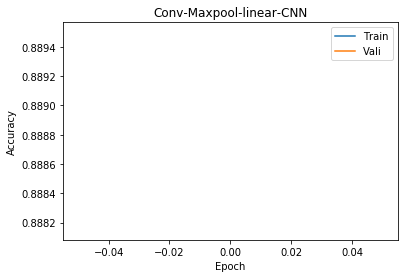

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.369
[1, 40000] loss: 0.376
Training Accu:  0.885875
Validation Accu:  0.8951
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2831 correct, tested 4000, batch size 1000
Test 4 th batch, 3542 correct, tested 5000, batch size 1000
Test 5 th batch, 4229 correct, tested 6000, batch size 1000
Test 6 th batch, 4919 correct, tested 7000, batch size 1000
Test 7 th batch, 5604 correct, tested 8000, batch size 1000
Test 8 th batch, 6300 correct, tested 9000, batch size 1000
Test 9 th batch, 6993 correct, tested 10000, batch size 1000


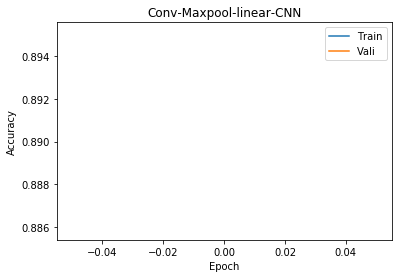

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.370
[1, 40000] loss: 0.362
Training Accu:  0.89015
Validation Accu:  0.8969
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2137 correct, tested 3000, batch size 1000
Test 3 th batch, 2833 correct, tested 4000, batch size 1000
Test 4 th batch, 3548 correct, tested 5000, batch size 1000
Test 5 th batch, 4247 correct, tested 6000, batch size 1000
Test 6 th batch, 4936 correct, tested 7000, batch size 1000
Test 7 th batch, 5634 correct, tested 8000, batch size 1000
Test 8 th batch, 6334 correct, tested 9000, batch size 1000
Test 9 th batch, 7012 correct, tested 10000, batch size 1000


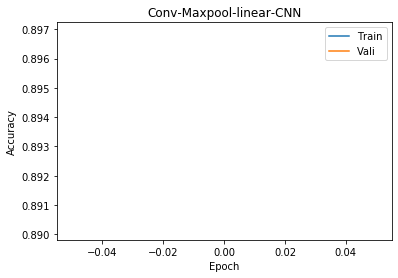

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.365
[1, 40000] loss: 0.369
Training Accu:  0.8882
Validation Accu:  0.8854
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1404 correct, tested 2000, batch size 1000
Test 2 th batch, 2101 correct, tested 3000, batch size 1000
Test 3 th batch, 2793 correct, tested 4000, batch size 1000
Test 4 th batch, 3512 correct, tested 5000, batch size 1000
Test 5 th batch, 4219 correct, tested 6000, batch size 1000
Test 6 th batch, 4899 correct, tested 7000, batch size 1000
Test 7 th batch, 5585 correct, tested 8000, batch size 1000
Test 8 th batch, 6277 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


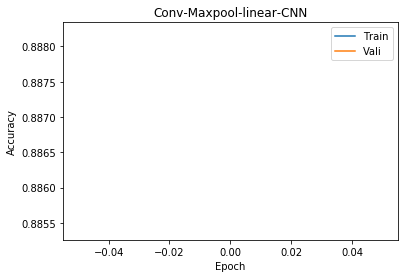

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.367
[1, 40000] loss: 0.370
Training Accu:  0.88865
Validation Accu:  0.8814
Finish Traning
Test 0 th batch, 702 correct, tested 1000, batch size 1000
Test 1 th batch, 1406 correct, tested 2000, batch size 1000
Test 2 th batch, 2108 correct, tested 3000, batch size 1000
Test 3 th batch, 2802 correct, tested 4000, batch size 1000
Test 4 th batch, 3516 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4899 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6291 correct, tested 9000, batch size 1000
Test 9 th batch, 6971 correct, tested 10000, batch size 1000


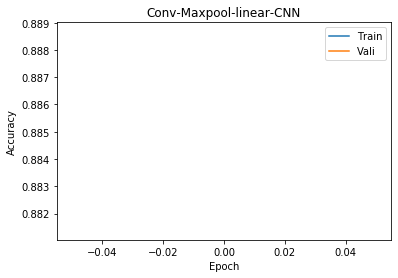

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.374
[1, 40000] loss: 0.362
Training Accu:  0.88725
Validation Accu:  0.8918
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1424 correct, tested 2000, batch size 1000
Test 2 th batch, 2135 correct, tested 3000, batch size 1000
Test 3 th batch, 2828 correct, tested 4000, batch size 1000
Test 4 th batch, 3547 correct, tested 5000, batch size 1000
Test 5 th batch, 4245 correct, tested 6000, batch size 1000
Test 6 th batch, 4937 correct, tested 7000, batch size 1000
Test 7 th batch, 5625 correct, tested 8000, batch size 1000
Test 8 th batch, 6311 correct, tested 9000, batch size 1000
Test 9 th batch, 7004 correct, tested 10000, batch size 1000


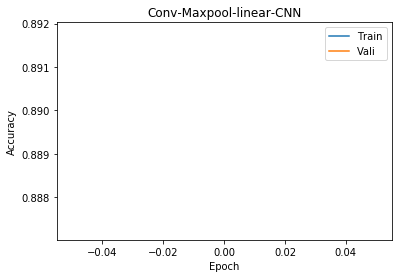

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.356
[1, 40000] loss: 0.367
Training Accu:  0.889975
Validation Accu:  0.8738
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2112 correct, tested 3000, batch size 1000
Test 3 th batch, 2800 correct, tested 4000, batch size 1000
Test 4 th batch, 3523 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4890 correct, tested 7000, batch size 1000
Test 7 th batch, 5585 correct, tested 8000, batch size 1000
Test 8 th batch, 6263 correct, tested 9000, batch size 1000
Test 9 th batch, 6953 correct, tested 10000, batch size 1000


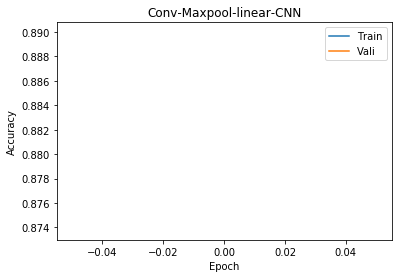

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.369
[1, 40000] loss: 0.371
Training Accu:  0.886775
Validation Accu:  0.8929
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4218 correct, tested 6000, batch size 1000
Test 6 th batch, 4897 correct, tested 7000, batch size 1000
Test 7 th batch, 5586 correct, tested 8000, batch size 1000
Test 8 th batch, 6275 correct, tested 9000, batch size 1000
Test 9 th batch, 6964 correct, tested 10000, batch size 1000


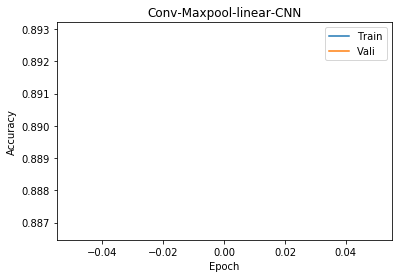

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.363
[1, 40000] loss: 0.360
Training Accu:  0.8914
Validation Accu:  0.8941
Finish Traning
Test 0 th batch, 722 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2136 correct, tested 3000, batch size 1000
Test 3 th batch, 2827 correct, tested 4000, batch size 1000
Test 4 th batch, 3546 correct, tested 5000, batch size 1000
Test 5 th batch, 4250 correct, tested 6000, batch size 1000
Test 6 th batch, 4936 correct, tested 7000, batch size 1000
Test 7 th batch, 5631 correct, tested 8000, batch size 1000
Test 8 th batch, 6325 correct, tested 9000, batch size 1000
Test 9 th batch, 7012 correct, tested 10000, batch size 1000


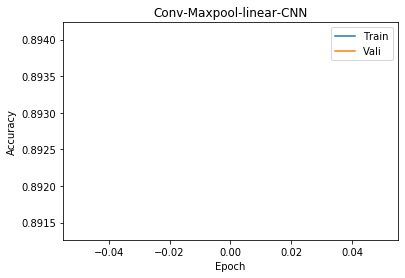

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.361
[1, 40000] loss: 0.367
Training Accu:  0.89175
Validation Accu:  0.8894
Finish Traning
Test 0 th batch, 720 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2816 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4220 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5605 correct, tested 8000, batch size 1000
Test 8 th batch, 6298 correct, tested 9000, batch size 1000
Test 9 th batch, 6988 correct, tested 10000, batch size 1000


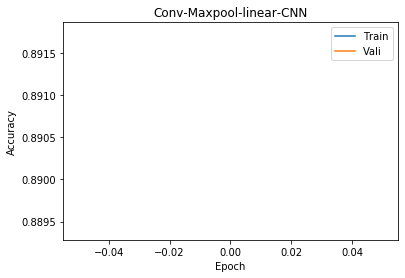

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.370
[1, 40000] loss: 0.363
Training Accu:  0.88815
Validation Accu:  0.8968
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2823 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4924 correct, tested 7000, batch size 1000
Test 7 th batch, 5623 correct, tested 8000, batch size 1000
Test 8 th batch, 6312 correct, tested 9000, batch size 1000
Test 9 th batch, 6996 correct, tested 10000, batch size 1000


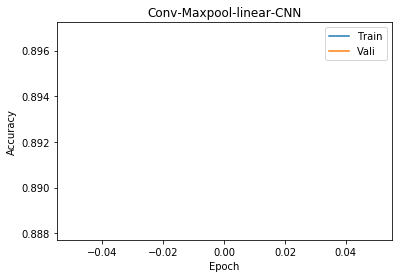

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.361
[1, 40000] loss: 0.367
Training Accu:  0.889825
Validation Accu:  0.8931
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1423 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4215 correct, tested 6000, batch size 1000
Test 6 th batch, 4896 correct, tested 7000, batch size 1000
Test 7 th batch, 5592 correct, tested 8000, batch size 1000
Test 8 th batch, 6282 correct, tested 9000, batch size 1000
Test 9 th batch, 6973 correct, tested 10000, batch size 1000


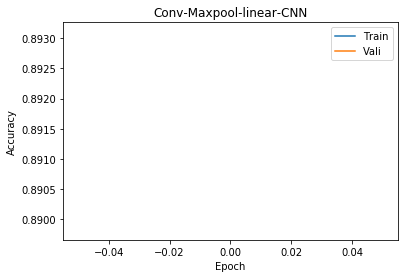

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.355
[1, 40000] loss: 0.360
Training Accu:  0.894025
Validation Accu:  0.8883
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3525 correct, tested 5000, batch size 1000
Test 5 th batch, 4213 correct, tested 6000, batch size 1000
Test 6 th batch, 4902 correct, tested 7000, batch size 1000
Test 7 th batch, 5594 correct, tested 8000, batch size 1000
Test 8 th batch, 6281 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


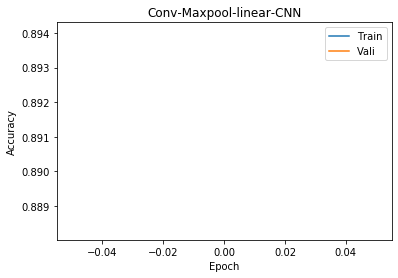

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.358
[1, 40000] loss: 0.367
Training Accu:  0.88875
Validation Accu:  0.8929
Finish Traning
Test 0 th batch, 717 correct, tested 1000, batch size 1000
Test 1 th batch, 1412 correct, tested 2000, batch size 1000
Test 2 th batch, 2116 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4923 correct, tested 7000, batch size 1000
Test 7 th batch, 5609 correct, tested 8000, batch size 1000
Test 8 th batch, 6307 correct, tested 9000, batch size 1000
Test 9 th batch, 6999 correct, tested 10000, batch size 1000


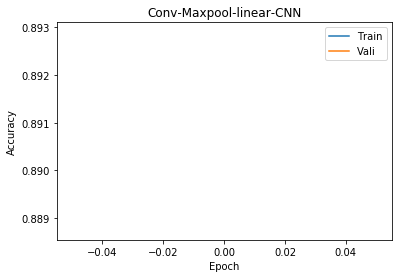

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.358
[1, 40000] loss: 0.360
Training Accu:  0.892025
Validation Accu:  0.888
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2122 correct, tested 3000, batch size 1000
Test 3 th batch, 2807 correct, tested 4000, batch size 1000
Test 4 th batch, 3517 correct, tested 5000, batch size 1000
Test 5 th batch, 4220 correct, tested 6000, batch size 1000
Test 6 th batch, 4911 correct, tested 7000, batch size 1000
Test 7 th batch, 5605 correct, tested 8000, batch size 1000
Test 8 th batch, 6298 correct, tested 9000, batch size 1000
Test 9 th batch, 6981 correct, tested 10000, batch size 1000


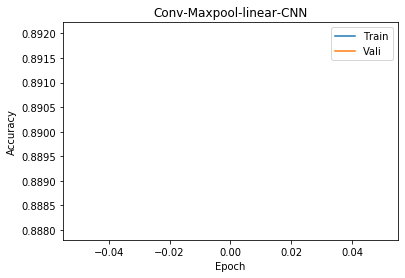

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.358
[1, 40000] loss: 0.359
Training Accu:  0.891025
Validation Accu:  0.8774
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2795 correct, tested 4000, batch size 1000
Test 4 th batch, 3518 correct, tested 5000, batch size 1000
Test 5 th batch, 4218 correct, tested 6000, batch size 1000
Test 6 th batch, 4901 correct, tested 7000, batch size 1000
Test 7 th batch, 5599 correct, tested 8000, batch size 1000
Test 8 th batch, 6284 correct, tested 9000, batch size 1000
Test 9 th batch, 6971 correct, tested 10000, batch size 1000


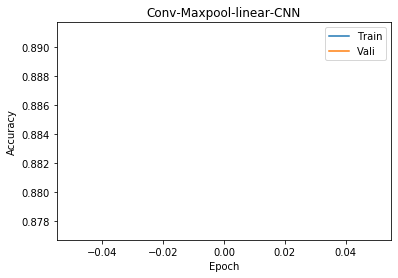

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.362
[1, 40000] loss: 0.349
Training Accu:  0.8944
Validation Accu:  0.8954
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2123 correct, tested 3000, batch size 1000
Test 3 th batch, 2813 correct, tested 4000, batch size 1000
Test 4 th batch, 3522 correct, tested 5000, batch size 1000
Test 5 th batch, 4216 correct, tested 6000, batch size 1000
Test 6 th batch, 4896 correct, tested 7000, batch size 1000
Test 7 th batch, 5583 correct, tested 8000, batch size 1000
Test 8 th batch, 6278 correct, tested 9000, batch size 1000
Test 9 th batch, 6960 correct, tested 10000, batch size 1000


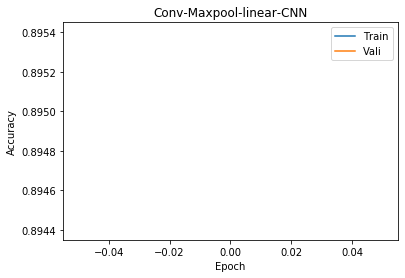

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.356
[1, 40000] loss: 0.358
Training Accu:  0.8927
Validation Accu:  0.8899
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2133 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3544 correct, tested 5000, batch size 1000
Test 5 th batch, 4233 correct, tested 6000, batch size 1000
Test 6 th batch, 4918 correct, tested 7000, batch size 1000
Test 7 th batch, 5614 correct, tested 8000, batch size 1000
Test 8 th batch, 6293 correct, tested 9000, batch size 1000
Test 9 th batch, 6974 correct, tested 10000, batch size 1000


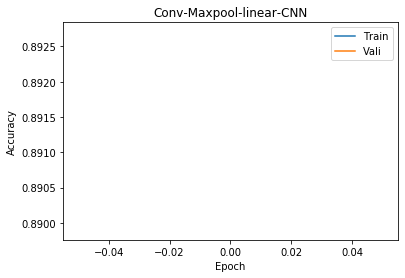

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.353
[1, 40000] loss: 0.354
Training Accu:  0.8935
Validation Accu:  0.8884
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1397 correct, tested 2000, batch size 1000
Test 2 th batch, 2105 correct, tested 3000, batch size 1000
Test 3 th batch, 2800 correct, tested 4000, batch size 1000
Test 4 th batch, 3519 correct, tested 5000, batch size 1000
Test 5 th batch, 4200 correct, tested 6000, batch size 1000
Test 6 th batch, 4880 correct, tested 7000, batch size 1000
Test 7 th batch, 5570 correct, tested 8000, batch size 1000
Test 8 th batch, 6270 correct, tested 9000, batch size 1000
Test 9 th batch, 6942 correct, tested 10000, batch size 1000


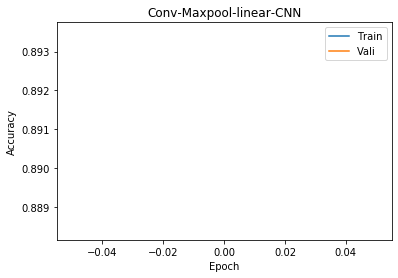

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.355
[1, 40000] loss: 0.364
Training Accu:  0.89065
Validation Accu:  0.8897
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1421 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2801 correct, tested 4000, batch size 1000
Test 4 th batch, 3515 correct, tested 5000, batch size 1000
Test 5 th batch, 4212 correct, tested 6000, batch size 1000
Test 6 th batch, 4894 correct, tested 7000, batch size 1000
Test 7 th batch, 5593 correct, tested 8000, batch size 1000
Test 8 th batch, 6282 correct, tested 9000, batch size 1000
Test 9 th batch, 6964 correct, tested 10000, batch size 1000


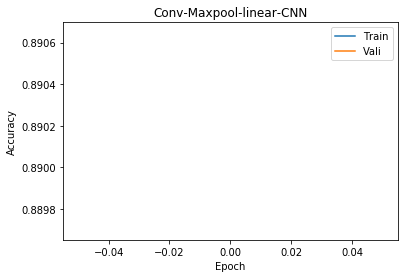

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.347
[1, 40000] loss: 0.356
Training Accu:  0.8948
Validation Accu:  0.8889
Finish Traning
Test 0 th batch, 711 correct, tested 1000, batch size 1000
Test 1 th batch, 1416 correct, tested 2000, batch size 1000
Test 2 th batch, 2125 correct, tested 3000, batch size 1000
Test 3 th batch, 2815 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4235 correct, tested 6000, batch size 1000
Test 6 th batch, 4931 correct, tested 7000, batch size 1000
Test 7 th batch, 5626 correct, tested 8000, batch size 1000
Test 8 th batch, 6320 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


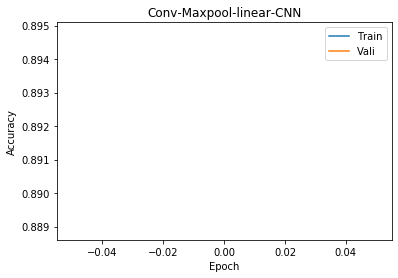

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.351
[1, 40000] loss: 0.355
Training Accu:  0.894
Validation Accu:  0.8945
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1426 correct, tested 2000, batch size 1000
Test 2 th batch, 2134 correct, tested 3000, batch size 1000
Test 3 th batch, 2822 correct, tested 4000, batch size 1000
Test 4 th batch, 3541 correct, tested 5000, batch size 1000
Test 5 th batch, 4243 correct, tested 6000, batch size 1000
Test 6 th batch, 4929 correct, tested 7000, batch size 1000
Test 7 th batch, 5622 correct, tested 8000, batch size 1000
Test 8 th batch, 6308 correct, tested 9000, batch size 1000
Test 9 th batch, 7008 correct, tested 10000, batch size 1000


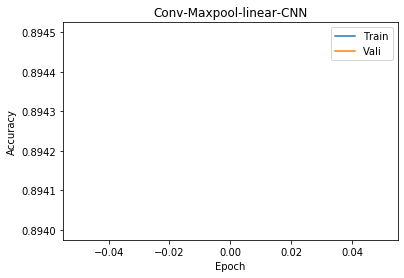

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.346
[1, 40000] loss: 0.354
Training Accu:  0.8956
Validation Accu:  0.8947
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1407 correct, tested 2000, batch size 1000
Test 2 th batch, 2111 correct, tested 3000, batch size 1000
Test 3 th batch, 2801 correct, tested 4000, batch size 1000
Test 4 th batch, 3509 correct, tested 5000, batch size 1000
Test 5 th batch, 4203 correct, tested 6000, batch size 1000
Test 6 th batch, 4879 correct, tested 7000, batch size 1000
Test 7 th batch, 5583 correct, tested 8000, batch size 1000
Test 8 th batch, 6274 correct, tested 9000, batch size 1000
Test 9 th batch, 6955 correct, tested 10000, batch size 1000


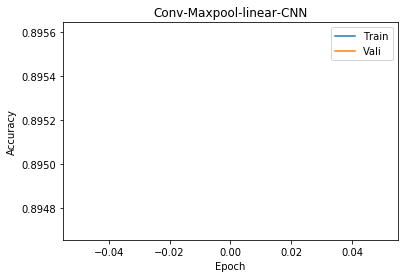

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.348
[1, 40000] loss: 0.345
Training Accu:  0.898325
Validation Accu:  0.8934
Finish Traning
Test 0 th batch, 723 correct, tested 1000, batch size 1000
Test 1 th batch, 1429 correct, tested 2000, batch size 1000
Test 2 th batch, 2131 correct, tested 3000, batch size 1000
Test 3 th batch, 2824 correct, tested 4000, batch size 1000
Test 4 th batch, 3537 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4916 correct, tested 7000, batch size 1000
Test 7 th batch, 5608 correct, tested 8000, batch size 1000
Test 8 th batch, 6305 correct, tested 9000, batch size 1000
Test 9 th batch, 6988 correct, tested 10000, batch size 1000


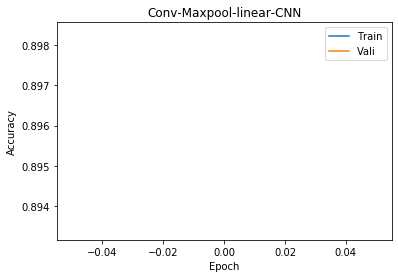

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.344
[1, 40000] loss: 0.353
Training Accu:  0.8964
Validation Accu:  0.8895
Finish Traning
Test 0 th batch, 721 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2127 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4228 correct, tested 6000, batch size 1000
Test 6 th batch, 4907 correct, tested 7000, batch size 1000
Test 7 th batch, 5596 correct, tested 8000, batch size 1000
Test 8 th batch, 6282 correct, tested 9000, batch size 1000
Test 9 th batch, 6968 correct, tested 10000, batch size 1000


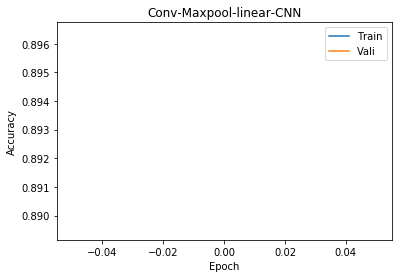

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.340
[1, 40000] loss: 0.350
Training Accu:  0.898175
Validation Accu:  0.89
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1413 correct, tested 2000, batch size 1000
Test 2 th batch, 2111 correct, tested 3000, batch size 1000
Test 3 th batch, 2797 correct, tested 4000, batch size 1000
Test 4 th batch, 3509 correct, tested 5000, batch size 1000
Test 5 th batch, 4206 correct, tested 6000, batch size 1000
Test 6 th batch, 4895 correct, tested 7000, batch size 1000
Test 7 th batch, 5588 correct, tested 8000, batch size 1000
Test 8 th batch, 6290 correct, tested 9000, batch size 1000
Test 9 th batch, 6976 correct, tested 10000, batch size 1000


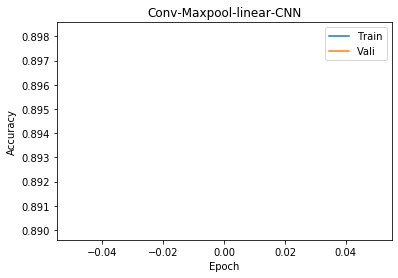

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.338
[1, 40000] loss: 0.352
Training Accu:  0.898475
Validation Accu:  0.8983
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1420 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3532 correct, tested 5000, batch size 1000
Test 5 th batch, 4236 correct, tested 6000, batch size 1000
Test 6 th batch, 4921 correct, tested 7000, batch size 1000
Test 7 th batch, 5612 correct, tested 8000, batch size 1000
Test 8 th batch, 6309 correct, tested 9000, batch size 1000
Test 9 th batch, 6997 correct, tested 10000, batch size 1000


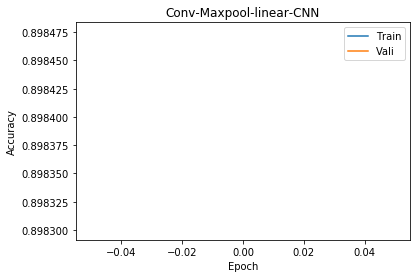

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.349
[1, 40000] loss: 0.352
Training Accu:  0.894375
Validation Accu:  0.9029
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1411 correct, tested 2000, batch size 1000
Test 2 th batch, 2110 correct, tested 3000, batch size 1000
Test 3 th batch, 2804 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4217 correct, tested 6000, batch size 1000
Test 6 th batch, 4900 correct, tested 7000, batch size 1000
Test 7 th batch, 5586 correct, tested 8000, batch size 1000
Test 8 th batch, 6274 correct, tested 9000, batch size 1000
Test 9 th batch, 6961 correct, tested 10000, batch size 1000


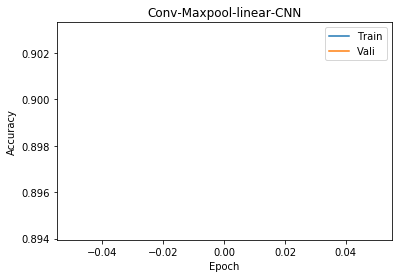

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.349
[1, 40000] loss: 0.347
Training Accu:  0.895375
Validation Accu:  0.889
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2100 correct, tested 3000, batch size 1000
Test 3 th batch, 2785 correct, tested 4000, batch size 1000
Test 4 th batch, 3494 correct, tested 5000, batch size 1000
Test 5 th batch, 4190 correct, tested 6000, batch size 1000
Test 6 th batch, 4868 correct, tested 7000, batch size 1000
Test 7 th batch, 5567 correct, tested 8000, batch size 1000
Test 8 th batch, 6260 correct, tested 9000, batch size 1000
Test 9 th batch, 6939 correct, tested 10000, batch size 1000


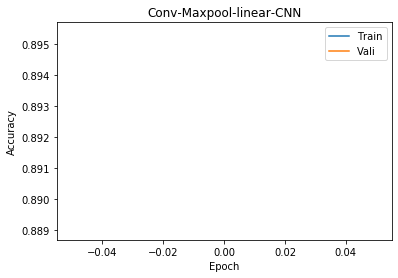

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.345
[1, 40000] loss: 0.347
Training Accu:  0.896925
Validation Accu:  0.8973
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1422 correct, tested 2000, batch size 1000
Test 2 th batch, 2129 correct, tested 3000, batch size 1000
Test 3 th batch, 2825 correct, tested 4000, batch size 1000
Test 4 th batch, 3543 correct, tested 5000, batch size 1000
Test 5 th batch, 4238 correct, tested 6000, batch size 1000
Test 6 th batch, 4925 correct, tested 7000, batch size 1000
Test 7 th batch, 5624 correct, tested 8000, batch size 1000
Test 8 th batch, 6316 correct, tested 9000, batch size 1000
Test 9 th batch, 7007 correct, tested 10000, batch size 1000


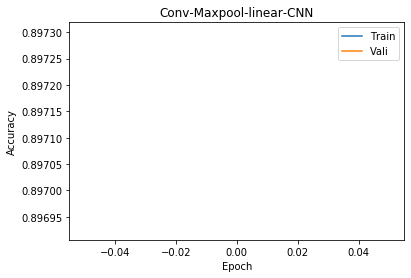

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.339
[1, 40000] loss: 0.346
Training Accu:  0.898825
Validation Accu:  0.9022
Finish Traning
Test 0 th batch, 715 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2124 correct, tested 3000, batch size 1000
Test 3 th batch, 2819 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4230 correct, tested 6000, batch size 1000
Test 6 th batch, 4908 correct, tested 7000, batch size 1000
Test 7 th batch, 5601 correct, tested 8000, batch size 1000
Test 8 th batch, 6293 correct, tested 9000, batch size 1000
Test 9 th batch, 6979 correct, tested 10000, batch size 1000


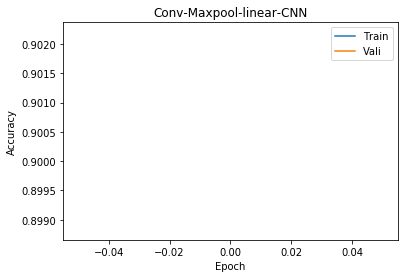

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.337
[1, 40000] loss: 0.347
Training Accu:  0.898575
Validation Accu:  0.894
Finish Traning
Test 0 th batch, 714 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2812 correct, tested 4000, batch size 1000
Test 4 th batch, 3526 correct, tested 5000, batch size 1000
Test 5 th batch, 4216 correct, tested 6000, batch size 1000
Test 6 th batch, 4907 correct, tested 7000, batch size 1000
Test 7 th batch, 5599 correct, tested 8000, batch size 1000
Test 8 th batch, 6289 correct, tested 9000, batch size 1000
Test 9 th batch, 6984 correct, tested 10000, batch size 1000


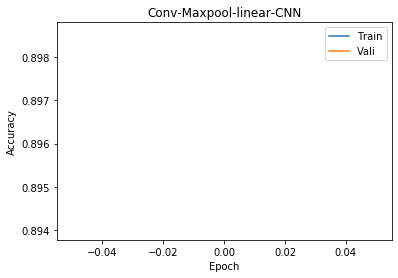

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.339
[1, 40000] loss: 0.347
Training Accu:  0.897975
Validation Accu:  0.8988
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1409 correct, tested 2000, batch size 1000
Test 2 th batch, 2119 correct, tested 3000, batch size 1000
Test 3 th batch, 2814 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4225 correct, tested 6000, batch size 1000
Test 6 th batch, 4910 correct, tested 7000, batch size 1000
Test 7 th batch, 5605 correct, tested 8000, batch size 1000
Test 8 th batch, 6303 correct, tested 9000, batch size 1000
Test 9 th batch, 6991 correct, tested 10000, batch size 1000


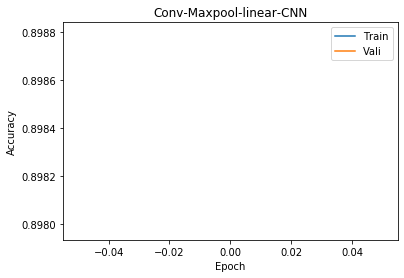

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.351
[1, 40000] loss: 0.337
Training Accu:  0.899025
Validation Accu:  0.9027
Finish Traning
Test 0 th batch, 713 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2117 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3528 correct, tested 5000, batch size 1000
Test 5 th batch, 4215 correct, tested 6000, batch size 1000
Test 6 th batch, 4898 correct, tested 7000, batch size 1000
Test 7 th batch, 5591 correct, tested 8000, batch size 1000
Test 8 th batch, 6289 correct, tested 9000, batch size 1000
Test 9 th batch, 6978 correct, tested 10000, batch size 1000


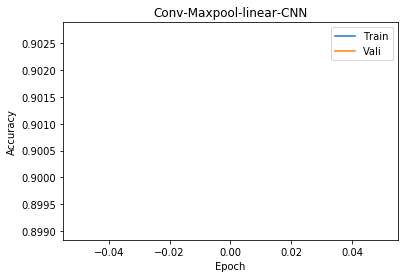

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.337
[1, 40000] loss: 0.355
Training Accu:  0.896275
Validation Accu:  0.8943
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1410 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3525 correct, tested 5000, batch size 1000
Test 5 th batch, 4218 correct, tested 6000, batch size 1000
Test 6 th batch, 4898 correct, tested 7000, batch size 1000
Test 7 th batch, 5571 correct, tested 8000, batch size 1000
Test 8 th batch, 6262 correct, tested 9000, batch size 1000
Test 9 th batch, 6943 correct, tested 10000, batch size 1000


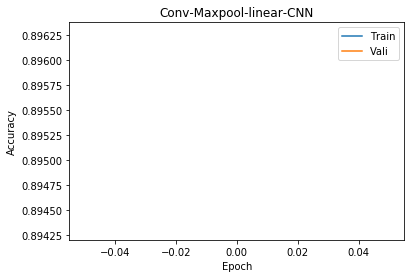

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.350
[1, 40000] loss: 0.347
Training Accu:  0.8935
Validation Accu:  0.8905
Finish Traning
Test 0 th batch, 707 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2112 correct, tested 3000, batch size 1000
Test 3 th batch, 2800 correct, tested 4000, batch size 1000
Test 4 th batch, 3519 correct, tested 5000, batch size 1000
Test 5 th batch, 4218 correct, tested 6000, batch size 1000
Test 6 th batch, 4892 correct, tested 7000, batch size 1000
Test 7 th batch, 5582 correct, tested 8000, batch size 1000
Test 8 th batch, 6273 correct, tested 9000, batch size 1000
Test 9 th batch, 6959 correct, tested 10000, batch size 1000


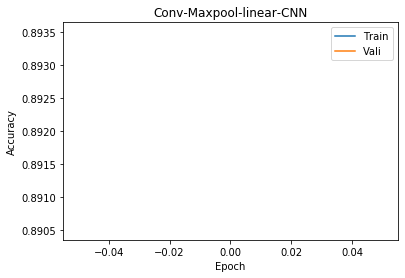

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.342
[1, 40000] loss: 0.340
Training Accu:  0.90075
Validation Accu:  0.8956
Finish Traning
Test 0 th batch, 712 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2118 correct, tested 3000, batch size 1000
Test 3 th batch, 2806 correct, tested 4000, batch size 1000
Test 4 th batch, 3522 correct, tested 5000, batch size 1000
Test 5 th batch, 4210 correct, tested 6000, batch size 1000
Test 6 th batch, 4893 correct, tested 7000, batch size 1000
Test 7 th batch, 5580 correct, tested 8000, batch size 1000
Test 8 th batch, 6270 correct, tested 9000, batch size 1000
Test 9 th batch, 6951 correct, tested 10000, batch size 1000


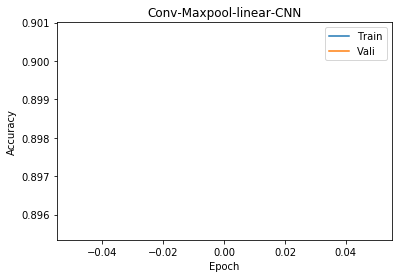

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.336
[1, 40000] loss: 0.341
Training Accu:  0.901125
Validation Accu:  0.9035
Finish Traning
Test 0 th batch, 704 correct, tested 1000, batch size 1000
Test 1 th batch, 1403 correct, tested 2000, batch size 1000
Test 2 th batch, 2102 correct, tested 3000, batch size 1000
Test 3 th batch, 2793 correct, tested 4000, batch size 1000
Test 4 th batch, 3507 correct, tested 5000, batch size 1000
Test 5 th batch, 4205 correct, tested 6000, batch size 1000
Test 6 th batch, 4888 correct, tested 7000, batch size 1000
Test 7 th batch, 5583 correct, tested 8000, batch size 1000
Test 8 th batch, 6270 correct, tested 9000, batch size 1000
Test 9 th batch, 6949 correct, tested 10000, batch size 1000


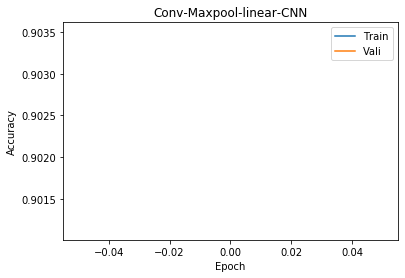

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.333
[1, 40000] loss: 0.344
Training Accu:  0.8995
Validation Accu:  0.8912
Finish Traning
Test 0 th batch, 710 correct, tested 1000, batch size 1000
Test 1 th batch, 1414 correct, tested 2000, batch size 1000
Test 2 th batch, 2108 correct, tested 3000, batch size 1000
Test 3 th batch, 2797 correct, tested 4000, batch size 1000
Test 4 th batch, 3507 correct, tested 5000, batch size 1000
Test 5 th batch, 4207 correct, tested 6000, batch size 1000
Test 6 th batch, 4899 correct, tested 7000, batch size 1000
Test 7 th batch, 5595 correct, tested 8000, batch size 1000
Test 8 th batch, 6285 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


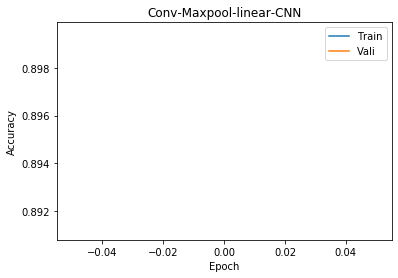

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.339
[1, 40000] loss: 0.339
Training Accu:  0.8985
Validation Accu:  0.902
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1415 correct, tested 2000, batch size 1000
Test 2 th batch, 2109 correct, tested 3000, batch size 1000
Test 3 th batch, 2797 correct, tested 4000, batch size 1000
Test 4 th batch, 3522 correct, tested 5000, batch size 1000
Test 5 th batch, 4214 correct, tested 6000, batch size 1000
Test 6 th batch, 4895 correct, tested 7000, batch size 1000
Test 7 th batch, 5599 correct, tested 8000, batch size 1000
Test 8 th batch, 6286 correct, tested 9000, batch size 1000
Test 9 th batch, 6967 correct, tested 10000, batch size 1000


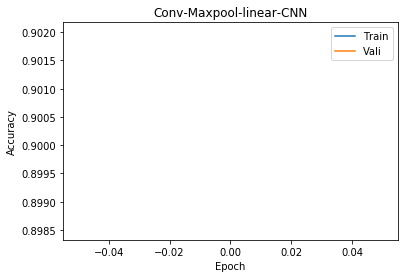

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.320
[1, 40000] loss: 0.351
Training Accu:  0.901375
Validation Accu:  0.8956
Finish Traning
Test 0 th batch, 705 correct, tested 1000, batch size 1000
Test 1 th batch, 1403 correct, tested 2000, batch size 1000
Test 2 th batch, 2115 correct, tested 3000, batch size 1000
Test 3 th batch, 2803 correct, tested 4000, batch size 1000
Test 4 th batch, 3511 correct, tested 5000, batch size 1000
Test 5 th batch, 4199 correct, tested 6000, batch size 1000
Test 6 th batch, 4882 correct, tested 7000, batch size 1000
Test 7 th batch, 5574 correct, tested 8000, batch size 1000
Test 8 th batch, 6262 correct, tested 9000, batch size 1000
Test 9 th batch, 6943 correct, tested 10000, batch size 1000


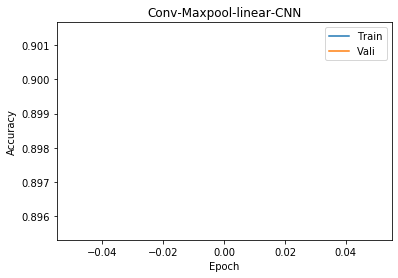

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.342
[1, 40000] loss: 0.337
Training Accu:  0.897425
Validation Accu:  0.9034
Finish Traning
Test 0 th batch, 716 correct, tested 1000, batch size 1000
Test 1 th batch, 1418 correct, tested 2000, batch size 1000
Test 2 th batch, 2121 correct, tested 3000, batch size 1000
Test 3 th batch, 2816 correct, tested 4000, batch size 1000
Test 4 th batch, 3529 correct, tested 5000, batch size 1000
Test 5 th batch, 4224 correct, tested 6000, batch size 1000
Test 6 th batch, 4911 correct, tested 7000, batch size 1000
Test 7 th batch, 5592 correct, tested 8000, batch size 1000
Test 8 th batch, 6291 correct, tested 9000, batch size 1000
Test 9 th batch, 6969 correct, tested 10000, batch size 1000


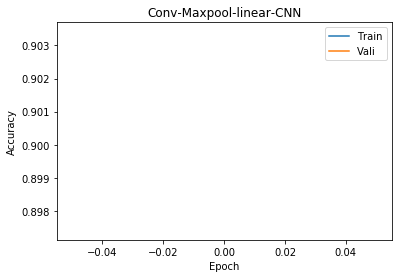

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.339
[1, 40000] loss: 0.332
Training Accu:  0.901025
Validation Accu:  0.9032
Finish Traning
Test 0 th batch, 718 correct, tested 1000, batch size 1000
Test 1 th batch, 1417 correct, tested 2000, batch size 1000
Test 2 th batch, 2120 correct, tested 3000, batch size 1000
Test 3 th batch, 2809 correct, tested 4000, batch size 1000
Test 4 th batch, 3522 correct, tested 5000, batch size 1000
Test 5 th batch, 4212 correct, tested 6000, batch size 1000
Test 6 th batch, 4904 correct, tested 7000, batch size 1000
Test 7 th batch, 5589 correct, tested 8000, batch size 1000
Test 8 th batch, 6281 correct, tested 9000, batch size 1000
Test 9 th batch, 6965 correct, tested 10000, batch size 1000


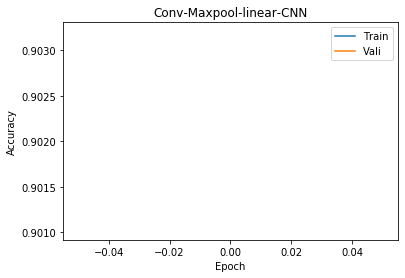

Test Accu: 0.7094
Epoch:  1
[1, 20000] loss: 0.328
[1, 40000] loss: 0.339
Training Accu:  0.90275
Validation Accu:  0.904
Finish Traning
Test 0 th batch, 708 correct, tested 1000, batch size 1000
Test 1 th batch, 1406 correct, tested 2000, batch size 1000
Test 2 th batch, 2099 correct, tested 3000, batch size 1000
Test 3 th batch, 2794 correct, tested 4000, batch size 1000
Test 4 th batch, 3507 correct, tested 5000, batch size 1000
Test 5 th batch, 4206 correct, tested 6000, batch size 1000
Test 6 th batch, 4885 correct, tested 7000, batch size 1000
Test 7 th batch, 5583 correct, tested 8000, batch size 1000
Test 8 th batch, 6261 correct, tested 9000, batch size 1000
Test 9 th batch, 6941 correct, tested 10000, batch size 1000


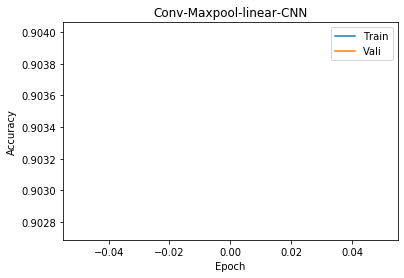

Test Accu: 0.7094
Epoch:  1


KeyboardInterrupt: 

In [19]:
accu_test_list = []
accu_test = 0
itera = 0
batch_size = 1000
trainset, trainloader, testset, testloader = load_data(batch_size = batch_size)


model = CNN(150, 5, 4)
# define optimizer
optimizer = torch.optim.SGD(model.parameters(), 
                            lr=0.005, 
                            momentum=0.9)
while accu_test<0.75:
    print("Epoch: ", itera+1)


    model, accu_vali, test_accu = train_and_vali(trainset=trainset, 
                                                 model=model, 
                                                 optimizer=optimizer, 
                                                 testloader=testloader,
                                                 epochs=1, 
                                                 batch_print_num=20, 
                                                 batch_size=batch_size, 
                                                 title="Conv-Maxpool-linear-CNN")
    accu_test_list.append(test_accu)
    if test_accu > accu_test:
        accu_test = test_accu
    print("Test Accu:", accu_test)
    itera += 1

# plot epoch vs test
plt.plot(range(itera), accu_test_list)
plt.xlabel("Epoch")
plt.ylabel("Test Accu")
plt.title("Epoch vs Vali_Accu")
plt.show()

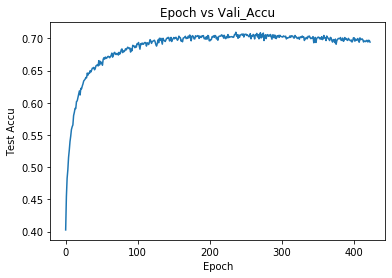

In [20]:
plt.plot(range(len(accu_test_list)), accu_test_list)
plt.xlabel("Epoch")
plt.ylabel("Test Accu")
plt.title("Epoch vs Test_Accu")
plt.show()

In [21]:
len(accu_test_list)

423